# 해당쿼리로 데이터 추출

SELECT datetime, shot_no, tool_number, current_spindle, current_x, current_z, vibration, rpm, rpm_set, feed, feed_set, load_1, servo_load_x, servo_load_z, servo_current_x, servo_current_z from TPOP_MACHINE_PARAMETER
WHERE mc_id = 22 and date between '2022-07-13' AND '2022-10-12'

- 날짜 기준 범위는 1개월 반씩 분리해서 Query 수행

# 준비

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import random
from sklearn.ensemble import IsolationForest
warnings.filterwarnings('ignore')
import joblib

In [2]:
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_row', 200)

# 함수 정의

## 일반

### 컬럼 데이터 형변환 (64bit → 32bit)
 * 데이터 용량 줄이기 위한 용도

In [3]:
#주어진 dataframe에서 데이터 타입이 64bit인 경우 32bit로 변경하여 데이터 용량 축소
def change_data_type_64bit_to_32bit(data):
    column_names = list(data.columns.values)
    
    for col in column_names:
        data_type = str(data[col].dtype)
        
        if data_type == 'int64':
            data[col] = data[col].astype('int32')
        elif data_type == 'float64':
            data[col] = data[col].astype('float32')
        #LJY_20220929 : 컬럼의 data type이 'object'인데 실제 값은 numeric인 경우 int32로 변환
        # 추후 데이터 타입 판별로 변경 필요 (numeric인지 체크하는 api에서 datetime을 걸러내지 못해서 임시로 column name으로 체크하도록 처리)
        else:
            if col != "datetime":
                data[col] = data[col].replace('\\0', 0)
                data[col] = data[col].fillna(0).astype('int32')
#                data[col] = (data[col].fillna(0).astype('int32').astype(object).where(data[col].notnull()))
#                data[col] = data[col].notnull().astype('int32')
    
    column_names.clear()
    del column_names

### tool 정보 추출
 * 'tool_number' 필드에서 공구 정보를 추출하여 별도의 컬럼으로 구성

In [4]:
# tool 번호 및 상태 생성
def extract_tool_info_from_data(data):
    if 'tool_number' not in data.columns:
        return
    
    data['tool_state'] = data['tool_number']%100
    data['tool'] = (data['tool_number'] - data['tool_state'])/100
    if data['tool'].isnull().sum() > 0:
        data = data.dropna(axis = 0)
    data['tool'] = data['tool'].astype(np.int32)

## 데이터 불러오기

### 주어진 경로의 csv 파일 목록 찾기

In [5]:
#주어진 경로의 .csv파일을 찾아서 list 형태로 반환
def find_csv_files(path):
    file_list = os.listdir(path)
    
    file_list_csv = [file_csv for file_csv in file_list if file_csv.endswith('.csv')]
    file_list_csv
    
    file_list.clear()
    del file_list
    
    return file_list_csv

### 주어진 경로의 대상 csv파일을 불러오기
 * 입력인자 중 sensor_data_only : True이면 전류 센서 데이터만 포함, False이면 Focas 데이터를 포함한 파일을 의미
 * 데이터 종류를 입력으로 하여 해당하는 데이터 타입의 .csv파일 Load
 * 데이터 타입 형변환 (64bit → 32bit, object타입의 경우 datetime 컬럼을 제외하고 int32로 변환)

In [6]:
#주어진 경로의 .csv파일을 찾아서 모두 병합한 dataframe 구성
def build_dataframe_from_cvs_files(path, sensor_data_only=True, display_report=False):
    file_list_csv = find_csv_files(path)
    
    df = pd.DataFrame()
    
    if len(file_list_csv) < 1:
        return df

    #전류 센서 & focas 데이터 포함 파일의 header부분(컬럼명 나열된 line) 정보
    all_data_columns = '"datetime","shot_no","tool_number","current_spindle","current_x","current_z","vibration","rpm","rpm_set","feed","feed_set","load_1","servo_load_x","servo_load_z","servo_current_x","servo_current_z"'
    # all_data_columns = ',datetime,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,servo_load_x,servo_load_z,servo_current_x,servo_current_z'

    
    #전류 센서데이터만 포함한 파일의 header부분(컬럼명 나열된 line) 정보
    sensor_data_only_columns = '"datetime","tool_number","shot_no","current_spindle","current_x","current_z"'
    
    for csv_idx in file_list_csv:
        first_line = ""
        
        #encoding을 utf-8-sig로 해야 파일에서 읽은 문자열의 맨 앞에 '\ufeff'가 붙는 현상을 막을 수 있음
        # - utf-8로 해서 읽으면 맨 앞에 '\ufeff'가 붙어서 위에 정의한 all_data_columns, sensor_data_only_columns와 비교 시 무조건 False 발생
        with open(csv_idx, encoding="utf-8-sig") as f:
            first_line = f.readline()
            print(first_line)
            first_line = first_line.strip('\n')
            f.close()
        
        if display_report is True:
            print(first_line)
        
        #전류 센서 & focas 데이터 포함 파일 (무의미한 column은 DB에서 조회할 때 제외하고 조회 완료)
        if first_line == all_data_columns:
            if display_report is True:
                print("file {} : all data".format(csv_idx))
                
            if sensor_data_only is True:
                continue
        #전류 센서 데이터만 포함한 파일
        elif first_line == sensor_data_only_columns:
            if display_report is True:
                print("file {} : current sensor data only".format(csv_idx))
                
            if sensor_data_only is False:
                continue
        else:
            if display_report is True:
                print("file {} : invalid data".format(csv_idx))
                
            continue
            
        csv_df = pd.read_csv(csv_idx)
            
        #데이터 타입을 64bit → 32bit로 변경하여 용량 축소
        change_data_type_64bit_to_32bit(csv_df)
    
        #print(csv_df.info())

        df = pd.concat([df, csv_df], axis = 0)
        del csv_df
    
    file_list_csv.clear()
    del file_list_csv
    
    return df

### 주어진 경로의 대상 파일을 불러오기
 * 입력인자 중 sensor_data_only : True이면 전류 센서 데이터만 포함, False이면 Focas 데이터를 포함한 파일을 의미
 * current directory에서 .parquet파일을 찾아서 불러오기 
 * .parquet파일이 없는 경우 .csv를 읽어서 통합한 후 .parquet로 저장

In [7]:
#--------------------------------------------------------------
#☆☆ Parquet(파케이)란?
#   - Apache Parquet은 쿼리 속도를 높이기 위한 최적화를 제공하는 열 형식 파일 형식이며 CSV 또는 JSON보다 훨씬 효율적인 파일 형식입니다.
#   - <참고> : https://pearlluck.tistory.com/561
#--------------------------------------------------------------
#
#
#Parquet(파케이) 파일이 있는 경우 해당 파일을 읽고, 그렇지 않은 경우 .csv 파일을 순회하면서 읽어서 merge
#pyarrow 모듈 설치해야 .parquet 파일 입출력 기능 사용 가능
# !pip install pyarrow

def read_data(sensor_data_only=True, extract_tool_info=True, display_report=False):
    df = pd.DataFrame()
    
    #전류 센서로만 구성된 데이터를 사용하려고 하는 경우
    if sensor_data_only is True:
        if os.path.isfile('./VL04_data_sensor_only.parquet'): #파일이 있는 경우
            df = pd.read_parquet('./VL04_data_sensor_only.parquet')  #.parquet 데이터 ()
    #focas 데이터까지 포함된 데이터를 사용하려고 하는 경우
    else:    
        if os.path.isfile('./VL04_data.parquet'): #파일이 있는 경우
            df = pd.read_parquet('./VL04_data.parquet')  #.parquet 데이터 ()
    
    if df.empty:
        #현재 디렉토리의 .csv파일을 모두 읽어서 하나의 dataframe으로 구성
        df = build_dataframe_from_cvs_files('./', sensor_data_only, display_report)

        df = df.reset_index(drop=True)

        #dataframe을 .pqrquet 파일로 저장하여 추후 상대적으로 적은 메모리의 파일을 빠르게 읽어서 사용 할 수 있도록 처리
        df.to_parquet('./VL04_data.parquet', compression='gzip') #압축 파일 형식(gzip, snappy, ..)을 지정하여 pqrquet 파일 저장
        
    # tool 번호 및 상태 생성
    if not df.empty and extract_tool_info:
        extract_tool_info_from_data(df)
        
    return df

## 전처리 : 유효한 shot 정보 도출
 * 'shot_no' 필드 값을 기준으로 shot 구간 찾기
 * shot 구간 내부의 공구 사용 순서 및 각 공구 별 데이터 index 구간 도출
 * 공구 사용 순서에서 유효한 공구 사용 패턴 구간 찾기
 * 유효한 공구 사용 패턴 구간에 대해 numbering하여 별도의 'real_shot' 필드에 값 설정 (디폴트 : -1) 

### dataframe에 사용된 공구 순서 도출

In [8]:
#dataframe에 사용된 공구를 순서대로 추출해서 list형태로 반환
def extract_tool_list(data, report_result=False):
    import itertools

    tool_list = []
    #print([(k, (g)) for k, g in itertools.groupby(df_shot_specific['tool'])])
    for k, g in itertools.groupby(data['tool']):
        tool_list.append(k)

    if report_result is True:
        print(tool_list)
    
    return tool_list

In [9]:
#dataframe에 사용된 공구를 순서대로 추출해서 list형태로 반환
def extract_tool_list_with_range(data, report_result=False):
    import itertools

    irow = 0
    tool_list = []
    range_list_of_tool = []
    
    #print([(k, (g)) for k, g in itertools.groupby(df_shot_specific['tool'])])
    for k, g in itertools.groupby(data['tool']):
        tool_list.append(k)
        nrow = len(list(g))
        range_list_of_tool.append((irow,irow+nrow-1))
        irow += nrow

    if report_result is True:
        print(tool_list)
        print(range_list_of_tool)
    
    return tool_list, range_list_of_tool

In [10]:
#dataframe에서 (1) 주어진 shot_no에 해당하는 데이터를 추출한 후, (2) 해당 데이터에 사용된 공구를 순서대로 가져와서 반환
def extract_tool_list_of_specific_shot(data, shot_no, report_result=False):
    df_shot = data[data['shot_no'] == shot_no]
    
    if report_result is True:
        print("===== shot{} ============================\n\n(1) dataframe -----------------\n".format(shot_no))
        print(df_shot)
        print("(2) used tool -----------------\n")
        print(df_shot['tool'].unique())
        print("(3) extract order using tools -----------------\n")
    
    tool_list = extract_tool_list(df_shot, report_result)
    
    del df_shot
    
    return tool_list

In [11]:
#dataframe에서 전체 shot에 대해 아래의 과정 수행
#   - 각 shot 별로 사용된 공구 순서를 추출
#   - shot & 공구 사용 순서정보를 column으로 하는 dataframe을 구성한 후 반환
def extract_tool_list_of_all_shots(data, report_result=False):
    column_names = ['shot_no', 'order_using_tool']
    df_by_shot = pd.DataFrame(columns=column_names)
    row = 0

    for shot in df['shot_no'].unique():
        tool_list = extract_tool_list_of_specific_shot(df, shot, report_result)
        str_tool_list = ' '.join(map(str, tool_list))
        df_by_shot.loc[row] = [shot, str_tool_list]
        
        del tool_list
        
        row += 1

    print(df_by_shot)
    
    return df_by_shot

### 유효 shot 구간 도출
 * 정상 공구 사용 패턴을 가지는 구간을 하나의 유효 shot으로 판별하고 별도의 column('real_shot')에 해당 numbering

In [12]:
def find_sub_list(sl,l):
    results=[]
    sll=len(sl)
    for ind in (i for i,e in enumerate(l) if e==sl[0]):
        if l[ind:ind+sll]==sl:
            results.append((ind,ind+sll-1))

    return results

In [13]:
#dataframe에서 (1) 주어진 shot_no에 해당하는 데이터를 추출한 후
#(2) 해당 데이터에 사용된 공구 순서 및 각 공구 별 row index 범위를 순서대로 가져옴
#(3) 정상 패턴 가공이 이루어지는 구간을 도출 (유효한 shot으로 판단할 수 있는 구간)
#(4) (3)에서 찾은 구간 데이터의 'real_shot' 컬럼에 새로 shot numbering
def find_and_mark_valid_shot_of_specific_shot(data, shot_no, real_shot_no, report_result=False):
    df_shot = data[data['shot_no'] == shot_no]
    
    if report_result is True:
        print("===== shot{} ============================\n\n(1) dataframe -----------------\n".format(shot_no))
        print(df_shot)
        print("(2) used tool -----------------\n")
        print(df_shot['tool'].unique())
        print("(3) extract order using tools -----------------\n")
    
    tool_list, range_list_of_tool = extract_tool_list_with_range(df_shot, report_result=False)

    tool_pattern = [1, 5, 9, 11, 7, 3, 11, 7]
    sub_list = find_sub_list(tool_pattern, tool_list)
    
    if len(sub_list) < 1:
        if report_result is True:
            print("shot_no {} of raw data : invalid_shot".format(shot_no))

        return 0
    
    if report_result is True:
        print(sub_list)
    
    start_index = df_shot.index[0]
    count = 0
    
    if report_result is True: 
        if sub_list[0][0] > 0:
            print("------ invalid data\n")
            print(data.iloc[start_index: start_index+range_list_of_tool[sub_list[0][0]][0]])

    for sub in sub_list:
        real_shot_no += 1
        sub_start = start_index + range_list_of_tool[sub[0]][0]
        sub_end   = start_index + range_list_of_tool[sub[1]][1]
        print("sub({}:{}) - real_shot_no {}".format(sub_start, sub_end, real_shot_no))
        
        #========================================================================
        #LJY_20220926 : iloc 함수를 사용하여 구간 access 후 값 설정 시 pandas ver.1.3.5 이후로(1.4.0부터) 동작하지 않던 오류 수정
        #------------------------------------------------------------
        #오류 : 기존에 작성된 코드
        #data.iloc[sub_start:sub_end]['real_shot'] = real_shot_no
        
        #------------------------------------------------------------
        #방법1 : column을 특정한 후 row index range 지정하여 값 설정
        data.real_shot.iloc[sub_start:sub_end] = real_shot_no
        
        #------------------------------------------------------------
        #방법2 : row index range와 column index를 지정하여 값 설정
        # print('real_shot_no : ',real_shot_no)
        # data.iloc[sub_start:sub_end+1, data.columns.get_loc('real_shot')] = real_shot_no
        #========================================================================
        
        if report_result is True:
            print("------ valid shot[{}]\n".format(count))
            print(data.iloc[sub_start:sub_end+1])
            
        count += 1
    
    tool_list.clear()
    range_list_of_tool.clear()
    sub_list.clear()
    
    del df_shot
    
    return count

In [14]:
#dataframe에서 유효한 공구 사용 패턴을 가지는 구간을 찾아서 별도의 컬럼('real_shot')에 새로 number 부여
# - 유효하지 않은 구간의 경우 'real_shot' 값을 -1로 설정
def find_and_mark_valid_shot(data, report_result=False):
    real_shot_no = 0
    
    data['real_shot'] = -1
    
    for shot in data['shot_no'].unique():
        real_shot_no += find_and_mark_valid_shot_of_specific_shot(data, shot, real_shot_no, report_result)
        print(real_shot_no)

### 유효 shot 구간 내의 시작 부위의 유휴시간 데이터 삭제
 * 정상 공구 사용 패턴을 가지는 구간을 하나의 유효 shot으로 판별하고 별도의 column('real_shot')에 해당 numbering

In [15]:
#dataframe의 시작 부위의 idle section에 대한 'real_shot' 정보 초기화(값: -1)
# => 실제 가공이 이루어진 유효한 구간을 찾아냄
def remove_idle_section_at_the_start_of_valid_shot(data):
    #print(data)
    
    #스핀들 전류값이 0보다 크면 가공이 이루어진 구간으로 판단하여 아무 처리하지 않고 return
    if data.iloc[0]['current_spindle'] > 0:
        return
    
    last_index_of_idle_section = data[data['current_spindle'] > 0].index[0]-1
    
    print("index : {}~{}\n".format(data.index[0], last_index_of_idle_section))
    #print(data.loc[data.index[0]:last_index_of_idle_section])
    data.loc[data.index[0]:last_index_of_idle_section, 'real_shot'] = -1 #idle 구간의 valid shot 정보 초기화
    #print(data.loc[data.index[0]:last_index_of_idle_section])
    return

In [16]:
#dataframe의 유효한 shot 구간('real_shot' != -1인 구간) 별로 시작 부위의 idle section에 대한 'real_shot' 정보 초기화(값: -1)
# => 실제 가공이 이루어진 유효한 구간을 찾아냄
def remove_idle_sections_at_the_start_of_valid_shots(data):
    for shot in data['real_shot'].unique():
        if shot < 0:
            continue
            
#        df_by_shot = data[data['real_shot'] == shot]
        
#        if df_by_shot.iloc[0]['shot_no'] == 6517:
#            print(df_by_shot)
            
#        print(df_by_shot)
        index = data[data['real_shot'] == shot].index
    
        remove_idle_section_at_the_start_of_valid_shot(data.loc[index[0]:index[0]+len(index)-1])
        
        print(data.loc[index[0]:index[0]+len(index)-1])

    return

## 시각화

In [17]:
#dataframe에서 컬럼을 다중선택하여 데이터를 차트로 가시화
#① data : dataframe 입력
#② column_names : list 형태의 column명을 입력   ex) ['col1'], ['col1', 'col2'] 
#③ dataframe에서 특정 범위만을 선택해서 차트를 가시화 하려면 index_min 또는 index_max를 지정
#   .. index_min : 디폴트값(-1)인 경우에는 데이터의 시작 row부터 포함됨
#   ..  index_max : 디폴트값(-1)인 경우에는 데이터의 끝 row까지 포함됨
#④ 차트 제목 표시 관련 설정
#   .. title : 차트의 제목 문자열
#   .. title_font_size : 차트의 제목을 표시할 font size
#⑤ 차트 크기 설정
#   .. figsize_horz, figsize_vert : 차트의 가로, 세로 크기
#⑥ 범례 표시 관련 설정
#   .. legend_font_size : 범례를 표시할 font size
#   .. legend_location : 범례 표시 위치 ("upper right", "lower right", "upper left", "lower left")
#⑦ 그래프 표현 관련 설정 : 선 or marker 표시
#   .. linestyle : 선 스타일의 이름을 "solid", "dashed", "dotted", "dashdot"와 같은 형식으로 입력하거나 아래를 참고하여 입력
'''
'-'  solid line style
'--' line style
'-.' dash-dot line style
':'  dotted line style
'.'  point marker
','  pixel marker
'o'  circle marker
'v'  triangle_down marker
'^'  triangle_up marker
'<'  triangle_left marker
'>'  triangle_right marker
'1'  tri_down marker
'2'  tri_up marker
'3'  tri_left marker
'4'  tri_right marker
's'  square marker
'p'  pentagon marker
'*'  star marker
'h'  hexagon1 marker
'H'  hexagon2 marker
'+'  plus marker
'x'  x marker
'D'  diamond marker
'd'  thin_diamond marker
'|'  vline marker
'_'  hline marker
'''
#  .. marker : 아래를 참고하여 입력 ( https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html)
'''
'.'  point marker
','  pixel marker
'o'  circle marker
'v'  triangle_down marker
'^'  triangle_up marker
'<'  triangle_left marker
'>'  triangle_right marker
'1'  tri_down marker
'2'  tri_up marker
'3'  tri_left marker
'4'  tri_right marker
'8'  octagon marker
's'  square marker
'p'  pentagon marker
'P'  plus (filled) marker
'*'  star marker
'h'  hexagon1 marker
'H'  hexagon2 marker
'+'  plus marker
'x'  x marker
'X'  x (filled) marker
'D'  diamond marker
'd'  thin_diamond marker
'|'  vline marker
'_'  hline marker
'''
def show_plot(data, column_names, index_min = -1, index_max = -1, title = None, title_font_size=20,
              x_axis_title = None, y_axis_title = None, axes_title_font_size=18, tick_label_font_size=15,
              figsize_horz=20, figsize_vert=10, legend_font_size=15, legend_location="upper right",
              linestyle = 'none', marker='.', marker_size=10):
    
    parameters = { 'figure.titlesize':title_font_size, 'axes.titlesize': axes_title_font_size,
                  'axes.labelsize' : tick_label_font_size, 'legend.fontsize' : legend_font_size }
    plt.rcParams.update(parameters)
    
    plt.figure(figsize = (figsize_horz, figsize_vert))
    
    str_col_names = '{}'.format(','.join(column_names))#(f"'{col}'" for col in column_name))
    print(str_col_names)
    
    if index_min > -1 and index_max > -1 and index_min < index_max:
        for column in list(column_names):
            plt.plot(data.index[index_min:index_max], data.iloc[index_min:index_max][column], marker=marker, linestyle=linestyle, markersize=marker_size)
    elif index_min > -1:
        for column in list(column_names):
            plt.plot(data.index[index_min:], data.iloc[index_min:][column], marker=marker, linestyle=linestyle, markersize=marker_size)
    elif index_max > -1:
        for column in list(column_names):
            plt.plot(data.index[:index_max], data.iloc[:index_max][column], marker=marker, linestyle=linestyles, markersize=marker_size)
    else:
        #str_col_names = ','.join('{0}'.format(col) for col in column_name)
        for column in list(column_names):
            plt.plot(data.index, data[column], marker=marker, linestyle=linestyle, markersize=marker_size)
    
    if title is not None:
        plt.title(title)

    plt.legend(column_names, loc = legend_location)
    plt.xticks(fontsize = tick_label_font_size)
    plt.yticks(fontsize = tick_label_font_size)
    
    if x_axis_title is not None:
        plt.xlabel(x_axis_title)
    if y_axis_title is not None:
        plt.ylabel(y_axis_title)


In [18]:
#dataframe에서 컬럼을 다중선택하여 데이터를 차트로 가시화
#① data : dataframe 입력
#② target_column_name : 값을 관찰할 컬럼
#③ condition_column : 조건 판별 대상 컬럼명  ex) 'state'
#④ condition_values : 일치 여부 대상 value 목록  ex) [1], [0, 1]
#⑤ dataframe에서 특정 범위만을 선택해서 차트를 가시화 하려면 index_min 또는 index_max를 지정
#   .. index_min : 디폴트값(-1)인 경우에는 데이터의 시작 row부터 포함됨
#   ..  index_max : 디폴트값(-1)인 경우에는 데이터의 끝 row까지 포함됨
#⑥ 차트 제목 표시 관련 설정
#   .. title : 차트의 제목 문자열
#   .. title_font_size : 차트의 제목을 표시할 font size
#⑦ 차트 크기 설정
#   .. figsize_horz, figsize_vert : 차트의 가로, 세로 크기
#⑧ 범례 표시 관련 설정
#   .. legend_font_size : 범례를 표시할 font size
#   .. legend_location : 범례 표시 위치 ("upper right", "lower right", "upper left", "lower left")
#⑨ 그래프 표현 관련 설정 : 선 or marker 표시
#   .. linestyle : 선 스타일의 이름을 "solid", "dashed", "dotted", "dashdot"와 같은 형식으로 입력하거나 아래를 참고하여 입력
'''
'-'  solid line style
'--' line style
'-.' dash-dot line style
':'  dotted line style
'.'  point marker
','  pixel marker
'o'  circle marker
'v'  triangle_down marker
'^'  triangle_up marker
'<'  triangle_left marker
'>'  triangle_right marker
'1'  tri_down marker
'2'  tri_up marker
'3'  tri_left marker
'4'  tri_right marker
's'  square marker
'p'  pentagon marker
'*'  star marker
'h'  hexagon1 marker
'H'  hexagon2 marker
'+'  plus marker
'x'  x marker
'D'  diamond marker
'd'  thin_diamond marker
'|'  vline marker
'_'  hline marker
'''
#  .. marker : 아래를 참고하여 입력 ( https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html)
'''
'.'  point marker
','  pixel marker
'o'  circle marker
'v'  triangle_down marker
'^'  triangle_up marker
'<'  triangle_left marker
'>'  triangle_right marker
'1'  tri_down marker
'2'  tri_up marker
'3'  tri_left marker
'4'  tri_right marker
'8'  octagon marker
's'  square marker
'p'  pentagon marker
'P'  plus (filled) marker
'*'  star marker
'h'  hexagon1 marker
'H'  hexagon2 marker
'+'  plus marker
'x'  x marker
'X'  x (filled) marker
'D'  diamond marker
'd'  thin_diamond marker
'|'  vline marker
'_'  hline marker
'''
def show_plot_comparing_data_by_condition(data, target_column_name, condition_column, condition_values, data_names = ('condition is true','condition is false'),
                                           index_min = -1, index_max = -1, title = None, title_font_size=20,
                                           x_axis_title = None, y_axis_title = None, axes_title_font_size=18,
                                           tick_label_font_size=15, figsize_horz=20, figsize_vert=10,
                                           legend_font_size=15, legend_location="lower right", linestyle = 'none',
                                           marker='.', marker_size=10):
    
    parameters = { 'figure.titlesize':title_font_size, 'axes.titlesize': axes_title_font_size,
                  'axes.labelsize' : tick_label_font_size, 'legend.fontsize' : legend_font_size }
    plt.rcParams.update(parameters)
    
    plt.figure(figsize = (figsize_horz, figsize_vert))
    
    condition_true_data = pd.DataFrame()
    condition_false_data = pd.DataFrame()
      
    if index_min > -1 and index_max > -1 and index_min < index_max:
        condition_true_data = data.iloc[index_min:index_max].query(data[condition_column].isin(condition_values))
        condition_false_data = data.iloc[index_min:index_max].query(~data[condition_column].isin(condition_values))
    elif index_min > -1:
        condition_true_data = data.iloc[index_min:].query(data[condition_column].isin(condition_values))
        condition_false_data = data.iloc[index_min:].query(~data[condition_column].isin(condition_values))        
    elif index_max > -1:
        condition_true_data = data.iloc[:index_max].query(data[condition_column].isin(condition_values))
        condition_false_data = data.iloc[:index_max].query(~data[condition_column].isin(condition_values))        
    else:
        condition_true_data = data[data[condition_column].isin(condition_values)]
        condition_false_data = data[~data[condition_column].isin(condition_values)]
        
    plt.plot(condition_true_data.index, condition_true_data[target_column_name], marker=marker, linestyle=linestyle, label=data_names[0], color='red', markersize=marker_size)
    plt.plot(condition_false_data.index, condition_false_data[target_column_name], marker=marker, linestyle=linestyle, label=data_names[1], markersize=marker_size)
    
    if title is not None:
        plt.title(title)

    plt.legend(data_names, loc = legend_location)
    plt.xticks(fontsize = tick_label_font_size)
    plt.yticks(fontsize = tick_label_font_size)
    
    if x_axis_title is not None:
        plt.xlabel(x_axis_title, fontsize = axes_title_font_size)
    if y_axis_title is not None:
        plt.ylabel(y_axis_title, fontsize = axes_title_font_size)

## 모델 수립

### 유효한 shot을 기준으로 주어진 공구에 대한 주어진 field의 대푯값을 계산하여 dataframe 구성

In [ ]:
def delete_outliers(data, column):
    Q1 = np.percentile(data[column], 25)
    Q3 = np.percentile(data[column], 75)
    IQR = Q3 - Q1

    outlier_step = 1.5 * IQR
    
    print('Q1 = {}, Q3 = {}, IQR = {}, outlier_step = {}, range = ({}. {})'.format(Q1, Q3, IQR, outlier_step, Q1-outlier_step, Q3+outlier_step))

    outlier_index = data[(data[column] < Q1) | (data[column] > Q3 + outlier_step)].index
        
    print(outlier_index)
    
    data.drop(outlier_index, inplace=True)

In [19]:
# 유효한 shot을 기준으로 주어진 공구에 대한 주어진 field의 대푯값을 계산하여  dataframe으로 구성
def build_representative_data_for_tool_machining(data, tool_no, apply_robust_scaler=False, except_min_value=False, except_max_value=False, delete_outlier=False,
                                                 delete_zero_value=False, except_tool_cancel_state=False, except_tool_end_state=False, *target_column_name):
    for target_idx in target_column_name:
        if target_idx not in data.columns:
            print("{} is not in columns\nPlease input valid column name".format(target_idx))
            return
    
    target_column_name = list(target_column_name)
    condition = (data['tool']==tool_no) & (data['real_shot'] != -1)
    
    #LJY_20221005 : tool취소 상태 데이터 제거 옵션 추가
    if except_tool_cancel_state is True:
        condition = condition & (data['tool_state'] != 0)
        
    if except_tool_end_state is True:
        condition = condition & (data['tool_state'] != 9)
        
    #data_tool = data[(data['tool']==tool_no) & (data['real_shot'] != -1)]
    data_tool = data[condition]
    
    if delete_zero_value is True:
        for column_idx in target_column_name:
            data_tool.drop(data_tool[data_tool[column_idx] == 0].index, inplace=True)
        
    if delete_outlier is True:
        print('before deleting outliers : {}'.format(len(data_tool.index)))
        delete_outliers(data_tool, target_column_name)
        print('after deleting outliers : {}'.format(len(data_tool.index)))
    
    if except_min_value is True:
        min_value = data_tool[target_column_name].min()
        data_tool.drop(data_tool[data_tool[target_column_name] == min_value].index, inplace=True)
        
    if except_max_value is True:
        max_value = data_tool[target_column_name].max()
        data_tool.drop(data_tool[data_tool[target_column_name] == max_value].index, inplace=True)
    
    if apply_robust_scaler is True:
        from sklearn import metrics
        #from sklearn.preprocessing import MinMaxScaler
        #from sklearn.preprocessing import StandardScaler
        from sklearn.preprocessing import RobustScaler
        
        rs = RobustScaler()
        #ms = MinMaxScaler()
        data_tool[[target_column_name]] = rs.fit_transform(data_tool[[target_column_name]])
    
    #real shot no.
#    data_shot_no = data_tool['real_shot'].to_frame(name='real_shot')
    group_by_shot = data_tool.groupby(['real_shot'])
    #print(group_by_shot.groups.keys())
    
    #표준편차
    data_std = (group_by_shot.std()[target_column_name].to_frame(name='std'))
    #표준오차
    data_sem = (group_by_shot.sem()[target_column_name].to_frame(name='sem'))
    #합
    data_sum = (group_by_shot.sum()[target_column_name].to_frame(name='sum'))
    #평균
    data_mean = (group_by_shot.mean()[target_column_name].to_frame(name='mean'))
    #중앙값
    data_median = (group_by_shot.median()[target_column_name].to_frame(name='median'))
    #분산
    data_var = (group_by_shot.var()[target_column_name].to_frame(name='var'))
    #최대값
    data_max = (group_by_shot.max()[target_column_name].to_frame(name='max')) 
    #0.25분위수
    data_quantile_1_per_4 = (group_by_shot.quantile(0.25)[target_column_name].to_frame(name='quantile(0.25)')) 
    #0.75분위수
    data_quantile_3_per_4 = (group_by_shot.quantile(0.75)[target_column_name].to_frame(name='quantile(0.75)')) 
    #왜도
    data_skew = (group_by_shot.skew()[target_column_name].to_frame(name='skew')) 

    data_representative = pd.concat([data_mean, data_std, data_median, data_max, data_var, data_sem, data_sum, data_quantile_1_per_4, data_quantile_3_per_4, data_skew],axis=1)
    
    data_representative.set_index(pd.Series(group_by_shot.groups.keys()))
    
    return data_representative

### 주어진 공구의 주어진 필드에 대한 valid shot 별 대푯값 도출 & 시각화

In [20]:
#representative_value_types : 'std', 'sem', 'sum', 'mean', 'median', 'var', 'max', 'quantile(0.25)', 'quantile(0.75)', 'skew'를 리스트 형태로 입력
#  ex) ['std', 'mean']
def build_and_display_representative_data_for_tool_machining(data, tool_no, target_column_name, representative_value_types, apply_robust_scaler=False, except_min_value=False, except_max_value=False):
    df_representative = build_representative_data_for_tool_machining(data, tool_no, target_column_name, apply_robust_scaler, except_min_value, except_max_value)
    show_plot(df_representative, representative_value_types, title = target_column_name, x_axis_title='real shot no.', y_axis_title='representatives')

### 주어진 필드에 대해 Isolation Forest 기법을 적용하여 이상치 탐지

In [21]:
# he offsetis defined in such a way we obtain the expected number of outliers (samples with decision function < 0) in training.
def check_and_mark_outlier_by_IsolationForest_org(training_data, test_data, target_column_name, training_or_test = True):
    import pickle
    from sklearn.ensemble import IsolationForest
    import joblib
    # 학습 모델    
    if training_or_test == True:
        IF = IsolationForest(random_state = 42, contamination = 0.004 , n_estimators = 500, max_samples = 90, n_jobs = -1, bootstrap = True).fit(training_data[[target_column_name]])
        score = IF.decision_function(training_data[[target_column_name]])
        training_data['IF_Outliers'] = pd.Series(IF.predict(training_data[[target_column_name]]), index = training_data.index).apply(lambda x: 1 if x == -1 else 0)
        training_data['IF_score'] = score
        joblib.dump(IF, os.path.join(os.getcwd(), 'IF_training_model.pkl'))
        # training_data['score_sample'] = IF.score_samples(training_data[[target_column_name]])
        # training_data['offset'] = training_data['IF_score'] - training_data['score_sample']
#         training_data.loc[(training_data['IF_Outliers'] == 1) & (training_data['IF_score'] < 0)]['IF_Outliers'] = 0
#         training_data.loc[(training_data['IF_Outliers'] == 0) & (training_data['IF_score'] > 0)]['IF_Outliers'] = 1 
    else:
        try:
            joblib.load(os.path.join(os.getcwd(), 'IF_training_model.pkl'))
        except FileNotFoundError:
            print('IF_training_model File does not exist.')
            print('This need a learning model.')
            print('Please training model establishment first.')
        else:
            training_model = joblib.load(os.path.join(os.getcwd(), 'IF_training_model.pkl'))
            score = training_model.score_samples(test_data[[target_column_name]])
            test_data['IF_Outliers'] = pd.Series(training_model.predict(test_data[[target_column_name]]), index = test_data.index).apply(lambda x: 1 if x == -1 else 0)
            test_data['IF_score'] = score
            # test_data['score_sample'] = IF.score_samples(test_data[[target_column_name]])
            # test_data['offset'] = test_data['IF_score'] - test_data['score_sample'] # offset = decision_function - sample_score
    #         test_data.loc[(test_data['IF_Outliers'] == 1) & (test_data['IF_score'] > -0.006), ['IF_Outliers']] = 0 
    #         test_data.loc[(test_data['IF_Outliers'] == 0) & (test_data['IF_score'] < -0), ['IF_Outliers']] = 1 

In [22]:
# def check_and_mark_outlier_by_IsolationForest_test(test_data, target_column_name):
#     # applying test set    
#     score = check_and_mark_outlier_by_IsolationForest_org.decision_function(test_data[[target_column_name]])
#     data['IF_Outliers'] = pd.Series(check_and_mark_outlier_by_IsolationForest_org.predict(test_data[[target_column_name]])).apply(lambda x: 1 if x == -1 else 0)
#     data['IF_score'] = score
    
#     # data.loc[(data['IF_Outliers'] == 1) & (data['IF_score'] > 0), ['IF_Outliers']] = 0 #LJY_20221005 : 'IF_score' 값이 0보다 큰 경우는 '이상'으로 판별하지 않도록 처리 시도
#     # data.loc[(data['IF_Outliers'] == 0) & (data['IF_score'] < 0), ['IF_Outliers']] = 1 #LJY_20221006 : 'IF_score' 값이 0보다 작은 경우는 '정상'으로 판별하지 않도록 처리 시도

In [23]:
#dataframe에서 컬럼을 다중선택하여 데이터를 차트로 가시화
#① data : dataframe 입력
#② target_column_name : 값을 관찰할 컬럼
#③ condition_column : 조건 판별 대상 컬럼명  ex) 'state'
#④ condition_values : 일치 여부 대상 value 목록  ex) [1], [0, 1]
#⑤ dataframe에서 특정 범위만을 선택해서 차트를 가시화 하려면 index_min 또는 index_max를 지정
#   .. index_min : 디폴트값(-1)인 경우에는 데이터의 시작 row부터 포함됨
#   ..  index_max : 디폴트값(-1)인 경우에는 데이터의 끝 row까지 포함됨
#⑥ 차트 제목 표시 관련 설정
#   .. title : 차트의 제목 문자열
#   .. title_font_size : 차트의 제목을 표시할 font size
#⑦ 차트 크기 설정
#   .. figsize_horz, figsize_vert : 차트의 가로, 세로 크기
#⑧ 범례 표시 관련 설정
#   .. legend_font_size : 범례를 표시할 font size
#   .. legend_location : 범례 표시 위치 ("upper right", "lower right", "upper left", "lower left")
#⑨ 그래프 표현 관련 설정 : 선 or marker 표시
#   .. linestyle : 선 스타일의 이름을 "solid", "dashed", "dotted", "dashdot"와 같은 형식으로 입력하거나 아래를 참고하여 입력
'''
'-'  solid line style
'--' line style
'-.' dash-dot line style
':'  dotted line style
'.'  point marker
','  pixel marker
'o'  circle marker
'v'  triangle_down marker
'^'  triangle_up marker
'<'  triangle_left marker
'>'  triangle_right marker
'1'  tri_down marker
'2'  tri_up marker
'3'  tri_left marker
'4'  tri_right marker
's'  square marker
'p'  pentagon marker
'*'  star marker
'h'  hexagon1 marker
'H'  hexagon2 marker
'+'  plus marker
'x'  x marker
'D'  diamond marker
'd'  thin_diamond marker
'|'  vline marker
'_'  hline marker
'''
#  .. marker : 아래를 참고하여 입력 ( https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html)
'''
'.'  point marker
','  pixel marker
'o'  circle marker
'v'  triangle_down marker
'^'  triangle_up marker
'<'  triangle_left marker
'>'  triangle_right marker
'1'  tri_down marker
'2'  tri_up marker
'3'  tri_left marker
'4'  tri_right marker
'8'  octagon marker
's'  square marker
'p'  pentagon marker
'P'  plus (filled) marker
'*'  star marker
'h'  hexagon1 marker
'H'  hexagon2 marker
'+'  plus marker
'x'  x marker
'X'  x (filled) marker
'D'  diamond marker
'd'  thin_diamond marker
'|'  vline marker
'_'  hline marker
'''
def show_plot_comparing_data_by_condition(data, target_column_name, condition_column, condition_values, data_names = ('condition is true','condition is false'),
                                           index_min = -1, index_max = -1, title = None, title_font_size=20,
                                           x_axis_title = None, y_axis_title = None, axes_title_font_size=18,
                                           tick_label_font_size=15, figsize_horz=20, figsize_vert=10,
                                           legend_font_size=15, legend_location="lower right", linestyle = 'none',
                                           marker='.', marker_size=10):
    
    parameters = { 'figure.titlesize':title_font_size, 'axes.titlesize': axes_title_font_size,
                  'axes.labelsize' : tick_label_font_size, 'legend.fontsize' : legend_font_size }
    plt.rcParams.update(parameters)
    
    plt.figure(figsize = (figsize_horz, figsize_vert))
    
    condition_true_data = pd.DataFrame()
    condition_false_data = pd.DataFrame()
      
    if index_min > -1 and index_max > -1 and index_min < index_max:
        condition_true_data = data.iloc[index_min:index_max].query(data[condition_column].isin(condition_values))
        condition_false_data = data.iloc[index_min:index_max].query(~data[condition_column].isin(condition_values))
    elif index_min > -1:
        condition_true_data = data.iloc[index_min:].query(data[condition_column].isin(condition_values))
        condition_false_data = data.iloc[index_min:].query(~data[condition_column].isin(condition_values))        
    elif index_max > -1:
        condition_true_data = data.iloc[:index_max].query(data[condition_column].isin(condition_values))
        condition_false_data = data.iloc[:index_max].query(~data[condition_column].isin(condition_values))        
    else:
        condition_true_data = data[data[condition_column].isin(condition_values)]
        condition_false_data = data[~data[condition_column].isin(condition_values)]
        
    plt.plot(condition_true_data.index, condition_true_data[target_column_name], marker=marker, linestyle=linestyle, label=data_names[0], color='red', markersize=marker_size)
    plt.plot(condition_false_data.index, condition_false_data[target_column_name], marker=marker, linestyle=linestyle, label=data_names[1], markersize=marker_size)
    plt.xticks(fontsize = tick_label_font_size)
    plt.yticks(fontsize = tick_label_font_size)
    
    if title is not None:
        plt.title(title)

    plt.legend(data_names, loc = legend_location)
    
    if x_axis_title is not None:
        plt.xlabel(x_axis_title, fontsize = 15)
    if y_axis_title is not None:
        plt.ylabel(y_axis_title, fontsize = 15)

# Anomaly score 기반 threshould 도출

In [24]:
def threshould_deduction(data, target_column_name, graph = True):
    # True일 경우 training_data
    # False일 경우 data
    import matplotlib.pyplot as plt
    try:
        joblib.load(os.path.join(os.getcwd(), 'IF_training_model.pkl'))
    except FileNotFoundError:
        print('IF_training_model File does not exist.')
        print('This need a learning model.')
        print('Please training model establishment first.')
    else:
        input_data = data[target_column_name].values.reshape(-1,1)
        training_model = joblib.load(os.path.join(os.getcwd(), 'IF_training_model.pkl'))
        input_data_anomaly_score = training_model.decision_function(input_data)
        input_data_outlier = training_model.predict(input_data)
        temp_input = np.concatenate((input_data.reshape(-1,1), input_data_outlier.reshape(-1,1)), axis = 1)
        result = pd.DataFrame(temp_input, columns = [target_column_name, 'outlier'])
        if graph == True:
            plt.figure(figsize = (20,12))
            plt.scatter(input_data, input_data_anomaly_score, label = 'anomaly score')
            plt.fill_between(input_data.T[0], np.min(input_data_anomaly_score), np.max(input_data_anomaly_score), where=input_data_outlier==-1, color='r', 
                             alpha=.3, label='outlier region')
            plt.axvline(min(result.query('outlier == -1')[target_column_name]),  color = 'g', linestyle = 'dashed')
            plt.text(min(result.query('outlier == -1')[target_column_name]), np.min(input_data_anomaly_score)-0.1, 'Threshold {:.4f}'.format(min(result.query('outlier == -1')[target_column_name])), color = 'r', fontsize = 12, rotation = 90)
            plt.legend()
            plt.ylabel('anomaly score', fontsize = 15)
            plt.yticks(fontsize = 13)
            plt.xlabel(target_column_name, fontsize = 15)
            plt.xticks(fontsize = 13)
        return min(result.query('outlier == -1')[target_column_name])

# Threshould를 적용한 시각화 적용

In [25]:
def show_plot_with_threshould(data, target_column_name, condition_column, condition_values, data_names = ('condition is true','condition is false'),
                                           index_min = -1, index_max = -1, title = None, title_font_size=20,
                                           x_axis_title = None, y_axis_title = None, axes_title_font_size=18,
                                           tick_label_font_size=15, figsize_horz=20, figsize_vert=10,
                                           legend_font_size=15, legend_location="lower right", linestyle = 'none',
                                           marker='.', marker_size=10):
    
    try:
        joblib.load(os.path.join(os.getcwd(), 'IF_training_model.pkl'))
    except FileNotFoundError:
        print('IF_training_model File does not exist.')
        print('This need a learning model.')
        print('Please training model establishment first.')
    else:
        parameters = { 'figure.titlesize':title_font_size, 'axes.titlesize': axes_title_font_size,
                      'axes.labelsize' : tick_label_font_size, 'legend.fontsize' : legend_font_size }
        plt.rcParams.update(parameters)

        plt.figure(figsize = (figsize_horz, figsize_vert))

        input_data = data[target_column_name].values.reshape(-1,1)
        training_model = joblib.load(os.path.join(os.getcwd(), 'IF_training_model.pkl'))
        input_data_anomaly_score = training_model.decision_function(input_data)
        input_data_outlier = training_model.predict(input_data)
        temp_input = np.concatenate((input_data.reshape(-1,1), input_data_outlier.reshape(-1,1)), axis = 1)

        condition_true_data = pd.DataFrame()
        condition_false_data = pd.DataFrame()

        if index_min > -1 and index_max > -1 and index_min < index_max:
            condition_true_data = data.iloc[index_min:index_max].query(data[condition_column].isin(condition_values))
            condition_false_data = data.iloc[index_min:index_max].query(~data[condition_column].isin(condition_values))
        elif index_min > -1:
            condition_true_data = data.iloc[index_min:].query(data[condition_column].isin(condition_values))
            condition_false_data = data.iloc[index_min:].query(~data[condition_column].isin(condition_values))        
        elif index_max > -1:
            condition_true_data = data.iloc[:index_max].query(data[condition_column].isin(condition_values))
            condition_false_data = data.iloc[:index_max].query(~data[condition_column].isin(condition_values))        
        else:
            condition_true_data = data[data[condition_column].isin(condition_values)]
            condition_false_data = data[~data[condition_column].isin(condition_values)]

        plt.plot(condition_true_data.index, condition_true_data[target_column_name], marker=marker, linestyle=linestyle, label=data_names[0], color='red', markersize=marker_size)
        plt.plot(condition_false_data.index, condition_false_data[target_column_name], marker=marker, linestyle=linestyle, label=data_names[1], markersize=marker_size)
        plt.axhline(threshould_deduction(data, target_column_name, graph = False), color = 'r', linestyle = 'dashed')
        plt.text(-290, threshould_deduction(data, target_column_name, graph = False)-15, 'Threshold {:.4f}'.format(min(pd.DataFrame(temp_input, columns = [target_column_name, 'outlier']).query('outlier == -1')[target_column_name])), color = 'r', fontsize = 12)

        if title is not None:
            plt.title(title)

        plt.legend(data_names, loc = legend_location)
        plt.xticks(fontsize = 15)
        plt.yticks(fontsize = 15)

        if x_axis_title is not None:
            plt.xlabel(x_axis_title, fontsize = 15)
        if y_axis_title is not None:
            plt.ylabel(y_axis_title, fontsize = 15)

# 데이터 불러오기

In [26]:
os.listdir()

['.ipynb_checkpoints',
 'Current_spindle_preprocessing_anormaly_detection.ipynb',
 'Daeshin_parameter_220713_0831_VL04_raw_data.csv',
 'Daeshin_parameter_220901_1013_VL04_raw_data.csv',
 'Daeshin_parameter_221014_1017_VL04_raw_data.csv',
 'IF_training_model.pkl',
 'VL04_data.parquet']

In [27]:
#데이터 불러오기
df = read_data(sensor_data_only = False)

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38310666 entries, 0 to 38310665
Data columns (total 18 columns):
 #   Column           Dtype  
---  ------           -----  
 0   datetime         object 
 1   shot_no          float64
 2   tool_number      float64
 3   current_spindle  int32  
 4   current_x        float64
 5   current_z        float64
 6   vibration        int32  
 7   rpm              float64
 8   rpm_set          float64
 9   feed             float64
 10  feed_set         float64
 11  load_1           float32
 12  servo_load_x     float32
 13  servo_load_z     float32
 14  servo_current_x  float32
 15  servo_current_z  float32
 16  tool_state       float64
 17  tool             float64
dtypes: float32(5), float64(10), int32(2), object(1)
memory usage: 4.1+ GB


In [29]:
# df1 = pd.read_csv('Daeshin_parameter_220713_0831_VL04_raw_data.csv')
# df2 = pd.read_csv('Daeshin_parameter_220901_1013_VL04_raw_data.csv')
# df_con = pd.concat([df1, df2], axis = 0)
# df_con.info()

In [30]:
max(df.groupby('shot_no').mean()['current_spindle'])

2159.1371862813717

In [31]:
# max(df_con.groupby('shot_no').mean()['current_spindle'])

In [32]:
df.tail()

,datetime,shot_no,tool_number,current_spindle,current_x,current_z,vibration,rpm,rpm_set,feed,feed_set,load_1,servo_load_x,servo_load_z,servo_current_x,servo_current_z,tool_state,tool
38310661,2022-10-13 23:59:59.044015,7524.0,707.0,128,0.0,2.0,63,0.0,0.0,10800.0,0.0,2.0,4.0,70.0,4.0,-70.0,7.0,7.0
38310662,2022-10-13 23:59:59.261416,7524.0,300.0,128,0.0,2.0,64,1.0,0.0,7200.0,0.0,35.0,4.0,70.0,4.0,-70.0,0.0,3.0
38310663,2022-10-13 23:59:59.453132,7524.0,300.0,440,0.0,2.0,64,2.0,0.0,0.0,0.0,10.0,4.0,70.0,4.0,-70.0,0.0,3.0
38310664,2022-10-13 23:59:59.649925,7524.0,300.0,440,0.0,2.0,64,0.0,0.0,0.0,0.0,2.0,4.0,70.0,4.0,-70.0,0.0,3.0
38310665,2022-10-13 23:59:59.850518,7524.0,300.0,440,0.0,2.0,64,0.0,0.0,0.0,0.0,2.0,4.0,70.0,4.0,-70.0,0.0,3.0


In [33]:
df['shot_no'].unique()

array([5824., 5825., 5826., ..., 7522., 7523., 7524.])

In [34]:
df_mod1 = df.drop(['current_x', 'current_z', 'rpm', 'rpm_set','feed', 'load_1', 'servo_load_x', 'servo_load_z', 'servo_current_x', 'servo_current_z'], axis = 1)
df_mod1

,datetime,shot_no,tool_number,current_spindle,vibration,feed_set,tool_state,tool
0,2022-07-13 00:00:00.032772,5824.0,909.0,2018,207,0.0,9.0,9.0
1,2022-07-13 00:00:00.238221,5824.0,909.0,2018,204,0.0,9.0,9.0
2,2022-07-13 00:00:00.431812,5824.0,909.0,2018,205,0.0,9.0,9.0
3,2022-07-13 00:00:00.632125,5824.0,909.0,2017,207,0.0,9.0,9.0
4,2022-07-13 00:00:00.842293,5824.0,909.0,2017,204,0.0,9.0,9.0
...,...,...,...,...,...,...,...,...
38310661,2022-10-13 23:59:59.044015,7524.0,707.0,128,63,0.0,7.0,7.0
38310662,2022-10-13 23:59:59.261416,7524.0,300.0,128,64,0.0,0.0,3.0
38310663,2022-10-13 23:59:59.453132,7524.0,300.0,440,64,0.0,0.0,3.0
38310664,2022-10-13 23:59:59.649925,7524.0,300.0,440,64,0.0,0.0,3.0


# 전처리

## 유효 shot 도출

In [35]:
#'tool_number' 필드 값이 -1인 결측 데이터 구간 drop
df_mod1 = df_mod1.drop(df_mod1[df_mod1['tool_number'] == -1].index)
df_mod1

,datetime,shot_no,tool_number,current_spindle,vibration,feed_set,tool_state,tool
0,2022-07-13 00:00:00.032772,5824.0,909.0,2018,207,0.0,9.0,9.0
1,2022-07-13 00:00:00.238221,5824.0,909.0,2018,204,0.0,9.0,9.0
2,2022-07-13 00:00:00.431812,5824.0,909.0,2018,205,0.0,9.0,9.0
3,2022-07-13 00:00:00.632125,5824.0,909.0,2017,207,0.0,9.0,9.0
4,2022-07-13 00:00:00.842293,5824.0,909.0,2017,204,0.0,9.0,9.0
...,...,...,...,...,...,...,...,...
38310661,2022-10-13 23:59:59.044015,7524.0,707.0,128,63,0.0,7.0,7.0
38310662,2022-10-13 23:59:59.261416,7524.0,300.0,128,64,0.0,0.0,3.0
38310663,2022-10-13 23:59:59.453132,7524.0,300.0,440,64,0.0,0.0,3.0
38310664,2022-10-13 23:59:59.649925,7524.0,300.0,440,64,0.0,0.0,3.0


In [36]:
# tool_number 정보에서 공구 번호만 도출된 tool 컬럼 생성
extract_tool_info_from_data(df_mod1)
df_mod1

,datetime,shot_no,tool_number,current_spindle,vibration,feed_set,tool_state,tool
0,2022-07-13 00:00:00.032772,5824.0,909.0,2018,207,0.0,9.0,9.0
1,2022-07-13 00:00:00.238221,5824.0,909.0,2018,204,0.0,9.0,9.0
2,2022-07-13 00:00:00.431812,5824.0,909.0,2018,205,0.0,9.0,9.0
3,2022-07-13 00:00:00.632125,5824.0,909.0,2017,207,0.0,9.0,9.0
4,2022-07-13 00:00:00.842293,5824.0,909.0,2017,204,0.0,9.0,9.0
...,...,...,...,...,...,...,...,...
38310661,2022-10-13 23:59:59.044015,7524.0,707.0,128,63,0.0,7.0,7.0
38310662,2022-10-13 23:59:59.261416,7524.0,300.0,128,64,0.0,0.0,3.0
38310663,2022-10-13 23:59:59.453132,7524.0,300.0,440,64,0.0,0.0,3.0
38310664,2022-10-13 23:59:59.649925,7524.0,300.0,440,64,0.0,0.0,3.0


In [37]:
df_mod1['shot_no'].unique()[0]

5824.0

In [38]:
find_and_mark_valid_shot(df_mod1, report_result = True)
df_mod1

===== shot5824.0 ============================

(1) dataframe -----------------

                        datetime  shot_no  tool_number  current_spindle  \
0     2022-07-13 00:00:00.032772   5824.0        909.0             2018   
1     2022-07-13 00:00:00.238221   5824.0        909.0             2018   
2     2022-07-13 00:00:00.431812   5824.0        909.0             2018   
3     2022-07-13 00:00:00.632125   5824.0        909.0             2017   
4     2022-07-13 00:00:00.842293   5824.0        909.0             2017   
...                          ...      ...          ...              ...   
5688  2022-07-13 00:18:58.252391   5824.0        707.0             7222   
5689  2022-07-13 00:18:58.458173   5824.0        707.0             7222   
5690  2022-07-13 00:18:58.658090   5824.0        707.0             7222   
5691  2022-07-13 00:18:58.851792   5824.0        707.0             2612   
5692  2022-07-13 00:18:59.058084   5824.0        707.0             2612   

      vibration  fe

                         datetime  shot_no  tool_number  current_spindle  \
32591  2022-07-13 01:48:43.604809   5827.0        100.0                0   
32592  2022-07-13 01:48:43.806012   5827.0        100.0                0   
32593  2022-07-13 01:48:44.007007   5827.0        100.0                0   
32594  2022-07-13 01:48:44.206688   5827.0        100.0                0   
32595  2022-07-13 01:48:44.407063   5827.0        100.0                0   
...                           ...      ...          ...              ...   
44293  2022-07-13 02:27:46.369118   5827.0        707.0             7127   
44294  2022-07-13 02:27:46.569330   5827.0        707.0             7127   
44295  2022-07-13 02:27:46.780769   5827.0        707.0             2811   
44296  2022-07-13 02:27:46.983935   5827.0        707.0             2811   
44297  2022-07-13 02:27:47.169008   5827.0        707.0             2811   

       vibration  feed_set  tool_state  tool  real_shot  
32591        200       0.0   

[12759 rows x 9 columns]
5
===== shot5831.0 ============================

(1) dataframe -----------------

                          datetime  shot_no  tool_number  current_spindle  \
137615  2022-07-13 07:39:08.030030   5831.0        707.0             4019   
137616  2022-07-13 07:39:08.229339   5831.0        707.0             4019   
137617  2022-07-13 07:39:08.430375   5831.0        707.0              362   
137618  2022-07-13 07:39:08.630563   5831.0        707.0              362   
137619  2022-07-13 07:39:08.835073   5831.0        707.0               17   
...                            ...      ...          ...              ...   
383158  2022-07-13 20:58:36.294514   5831.0        707.0             3066   
383159  2022-07-13 20:58:36.495298   5831.0        707.0             7451   
383160  2022-07-13 20:58:36.694029   5831.0        707.0             7451   
383161  2022-07-13 20:58:36.895226   5831.0        707.0             7451   
383162  2022-07-13 20:58:37.102454   5831.0   

[12834 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                          datetime  shot_no  tool_number  current_spindle  \
395821  2022-07-13 21:40:53.737523   5833.0        707.0             1086   
395822  2022-07-13 21:40:53.923636   5833.0        707.0             1086   
395823  2022-07-13 21:40:54.123759   5833.0        707.0             1086   
395824  2022-07-13 21:40:54.337567   5833.0        707.0             1086   
395825  2022-07-13 21:40:54.523814   5833.0        707.0               19   
...                            ...      ...          ...              ...   
396954  2022-07-13 21:44:40.631128   5833.0        707.0                0   
396955  2022-07-13 21:44:40.832852   5833.0        707.0                0   
396956  2022-07-13 21:44:41.058234   5833.0        707.0                0   
396957  2022-07-13 21:44:41.255362   5833.0        707.0           

                          datetime  shot_no  tool_number  current_spindle  \
438004  2022-07-14 00:01:43.997851   5836.0        707.0             1332   
438005  2022-07-14 00:01:44.199420   5836.0        707.0             1332   
438006  2022-07-14 00:01:44.398182   5836.0        707.0               64   
438007  2022-07-14 00:01:44.600082   5836.0        707.0               64   
438008  2022-07-14 00:01:44.799410   5836.0        707.0               64   
...                            ...      ...          ...              ...   
450638  2022-07-14 00:43:58.508690   5836.0        707.0             5129   
450639  2022-07-14 00:43:58.719399   5836.0        707.0             5129   
450640  2022-07-14 00:43:58.913261   5836.0        707.0             5129   
450641  2022-07-14 00:43:59.112768   5836.0        707.0             5544   
450642  2022-07-14 00:43:59.308994   5836.0        707.0             5544   

        vibration  feed_set  tool_state  tool  real_shot  
438004         8

[12884 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                          datetime  shot_no  tool_number  current_spindle  \
475811  2022-07-14 02:08:12.801806   5839.0        707.0             6304   
475812  2022-07-14 02:08:12.980790   5839.0        707.0              625   
475813  2022-07-14 02:08:13.207640   5839.0        707.0              625   
475814  2022-07-14 02:08:13.390868   5839.0        707.0              625   
475815  2022-07-14 02:08:13.584997   5839.0        707.0               25   
...                            ...      ...          ...              ...   
477028  2022-07-14 02:12:16.525872   5839.0        707.0                0   
477029  2022-07-14 02:12:16.713841   5839.0        707.0                0   
477030  2022-07-14 02:12:16.933841   5839.0        707.0                0   
477031  2022-07-14 02:12:17.119568   5839.0        707.0           

                          datetime  shot_no  tool_number  current_spindle  \
556007  2022-07-14 06:36:18.768110   5842.0        707.0             5552   
556008  2022-07-14 06:36:18.948944   5842.0        707.0              266   
556009  2022-07-14 06:36:19.150870   5842.0        707.0              266   
556010  2022-07-14 06:36:19.368052   5842.0        707.0              266   
556011  2022-07-14 06:36:19.546387   5842.0        707.0                7   
...                            ...      ...          ...              ...   
575281  2022-07-14 07:40:39.358121   5842.0        707.0             7771   
575282  2022-07-14 07:40:39.552806   5842.0        707.0             7771   
575283  2022-07-14 07:40:39.757752   5842.0        707.0             7771   
575284  2022-07-14 07:40:39.998184   5842.0        707.0             5165   
575285  2022-07-14 07:40:40.174898   5842.0        707.0             5165   

        vibration  feed_set  tool_state  tool  real_shot  
556007         8


                          datetime  shot_no  tool_number  current_spindle  \
608059  2022-07-14 09:30:17.776735   5844.0        100.0                0   
608060  2022-07-14 09:30:18.004967   5844.0        100.0                0   
608061  2022-07-14 09:30:18.176415   5844.0        100.0                0   
608062  2022-07-14 09:30:18.370655   5844.0        100.0                0   
608063  2022-07-14 09:30:18.582550   5844.0        100.0                0   
...                            ...      ...          ...              ...   
620791  2022-07-14 10:12:52.386621   5844.0        707.0             7301   
620792  2022-07-14 10:12:52.620316   5844.0        707.0             7301   
620793  2022-07-14 10:12:52.808881   5844.0        707.0             7301   
620794  2022-07-14 10:12:52.991693   5844.0        707.0             4223   
620795  2022-07-14 10:12:53.203194   5844.0        707.0             4223   

        vibration  feed_set  tool_state  tool  real_shot  
608059         

                          datetime  shot_no  tool_number  current_spindle  \
647534  2022-07-14 11:42:24.385317   5847.0        100.0                0   
647535  2022-07-14 11:42:24.579610   5847.0        100.0                0   
647536  2022-07-14 11:42:24.768723   5847.0        100.0                0   
647537  2022-07-14 11:42:24.997232   5847.0        100.0                0   
647538  2022-07-14 11:42:25.170068   5847.0        100.0                0   
...                            ...      ...          ...              ...   
660285  2022-07-14 12:24:58.444007   5847.0        707.0             5170   
660286  2022-07-14 12:24:58.628646   5847.0        707.0             5170   
660287  2022-07-14 12:24:58.830027   5847.0        707.0             5474   
660288  2022-07-14 12:24:59.049067   5847.0        707.0             5474   
660289  2022-07-14 12:24:59.239031   5847.0        707.0             1031   

        vibration  feed_set  tool_state  tool  real_shot  
647534         8

                          datetime  shot_no  tool_number  current_spindle  \
698131  2022-07-14 14:31:22.487377   5850.0        100.0                0   
698132  2022-07-14 14:31:22.699022   5850.0        100.0                0   
698133  2022-07-14 14:31:22.899137   5850.0        100.0                0   
698134  2022-07-14 14:31:23.093267   5850.0        100.0                0   
698135  2022-07-14 14:31:23.293293   5850.0        100.0                0   
...                            ...      ...          ...              ...   
710867  2022-07-14 15:13:56.481507   5850.0        707.0             5064   
710868  2022-07-14 15:13:56.670790   5850.0        707.0             5064   
710869  2022-07-14 15:13:56.893525   5850.0        707.0             6880   
710870  2022-07-14 15:13:57.087703   5850.0        707.0             6880   
710871  2022-07-14 15:13:57.271082   5850.0        707.0             6880   

        vibration  feed_set  tool_state  tool  real_shot  
698131         9


                          datetime  shot_no  tool_number  current_spindle  \
737594  2022-07-14 16:43:27.150591   5853.0        100.0                0   
737595  2022-07-14 16:43:27.349307   5853.0        100.0                0   
737596  2022-07-14 16:43:27.548419   5853.0        100.0                0   
737597  2022-07-14 16:43:27.758400   5853.0        100.0                0   
737598  2022-07-14 16:43:27.948860   5853.0        100.0                0   
...                            ...      ...          ...              ...   
750349  2022-07-14 17:26:01.706287   5853.0        707.0             5218   
750350  2022-07-14 17:26:01.890666   5853.0        707.0             6804   
750351  2022-07-14 17:26:02.095281   5853.0        707.0             6804   
750352  2022-07-14 17:26:02.306791   5853.0        707.0             6804   
750353  2022-07-14 17:26:02.512804   5853.0        707.0             1003   

        vibration  feed_set  tool_state  tool  real_shot  
737594         

                          datetime  shot_no  tool_number  current_spindle  \
811822  2022-07-14 20:51:18.874300   5856.0        100.0                0   
811823  2022-07-14 20:51:19.104581   5856.0        100.0                0   
811824  2022-07-14 20:51:19.282184   5856.0        100.0                0   
811825  2022-07-14 20:51:19.477301   5856.0        100.0                0   
811826  2022-07-14 20:51:19.676099   5856.0        100.0                0   
...                            ...      ...          ...              ...   
823476  2022-07-14 21:30:21.950062   5856.0        707.0             7695   
823477  2022-07-14 21:30:22.133841   5856.0        707.0             7695   
823478  2022-07-14 21:30:22.334969   5856.0        707.0             7695   
823479  2022-07-14 21:30:22.540138   5856.0        707.0             4146   
823480  2022-07-14 21:30:22.759086   5856.0        707.0             4146   

        vibration  feed_set  tool_state  tool  real_shot  
811822         8

[12752 rows x 9 columns]
35
===== shot5860.0 ============================

(1) dataframe -----------------

                          datetime  shot_no  tool_number  current_spindle  \
862386  2022-07-14 23:40:27.843744   5860.0        707.0             5560   
862387  2022-07-14 23:40:28.045919   5860.0        707.0              387   
862388  2022-07-14 23:40:28.245931   5860.0        707.0              387   
862389  2022-07-14 23:40:28.428817   5860.0        707.0              387   
862390  2022-07-14 23:40:28.640201   5860.0        707.0               21   
...                            ...      ...          ...              ...   
875206  2022-07-15 00:23:15.676445   5860.0        707.0             7536   
875207  2022-07-15 00:23:15.875371   5860.0        707.0             7536   
875208  2022-07-15 00:23:16.087418   5860.0        707.0             7536   
875209  2022-07-15 00:23:16.276351   5860.0        707.0             4114   
875210  2022-07-15 00:23:16.484273   5860.0  

                          datetime  shot_no  tool_number  current_spindle  \
889686  2022-07-15 01:11:43.974936   5862.0        100.0                0   
889687  2022-07-15 01:11:44.186205   5862.0        100.0                0   
889688  2022-07-15 01:11:44.368259   5862.0        100.0                0   
889689  2022-07-15 01:11:44.580199   5862.0        100.0                0   
889690  2022-07-15 01:11:44.768937   5862.0        100.0                0   
...                            ...      ...          ...              ...   
901360  2022-07-15 01:50:47.694760   5862.0        707.0             7216   
901361  2022-07-15 01:50:47.883307   5862.0        707.0             7216   
901362  2022-07-15 01:50:48.068064   5862.0        707.0             7216   
901363  2022-07-15 01:50:48.283322   5862.0        707.0             4263   
901364  2022-07-15 01:50:48.477445   5862.0        707.0             4263   

        vibration  feed_set  tool_state  tool  real_shot  
889686         8

[21947 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                          datetime  shot_no  tool_number  current_spindle  \
985955  2022-07-15 06:33:24.910147   5865.0        707.0             1383   
985956  2022-07-15 06:33:25.103978   5865.0        707.0             1383   
985957  2022-07-15 06:33:25.287306   5865.0        707.0               28   
985958  2022-07-15 06:33:25.498836   5865.0        707.0               28   
985959  2022-07-15 06:33:25.687959   5865.0        707.0               28   
...                            ...      ...          ...              ...   
995144  2022-07-15 07:04:05.175443   5865.0        707.0                0   
995145  2022-07-15 07:04:05.380066   5865.0        707.0                0   
995146  2022-07-15 07:04:05.589975   5865.0        707.0                0   
995147  2022-07-15 07:04:05.777436   5865.0        707.0           

===== shot5868.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
1038437  2022-07-15 09:28:37.825126   5868.0        707.0             1895   
1038438  2022-07-15 09:28:38.027039   5868.0        707.0             1895   
1038439  2022-07-15 09:28:38.244199   5868.0        707.0               93   
1038440  2022-07-15 09:28:38.422671   5868.0        707.0               93   
1038441  2022-07-15 09:28:38.630553   5868.0        707.0               93   
...                             ...      ...          ...              ...   
1051579  2022-07-15 10:12:30.714837   5868.0        707.0             6343   
1051580  2022-07-15 10:12:30.925282   5868.0        707.0             6343   
1051581  2022-07-15 10:12:31.113475   5868.0        707.0             6347   
1051582  2022-07-15 10:12:31.305626   5868.0        707.0             6347   
1051583  2022-07-15 10:12:31.519133   5868.0        707.0     

                           datetime  shot_no  tool_number  current_spindle  \
1077895  2022-07-15 11:40:28.289624   5871.0        707.0             3682   
1077896  2022-07-15 11:40:28.488355   5871.0        707.0             3682   
1077897  2022-07-15 11:40:28.687623   5871.0        707.0              117   
1077898  2022-07-15 11:40:28.887057   5871.0        707.0              117   
1077899  2022-07-15 11:40:29.088354   5871.0        707.0              117   
...                             ...      ...          ...              ...   
1091088  2022-07-15 12:24:31.382886   5871.0        707.0             3585   
1091089  2022-07-15 12:24:31.548655   5871.0        707.0             3585   
1091090  2022-07-15 12:24:31.752720   5871.0        707.0             6492   
1091091  2022-07-15 12:24:31.949073   5871.0        707.0             6492   
1091092  2022-07-15 12:24:32.155600   5871.0        707.0             6492   

         vibration  feed_set  tool_state  tool  real_shot  
107

[13170 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
1128166  2022-07-15 14:28:42.251641   5874.0        707.0             1061   
1128167  2022-07-15 14:28:42.451900   5874.0        707.0             1061   
1128168  2022-07-15 14:28:42.659418   5874.0        707.0             1061   
1128169  2022-07-15 14:28:42.880284   5874.0        707.0               19   
1128170  2022-07-15 14:28:43.050931   5874.0        707.0               19   
...                             ...      ...          ...              ...   
1128586  2022-07-15 14:30:06.373299   5874.0        707.0                0   
1128587  2022-07-15 14:30:06.556451   5874.0        707.0                0   
1128588  2022-07-15 14:30:06.772914   5874.0        707.0                0   
1128589  2022-07-15 14:30:06.957406   5874.0        707.0

[13350 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
1167635  2022-07-15 16:40:42.472965   5877.0        707.0             4108   
1167636  2022-07-15 16:40:42.673019   5877.0        707.0             4108   
1167637  2022-07-15 16:40:42.874218   5877.0        707.0              190   
1167638  2022-07-15 16:40:43.083271   5877.0        707.0              190   
1167639  2022-07-15 16:40:43.285927   5877.0        707.0              190   
...                             ...      ...          ...              ...   
1168329  2022-07-15 16:43:01.478311   5877.0        707.0                0   
1168330  2022-07-15 16:43:01.705044   5877.0        707.0                0   
1168331  2022-07-15 16:43:01.887778   5877.0        707.0                0   
1168332  2022-07-15 16:43:02.098127   5877.0        707.0

[13721 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
1241007  2022-07-15 20:46:07.135770   5880.0        707.0              623   
1241008  2022-07-15 20:46:07.323730   5880.0        707.0              623   
1241009  2022-07-15 20:46:07.541685   5880.0        707.0               11   
1241010  2022-07-15 20:46:07.724709   5880.0        707.0               11   
1241011  2022-07-15 20:46:07.935359   5880.0        707.0               11   
...                             ...      ...          ...              ...   
1243074  2022-07-15 20:53:01.125419   5880.0        707.0                0   
1243075  2022-07-15 20:53:01.302056   5880.0        707.0                0   
1243076  2022-07-15 20:53:01.485408   5880.0        707.0                0   
1243077  2022-07-15 20:53:01.719549   5880.0        707.0

[12211 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
1280057  2022-07-15 22:56:57.781786   5883.0        707.0             1667   
1280058  2022-07-15 22:56:57.980521   5883.0        707.0             1667   
1280059  2022-07-15 22:56:58.179942   5883.0        707.0             1667   
1280060  2022-07-15 22:56:58.382006   5883.0        707.0             1667   
1280061  2022-07-15 22:56:58.588081   5883.0        707.0               46   
...                             ...      ...          ...              ...   
1280588  2022-07-15 22:58:44.120413   5883.0        707.0                0   
1280589  2022-07-15 22:58:44.319533   5883.0        707.0                0   
1280590  2022-07-15 22:58:44.543471   5883.0        707.0                0   
1280591  2022-07-15 22:58:44.719110   5883.0        707.0

[12911 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
1321954  2022-07-16 01:16:58.085113   5886.0        707.0              582   
1321955  2022-07-16 01:16:58.262044   5886.0        707.0              582   
1321956  2022-07-16 01:16:58.474150   5886.0        707.0              582   
1321957  2022-07-16 01:16:58.662301   5886.0        707.0               25   
1321958  2022-07-16 01:16:58.863657   5886.0        707.0               25   
...                             ...      ...          ...              ...   
1323162  2022-07-16 01:21:01.018041   5886.0        707.0                0   
1323163  2022-07-16 01:21:01.225903   5886.0        707.0                0   
1323164  2022-07-16 01:21:01.418734   5886.0        707.0                0   
1323165  2022-07-16 01:21:01.617749   5886.0        707.0

[57184 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
1360764  2022-07-16 03:26:40.182400   5889.0        707.0              920   
1360765  2022-07-16 03:26:40.371036   5889.0        707.0              920   
1360766  2022-07-16 03:26:40.564269   5889.0        707.0              920   
1360767  2022-07-16 03:26:40.763574   5889.0        707.0               50   
1360768  2022-07-16 03:26:40.982416   5889.0        707.0               50   
...                             ...      ...          ...              ...   
1362445  2022-07-16 03:32:16.862257   5889.0        707.0                0   
1362446  2022-07-16 03:32:17.073762   5889.0        707.0                0   
1362447  2022-07-16 03:32:17.249668   5889.0        707.0                0   
1362448  2022-07-16 03:32:17.449989   5889.0        707.0


                           datetime  shot_no  tool_number  current_spindle  \
1463573  2022-07-16 09:10:31.916090   5892.0        707.0              492   
1463574  2022-07-16 09:10:32.091823   5892.0        707.0              492   
1463575  2022-07-16 09:10:32.299982   5892.0        707.0              492   
1463576  2022-07-16 09:10:32.512122   5892.0        707.0               21   
1463577  2022-07-16 09:10:32.700160   5892.0        707.0               21   
...                             ...      ...          ...              ...   
1478616  2022-07-16 10:00:50.112269   5892.0        707.0             7740   
1478617  2022-07-16 10:00:50.268705   5892.0        707.0             7740   
1478618  2022-07-16 10:00:50.495191   5892.0        707.0             7740   
1478619  2022-07-16 10:00:50.668267   5892.0        707.0             4153   
1478620  2022-07-16 10:00:50.900927   5892.0        707.0             4153   

         vibration  feed_set  tool_state  tool  real_shot  
14


                           datetime  shot_no  tool_number  current_spindle  \
1510827  2022-07-16 11:48:31.160862   5895.0        707.0             1087   
1510828  2022-07-16 11:48:31.337365   5895.0        707.0             1087   
1510829  2022-07-16 11:48:31.543657   5895.0        707.0               61   
1510830  2022-07-16 11:48:31.737629   5895.0        707.0               61   
1510831  2022-07-16 11:48:31.937803   5895.0        707.0               61   
...                             ...      ...          ...              ...   
1525173  2022-07-16 12:36:29.881489   5895.0        707.0             4660   
1525174  2022-07-16 12:36:30.116183   5895.0        707.0             4660   
1525175  2022-07-16 12:36:30.287494   5895.0        707.0             5978   
1525176  2022-07-16 12:36:30.482505   5895.0        707.0             5978   
1525177  2022-07-16 12:36:30.699301   5895.0        707.0             5978   

         vibration  feed_set  tool_state  tool  real_shot  
15

                           datetime  shot_no  tool_number  current_spindle  \
1560965  2022-07-16 14:36:08.128115   5898.0        707.0             1208   
1560966  2022-07-16 14:36:08.325730   5898.0        707.0             1208   
1560967  2022-07-16 14:36:08.545813   5898.0        707.0               50   
1560968  2022-07-16 14:36:08.727057   5898.0        707.0               50   
1560969  2022-07-16 14:36:08.945911   5898.0        707.0               50   
...                             ...      ...          ...              ...   
1575400  2022-07-16 15:24:19.315135   5898.0        707.0             2405   
1575401  2022-07-16 15:24:19.516424   5898.0        707.0             7645   
1575402  2022-07-16 15:24:19.717242   5898.0        707.0             7645   
1575403  2022-07-16 15:24:19.934856   5898.0        707.0             7645   
1575404  2022-07-16 15:24:20.123154   5898.0        707.0             3734   

         vibration  feed_set  tool_state  tool  real_shot  
156

                           datetime  shot_no  tool_number  current_spindle  \
1660129  2022-07-16 20:07:36.563767   5901.0        707.0             4018   
1660130  2022-07-16 20:07:36.758474   5901.0        707.0              116   
1660131  2022-07-16 20:07:36.960817   5901.0        707.0              116   
1660132  2022-07-16 20:07:37.147990   5901.0        707.0              116   
1660133  2022-07-16 20:07:37.348279   5901.0        707.0                9   
...                             ...      ...          ...              ...   
1675341  2022-07-16 20:58:23.658900   5901.0        707.0             6383   
1675342  2022-07-16 20:58:23.858561   5901.0        707.0             6383   
1675343  2022-07-16 20:58:24.058189   5901.0        707.0             6550   
1675344  2022-07-16 20:58:24.266454   5901.0        707.0             6550   
1675345  2022-07-16 20:58:24.477953   5901.0        707.0             6550   

         vibration  feed_set  tool_state  tool  real_shot  
166

[12565 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
1701821  2022-07-16 22:26:47.230649   5904.0        707.0             1495   
1701822  2022-07-16 22:26:47.397523   5904.0        707.0             1495   
1701823  2022-07-16 22:26:47.594026   5904.0        707.0             1495   
1701824  2022-07-16 22:26:47.797534   5904.0        707.0               31   
1701825  2022-07-16 22:26:47.997900   5904.0        707.0               31   
...                             ...      ...          ...              ...   
1702688  2022-07-16 22:29:41.072145   5904.0        707.0                0   
1702689  2022-07-16 22:29:41.237736   5904.0        707.0                0   
1702690  2022-07-16 22:29:41.449871   5904.0        707.0                0   
1702691  2022-07-16 22:29:41.641641   5904.0        707.0

                           datetime  shot_no  tool_number  current_spindle  \
1739951  2022-07-17 00:34:09.878261   5907.0        707.0             1109   
1739952  2022-07-17 00:34:10.079032   5907.0        707.0               45   
1739953  2022-07-17 00:34:10.279191   5907.0        707.0               45   
1739954  2022-07-17 00:34:10.476892   5907.0        707.0               45   
1739955  2022-07-17 00:34:10.681895   5907.0        707.0               45   
...                             ...      ...          ...              ...   
1753082  2022-07-17 01:18:10.332916   5907.0        707.0             2445   
1753083  2022-07-17 01:18:10.551143   5907.0        707.0             7599   
1753084  2022-07-17 01:18:10.739713   5907.0        707.0             7599   
1753085  2022-07-17 01:18:10.939883   5907.0        707.0             3671   
1753086  2022-07-17 01:18:11.151633   5907.0        707.0             3671   

         vibration  feed_set  tool_state  tool  real_shot  
173


                           datetime  shot_no  tool_number  current_spindle  \
1847509  2022-07-17 06:34:18.830126   5910.0        707.0             2033   
1847510  2022-07-17 06:34:18.995449   5910.0        707.0             2033   
1847511  2022-07-17 06:34:19.186910   5910.0        707.0             2033   
1847512  2022-07-17 06:34:19.386707   5910.0        707.0               41   
1847513  2022-07-17 06:34:19.610854   5910.0        707.0               41   
...                             ...      ...          ...              ...   
1851660  2022-07-17 06:48:10.106088   5910.0        707.0                0   
1851661  2022-07-17 06:48:10.317653   5910.0        707.0                0   
1851662  2022-07-17 06:48:10.517976   5910.0        707.0                0   
1851663  2022-07-17 06:48:10.722822   5910.0        707.0                0   
1851664  2022-07-17 06:48:10.899979   5910.0        707.0                0   

         vibration  feed_set  tool_state  tool  real_shot  
18

------ valid shot[0]

                           datetime  shot_no  tool_number  current_spindle  \
1887980  2022-07-17 08:49:49.608584   5913.0        100.0                0   
1887981  2022-07-17 08:49:49.819461   5913.0        100.0                0   
1887982  2022-07-17 08:49:50.024953   5913.0        100.0                0   
1887983  2022-07-17 08:49:50.219173   5913.0        100.0                0   
1887984  2022-07-17 08:49:50.411362   5913.0        100.0                0   
...                             ...      ...          ...              ...   
1898339  2022-07-17 09:24:24.240094   5913.0        707.0             8365   
1898340  2022-07-17 09:24:24.439676   5913.0        707.0             8365   
1898341  2022-07-17 09:24:24.649886   5913.0        707.0             5369   
1898342  2022-07-17 09:24:24.840854   5913.0        707.0             5369   
1898343  2022-07-17 09:24:25.063165   5913.0        707.0             5369   

         vibration  feed_set  tool_state 

[10348 rows x 9 columns]
91
===== shot5917.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
1934016  2022-07-17 11:23:39.490751   5917.0        707.0              592   
1934017  2022-07-17 11:23:39.686600   5917.0        707.0              592   
1934018  2022-07-17 11:23:39.915516   5917.0        707.0              592   
1934019  2022-07-17 11:23:40.087366   5917.0        707.0              592   
1934020  2022-07-17 11:23:40.315566   5917.0        707.0               12   
...                             ...      ...          ...              ...   
1945030  2022-07-17 12:00:25.397800   5917.0        707.0             3309   
1945031  2022-07-17 12:00:25.585897   5917.0        707.0             7313   
1945032  2022-07-17 12:00:25.797365   5917.0        707.0             7313   
1945033  2022-07-17 12:00:25.991860   5917.0        707.0             7313   
1945034  2022-07-17 12:00:26.19162

                           datetime  shot_no  tool_number  current_spindle  \
1966034  2022-07-17 13:10:35.934192   5919.0        100.0                0   
1966035  2022-07-17 13:10:36.137977   5919.0        100.0                0   
1966036  2022-07-17 13:10:36.355631   5919.0        100.0                0   
1966037  2022-07-17 13:10:36.541815   5919.0        100.0                0   
1966038  2022-07-17 13:10:36.747875   5919.0        100.0                0   
...                             ...      ...          ...              ...   
1976793  2022-07-17 13:46:30.800737   5919.0        707.0             8334   
1976794  2022-07-17 13:46:31.001848   5919.0        707.0             8334   
1976795  2022-07-17 13:46:31.219886   5919.0        707.0             8334   
1976796  2022-07-17 13:46:31.401426   5919.0        707.0             3990   
1976797  2022-07-17 13:46:31.614306   5919.0        707.0             3990   

         vibration  feed_set  tool_state  tool  real_shot  
196

                           datetime  shot_no  tool_number  current_spindle  \
2006328  2022-07-17 15:25:29.099449   5922.0        100.0                0   
2006329  2022-07-17 15:25:29.305237   5922.0        100.0                0   
2006330  2022-07-17 15:25:29.520764   5922.0        100.0                0   
2006331  2022-07-17 15:25:29.699499   5922.0        100.0                0   
2006332  2022-07-17 15:25:29.893846   5922.0        100.0                0   
...                             ...      ...          ...              ...   
2019059  2022-07-17 16:08:02.130029   5922.0        707.0             4636   
2019060  2022-07-17 16:08:02.325051   5922.0        707.0             4636   
2019061  2022-07-17 16:08:02.527747   5922.0        707.0             7150   
2019062  2022-07-17 16:08:02.735494   5922.0        707.0             7150   
2019063  2022-07-17 16:08:02.927168   5922.0        707.0             7150   

         vibration  feed_set  tool_state  tool  real_shot  
200

===== shot5925.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
2336752  2022-07-18 09:51:02.119716   5925.0        707.0             1130   
2336753  2022-07-18 09:51:02.325945   5925.0        707.0             1130   
2336754  2022-07-18 09:51:02.497226   5925.0        707.0             1130   
2336755  2022-07-18 09:51:02.702597   5925.0        707.0               23   
2336756  2022-07-18 09:51:02.898618   5925.0        707.0               23   
...                             ...      ...          ...              ...   
2349993  2022-07-18 10:35:15.511911   5925.0        707.0             4591   
2349994  2022-07-18 10:35:15.726419   5925.0        707.0             6048   
2349995  2022-07-18 10:35:15.872402   5925.0        707.0             6048   
2349996  2022-07-18 10:35:16.068468   5925.0        707.0             6048   
2349997  2022-07-18 10:35:16.268803   5925.0        707.0     

                           datetime  shot_no  tool_number  current_spindle  \
2395084  2022-07-18 13:05:57.918725   5928.0        707.0              675   
2395085  2022-07-18 13:05:58.102301   5928.0        707.0              675   
2395086  2022-07-18 13:05:58.307293   5928.0        707.0              675   
2395087  2022-07-18 13:05:58.513475   5928.0        707.0               14   
2395088  2022-07-18 13:05:58.741990   5928.0        707.0               14   
...                             ...      ...          ...              ...   
2409243  2022-07-18 13:53:21.665457   5928.0        707.0             4181   
2409244  2022-07-18 13:53:21.865405   5928.0        707.0             7084   
2409245  2022-07-18 13:53:22.065552   5928.0        707.0             7084   
2409246  2022-07-18 13:53:22.264984   5928.0        707.0             7084   
2409247  2022-07-18 13:53:22.473380   5928.0        707.0             1113   

         vibration  feed_set  tool_state  tool  real_shot  
239

                           datetime  shot_no  tool_number  current_spindle  \
2434509  2022-07-18 15:17:57.949744   5931.0        707.0             3019   
2434510  2022-07-18 15:17:58.149826   5931.0        707.0              210   
2434511  2022-07-18 15:17:58.367427   5931.0        707.0              210   
2434512  2022-07-18 15:17:58.530529   5931.0        707.0               11   
2434513  2022-07-18 15:17:58.754311   5931.0        707.0               11   
...                             ...      ...          ...              ...   
2447723  2022-07-18 16:02:08.937458   5931.0        707.0             2677   
2447724  2022-07-18 16:02:09.138007   5931.0        707.0             2677   
2447725  2022-07-18 16:02:09.338125   5931.0        707.0             6524   
2447726  2022-07-18 16:02:09.549574   5931.0        707.0             6524   
2447727  2022-07-18 16:02:09.737918   5931.0        707.0             6524   

         vibration  feed_set  tool_state  tool  real_shot  
243

[12731 rows x 9 columns]
109
===== shot5934.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
2490632  2022-07-18 18:25:41.055733   5934.0        707.0             5167   
2490633  2022-07-18 18:25:41.261088   5934.0        707.0             5167   
2490634  2022-07-18 18:25:41.456455   5934.0        707.0              405   
2490635  2022-07-18 18:25:41.674762   5934.0        707.0              405   
2490636  2022-07-18 18:25:41.888518   5934.0        707.0              405   
...                             ...      ...          ...              ...   
2504649  2022-07-18 19:12:34.576538   5934.0        707.0             2014   
2504650  2022-07-18 19:12:34.759967   5934.0        707.0             7539   
2504651  2022-07-18 19:12:34.990710   5934.0        707.0             7539   
2504652  2022-07-18 19:12:35.190752   5934.0        707.0             7539   
2504653  2022-07-18 19:12:35.3845

                           datetime  shot_no  tool_number  current_spindle  \
2520651  2022-07-18 20:06:05.740727   5936.0        100.0                0   
2520652  2022-07-18 20:06:05.986021   5936.0        100.0                0   
2520653  2022-07-18 20:06:06.134348   5936.0        100.0                0   
2520654  2022-07-18 20:06:06.335685   5936.0        100.0                0   
2520655  2022-07-18 20:06:06.536857   5936.0        100.0                0   
...                             ...      ...          ...              ...   
2532988  2022-07-18 20:47:23.535883   5936.0        707.0             5851   
2532989  2022-07-18 20:47:23.750346   5936.0        707.0             6486   
2532990  2022-07-18 20:47:23.936447   5936.0        707.0             6486   
2532991  2022-07-18 20:47:24.167862   5936.0        707.0             6486   
2532992  2022-07-18 20:47:24.367506   5936.0        707.0              797   

         vibration  feed_set  tool_state  tool  real_shot  
252

                           datetime  shot_no  tool_number  current_spindle  \
2559985  2022-07-18 22:17:34.271151   5939.0        100.0                0   
2559986  2022-07-18 22:17:34.466925   5939.0        100.0                0   
2559987  2022-07-18 22:17:34.701588   5939.0        100.0                0   
2559988  2022-07-18 22:17:34.873082   5939.0        100.0                0   
2559989  2022-07-18 22:17:35.113080   5939.0        100.0                0   
...                             ...      ...          ...              ...   
2572317  2022-07-18 22:58:50.884615   5939.0        707.0             6669   
2572318  2022-07-18 22:58:51.083226   5939.0        707.0             4796   
2572319  2022-07-18 22:58:51.302679   5939.0        707.0             4796   
2572320  2022-07-18 22:58:51.513762   5939.0        707.0             4796   
2572321  2022-07-18 22:58:51.684277   5939.0        707.0              573   

         vibration  feed_set  tool_state  tool  real_shot  
255


                           datetime  shot_no  tool_number  current_spindle  \
2598383  2022-07-19 00:25:55.552630   5942.0        100.0                0   
2598384  2022-07-19 00:25:55.721979   5942.0        100.0                0   
2598385  2022-07-19 00:25:55.922327   5942.0        100.0                0   
2598386  2022-07-19 00:25:56.130287   5942.0        100.0                0   
2598387  2022-07-19 00:25:56.311298   5942.0        100.0                0   
...                             ...      ...          ...              ...   
2610695  2022-07-19 01:07:12.825931   5942.0        707.0             3917   
2610696  2022-07-19 01:07:13.008665   5942.0        707.0             3917   
2610697  2022-07-19 01:07:13.228057   5942.0        707.0             6526   
2610698  2022-07-19 01:07:13.426038   5942.0        707.0             6526   
2610699  2022-07-19 01:07:13.602622   5942.0        707.0             6526   

         vibration  feed_set  tool_state  tool  real_shot  
25


                           datetime  shot_no  tool_number  current_spindle  \
2696839  2022-07-19 05:55:03.823858   5945.0        707.0             1565   
2696840  2022-07-19 05:55:04.012935   5945.0        707.0             1565   
2696841  2022-07-19 05:55:04.191729   5945.0        707.0             1565   
2696842  2022-07-19 05:55:04.393363   5945.0        707.0               31   
2696843  2022-07-19 05:55:04.606954   5945.0        707.0               31   
...                             ...      ...          ...              ...   
2710008  2022-07-19 06:39:12.077985   5945.0        707.0             7013   
2710009  2022-07-19 06:39:12.310158   5945.0        707.0             7013   
2710010  2022-07-19 06:39:12.478654   5945.0        707.0             7013   
2710011  2022-07-19 06:39:12.714232   5945.0        707.0             1468   
2710012  2022-07-19 06:39:12.916114   5945.0        707.0             1468   

         vibration  feed_set  tool_state  tool  real_shot  
26

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8), (9, 16)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
2751067  2022-07-19 08:56:26.105693   5948.0        707.0             4089   
2751068  2022-07-19 08:56:26.345754   5948.0        707.0              386   
2751069  2022-07-19 08:56:26.528986   5948.0        707.0              386   
2751070  2022-07-19 08:56:26.734305   5948.0        707.0              386   
2751071  2022-07-19 08:56:26.909682   5948.0        707.0                8   
...                             ...      ...          ...              ...   
2751777  2022-07-19 08:58:48.498465   5948.0        707.0                0   
2751778  2022-07-19 08:58:48.709349   5948.0        707.0                0   
2751779  2022-07-19 08:58:48.909981   5948.0        707.0                0   
2751780  2022-07-19 08:58:49.126592   5948.0        707.0                0   
2751781  2022-07-19 08:58:49

[12720 rows x 9 columns]
126
===== shot5951.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
2804630  2022-07-19 11:55:35.293668   5951.0        707.0              894   
2804631  2022-07-19 11:55:35.488379   5951.0        707.0              894   
2804632  2022-07-19 11:55:35.647347   5951.0        707.0              894   
2804633  2022-07-19 11:55:35.882278   5951.0        707.0               16   
2804634  2022-07-19 11:55:36.063683   5951.0        707.0               16   
...                             ...      ...          ...              ...   
2818099  2022-07-19 12:40:35.608105   5951.0        707.0             7440   
2818100  2022-07-19 12:40:35.808698   5951.0        707.0             7440   
2818101  2022-07-19 12:40:35.985620   5951.0        707.0             7440   
2818102  2022-07-19 12:40:36.180580   5951.0        707.0             5984   
2818103  2022-07-19 12:40:36.3808

                           datetime  shot_no  tool_number  current_spindle  \
2838246  2022-07-19 13:47:55.461968   5953.0        100.0                0   
2838247  2022-07-19 13:47:55.663356   5953.0        100.0                0   
2838248  2022-07-19 13:47:55.863285   5953.0        100.0                0   
2838249  2022-07-19 13:47:56.063018   5953.0        100.0                0   
2838250  2022-07-19 13:47:56.261802   5953.0        100.0                0   
...                             ...      ...          ...              ...   
2850988  2022-07-19 14:30:29.166362   5953.0        707.0             4579   
2850989  2022-07-19 14:30:29.377370   5953.0        707.0             4579   
2850990  2022-07-19 14:30:29.602300   5953.0        707.0             5757   
2850991  2022-07-19 14:30:29.784708   5953.0        707.0             5757   
2850992  2022-07-19 14:30:30.024795   5953.0        707.0             1132   

         vibration  feed_set  tool_state  tool  real_shot  
283

[13297 rows x 9 columns]
sub(2892835:2905574) - real_shot_no 133
------ valid shot[1]

                           datetime  shot_no  tool_number  current_spindle  \
2892835  2022-07-19 16:50:28.170888   5956.0        100.0                0   
2892836  2022-07-19 16:50:28.393839   5956.0        100.0                0   
2892837  2022-07-19 16:50:28.599043   5956.0        100.0                0   
2892838  2022-07-19 16:50:28.786059   5956.0        100.0                0   
2892839  2022-07-19 16:50:28.970447   5956.0        100.0                0   
...                             ...      ...          ...              ...   
2905570  2022-07-19 17:33:02.702956   5956.0        707.0             2015   
2905571  2022-07-19 17:33:02.902380   5956.0        707.0             7696   
2905572  2022-07-19 17:33:03.334824   5956.0        707.0             7696   
2905573  2022-07-19 17:33:03.503050   5956.0        707.0             7696   
2905574  2022-07-19 17:33:03.703340   5956.0        707

===== shot5959.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
2932489  2022-07-19 19:03:01.564916   5959.0        707.0              604   
2932490  2022-07-19 19:03:01.759821   5959.0        707.0              604   
2932491  2022-07-19 19:03:01.987869   5959.0        707.0              604   
2932492  2022-07-19 19:03:02.181741   5959.0        707.0               26   
2932493  2022-07-19 19:03:02.381668   5959.0        707.0               26   
...                             ...      ...          ...              ...   
2961085  2022-07-19 20:38:42.115468   5959.0        707.0             2963   
2961086  2022-07-19 20:38:42.301839   5959.0        707.0             2963   
2961087  2022-07-19 20:38:42.507012   5959.0        707.0             2963   
2961088  2022-07-19 20:38:42.696493   5959.0        707.0             7496   
2961089  2022-07-19 20:38:43.107495   5959.0        707.0     

[12801 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
2986813  2022-07-19 22:04:43.655847   5962.0        707.0             3144   
2986814  2022-07-19 22:04:43.888350   5962.0        707.0              247   
2986815  2022-07-19 22:04:44.111138   5962.0        707.0              247   
2986816  2022-07-19 22:04:44.257464   5962.0        707.0              247   
2986817  2022-07-19 22:04:44.458898   5962.0        707.0              247   
...                             ...      ...          ...              ...   
2987242  2022-07-19 22:06:09.597237   5962.0        707.0                0   
2987243  2022-07-19 22:06:09.794202   5962.0        707.0                0   
2987244  2022-07-19 22:06:09.994240   5962.0        707.0                0   
2987245  2022-07-19 22:06:10.203048   5962.0        707.0

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
3025312  2022-07-20 00:13:30.336866   5965.0        707.0              585   
3025313  2022-07-20 00:13:30.565068   5965.0        707.0              585   
3025314  2022-07-20 00:13:30.748325   5965.0        707.0               25   
3025315  2022-07-20 00:13:30.940116   5965.0        707.0               25   
3025316  2022-07-20 00:13:31.142157   5965.0        707.0               25   
...                             ...      ...          ...              ...   
3025859  2022-07-20 00:15:20.516226   5965.0        707.0                0   
3025860  2022-07-20 00:15:20.698651   5965.0        707.0                0   
3025861  2022-07-20 00:15:20.897909   5965.0        707.0                0   
3025862  2022-07-20 00:15:21.100021   5965.0        707.0                0   
3025863  2022-07-20 00:15:21.327743  

[20053 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
3113349  2022-07-20 05:07:48.017513   5968.0        707.0              935   
3113350  2022-07-20 05:07:48.222981   5968.0        707.0              935   
3113351  2022-07-20 05:07:48.417319   5968.0        707.0              935   
3113352  2022-07-20 05:07:48.605604   5968.0        707.0               36   
3113353  2022-07-20 05:07:48.804722   5968.0        707.0               36   
...                             ...      ...          ...              ...   
3120688  2022-07-20 05:32:18.292572   5968.0        707.0                0   
3120689  2022-07-20 05:32:18.525996   5968.0        707.0                0   
3120690  2022-07-20 05:32:18.693701   5968.0        707.0                0   
3120691  2022-07-20 05:32:18.893474   5968.0        707.0

                           datetime  shot_no  tool_number  current_spindle  \
3178437  2022-07-20 08:45:31.359784   5972.0        707.0             1501   
3178438  2022-07-20 08:45:31.561256   5972.0        707.0             1501   
3178439  2022-07-20 08:45:31.773847   5972.0        707.0             1501   
3178440  2022-07-20 08:45:31.998876   5972.0        707.0             1501   
3178441  2022-07-20 08:45:32.167951   5972.0        707.0               28   
...                             ...      ...          ...              ...   
3191815  2022-07-20 09:30:14.706195   5972.0        707.0             2015   
3191816  2022-07-20 09:30:14.911419   5972.0        707.0             7834   
3191817  2022-07-20 09:30:15.097038   5972.0        707.0             7834   
3191818  2022-07-20 09:30:15.322163   5972.0        707.0             3406   
3191819  2022-07-20 09:30:15.500013   5972.0        707.0             3406   

         vibration  feed_set  tool_state  tool  real_shot  
317

------ valid shot[1]

                           datetime  shot_no  tool_number  current_spindle  \
3219408  2022-07-20 11:02:32.356193   5974.0        100.0                0   
3219409  2022-07-20 11:02:32.550383   5974.0        100.0                0   
3219410  2022-07-20 11:02:32.751830   5974.0        100.0                0   
3219411  2022-07-20 11:02:32.959950   5974.0        100.0                0   
3219412  2022-07-20 11:02:33.152877   5974.0        100.0                0   
...                             ...      ...          ...              ...   
3232136  2022-07-20 11:45:06.702187   5974.0        707.0             6559   
3232137  2022-07-20 11:45:06.867915   5974.0        707.0             6559   
3232138  2022-07-20 11:45:07.115952   5974.0        707.0             5018   
3232139  2022-07-20 11:45:07.290812   5974.0        707.0             5018   
3232140  2022-07-20 11:45:07.479343   5974.0        707.0             5018   

         vibration  feed_set  tool_state 

                           datetime  shot_no  tool_number  current_spindle  \
3283476  2022-07-20 14:36:43.426189   5977.0        707.0             1450   
3283477  2022-07-20 14:36:43.567774   5977.0        707.0             1450   
3283478  2022-07-20 14:36:43.765126   5977.0        707.0             1450   
3283479  2022-07-20 14:36:43.973520   5977.0        707.0               30   
3283480  2022-07-20 14:36:44.185406   5977.0        707.0               30   
...                             ...      ...          ...              ...   
3297130  2022-07-20 15:22:21.606535   5977.0        707.0             7654   
3297131  2022-07-20 15:22:21.800325   5977.0        707.0             7654   
3297132  2022-07-20 15:22:22.014314   5977.0        707.0             7654   
3297133  2022-07-20 15:22:22.201605   5977.0        707.0             4154   
3297134  2022-07-20 15:22:22.430093   5977.0        707.0             4154   

         vibration  feed_set  tool_state  tool  real_shot  
328

                           datetime  shot_no  tool_number  current_spindle  \
3323940  2022-07-20 16:52:02.594983   5980.0        707.0              477   
3323941  2022-07-20 16:52:02.789339   5980.0        707.0              477   
3323942  2022-07-20 16:52:02.977707   5980.0        707.0              477   
3323943  2022-07-20 16:52:03.172329   5980.0        707.0               10   
3323944  2022-07-20 16:52:03.407567   5980.0        707.0               10   
...                             ...      ...          ...              ...   
3337422  2022-07-20 17:37:05.191671   5980.0        707.0             4323   
3337423  2022-07-20 17:37:05.422578   5980.0        707.0             4323   
3337424  2022-07-20 17:37:05.605044   5980.0        707.0             7115   
3337425  2022-07-20 17:37:05.777015   5980.0        707.0             7115   
3337426  2022-07-20 17:37:05.993677   5980.0        707.0             7115   

         vibration  feed_set  tool_state  tool  real_shot  
332

                           datetime  shot_no  tool_number  current_spindle  \
3364725  2022-07-20 19:08:21.075900   5983.0        707.0              480   
3364726  2022-07-20 19:08:21.295288   5983.0        707.0              480   
3364727  2022-07-20 19:08:21.514082   5983.0        707.0              480   
3364728  2022-07-20 19:08:21.677414   5983.0        707.0               12   
3364729  2022-07-20 19:08:21.906896   5983.0        707.0               12   
...                             ...      ...          ...              ...   
3392553  2022-07-20 20:41:28.633956   5983.0        707.0             2890   
3392554  2022-07-20 20:41:28.814085   5983.0        707.0             2890   
3392555  2022-07-20 20:41:29.011217   5983.0        707.0             2890   
3392556  2022-07-20 20:41:29.250442   5983.0        707.0             4531   
3392557  2022-07-20 20:41:29.412354   5983.0        707.0             4531   

         vibration  feed_set  tool_state  tool  real_shot  
336

                           datetime  shot_no  tool_number  current_spindle  \
3412945  2022-07-20 21:49:37.967502   5986.0        100.0                0   
3412946  2022-07-20 21:49:38.161330   5986.0        100.0                0   
3412947  2022-07-20 21:49:38.355934   5986.0        100.0                0   
3412948  2022-07-20 21:49:38.554637   5986.0        100.0                0   
3412949  2022-07-20 21:49:38.757885   5986.0        100.0                0   
...                             ...      ...          ...              ...   
3425280  2022-07-20 22:30:55.253905   5986.0        707.0             7762   
3425281  2022-07-20 22:30:55.470931   5986.0        707.0             7762   
3425282  2022-07-20 22:30:55.661323   5986.0        707.0             7762   
3425283  2022-07-20 22:30:55.899515   5986.0        707.0             3729   
3425284  2022-07-20 22:30:56.084127   5986.0        707.0             3729   

         vibration  feed_set  tool_state  tool  real_shot  
341

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
3451013  2022-07-20 23:56:58.713298   5989.0        707.0              374   
3451014  2022-07-20 23:56:58.924603   5989.0        707.0              374   
3451015  2022-07-20 23:56:59.103506   5989.0        707.0              374   
3451016  2022-07-20 23:56:59.297940   5989.0        707.0               19   
3451017  2022-07-20 23:56:59.503569   5989.0        707.0               19   
...                             ...      ...          ...              ...   
3451513  2022-07-20 23:58:38.850660   5989.0        707.0                0   
3451514  2022-07-20 23:58:39.081576   5989.0        707.0                0   
3451515  2022-07-20 23:58:39.270160   5989.0        707.0                0   
3451516  2022-07-20 23:58:39.465997   5989.0        707.0                0   
3451517  2022-07-20 23:58:39.660285   5989.0        707.0                0   

         vibration  feed_set  too

===== shot5992.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
3558838  2022-07-21 05:57:32.697983   5992.0        707.0             2063   
3558839  2022-07-21 05:57:32.896654   5992.0        707.0             2063   
3558840  2022-07-21 05:57:33.095664   5992.0        707.0             2063   
3558841  2022-07-21 05:57:33.300339   5992.0        707.0               53   
3558842  2022-07-21 05:57:33.523213   5992.0        707.0               53   
...                             ...      ...          ...              ...   
3572042  2022-07-21 06:41:46.175258   5992.0        707.0             3627   
3572043  2022-07-21 06:41:46.380582   5992.0        707.0             3627   
3572044  2022-07-21 06:41:46.626294   5992.0        707.0             5965   
3572045  2022-07-21 06:41:46.803799   5992.0        707.0             5965   
3572046  2022-07-21 06:41:46.978303   5992.0        707.0     


                           datetime  shot_no  tool_number  current_spindle  \
3578617  2022-07-21 07:03:47.525512   5995.0        101.0                0   
3578618  2022-07-21 07:03:47.699687   5995.0        101.0                0   
3578619  2022-07-21 07:03:47.886785   5995.0        101.0                0   
3578620  2022-07-21 07:03:48.087283   5995.0        101.0                0   
3578621  2022-07-21 07:03:48.328079   5995.0        101.0                0   
...                             ...      ...          ...              ...   
3609524  2022-07-21 08:47:08.613811   5995.0        707.0             7768   
3609525  2022-07-21 08:47:08.842419   5995.0        707.0             7768   
3609526  2022-07-21 08:47:09.019388   5995.0        707.0             7768   
3609527  2022-07-21 08:47:09.223062   5995.0        707.0             4009   
3609528  2022-07-21 08:47:09.407682   5995.0        707.0             4009   

         vibration  feed_set  tool_state  tool  real_shot  
35

                           datetime  shot_no  tool_number  current_spindle  \
3650368  2022-07-21 11:03:46.543386   5998.0        707.0             1238   
3650369  2022-07-21 11:03:46.725767   5998.0        707.0             1238   
3650370  2022-07-21 11:03:46.966137   5998.0        707.0             1238   
3650371  2022-07-21 11:03:47.160393   5998.0        707.0               25   
3650372  2022-07-21 11:03:47.331795   5998.0        707.0               25   
...                             ...      ...          ...              ...   
3664298  2022-07-21 11:50:24.603728   5998.0        707.0             7567   
3664299  2022-07-21 11:50:24.805504   5998.0        707.0             7567   
3664300  2022-07-21 11:50:25.027082   5998.0        707.0             7567   
3664301  2022-07-21 11:50:25.206351   5998.0        707.0             3803   
3664302  2022-07-21 11:50:25.432840   5998.0        707.0             3803   

         vibration  feed_set  tool_state  tool  real_shot  
365

                           datetime  shot_no  tool_number  current_spindle  \
3668409  2022-07-25 15:58:13.727791   6081.0        100.0                0   
3668410  2022-07-25 15:58:13.970246   6081.0        100.0                0   
3668411  2022-07-25 15:58:14.128484   6081.0        100.0                0   
3668412  2022-07-25 15:58:14.361736   6081.0        100.0                0   
3668413  2022-07-25 15:58:14.535862   6081.0        100.0                0   
...                             ...      ...          ...              ...   
3681143  2022-07-25 16:40:48.265267   6081.0        707.0             4691   
3681144  2022-07-25 16:40:48.476516   6081.0        707.0             6931   
3681145  2022-07-25 16:40:48.695306   6081.0        707.0             6931   
3681146  2022-07-25 16:40:48.898376   6081.0        707.0             6931   
3681147  2022-07-25 16:40:49.068254   6081.0        707.0             6931   

         vibration  feed_set  tool_state  tool  real_shot  
366

                           datetime  shot_no  tool_number  current_spindle  \
3709652  2022-07-25 18:16:12.065839   6084.0        707.0             2460   
3709653  2022-07-25 18:16:12.253996   6084.0        707.0             2460   
3709654  2022-07-25 18:16:12.454148   6084.0        707.0              142   
3709655  2022-07-25 18:16:12.676940   6084.0        707.0              142   
3709656  2022-07-25 18:16:12.855566   6084.0        707.0              142   
...                             ...      ...          ...              ...   
3711301  2022-07-25 18:21:42.338558   6084.0        707.0                0   
3711302  2022-07-25 18:21:42.479797   6084.0        707.0                0   
3711303  2022-07-25 18:21:42.731416   6084.0        707.0                0   
3711304  2022-07-25 18:21:42.921906   6084.0        707.0                0   
3711305  2022-07-25 18:21:43.099149   6084.0        707.0                0   

         vibration  feed_set  tool_state  tool  real_shot  
370

                           datetime  shot_no  tool_number  current_spindle  \
3765822  2022-07-25 21:23:43.765118   6087.0        707.0             3572   
3765823  2022-07-25 21:23:43.985924   6087.0        707.0             3572   
3765824  2022-07-25 21:23:44.174213   6087.0        707.0              305   
3765825  2022-07-25 21:23:44.365224   6087.0        707.0              305   
3765826  2022-07-25 21:23:44.566854   6087.0        707.0              305   
...                             ...      ...          ...              ...   
3778172  2022-07-25 22:05:11.148737   6087.0        707.0             6646   
3778173  2022-07-25 22:05:11.330532   6087.0        707.0             6646   
3778174  2022-07-25 22:05:11.546124   6087.0        707.0             6646   
3778175  2022-07-25 22:05:11.760090   6087.0        707.0             6646   
3778176  2022-07-25 22:05:11.954427   6087.0        707.0              701   

         vibration  feed_set  tool_state  tool  real_shot  
376


                           datetime  shot_no  tool_number  current_spindle  \
3803334  2022-07-25 23:29:11.369810   6090.0        707.0             3761   
3803335  2022-07-25 23:29:11.556526   6090.0        707.0             3761   
3803336  2022-07-25 23:29:11.780805   6090.0        707.0              172   
3803337  2022-07-25 23:29:11.992240   6090.0        707.0              172   
3803338  2022-07-25 23:29:12.156861   6090.0        707.0               11   
...                             ...      ...          ...              ...   
3815876  2022-07-26 00:11:05.571843   6090.0        707.0             4533   
3815877  2022-07-26 00:11:05.772166   6090.0        707.0             4533   
3815878  2022-07-26 00:11:05.954822   6090.0        707.0             5717   
3815879  2022-07-26 00:11:06.183789   6090.0        707.0             5717   
3815880  2022-07-26 00:11:06.355195   6090.0        707.0             5717   

         vibration  feed_set  tool_state  tool  real_shot  
38

                           datetime  shot_no  tool_number  current_spindle  \
3840848  2022-07-26 01:34:48.175796   6093.0        707.0             2362   
3840849  2022-07-26 01:34:48.380649   6093.0        707.0             2362   
3840850  2022-07-26 01:34:48.611370   6093.0        707.0               50   
3840851  2022-07-26 01:34:48.776853   6093.0        707.0               50   
3840852  2022-07-26 01:34:48.994240   6093.0        707.0               50   
...                             ...      ...          ...              ...   
3854305  2022-07-26 02:20:02.685821   6093.0        707.0             5758   
3854306  2022-07-26 02:20:02.857277   6093.0        707.0             6593   
3854307  2022-07-26 02:20:03.076485   6093.0        707.0             6593   
3854308  2022-07-26 02:20:03.256720   6093.0        707.0             6593   
3854309  2022-07-26 02:20:03.462548   6093.0        707.0             6593   

         vibration  feed_set  tool_state  tool  real_shot  
384

                           datetime  shot_no  tool_number  current_spindle  \
3940504  2022-07-26 07:08:23.289669   6096.0        707.0             1115   
3940505  2022-07-26 07:08:23.494875   6096.0        707.0             1115   
3940506  2022-07-26 07:08:23.696981   6096.0        707.0               49   
3940507  2022-07-26 07:08:23.928336   6096.0        707.0               49   
3940508  2022-07-26 07:08:24.125723   6096.0        707.0               49   
...                             ...      ...          ...              ...   
3941061  2022-07-26 07:10:14.848189   6096.0        707.0                0   
3941062  2022-07-26 07:10:15.044262   6096.0        707.0                0   
3941063  2022-07-26 07:10:15.264225   6096.0        707.0                0   
3941064  2022-07-26 07:10:15.445496   6096.0        707.0                0   
3941065  2022-07-26 07:10:15.645063   6096.0        707.0                0   

         vibration  feed_set  tool_state  tool  real_shot  
394

------ valid shot[2]

                           datetime  shot_no  tool_number  current_spindle  \
3996142  2022-07-26 10:14:25.741779   6098.0        100.0                0   
3996143  2022-07-26 10:14:25.913597   6098.0        100.0                0   
3996144  2022-07-26 10:14:26.107555   6098.0        100.0                0   
3996145  2022-07-26 10:14:26.302362   6098.0        100.0                0   
3996146  2022-07-26 10:14:26.518934   6098.0        100.0                0   
...                             ...      ...          ...              ...   
4008878  2022-07-26 10:56:58.543977   6098.0        707.0             7441   
4008879  2022-07-26 10:56:58.737727   6098.0        707.0             7441   
4008880  2022-07-26 10:56:58.943902   6098.0        707.0             7441   
4008881  2022-07-26 10:56:59.138447   6098.0        707.0             4757   
4008882  2022-07-26 10:56:59.360779   6098.0        707.0             4757   

         vibration  feed_set  tool_state 

                           datetime  shot_no  tool_number  current_spindle  \
4045906  2022-07-26 13:00:50.261109   6101.0        100.0                0   
4045907  2022-07-26 13:00:50.461198   6101.0        100.0                0   
4045908  2022-07-26 13:00:50.640299   6101.0        100.0                0   
4045909  2022-07-26 13:00:50.872607   6101.0        100.0                0   
4045910  2022-07-26 13:00:51.078336   6101.0        100.0                0   
...                             ...      ...          ...              ...   
4058654  2022-07-26 13:43:24.007164   6101.0        707.0             7848   
4058655  2022-07-26 13:43:24.247059   6101.0        707.0             7848   
4058656  2022-07-26 13:43:24.419416   6101.0        707.0             5148   
4058657  2022-07-26 13:43:24.607282   6101.0        707.0             5148   
4058658  2022-07-26 13:43:24.808654   6101.0        707.0             5148   

         vibration  feed_set  tool_state  tool  real_shot  
404

[12751 rows x 9 columns]
198
===== shot6105.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
4098361  2022-07-26 15:56:14.107674   6105.0        707.0              758   
4098362  2022-07-26 15:56:14.308156   6105.0        707.0              758   
4098363  2022-07-26 15:56:14.513752   6105.0        707.0               32   
4098364  2022-07-26 15:56:14.713812   6105.0        707.0               32   
4098365  2022-07-26 15:56:14.896327   6105.0        707.0               32   
...                             ...      ...          ...              ...   
4111738  2022-07-26 16:40:55.695496   6105.0        707.0             7345   
4111739  2022-07-26 16:40:55.895940   6105.0        707.0             7345   
4111740  2022-07-26 16:40:56.087287   6105.0        707.0             7345   
4111741  2022-07-26 16:40:56.289819   6105.0        707.0             4187   
4111742  2022-07-26 16:40:56.5470

[12642 rows x 9 columns]
201
===== shot6108.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
4140429  2022-07-26 18:17:12.855633   6108.0        707.0             5218   
4140430  2022-07-26 18:17:13.052298   6108.0        707.0             5218   
4140431  2022-07-26 18:17:13.251732   6108.0        707.0              341   
4140432  2022-07-26 18:17:13.456179   6108.0        707.0              341   
4140433  2022-07-26 18:17:13.684607   6108.0        707.0               18   
...                             ...      ...          ...              ...   
4153947  2022-07-26 19:02:20.746071   6108.0        707.0             7664   
4153948  2022-07-26 19:02:20.934583   6108.0        707.0             7664   
4153949  2022-07-26 19:02:21.134631   6108.0        707.0             7664   
4153950  2022-07-26 19:02:21.362925   6108.0        707.0             4150   
4153951  2022-07-26 19:02:21.5323

[515 rows x 9 columns]
sub(4185069:4197633) - real_shot_no 204
------ valid shot[0]

                           datetime  shot_no  tool_number  current_spindle  \
4185069  2022-07-26 20:46:18.765529   6110.0        100.0                0   
4185070  2022-07-26 20:46:18.942639   6110.0        100.0                0   
4185071  2022-07-26 20:46:19.154538   6110.0        100.0                0   
4185072  2022-07-26 20:46:19.359866   6110.0        100.0                0   
4185073  2022-07-26 20:46:19.565943   6110.0        100.0                0   
...                             ...      ...          ...              ...   
4197629  2022-07-26 21:28:28.986238   6110.0        707.0             2256   
4197630  2022-07-26 21:28:29.182222   6110.0        707.0             7704   
4197631  2022-07-26 21:28:29.386464   6110.0        707.0             7704   
4197632  2022-07-26 21:28:29.582229   6110.0        707.0             3942   
4197633  2022-07-26 21:28:29.809283   6110.0        707.0

[12163 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
4222359  2022-07-26 22:51:08.962862   6113.0        707.0             5766   
4222360  2022-07-26 22:51:09.175554   6113.0        707.0              344   
4222361  2022-07-26 22:51:09.390422   6113.0        707.0              344   
4222362  2022-07-26 22:51:09.562835   6113.0        707.0              344   
4222363  2022-07-26 22:51:09.779071   6113.0        707.0                8   
...                             ...      ...          ...              ...   
4222820  2022-07-26 22:52:41.349435   6113.0        707.0                0   
4222821  2022-07-26 22:52:41.543865   6113.0        707.0                0   
4222822  2022-07-26 22:52:41.704814   6113.0        707.0                0   
4222823  2022-07-26 22:52:41.932939   6113.0        707.0

                           datetime  shot_no  tool_number  current_spindle  \
4259068  2022-07-27 00:54:06.620036   6116.0        707.0             4210   
4259069  2022-07-27 00:54:06.828512   6116.0        707.0             4210   
4259070  2022-07-27 00:54:07.056704   6116.0        707.0              120   
4259071  2022-07-27 00:54:07.234134   6116.0        707.0              120   
4259072  2022-07-27 00:54:07.428487   6116.0        707.0              120   
...                             ...      ...          ...              ...   
4271249  2022-07-27 01:34:46.967814   6116.0        707.0             5124   
4271250  2022-07-27 01:34:47.201730   6116.0        707.0             5124   
4271251  2022-07-27 01:34:47.359407   6116.0        707.0             6801   
4271252  2022-07-27 01:34:47.578446   6116.0        707.0             6801   
4271253  2022-07-27 01:34:47.790349   6116.0        707.0             6801   

         vibration  feed_set  tool_state  tool  real_shot  
425

===== shot6120.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
4365958  2022-07-27 06:51:07.830740   6120.0        707.0                0   
4365959  2022-07-27 06:51:08.044302   6120.0        707.0                0   
4365960  2022-07-27 06:51:08.201447   6120.0        707.0                0   
4365961  2022-07-27 06:51:08.421469   6120.0        707.0                0   
4365962  2022-07-27 06:51:08.600270   6120.0        707.0                0   
4365963  2022-07-27 06:51:08.813202   6120.0        707.0                0   
4365964  2022-07-27 06:51:09.004350   6120.0        707.0                0   
4365965  2022-07-27 06:51:09.200434   6120.0        707.0                0   
4365966  2022-07-27 06:51:09.425343   6120.0        707.0                0   
4365967  2022-07-27 06:51:09.601983   6120.0        707.0                0   
4365968  2022-07-27 06:51:09.819092   6120.0        707.0     


                           datetime  shot_no  tool_number  current_spindle  \
4426477  2022-07-27 10:13:35.203136   6122.0        100.0                0   
4426478  2022-07-27 10:13:35.403183   6122.0        100.0                0   
4426479  2022-07-27 10:13:35.617408   6122.0        100.0                0   
4426480  2022-07-27 10:13:35.811630   6122.0        100.0                0   
4426481  2022-07-27 10:13:36.005207   6122.0        100.0                0   
...                             ...      ...          ...              ...   
4439205  2022-07-27 10:56:09.587663   6122.0        707.0             7366   
4439206  2022-07-27 10:56:09.787659   6122.0        707.0             7366   
4439207  2022-07-27 10:56:09.955223   6122.0        707.0             5735   
4439208  2022-07-27 10:56:10.154275   6122.0        707.0             5735   
4439209  2022-07-27 10:56:10.354302   6122.0        707.0             5735   

         vibration  feed_set  tool_state  tool  real_shot  
44


                           datetime  shot_no  tool_number  current_spindle  \
4476226  2022-07-27 13:00:15.734946   6125.0        100.0                0   
4476227  2022-07-27 13:00:15.935856   6125.0        100.0                0   
4476228  2022-07-27 13:00:16.137026   6125.0        100.0                0   
4476229  2022-07-27 13:00:16.353200   6125.0        100.0                0   
4476230  2022-07-27 13:00:16.536474   6125.0        100.0                0   
...                             ...      ...          ...              ...   
4488949  2022-07-27 13:42:49.916111   6125.0        707.0             6814   
4488950  2022-07-27 13:42:50.070516   6125.0        707.0             6814   
4488951  2022-07-27 13:42:50.267926   6125.0        707.0             6814   
4488952  2022-07-27 13:42:50.512186   6125.0        707.0             6814   
4488953  2022-07-27 13:42:50.668786   6125.0        707.0              668   

         vibration  feed_set  tool_state  tool  real_shot  
44

[483 rows x 9 columns]
sub(4515712:4528468) - real_shot_no 222
------ valid shot[0]

                           datetime  shot_no  tool_number  current_spindle  \
4515712  2022-07-27 15:12:23.223855   6128.0        100.0                0   
4515713  2022-07-27 15:12:23.430715   6128.0        100.0                0   
4515714  2022-07-27 15:12:23.642098   6128.0        100.0                0   
4515715  2022-07-27 15:12:23.830714   6128.0        100.0                0   
4515716  2022-07-27 15:12:24.032214   6128.0        100.0                0   
...                             ...      ...          ...              ...   
4528464  2022-07-27 15:54:57.914882   6128.0        707.0             2015   
4528465  2022-07-27 15:54:58.151207   6128.0        707.0             7793   
4528466  2022-07-27 15:54:58.316602   6128.0        707.0             7793   
4528467  2022-07-27 15:54:58.515029   6128.0        707.0             7793   
4528468  2022-07-27 15:54:58.716490   6128.0        707.0


[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
4555127  2022-07-27 17:24:22.903427   6131.0        707.0              813   
4555128  2022-07-27 17:24:23.104677   6131.0        707.0              813   
4555129  2022-07-27 17:24:23.311131   6131.0        707.0              813   
4555130  2022-07-27 17:24:23.528564   6131.0        707.0               16   
4555131  2022-07-27 17:24:23.707527   6131.0        707.0               16   
...                             ...      ...          ...              ...   
4557622  2022-07-27 17:32:42.782928   6131.0        707.0                0   
4557623  2022-07-27 17:32:42.994539   6131.0        707.0                0   
4557624  2022-07-27 17:32:43.216973   6131.0        707.0                0   
4557625  2022-07-27 17:32:43.394455   6131.0        707.0                0   
4557626  2022-07-27 17:32:43.580787   6131.0        707.0                0   

         vibration  feed_set  to

                           datetime  shot_no  tool_number  current_spindle  \
4613319  2022-07-27 20:38:59.084871   6134.0        707.0             4225   
4613320  2022-07-27 20:38:59.273469   6134.0        707.0              220   
4613321  2022-07-27 20:38:59.469172   6134.0        707.0              220   
4613322  2022-07-27 20:38:59.690834   6134.0        707.0               12   
4613323  2022-07-27 20:38:59.913219   6134.0        707.0               12   
...                             ...      ...          ...              ...   
4625770  2022-07-27 21:20:40.122077   6134.0        707.0             7829   
4625771  2022-07-27 21:20:40.326191   6134.0        707.0             7829   
4625772  2022-07-27 21:20:40.522276   6134.0        707.0             5042   
4625773  2022-07-27 21:20:40.734973   6134.0        707.0             5042   
4625774  2022-07-27 21:20:40.940088   6134.0        707.0             5042   

         vibration  feed_set  tool_state  tool  real_shot  
461

                           datetime  shot_no  tool_number  current_spindle  \
4650597  2022-07-27 22:43:43.572324   6137.0        707.0              283   
4650598  2022-07-27 22:43:43.776570   6137.0        707.0              283   
4650599  2022-07-27 22:43:44.011978   6137.0        707.0              283   
4650600  2022-07-27 22:43:44.204778   6137.0        707.0              283   
4650601  2022-07-27 22:43:44.421975   6137.0        707.0                7   
...                             ...      ...          ...              ...   
4662790  2022-07-27 23:24:29.370239   6137.0        707.0             2015   
4662791  2022-07-27 23:24:29.561472   6137.0        707.0             7796   
4662792  2022-07-27 23:24:29.792755   6137.0        707.0             7796   
4662793  2022-07-27 23:24:29.967630   6137.0        707.0             7796   
4662794  2022-07-27 23:24:30.170239   6137.0        707.0             3838   

         vibration  feed_set  tool_state  tool  real_shot  
465

                           datetime  shot_no  tool_number  current_spindle  \
4687326  2022-07-28 00:46:25.956501   6140.0        707.0             6093   
4687327  2022-07-28 00:46:26.199777   6140.0        707.0              576   
4687328  2022-07-28 00:46:26.364382   6140.0        707.0              576   
4687329  2022-07-28 00:46:26.571681   6140.0        707.0               26   
4687330  2022-07-28 00:46:26.775961   6140.0        707.0               26   
...                             ...      ...          ...              ...   
4699587  2022-07-28 01:27:31.218277   6140.0        707.0             3103   
4699588  2022-07-28 01:27:31.418664   6140.0        707.0             3103   
4699589  2022-07-28 01:27:31.596120   6140.0        707.0             7433   
4699590  2022-07-28 01:27:31.790138   6140.0        707.0             7433   
4699591  2022-07-28 01:27:31.990077   6140.0        707.0             7433   

         vibration  feed_set  tool_state  tool  real_shot  
468

===== shot6143.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
4790026  2022-07-28 06:29:59.950429   6143.0        707.0             1426   
4790027  2022-07-28 06:30:00.206295   6143.0        707.0               64   
4790028  2022-07-28 06:30:00.352083   6143.0        707.0               64   
4790029  2022-07-28 06:30:00.553266   6143.0        707.0               64   
4790030  2022-07-28 06:30:00.752341   6143.0        707.0               64   
...                             ...      ...          ...              ...   
4804612  2022-07-28 07:18:49.941248   6143.0        707.0             3901   
4804613  2022-07-28 07:18:50.158486   6143.0        707.0             6319   
4804614  2022-07-28 07:18:50.338355   6143.0        707.0             6319   
4804615  2022-07-28 07:18:50.581284   6143.0        707.0             1685   
4804616  2022-07-28 07:18:50.739804   6143.0        707.0     

                           datetime  shot_no  tool_number  current_spindle  \
4843768  2022-07-28 09:29:49.708674   6145.0        100.0                0   
4843769  2022-07-28 09:29:49.909812   6145.0        100.0                0   
4843770  2022-07-28 09:29:50.110685   6145.0        100.0                0   
4843771  2022-07-28 09:29:50.344856   6145.0        100.0                0   
4843772  2022-07-28 09:29:50.533559   6145.0        100.0                0   
...                             ...      ...          ...              ...   
4856486  2022-07-28 10:12:23.685376   6145.0        707.0             4851   
4856487  2022-07-28 10:12:23.847058   6145.0        707.0             4851   
4856488  2022-07-28 10:12:24.057977   6145.0        707.0             6886   
4856489  2022-07-28 10:12:24.248300   6145.0        707.0             6886   
4856490  2022-07-28 10:12:24.480806   6145.0        707.0             6886   

         vibration  feed_set  tool_state  tool  real_shot  
484

[12740 rows x 9 columns]
243
===== shot6149.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
4895985  2022-07-28 12:24:30.873371   6149.0        707.0             7366   
4895986  2022-07-28 12:24:31.113108   6149.0        707.0              456   
4895987  2022-07-28 12:24:31.272777   6149.0        707.0              456   
4895988  2022-07-28 12:24:31.473737   6149.0        707.0              456   
4895989  2022-07-28 12:24:31.708738   6149.0        707.0               10   
...                             ...      ...          ...              ...   
4919726  2022-07-28 13:43:54.595925   6149.0        707.0             3507   
4919727  2022-07-28 13:43:54.796162   6149.0        707.0             6312   
4919728  2022-07-28 13:43:55.032814   6149.0        707.0             6312   
4919729  2022-07-28 13:43:55.227032   6149.0        707.0             6312   
4919730  2022-07-28 13:43:55.4213

                           datetime  shot_no  tool_number  current_spindle  \
4933222  2022-07-28 14:29:04.674271   6151.0        100.0                0   
4933223  2022-07-28 14:29:04.906786   6151.0        100.0                0   
4933224  2022-07-28 14:29:05.078267   6151.0        100.0                0   
4933225  2022-07-28 14:29:05.276401   6151.0        100.0                0   
4933226  2022-07-28 14:29:05.480138   6151.0        100.0                0   
...                             ...      ...          ...              ...   
4945947  2022-07-28 15:11:38.400252   6151.0        707.0             7851   
4945948  2022-07-28 15:11:38.601797   6151.0        707.0             7851   
4945949  2022-07-28 15:11:38.803169   6151.0        707.0             7851   
4945950  2022-07-28 15:11:39.003836   6151.0        707.0             3957   
4945951  2022-07-28 15:11:39.241927   6151.0        707.0              386   

         vibration  feed_set  tool_state  tool  real_shot  
493

                           datetime  shot_no  tool_number  current_spindle  \
4972967  2022-07-28 16:42:02.235844   6154.0        100.0                0   
4972968  2022-07-28 16:42:02.464383   6154.0        100.0                0   
4972969  2022-07-28 16:42:02.647726   6154.0        100.0                0   
4972970  2022-07-28 16:42:02.830174   6154.0        100.0                0   
4972971  2022-07-28 16:42:03.064495   6154.0        100.0                0   
...                             ...      ...          ...              ...   
4985680  2022-07-28 17:24:36.972142   6154.0        707.0             6772   
4985681  2022-07-28 17:24:37.181474   6154.0        707.0             6772   
4985682  2022-07-28 17:24:37.372311   6154.0        707.0             6772   
4985683  2022-07-28 17:24:37.593392   6154.0        707.0             4297   
4985684  2022-07-28 17:24:37.773687   6154.0        707.0             4297   

         vibration  feed_set  tool_state  tool  real_shot  
497

                           datetime  shot_no  tool_number  current_spindle  \
5015946  2022-07-28 19:05:46.584701   6157.0        100.0                0   
5015947  2022-07-28 19:05:46.793138   6157.0        100.0                0   
5015948  2022-07-28 19:05:46.985880   6157.0        100.0                0   
5015949  2022-07-28 19:05:47.185198   6157.0        100.0                0   
5015950  2022-07-28 19:05:47.387154   6157.0        100.0                0   
...                             ...      ...          ...              ...   
5045599  2022-07-28 20:45:00.252281   6157.0        707.0             4562   
5045600  2022-07-28 20:45:00.457451   6157.0        707.0             4562   
5045601  2022-07-28 20:45:00.668850   6157.0        707.0             5777   
5045602  2022-07-28 20:45:00.854013   6157.0        707.0             5777   
5045603  2022-07-28 20:45:01.091511   6157.0        707.0             1191   

         vibration  feed_set  tool_state  tool  real_shot  
501

[12757 rows x 9 columns]
255
===== shot6161.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
5086029  2022-07-28 23:00:02.425976   6161.0        707.0             1357   
5086030  2022-07-28 23:00:02.627089   6161.0        707.0             1357   
5086031  2022-07-28 23:00:02.834500   6161.0        707.0               81   
5086032  2022-07-28 23:00:03.056117   6161.0        707.0               81   
5086033  2022-07-28 23:00:03.238978   6161.0        707.0               81   
...                             ...      ...          ...              ...   
5099510  2022-07-28 23:45:06.400701   6161.0        707.0             2014   
5099511  2022-07-28 23:45:06.600724   6161.0        707.0             7505   
5099512  2022-07-28 23:45:06.798731   6161.0        707.0             7505   
5099513  2022-07-28 23:45:06.996867   6161.0        707.0             5750   
5099514  2022-07-28 23:45:07.1959

                           datetime  shot_no  tool_number  current_spindle  \
5113230  2022-07-29 00:30:56.381617   6163.0        100.0                0   
5113231  2022-07-29 00:30:56.558747   6163.0        100.0                0   
5113232  2022-07-29 00:30:56.781604   6163.0        100.0                0   
5113233  2022-07-29 00:30:56.947906   6163.0        100.0                0   
5113234  2022-07-29 00:30:57.152642   6163.0        100.0                0   
...                             ...      ...          ...              ...   
5125902  2022-07-29 01:13:29.656973   6163.0        707.0             5154   
5125903  2022-07-29 01:13:29.862658   6163.0        707.0             5154   
5125904  2022-07-29 01:13:30.060709   6163.0        707.0             5578   
5125905  2022-07-29 01:13:30.262732   6163.0        707.0             5578   
5125906  2022-07-29 01:13:30.485951   6163.0        707.0             5578   

         vibration  feed_set  tool_state  tool  real_shot  
511

                           datetime  shot_no  tool_number  current_spindle  \
5220670  2022-07-29 06:30:21.523612   6166.0        707.0             4640   
5220671  2022-07-29 06:30:21.754116   6166.0        707.0             4640   
5220672  2022-07-29 06:30:21.924738   6166.0        707.0              647   
5220673  2022-07-29 06:30:22.133186   6166.0        707.0              647   
5220674  2022-07-29 06:30:22.384443   6166.0        707.0               27   
...                             ...      ...          ...              ...   
5222718  2022-07-29 06:37:12.311899   6166.0        707.0                0   
5222719  2022-07-29 06:37:12.511089   6166.0        707.0                0   
5222720  2022-07-29 06:37:12.737556   6166.0        707.0                0   
5222721  2022-07-29 06:37:12.911862   6166.0        707.0                0   
5222722  2022-07-29 06:37:13.112032   6166.0        707.0                0   

         vibration  feed_set  tool_state  tool  real_shot  
522

                           datetime  shot_no  tool_number  current_spindle  \
5274494  2022-07-29 09:30:29.620633   6168.0        100.0                0   
5274495  2022-07-29 09:30:29.823616   6168.0        100.0                0   
5274496  2022-07-29 09:30:30.062447   6168.0        100.0                0   
5274497  2022-07-29 09:30:30.221475   6168.0        100.0                0   
5274498  2022-07-29 09:30:30.435083   6168.0        100.0                0   
...                             ...      ...          ...              ...   
5287241  2022-07-29 10:13:03.785534   6168.0        707.0             4228   
5287242  2022-07-29 10:13:03.987382   6168.0        707.0             4228   
5287243  2022-07-29 10:13:04.210558   6168.0        707.0             6168   
5287244  2022-07-29 10:13:04.399072   6168.0        707.0             6168   
5287245  2022-07-29 10:13:04.587379   6168.0        707.0             6168   

         vibration  feed_set  tool_state  tool  real_shot  
527


                           datetime  shot_no  tool_number  current_spindle  \
5314413  2022-07-29 11:44:07.423572   6171.0        100.0                0   
5314414  2022-07-29 11:44:07.660201   6171.0        100.0                0   
5314415  2022-07-29 11:44:07.824900   6171.0        100.0                0   
5314416  2022-07-29 11:44:08.065992   6171.0        100.0                0   
5314417  2022-07-29 11:44:08.243530   6171.0        100.0                0   
...                             ...      ...          ...              ...   
5327140  2022-07-29 12:26:41.282316   6171.0        707.0             3028   
5327141  2022-07-29 12:26:41.470369   6171.0        707.0             7508   
5327142  2022-07-29 12:26:41.689383   6171.0        707.0             7508   
5327143  2022-07-29 12:26:41.867260   6171.0        707.0             7508   
5327144  2022-07-29 12:26:42.283786   6171.0        707.0             3590   

         vibration  feed_set  tool_state  tool  real_shot  
53

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
5363373  2022-07-29 14:27:47.397445   6174.0        707.0             1509   
5363374  2022-07-29 14:27:47.574610   6174.0        707.0             1509   
5363375  2022-07-29 14:27:47.761482   6174.0        707.0               31   
5363376  2022-07-29 14:27:47.962167   6174.0        707.0               31   
5363377  2022-07-29 14:27:48.162921   6174.0        707.0               31   
...                             ...      ...          ...              ...   
5363775  2022-07-29 14:29:07.870459   6174.0        707.0                0   
5363776  2022-07-29 14:29:08.076304   6174.0        707.0                0   
5363777  2022-07-29 14:29:08.304854   6174.0        707.0                0   
5363778  2022-07-29 14:29:08.482681   6174.0        707.0                0   
5363779  2022-07-29 14:29:08.676432   6174.0        707.0                0   

         vibration  feed_set  too


                           datetime  shot_no  tool_number  current_spindle  \
5403084  2022-07-29 16:40:43.678774   6177.0        707.0              474   
5403085  2022-07-29 16:40:43.901747   6177.0        707.0              474   
5403086  2022-07-29 16:40:44.101776   6177.0        707.0               25   
5403087  2022-07-29 16:40:44.285062   6177.0        707.0               25   
5403088  2022-07-29 16:40:44.507871   6177.0        707.0               25   
...                             ...      ...          ...              ...   
5472463  2022-07-29 20:32:34.920440   6177.0        707.0             7548   
5472464  2022-07-29 20:32:35.097586   6177.0        707.0             7548   
5472465  2022-07-29 20:32:35.314749   6177.0        707.0             7548   
5472466  2022-07-29 20:32:35.513983   6177.0        707.0             2057   
5472467  2022-07-29 20:32:35.689614   6177.0        707.0             2057   

         vibration  feed_set  tool_state  tool  real_shot  
54

[12591 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
5498746  2022-07-29 22:00:28.454484   6180.0        707.0              641   
5498747  2022-07-29 22:00:28.625691   6180.0        707.0              641   
5498748  2022-07-29 22:00:28.848764   6180.0        707.0              641   
5498749  2022-07-29 22:00:29.026155   6180.0        707.0               26   
5498750  2022-07-29 22:00:29.225408   6180.0        707.0               26   
...                             ...      ...          ...              ...   
5499630  2022-07-29 22:03:25.875371   6180.0        707.0                0   
5499631  2022-07-29 22:03:26.075409   6180.0        707.0                0   
5499632  2022-07-29 22:03:26.276859   6180.0        707.0                0   
5499633  2022-07-29 22:03:26.481919   6180.0        707.0

                           datetime  shot_no  tool_number  current_spindle  \
5536276  2022-07-30 00:05:54.738921   6183.0        707.0             1697   
5536277  2022-07-30 00:05:54.948567   6183.0        707.0             1697   
5536278  2022-07-30 00:05:55.140516   6183.0        707.0               86   
5536279  2022-07-30 00:05:55.342228   6183.0        707.0               86   
5536280  2022-07-30 00:05:55.540988   6183.0        707.0               86   
...                             ...      ...          ...              ...   
5548401  2022-07-30 00:46:35.296802   6183.0        707.0             7818   
5548402  2022-07-30 00:46:35.479714   6183.0        707.0             7818   
5548403  2022-07-30 00:46:35.708614   6183.0        707.0             7818   
5548404  2022-07-30 00:46:35.885504   6183.0        707.0             5104   
5548405  2022-07-30 00:46:36.083410   6183.0        707.0             5104   

         vibration  feed_set  tool_state  tool  real_shot  
553

[77727 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
5573040  2022-07-30 02:08:55.398443   6186.0        707.0             1359   
5573041  2022-07-30 02:08:55.582461   6186.0        707.0             1359   
5573042  2022-07-30 02:08:55.798844   6186.0        707.0               65   
5573043  2022-07-30 02:08:55.984674   6186.0        707.0               65   
5573044  2022-07-30 02:08:56.221317   6186.0        707.0               65   
...                             ...      ...          ...              ...   
5574574  2022-07-30 02:14:02.603961   6186.0        707.0                0   
5574575  2022-07-30 02:14:02.793585   6186.0        707.0                0   
5574576  2022-07-30 02:14:02.992946   6186.0        707.0                0   
5574577  2022-07-30 02:14:03.194275   6186.0        707.0

[18488 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
5665759  2022-07-30 07:19:09.126460   6189.0        707.0                0   
5665760  2022-07-30 07:19:09.297299   6189.0        707.0                0   
5665761  2022-07-30 07:19:09.539853   6189.0        707.0                0   
5665762  2022-07-30 07:19:09.732253   6189.0        707.0                0   
5665763  2022-07-30 07:19:09.906927   6189.0        707.0                0   
5665764  2022-07-30 07:19:10.103654   6189.0        707.0                0   
5665765  2022-07-30 07:19:10.340874   6189.0        707.0                0   
5665766  2022-07-30 07:19:10.523804   6189.0        707.0                0   
5665767  2022-07-30 07:19:10.704144   6189.0        707.0                0   
5665768  2022-07-30 07:19:10.897565   6189.0        707.0

                           datetime  shot_no  tool_number  current_spindle  \
5844331  2022-07-30 17:16:33.902132   6192.0        707.0             1998   
5844332  2022-07-30 17:16:34.095973   6192.0        707.0             1998   
5844333  2022-07-30 17:16:34.296072   6192.0        707.0              104   
5844334  2022-07-30 17:16:34.470449   6192.0        707.0              104   
5844335  2022-07-30 17:16:34.701571   6192.0        707.0              104   
...                             ...      ...          ...              ...   
5905120  2022-07-30 20:39:54.863003   6192.0        707.0             6255   
5905121  2022-07-30 20:39:55.055705   6192.0        707.0             6255   
5905122  2022-07-30 20:39:55.214404   6192.0        707.0             6469   
5905123  2022-07-30 20:39:55.413509   6192.0        707.0             6469   
5905124  2022-07-30 20:39:55.644140   6192.0        707.0             6469   

         vibration  feed_set  tool_state  tool  real_shot  
584

                           datetime  shot_no  tool_number  current_spindle  \
5930306  2022-07-30 22:04:07.179621   6195.0        707.0              637   
5930307  2022-07-30 22:04:07.370697   6195.0        707.0              637   
5930308  2022-07-30 22:04:07.580080   6195.0        707.0              637   
5930309  2022-07-30 22:04:07.772066   6195.0        707.0               14   
5930310  2022-07-30 22:04:07.985870   6195.0        707.0               14   
...                             ...      ...          ...              ...   
5942537  2022-07-30 22:44:59.158454   6195.0        707.0             7722   
5942538  2022-07-30 22:44:59.387929   6195.0        707.0             7722   
5942539  2022-07-30 22:44:59.560361   6195.0        707.0             7722   
5942540  2022-07-30 22:44:59.764686   6195.0        707.0             7722   
5942541  2022-07-30 22:44:59.988028   6195.0        707.0             2043   

         vibration  feed_set  tool_state  tool  real_shot  
593

[15381 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
5966884  2022-07-31 00:06:34.917412   6198.0        707.0             4091   
5966885  2022-07-31 00:06:35.140683   6198.0        707.0              390   
5966886  2022-07-31 00:06:35.323188   6198.0        707.0              390   
5966887  2022-07-31 00:06:35.506274   6198.0        707.0              390   
5966888  2022-07-31 00:06:35.712198   6198.0        707.0              390   
...                             ...      ...          ...              ...   
5970571  2022-07-31 00:18:56.941507   6198.0        707.0                0   
5970572  2022-07-31 00:18:57.158231   6198.0        707.0                0   
5970573  2022-07-31 00:18:57.335338   6198.0        707.0                0   
5970574  2022-07-31 00:18:57.529754   6198.0        707.0

                           datetime  shot_no  tool_number  current_spindle  \
6007645  2022-07-31 02:22:55.607471   6201.0        707.0             4528   
6007646  2022-07-31 02:22:55.840803   6201.0        707.0             4528   
6007647  2022-07-31 02:22:56.033832   6201.0        707.0              145   
6007648  2022-07-31 02:22:56.239594   6201.0        707.0              145   
6007649  2022-07-31 02:22:56.427727   6201.0        707.0              145   
...                             ...      ...          ...              ...   
6082692  2022-07-31 06:33:55.865398   6201.0        707.0             7236   
6082693  2022-07-31 06:33:56.089180   6201.0        707.0             7236   
6082694  2022-07-31 06:33:56.289247   6201.0        707.0             4675   
6082695  2022-07-31 06:33:56.467485   6201.0        707.0             4675   
6082696  2022-07-31 06:33:56.666812   6201.0        707.0             4675   

         vibration  feed_set  tool_state  tool  real_shot  
600

------ valid shot[0]

                           datetime  shot_no  tool_number  current_spindle  \
6098782  2022-07-31 07:27:54.180842   6204.0        100.0                0   
6098783  2022-07-31 07:27:54.386475   6204.0        100.0                0   
6098784  2022-07-31 07:27:54.565811   6204.0        100.0                0   
6098785  2022-07-31 07:27:54.767806   6204.0        100.0                0   
6098786  2022-07-31 07:27:54.997572   6204.0        100.0                0   
...                             ...      ...          ...              ...   
6111502  2022-07-31 08:10:27.356902   6204.0        707.0             2014   
6111503  2022-07-31 08:10:27.555516   6204.0        707.0             7834   
6111504  2022-07-31 08:10:27.747067   6204.0        707.0             7834   
6111505  2022-07-31 08:10:27.955695   6204.0        707.0             4992   
6111506  2022-07-31 08:10:28.156548   6204.0        707.0             4992   

         vibration  feed_set  tool_state 

[12061 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
6355193  2022-07-31 21:45:18.069781   6207.0        707.0              641   
6355194  2022-07-31 21:45:18.297877   6207.0        707.0              641   
6355195  2022-07-31 21:45:18.469141   6207.0        707.0               26   
6355196  2022-07-31 21:45:18.699174   6207.0        707.0               26   
6355197  2022-07-31 21:45:18.869663   6207.0        707.0               26   
...                             ...      ...          ...              ...   
6355583  2022-07-31 21:46:36.195931   6207.0        707.0                0   
6355584  2022-07-31 21:46:36.401287   6207.0        707.0                0   
6355585  2022-07-31 21:46:36.571119   6207.0        707.0                0   
6355586  2022-07-31 21:46:36.784630   6207.0        707.0

[13679 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
6395152  2022-07-31 23:58:55.649676   6210.0        707.0             5711   
6395153  2022-07-31 23:58:55.867220   6210.0        707.0             1149   
6395154  2022-07-31 23:58:56.041616   6210.0        707.0             1149   
6395155  2022-07-31 23:58:56.261515   6210.0        707.0             1149   
6395156  2022-07-31 23:58:56.440838   6210.0        707.0               52   
...                             ...      ...          ...              ...   
6396102  2022-08-01 00:02:07.280297   6210.0        707.0                0   
6396103  2022-08-01 00:02:07.492638   6210.0        707.0                0   
6396104  2022-08-01 00:02:07.686957   6210.0        707.0                0   
6396105  2022-08-01 00:02:07.881671   6210.0        707.0

===== shot6215.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
6517765  2022-08-01 06:48:47.669432   6215.0        101.0                0   
6517766  2022-08-01 06:48:47.907654   6215.0        101.0                0   
6517767  2022-08-01 06:48:48.069952   6215.0        101.0                0   
6517768  2022-08-01 06:48:48.284723   6215.0        101.0                0   
6517769  2022-08-01 06:48:48.506839   6215.0        101.0                0   
6517770  2022-08-01 06:48:48.683877   6215.0        101.0                0   
6517771  2022-08-01 06:48:48.896630   6215.0        101.0                0   
6517772  2022-08-01 06:48:49.072082   6215.0        101.0                0   
6517773  2022-08-01 06:48:49.270572   6215.0        101.0                0   
6517774  2022-08-01 06:48:49.495513   6215.0        101.0                0   
6517775  2022-08-01 06:48:49.695048   6215.0        101.0     

                           datetime  shot_no  tool_number  current_spindle  \
6517848  2022-08-01 06:49:04.294764   6217.0        101.0                0   
6517849  2022-08-01 06:49:04.495090   6217.0        101.0                0   
6517850  2022-08-01 06:49:04.720321   6217.0        101.0                0   
6517851  2022-08-01 06:49:04.892796   6217.0        101.0                0   
6517852  2022-08-01 06:49:05.094532   6217.0        101.0                0   
...                             ...      ...          ...              ...   
7403575  2022-08-03 08:12:33.950172   6217.0          0.0                0   
7403576  2022-08-03 08:12:34.159393   6217.0          0.0                0   
7403577  2022-08-03 08:12:34.353990   6217.0          0.0                0   
7403578  2022-08-03 08:12:34.551222   6217.0          0.0                0   
7403579  2022-08-03 08:12:34.750190   6217.0          0.0                0   

         vibration  feed_set  tool_state  tool  real_shot  
651

===== shot6220.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
7442559  2022-08-03 10:23:01.147289   6220.0        707.0             1031   
7442560  2022-08-03 10:23:01.328286   6220.0        707.0             1031   
7442561  2022-08-03 10:23:01.547378   6220.0        707.0               45   
7442562  2022-08-03 10:23:01.728629   6220.0        707.0               45   
7442563  2022-08-03 10:23:01.929868   6220.0        707.0               45   
...                             ...      ...          ...              ...   
7455150  2022-08-03 11:05:03.818449   6220.0        707.0             4597   
7455151  2022-08-03 11:05:03.997714   6220.0        707.0             4597   
7455152  2022-08-03 11:05:04.204057   6220.0        707.0             4597   
7455153  2022-08-03 11:05:04.370027   6220.0        707.0             5815   
7455154  2022-08-03 11:05:04.609213   6220.0        707.0     


                           datetime  shot_no  tool_number  current_spindle  \
7481833  2022-08-03 12:34:16.042114   6223.0        707.0             1461   
7481834  2022-08-03 12:34:16.238020   6223.0        707.0             1461   
7481835  2022-08-03 12:34:16.429893   6223.0        707.0               81   
7481836  2022-08-03 12:34:16.636422   6223.0        707.0               81   
7481837  2022-08-03 12:34:16.830620   6223.0        707.0               81   
...                             ...      ...          ...              ...   
7502858  2022-08-03 13:44:32.727735   6223.0        707.0             7103   
7502859  2022-08-03 13:44:32.928158   6223.0        707.0             7103   
7502860  2022-08-03 13:44:33.119803   6223.0        707.0             5123   
7502861  2022-08-03 13:44:33.320528   6223.0        707.0             5123   
7502862  2022-08-03 13:44:33.520048   6223.0        707.0             5123   

         vibration  feed_set  tool_state  tool  real_shot  
74


                           datetime  shot_no  tool_number  current_spindle  \
7554507  2022-08-03 16:37:10.789025   6226.0        707.0             1767   
7554508  2022-08-03 16:37:11.032287   6226.0        707.0             1767   
7554509  2022-08-03 16:37:11.190195   6226.0        707.0               95   
7554510  2022-08-03 16:37:11.408998   6226.0        707.0               95   
7554511  2022-08-03 16:37:11.626984   6226.0        707.0               95   
...                             ...      ...          ...              ...   
7697262  2022-08-04 00:34:06.496970   6226.0        707.0             2065   
7697263  2022-08-04 00:34:06.715711   6226.0        707.0             7846   
7697264  2022-08-04 00:34:06.910304   6226.0        707.0             7846   
7697265  2022-08-04 00:34:07.143432   6226.0        707.0             4669   
7697266  2022-08-04 00:34:07.327167   6226.0        707.0             4669   

         vibration  feed_set  tool_state  tool  real_shot  
75

                           datetime  shot_no  tool_number  current_spindle  \
7847445  2022-08-04 08:56:29.996881   6228.0        100.0                0   
7847446  2022-08-04 08:56:30.226094   6228.0        100.0                0   
7847447  2022-08-04 08:56:30.403318   6228.0        100.0                0   
7847448  2022-08-04 08:56:30.585075   6228.0        100.0                0   
7847449  2022-08-04 08:56:30.809004   6228.0        100.0                0   
...                             ...      ...          ...              ...   
7860160  2022-08-04 09:39:04.689012   6228.0        707.0             7568   
7860161  2022-08-04 09:39:04.899399   6228.0        707.0             7568   
7860162  2022-08-04 09:39:05.081425   6228.0        707.0             7568   
7860163  2022-08-04 09:39:05.281196   6228.0        707.0             7568   
7860164  2022-08-04 09:39:05.528597   6228.0        707.0             2197   

         vibration  feed_set  tool_state  tool  real_shot  
784

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
7897831  2022-08-04 11:45:20.078298   6231.0        707.0             1734   
7897832  2022-08-04 11:45:20.249760   6231.0        707.0             1734   
7897833  2022-08-04 11:45:20.472428   6231.0        707.0             1734   
7897834  2022-08-04 11:45:20.658589   6231.0        707.0               31   
7897835  2022-08-04 11:45:20.861113   6231.0        707.0               31   
...                             ...      ...          ...              ...   
7898472  2022-08-04 11:47:28.436041   6231.0        707.0                0   
7898473  2022-08-04 11:47:28.668925   6231.0        707.0                0   
7898474  2022-08-04 11:47:28.846500   6231.0        707.0                0   
7898475  2022-08-04 11:47:29.051815   6231.0        707.0                0   
7898476  2022-08-04 11:47:29.257894  

===== shot6235.0 ============================

(1) dataframe -----------------

                           datetime  shot_no  tool_number  current_spindle  \
8038358  2022-08-04 19:34:25.311922   6235.0        101.0                0   
8038359  2022-08-04 19:34:25.519058   6235.0        101.0                0   
8038360  2022-08-04 19:34:25.710196   6235.0        101.0                0   
8038361  2022-08-04 19:34:25.924720   6235.0        101.0                0   
8038362  2022-08-04 19:34:26.124706   6235.0        101.0                0   
8038363  2022-08-04 19:34:26.324193   6235.0        101.0                0   
8038364  2022-08-04 19:34:26.524214   6235.0        101.0                0   
8038365  2022-08-04 19:34:26.724235   6235.0        101.0                0   
8038366  2022-08-04 19:34:26.906960   6235.0        101.0                0   
8038367  2022-08-04 19:34:27.107996   6235.0        101.0                0   
8038368  2022-08-04 19:34:27.324692   6235.0        101.0     

[185913 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                           datetime  shot_no  tool_number  current_spindle  \
8197731  2022-08-05 04:26:23.990432   6238.0        707.0             2007   
8197732  2022-08-05 04:26:24.193013   6238.0        707.0             2007   
8197733  2022-08-05 04:26:24.388985   6238.0        707.0              132   
8197734  2022-08-05 04:26:24.590273   6238.0        707.0              132   
8197735  2022-08-05 04:26:24.793365   6238.0        707.0              132   
...                             ...      ...          ...              ...   
8370879  2022-08-05 14:04:24.094441   6238.0        707.0                0   
8370880  2022-08-05 14:04:24.305971   6238.0        707.0                0   
8370881  2022-08-05 14:04:24.506457   6238.0        707.0                0   
8370882  2022-08-05 14:04:24.757961   6238.0        707.

[164936 rows x 9 columns]
sub(8753680:8766430) - real_shot_no 326
------ valid shot[0]

                           datetime  shot_no  tool_number  current_spindle  \
8753680  2022-08-06 11:22:10.608704   6240.0        100.0                0   
8753681  2022-08-06 11:22:10.806060   6240.0        100.0                0   
8753682  2022-08-06 11:22:11.010594   6240.0        100.0                0   
8753683  2022-08-06 11:22:11.216831   6240.0        100.0                0   
8753684  2022-08-06 11:22:11.416413   6240.0        100.0                0   
...                             ...      ...          ...              ...   
8766426  2022-08-06 12:04:43.403122   6240.0        707.0             6423   
8766427  2022-08-06 12:04:43.561720   6240.0        707.0             6423   
8766428  2022-08-06 12:04:43.774592   6240.0        707.0             6423   
8766429  2022-08-06 12:04:43.983393   6240.0        707.0             4860   
8766430  2022-08-06 12:04:44.161918   6240.0        70

                           datetime  shot_no  tool_number  current_spindle  \
9714936  2022-08-08 16:50:53.525185   6244.0        707.0             2380   
9714937  2022-08-08 16:50:53.753426   6244.0        707.0              142   
9714938  2022-08-08 16:50:53.959168   6244.0        707.0              142   
9714939  2022-08-08 16:50:54.130548   6244.0        707.0              142   
9714940  2022-08-08 16:50:54.313395   6244.0        707.0              142   
...                             ...      ...          ...              ...   
9747667  2022-08-08 18:40:08.763899   6244.0        707.0             2689   
9747668  2022-08-08 18:40:08.959735   6244.0        707.0             6880   
9747669  2022-08-08 18:40:09.182682   6244.0        707.0             6880   
9747670  2022-08-08 18:40:09.357909   6244.0        707.0             6880   
9747671  2022-08-08 18:40:09.588853   6244.0        707.0             2007   

         vibration  feed_set  tool_state  tool  real_shot  
971

===== shot6247.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
10008632  2022-08-09 09:11:15.313442   6247.0        707.0             4290   
10008633  2022-08-09 09:11:15.507715   6247.0        707.0              469   
10008634  2022-08-09 09:11:15.696669   6247.0        707.0              469   
10008635  2022-08-09 09:11:15.908177   6247.0        707.0               20   
10008636  2022-08-09 09:11:16.113962   6247.0        707.0               20   
...                              ...      ...          ...              ...   
10090489  2022-08-09 13:44:29.360516   6247.0        707.0             2917   
10090490  2022-08-09 13:44:29.595786   6247.0        707.0             7539   
10090491  2022-08-09 13:44:29.772866   6247.0        707.0             7539   
10090492  2022-08-09 13:44:29.962461   6247.0        707.0             7539   
10090493  2022-08-09 13:44:30.163843   6247.0      

                            datetime  shot_no  tool_number  current_spindle  \
10158749  2022-08-09 17:32:20.377928   6249.0        100.0                0   
10158750  2022-08-09 17:32:20.585148   6249.0        100.0                0   
10158751  2022-08-09 17:32:20.777872   6249.0        100.0                0   
10158752  2022-08-09 17:32:20.978273   6249.0        100.0                0   
10158753  2022-08-09 17:32:21.178356   6249.0        100.0                0   
...                              ...      ...          ...              ...   
10172183  2022-08-09 18:17:10.988897   6249.0        707.0                0   
10172184  2022-08-09 18:17:11.217107   6249.0        707.0                0   
10172185  2022-08-09 18:17:11.381935   6249.0        707.0                0   
10172186  2022-08-09 18:17:11.606156   6249.0        707.0                0   
10172187  2022-08-09 18:17:11.782782   6249.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
10231801  2022-08-09 21:36:11.074259   6251.0        707.0             1844   
10231802  2022-08-09 21:36:11.295734   6251.0        707.0             1844   
10231803  2022-08-09 21:36:11.484265   6251.0        707.0               91   
10231804  2022-08-09 21:36:11.680084   6251.0        707.0               91   
10231805  2022-08-09 21:36:11.880516   6251.0        707.0               91   
...                              ...      ...          ...              ...   
10232489  2022-08-09 21:38:28.866977   6251.0        707.0                0   
10232490  2022-08-09 21:38:29.067037   6251.0        707.0                0   
10232491  2022-08-09 21:38:29.253609   6251.0        707.0                0   
10232492  2022-08-09 21:38:29.450840   6251.0        707.0                0   
10232493  2022-08-09 21:38

[13379 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
10271872  2022-08-09 23:49:56.475293   6254.0        707.0              627   
10271873  2022-08-09 23:49:56.676495   6254.0        707.0              627   
10271874  2022-08-09 23:49:56.910196   6254.0        707.0               14   
10271875  2022-08-09 23:49:57.075188   6254.0        707.0               14   
10271876  2022-08-09 23:49:57.275921   6254.0        707.0               14   
...                              ...      ...          ...              ...   
10272492  2022-08-09 23:52:00.690387   6254.0        707.0                0   
10272493  2022-08-09 23:52:00.862263   6254.0        707.0                0   
10272494  2022-08-09 23:52:01.063105   6254.0        707.0                0   
10272495  2022-08-09 23:52:01.285051   6254.0  

===== shot6257.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
10311982  2022-08-10 02:03:49.494997   6257.0        707.0             2130   
10311983  2022-08-10 02:03:49.716978   6257.0        707.0             2130   
10311984  2022-08-10 02:03:49.899818   6257.0        707.0               67   
10311985  2022-08-10 02:03:50.096311   6257.0        707.0               67   
10311986  2022-08-10 02:03:50.334163   6257.0        707.0               67   
...                              ...      ...          ...              ...   
10325247  2022-08-10 02:48:06.438108   6257.0        707.0             2017   
10325248  2022-08-10 02:48:06.647529   6257.0        707.0             7848   
10325249  2022-08-10 02:48:06.853228   6257.0        707.0             7848   
10325250  2022-08-10 02:48:07.059387   6257.0        707.0             7848   
10325251  2022-08-10 02:48:07.238497   6257.0      

                            datetime  shot_no  tool_number  current_spindle  \
10409602  2022-08-10 07:29:40.619129   6260.0        707.0             5298   
10409603  2022-08-10 07:29:40.799201   6260.0        707.0             5298   
10409604  2022-08-10 07:29:41.001898   6260.0        707.0              319   
10409605  2022-08-10 07:29:41.200766   6260.0        707.0              319   
10409606  2022-08-10 07:29:41.430593   6260.0        707.0               15   
...                              ...      ...          ...              ...   
10410435  2022-08-10 07:32:27.490568   6260.0        707.0                0   
10410436  2022-08-10 07:32:27.665572   6260.0        707.0                0   
10410437  2022-08-10 07:32:27.865146   6260.0        707.0                0   
10410438  2022-08-10 07:32:28.088147   6260.0        707.0                0   
10410439  2022-08-10 07:32:28.271591   6260.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
10459021  2022-08-10 10:14:37.993009   6263.0        707.0             5968   
10459022  2022-08-10 10:14:38.170099   6263.0        707.0              484   
10459023  2022-08-10 10:14:38.383589   6263.0        707.0              484   
10459024  2022-08-10 10:14:38.571662   6263.0        707.0              484   
10459025  2022-08-10 10:14:38.771999   6263.0        707.0               11   
...                              ...      ...          ...              ...   
10472181  2022-08-10 10:58:33.637926   6263.0        707.0             7645   
10472182  2022-08-10 10:58:33.820728   6263.0        707.0             7645   
10472183  2022-08-10 10:58:34.005339   6263.0        707.0             7645   
10472184  2022-08-10 10:58:34.205527   6263.0        707.0             3988   
10472185  2022-08-10 10:58:34.415108   6263.0        707.0             3988   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
10498580  2022-08-10 12:26:40.752749   6266.0        707.0              205   
10498581  2022-08-10 12:26:40.930480   6266.0        707.0              205   
10498582  2022-08-10 12:26:41.130025   6266.0        707.0              205   
10498583  2022-08-10 12:26:41.330913   6266.0        707.0               10   
10498584  2022-08-10 12:26:41.546847   6266.0        707.0               10   
...                              ...      ...          ...              ...   
10534806  2022-08-10 14:27:35.991105   6266.0        707.0             2017   
10534807  2022-08-10 14:27:36.203191   6266.0        707.0             7688   
10534808  2022-08-10 14:27:36.431397   6266.0        707.0             7688   
10534809  2022-08-10 14:27:36.633649   6266.0        707.0             3963   
10534810  2022-08-10 14:27:36.811147   6266.0        707.0             3963   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
10548961  2022-08-10 15:14:50.899323   6268.0        100.0                0   
10548962  2022-08-10 15:14:51.116470   6268.0        100.0                0   
10548963  2022-08-10 15:14:51.328180   6268.0        100.0                0   
10548964  2022-08-10 15:14:51.521903   6268.0        100.0                0   
10548965  2022-08-10 15:14:51.734451   6268.0        100.0                0   
...                              ...      ...          ...              ...   
10561710  2022-08-10 15:57:24.250770   6268.0        707.0             3663   
10561711  2022-08-10 15:57:24.450336   6268.0        707.0             3663   
10561712  2022-08-10 15:57:24.638903   6268.0        707.0             3663   
10561713  2022-08-10 15:57:24.827879   6268.0        707.0             6413   
10561714  2022-08-10 15:57:25.044660   6268.0        707.0             6413   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
10592566  2022-08-10 17:40:23.932806   6271.0        100.0                0   
10592567  2022-08-10 17:40:24.121377   6271.0        100.0                0   
10592568  2022-08-10 17:40:24.327145   6271.0        100.0                0   
10592569  2022-08-10 17:40:24.544816   6271.0        100.0                0   
10592570  2022-08-10 17:40:24.717534   6271.0        100.0                0   
...                              ...      ...          ...              ...   
10605320  2022-08-10 18:22:58.206828   6271.0        707.0             7666   
10605321  2022-08-10 18:22:58.418951   6271.0        707.0             7666   
10605322  2022-08-10 18:22:58.594711   6271.0        707.0             7666   
10605323  2022-08-10 18:22:58.807640   6271.0        707.0             4183   
10605324  2022-08-10 18:22:59.001461   6271.0        707.0             4183   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
10648641  2022-08-10 20:47:34.388054   6274.0        707.0             4614   
10648642  2022-08-10 20:47:34.559907   6274.0        707.0             4614   
10648643  2022-08-10 20:47:34.741749   6274.0        707.0              148   
10648644  2022-08-10 20:47:34.942162   6274.0        707.0              148   
10648645  2022-08-10 20:47:35.142537   6274.0        707.0              148   
...                              ...      ...          ...              ...   
10661971  2022-08-10 21:32:03.978659   6274.0        707.0             2042   
10661972  2022-08-10 21:32:04.183239   6274.0        707.0             7813   
10661973  2022-08-10 21:32:04.379195   6274.0        707.0             7813   
10661974  2022-08-10 21:32:04.579891   6274.0        707.0             7813   
10661975  2022-08-10 21:32:04.795247   6274.0        707.0             2920   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
10688910  2022-08-10 23:01:59.558500   6277.0        707.0             1889   
10688911  2022-08-10 23:01:59.758152   6277.0        707.0             1889   
10688912  2022-08-10 23:01:59.923863   6277.0        707.0             1889   
10688913  2022-08-10 23:02:00.129604   6277.0        707.0             1889   
10688914  2022-08-10 23:02:00.358154   6277.0        707.0               45   
...                              ...      ...          ...              ...   
10702143  2022-08-10 23:46:09.898921   6277.0        707.0             3094   
10702144  2022-08-10 23:46:10.116026   6277.0        707.0             3094   
10702145  2022-08-10 23:46:10.296697   6277.0        707.0             6534   
10702146  2022-08-10 23:46:10.497065   6277.0        707.0             6534   
10702147  2022-08-10 23:46:10.716019   6277.0        707.0             6534   

          vibration  feed_set  tool_state  tool  r

[13379 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
10729998  2022-08-11 01:19:08.938199   6280.0        707.0             5453   
10729999  2022-08-11 01:19:09.089065   6280.0        707.0              975   
10730000  2022-08-11 01:19:09.290082   6280.0        707.0              975   
10730001  2022-08-11 01:19:09.513109   6280.0        707.0               42   
10730002  2022-08-11 01:19:09.690097   6280.0        707.0               42   
...                              ...      ...          ...              ...   
10730617  2022-08-11 01:21:12.878516   6280.0        707.0                0   
10730618  2022-08-11 01:21:13.061891   6280.0        707.0                0   
10730619  2022-08-11 01:21:13.250548   6280.0        707.0                0   
10730620  2022-08-11 01:21:13.451438   6280.0  

                            datetime  shot_no  tool_number  current_spindle  \
10824878  2022-08-11 06:35:54.020943   6284.0        707.0                0   
10824879  2022-08-11 06:35:54.207016   6284.0        707.0                0   
10824880  2022-08-11 06:35:54.404052   6284.0        707.0                0   
10824881  2022-08-11 06:35:54.595282   6284.0        707.0                0   
10824882  2022-08-11 06:35:54.801587   6284.0        707.0                0   
...                              ...      ...          ...              ...   
10838236  2022-08-11 07:20:29.262507   6284.0        707.0             4872   
10838237  2022-08-11 07:20:29.505747   6284.0        707.0             6935   
10838238  2022-08-11 07:20:29.660952   6284.0        707.0             6935   
10838239  2022-08-11 07:20:29.894323   6284.0        707.0             6935   
10838240  2022-08-11 07:20:30.065698   6284.0        707.0             6935   

          vibration  feed_set  tool_state  tool  re

[12754 rows x 9 columns]
375
===== shot6287.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
10891233  2022-08-11 10:17:23.481403   6287.0        707.0             3527   
10891234  2022-08-11 10:17:23.678712   6287.0        707.0             3527   
10891235  2022-08-11 10:17:23.908049   6287.0        707.0              263   
10891236  2022-08-11 10:17:24.085170   6287.0        707.0              263   
10891237  2022-08-11 10:17:24.281078   6287.0        707.0              263   
...                              ...      ...          ...              ...   
10904353  2022-08-11 11:01:11.133965   6287.0        707.0             7828   
10904354  2022-08-11 11:01:11.334288   6287.0        707.0             7828   
10904355  2022-08-11 11:01:11.539769   6287.0        707.0             7828   
10904356  2022-08-11 11:01:11.739717   6287.0        707.0             4523   
10904357  2022-08-11 1

                            datetime  shot_no  tool_number  current_spindle  \
10917572  2022-08-11 11:45:18.615571   6289.0        100.0                0   
10917573  2022-08-11 11:45:18.810208   6289.0        100.0                0   
10917574  2022-08-11 11:45:19.010509   6289.0        100.0                0   
10917575  2022-08-11 11:45:19.210780   6289.0        100.0                0   
10917576  2022-08-11 11:45:19.411749   6289.0        100.0                0   
...                              ...      ...          ...              ...   
10930319  2022-08-11 12:27:51.561020   6289.0        707.0             7851   
10930320  2022-08-11 12:27:51.756653   6289.0        707.0             7851   
10930321  2022-08-11 12:27:51.978226   6289.0        707.0             7851   
10930322  2022-08-11 12:27:52.204201   6289.0        707.0             7851   
10930323  2022-08-11 12:27:52.357712   6289.0        707.0             2974   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
10966682  2022-08-11 14:29:14.162315   6292.0        100.0                0   
10966683  2022-08-11 14:29:14.356918   6292.0        100.0                0   
10966684  2022-08-11 14:29:14.550880   6292.0        100.0                0   
10966685  2022-08-11 14:29:14.768070   6292.0        100.0                0   
10966686  2022-08-11 14:29:14.950851   6292.0        100.0                0   
...                              ...      ...          ...              ...   
10979438  2022-08-11 15:11:48.884244   6292.0        707.0             2016   
10979439  2022-08-11 15:11:49.061353   6292.0        707.0             7827   
10979440  2022-08-11 15:11:49.244678   6292.0        707.0             7827   
10979441  2022-08-11 15:11:49.480340   6292.0        707.0             7827   
10979442  2022-08-11 15:11:49.661526   6292.0        707.0             4893   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
11019301  2022-08-11 17:24:52.515331   6295.0        707.0              923   
11019302  2022-08-11 17:24:52.703387   6295.0        707.0              923   
11019303  2022-08-11 17:24:52.903701   6295.0        707.0              923   
11019304  2022-08-11 17:24:53.099570   6295.0        707.0               48   
11019305  2022-08-11 17:24:53.297914   6295.0        707.0               48   
...                              ...      ...          ...              ...   
11034366  2022-08-11 18:15:09.680206   6295.0        707.0             3383   
11034367  2022-08-11 18:15:09.898603   6295.0        707.0             3383   
11034368  2022-08-11 18:15:10.087132   6295.0        707.0             6372   
11034369  2022-08-11 18:15:10.282042   6295.0        707.0             6372   
11034370  2022-08-11 18:15:10.499695   6295.0        707.0             6372   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
11076856  2022-08-11 20:36:59.502400   6298.0        707.0             1444   
11076857  2022-08-11 20:36:59.708574   6298.0        707.0             1444   
11076858  2022-08-11 20:36:59.897965   6298.0        707.0             1444   
11076859  2022-08-11 20:37:00.125329   6298.0        707.0               87   
11076860  2022-08-11 20:37:00.319706   6298.0        707.0               87   
...                              ...      ...          ...              ...   
11088348  2022-08-11 21:15:21.171652   6298.0        707.0             7716   
11088349  2022-08-11 21:15:21.383224   6298.0        707.0             7716   
11088350  2022-08-11 21:15:21.547300   6298.0        707.0             7716   
11088351  2022-08-11 21:15:21.760388   6298.0        707.0             5444   
11088352  2022-08-11 21:15:21.946854   6298.0        707.0             5444   

          vibration  feed_set  tool_state  tool  re

[12195 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
11113013  2022-08-11 22:37:40.959198   6301.0        707.0              585   
11113014  2022-08-11 22:37:41.144202   6301.0        707.0              585   
11113015  2022-08-11 22:37:41.354071   6301.0        707.0              585   
11113016  2022-08-11 22:37:41.556543   6301.0        707.0               11   
11113017  2022-08-11 22:37:41.773690   6301.0        707.0               11   
...                              ...      ...          ...              ...   
11114442  2022-08-11 22:42:27.129439   6301.0        707.0                0   
11114443  2022-08-11 22:42:27.351288   6301.0        707.0                0   
11114444  2022-08-11 22:42:27.523780   6301.0        707.0                0   
11114445  2022-08-11 22:42:27.720270   6301.0  

                            datetime  shot_no  tool_number  current_spindle  \
11148966  2022-08-12 00:37:41.422582   6304.0        707.0             2531   
11148967  2022-08-12 00:37:41.622991   6304.0        707.0             2531   
11148968  2022-08-12 00:37:41.823367   6304.0        707.0              134   
11148969  2022-08-12 00:37:42.052034   6304.0        707.0              134   
11148970  2022-08-12 00:37:42.224745   6304.0        707.0              134   
...                              ...      ...          ...              ...   
11160303  2022-08-12 01:15:31.970008   6304.0        707.0             4520   
11160304  2022-08-12 01:15:32.188895   6304.0        707.0             4520   
11160305  2022-08-12 01:15:32.400351   6304.0        707.0             4520   
11160306  2022-08-12 01:15:32.577437   6304.0        707.0             6655   
11160307  2022-08-12 01:15:32.750670   6304.0        707.0             6655   

          vibration  feed_set  tool_state  tool  re

[13391 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
11253991  2022-08-12 06:28:15.480634   6307.0        707.0             7201   
11253992  2022-08-12 06:28:15.645595   6307.0        707.0             1211   
11253993  2022-08-12 06:28:15.849312   6307.0        707.0             1211   
11253994  2022-08-12 06:28:16.082036   6307.0        707.0             1211   
11253995  2022-08-12 06:28:16.270588   6307.0        707.0               25   
...                              ...      ...          ...              ...   
11254624  2022-08-12 06:30:22.228974   6307.0        707.0                0   
11254625  2022-08-12 06:30:22.440055   6307.0        707.0                0   
11254626  2022-08-12 06:30:22.615121   6307.0        707.0                0   
11254627  2022-08-12 06:30:22.814169   6307.0  

[(1, 8), (9, 16)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
11295502  2022-08-12 08:46:49.251200   6310.0        707.0             1224   
11295503  2022-08-12 08:46:49.440359   6310.0        707.0             1224   
11295504  2022-08-12 08:46:49.640571   6310.0        707.0               50   
11295505  2022-08-12 08:46:49.850833   6310.0        707.0               50   
11295506  2022-08-12 08:46:50.062290   6310.0        707.0               50   
...                              ...      ...          ...              ...   
11295979  2022-08-12 08:48:24.834862   6310.0        707.0                0   
11295980  2022-08-12 08:48:25.012083   6310.0        707.0                0   
11295981  2022-08-12 08:48:25.212515   6310.0        707.0                0   
11295982  2022-08-12 08:48:25.406342   6310.0        707.0                0   
11295983  2022-08-12 08:48:25.593544   6310.0        707.0                0   

          vi

                            datetime  shot_no  tool_number  current_spindle  \
11348398  2022-08-12 11:43:23.093641   6313.0        707.0             5342   
11348399  2022-08-12 11:43:23.459829   6313.0        707.0              331   
11348400  2022-08-12 11:43:23.522647   6313.0        707.0              331   
11348401  2022-08-12 11:43:23.691376   6313.0        707.0              331   
11348402  2022-08-12 11:43:23.889923   6313.0        707.0                7   
...                              ...      ...          ...              ...   
11361506  2022-08-12 12:27:08.304903   6313.0        707.0             2016   
11361507  2022-08-12 12:27:08.505499   6313.0        707.0             2016   
11361508  2022-08-12 12:27:08.705512   6313.0        707.0             7783   
11361509  2022-08-12 12:27:08.933495   6313.0        707.0             7783   
11361510  2022-08-12 12:27:09.139187   6313.0        707.0             3224   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
11398089  2022-08-12 14:29:14.978858   6316.0        707.0             6524   
11398090  2022-08-12 14:29:15.201791   6316.0        707.0              768   
11398091  2022-08-12 14:29:15.375264   6316.0        707.0              768   
11398092  2022-08-12 14:29:15.585107   6316.0        707.0               32   
11398093  2022-08-12 14:29:15.790409   6316.0        707.0               32   
...                              ...      ...          ...              ...   
11411324  2022-08-12 15:13:25.729311   6316.0        707.0             7371   
11411325  2022-08-12 15:13:25.945397   6316.0        707.0             7371   
11411326  2022-08-12 15:13:26.145463   6316.0        707.0             7371   
11411327  2022-08-12 15:13:26.362189   6316.0        707.0             4525   
11411328  2022-08-12 15:13:26.556443   6316.0        707.0             4525   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
11438179  2022-08-12 16:43:04.169218   6318.0        100.0                0   
11438180  2022-08-12 16:43:04.397971   6318.0        100.0                0   
11438181  2022-08-12 16:43:04.567333   6318.0        100.0                0   
11438182  2022-08-12 16:43:04.767191   6318.0        100.0                0   
11438183  2022-08-12 16:43:04.967444   6318.0        100.0                0   
...                              ...      ...          ...              ...   
11450929  2022-08-12 17:25:37.695181   6318.0        707.0             7595   
11450930  2022-08-12 17:25:37.901371   6318.0        707.0             7595   
11450931  2022-08-12 17:25:38.095626   6318.0        707.0             7595   
11450932  2022-08-12 17:25:38.280800   6318.0        707.0             3723   
11450933  2022-08-12 17:25:38.480959   6318.0        707.0             3723   

          vibration  feed_set  tool_state  tool  r

[1439 rows x 9 columns]
sub(11481202:11507820) - real_shot_no 412
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
11481202  2022-08-12 19:06:40.690152   6321.0        100.0                0   
11481203  2022-08-12 19:06:40.913335   6321.0        100.0                0   
11481204  2022-08-12 19:06:41.113049   6321.0        100.0                0   
11481205  2022-08-12 19:06:41.283575   6321.0        100.0                0   
11481206  2022-08-12 19:06:41.483626   6321.0        100.0                0   
...                              ...      ...          ...              ...   
11507816  2022-08-12 20:35:31.030256   6321.0        707.0             7789   
11507817  2022-08-12 20:35:31.241279   6321.0        707.0             7789   
11507818  2022-08-12 20:35:31.418447   6321.0        707.0             7789   
11507819  2022-08-12 20:35:31.621503   6321.0        707.0             7789   
11507820  2022-08-12 20:35:31.813037   6321


                            datetime  shot_no  tool_number  current_spindle  \
11534778  2022-08-12 22:05:30.829540   6324.0        707.0             7021   
11534779  2022-08-12 22:05:31.034794   6324.0        707.0             1146   
11534780  2022-08-12 22:05:31.235267   6324.0        707.0             1146   
11534781  2022-08-12 22:05:31.407384   6324.0        707.0             1146   
11534782  2022-08-12 22:05:31.623732   6324.0        707.0               49   
...                              ...      ...          ...              ...   
11548122  2022-08-12 22:50:03.387573   6324.0        707.0             3606   
11548123  2022-08-12 22:50:03.587940   6324.0        707.0             3606   
11548124  2022-08-12 22:50:03.795167   6324.0        707.0             6505   
11548125  2022-08-12 22:50:03.988286   6324.0        707.0             6505   
11548126  2022-08-12 22:50:04.217764   6324.0        707.0             1622   

          vibration  feed_set  tool_state  tool  r

[12981 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
11572914  2022-08-13 00:12:48.744473   6327.0        707.0              765   
11572915  2022-08-13 00:12:48.938389   6327.0        707.0              765   
11572916  2022-08-13 00:12:49.136365   6327.0        707.0               32   
11572917  2022-08-13 00:12:49.334852   6327.0        707.0               32   
11572918  2022-08-13 00:12:49.534992   6327.0        707.0               32   
...                              ...      ...          ...              ...   
11574193  2022-08-13 00:17:04.905897   6327.0        707.0                0   
11574194  2022-08-13 00:17:05.111154   6327.0        707.0                0   
11574195  2022-08-13 00:17:05.305825   6327.0        707.0                0   
11574196  2022-08-13 00:17:05.500081   6327.0  

                            datetime  shot_no  tool_number  current_spindle  \
11610737  2022-08-13 02:19:04.649449   6330.0        707.0             5302   
11610738  2022-08-13 02:19:04.838066   6330.0        707.0              355   
11610739  2022-08-13 02:19:05.027241   6330.0        707.0              355   
11610740  2022-08-13 02:19:05.278287   6330.0        707.0              355   
11610741  2022-08-13 02:19:05.427658   6330.0        707.0               15   
...                              ...      ...          ...              ...   
11672884  2022-08-13 05:46:31.506657   6330.0        707.0             7732   
11672885  2022-08-13 05:46:31.701934   6330.0        707.0             7732   
11672886  2022-08-13 05:46:31.935272   6330.0        707.0             5514   
11672887  2022-08-13 05:46:32.116161   6330.0        707.0             5514   
11672888  2022-08-13 05:46:32.323888   6330.0        707.0             5514   

          vibration  feed_set  tool_state  tool  re

===== shot6334.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
11728295  2022-08-13 08:51:29.102581   6334.0        707.0              461   
11728296  2022-08-13 08:51:29.302601   6334.0        707.0              461   
11728297  2022-08-13 08:51:29.519786   6334.0        707.0              461   
11728298  2022-08-13 08:51:29.708339   6334.0        707.0               21   
11728299  2022-08-13 08:51:29.931484   6334.0        707.0               21   
...                              ...      ...          ...              ...   
11742469  2022-08-13 09:38:47.852841   6334.0        707.0             7719   
11742470  2022-08-13 09:38:48.093407   6334.0        707.0             7719   
11742471  2022-08-13 09:38:48.254564   6334.0        707.0             7719   
11742472  2022-08-13 09:38:48.481536   6334.0        707.0             3924   
11742473  2022-08-13 09:38:48.658686   6334.0      

[12752 rows x 9 columns]
426
===== shot6337.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
11773656  2022-08-13 11:22:53.995898   6337.0        707.0             3698   
11773657  2022-08-13 11:22:54.196326   6337.0        707.0             3698   
11773658  2022-08-13 11:22:54.372699   6337.0        707.0             3698   
11773659  2022-08-13 11:22:54.566666   6337.0        707.0              140   
11773660  2022-08-13 11:22:54.773577   6337.0        707.0              140   
...                              ...      ...          ...              ...   
11787449  2022-08-13 12:08:56.467644   6337.0        707.0             3994   
11787450  2022-08-13 12:08:56.673027   6337.0        707.0             3994   
11787451  2022-08-13 12:08:56.852925   6337.0        707.0             7191   
11787452  2022-08-13 12:08:57.063904   6337.0        707.0             7191   
11787453  2022-08-13 1

[13774 rows x 9 columns]
sub(11833054:11846989) - real_shot_no 430
------ valid shot[1]

                            datetime  shot_no  tool_number  current_spindle  \
11833054  2022-08-13 14:41:10.207739   6339.0        100.0                0   
11833055  2022-08-13 14:41:10.400133   6339.0        100.0                0   
11833056  2022-08-13 14:41:10.607802   6339.0        100.0                0   
11833057  2022-08-13 14:41:10.812617   6339.0        100.0                0   
11833058  2022-08-13 14:41:11.001588   6339.0        100.0                0   
...                              ...      ...          ...              ...   
11846985  2022-08-13 15:27:40.221689   6339.0        707.0                0   
11846986  2022-08-13 15:27:40.422239   6339.0        707.0                0   
11846987  2022-08-13 15:27:40.653734   6339.0        707.0                0   
11846988  2022-08-13 15:27:40.821118   6339.0        707.0                0   
11846989  2022-08-13 15:27:41.021615   633

                            datetime  shot_no  tool_number  current_spindle  \
11897223  2022-08-13 18:15:21.846662   6342.0        707.0             1884   
11897224  2022-08-13 18:15:22.035056   6342.0        707.0               50   
11897225  2022-08-13 18:15:22.226153   6342.0        707.0               50   
11897226  2022-08-13 18:15:22.452305   6342.0        707.0               50   
11897227  2022-08-13 18:15:22.657979   6342.0        707.0                0   
...                              ...      ...          ...              ...   
11911194  2022-08-13 19:01:59.886043   6342.0        707.0             2793   
11911195  2022-08-13 19:02:00.087561   6342.0        707.0             7643   
11911196  2022-08-13 19:02:00.287455   6342.0        707.0             7643   
11911197  2022-08-13 19:02:00.488358   6342.0        707.0             7643   
11911198  2022-08-13 19:02:00.711587   6342.0        707.0             3749   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
11929352  2022-08-13 20:02:36.603060   6345.0        101.0             2015   
11929353  2022-08-13 20:02:36.779772   6345.0        101.0             2016   
11929354  2022-08-13 20:02:36.980134   6345.0        101.0             2016   
11929355  2022-08-13 20:02:37.180340   6345.0        101.0             2016   
11929356  2022-08-13 20:02:37.398690   6345.0        101.0             2015   
...                              ...      ...          ...              ...   
11942103  2022-08-13 20:45:10.376215   6346.0        707.0                0   
11942104  2022-08-13 20:45:10.535981   6346.0        707.0                0   
11942105  2022-08-13 20:45:10.764918   6346.0        707.0                0   
11942106  2022-08-13 20:45:10.936561   6346.0        707.0                0   
11942107  2022-08-13 20:45:11.138212   6346.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[12756 rows x 9 columns]
439
===== shot6349.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
11983685  2022-08-13 23:03:58.111750   6349.0        707.0             6623   
11983686  2022-08-13 23:03:58.290982   6349.0        707.0              759   
11983687  2022-08-13 23:03:58.491617   6349.0        707.0              759   
11983688  2022-08-13 23:03:58.694498   6349.0        707.0              759   
11983689  2022-08-13 23:03:58.899966   6349.0        707.0              759   
...                              ...      ...          ...              ...   
11997930  2022-08-13 23:51:31.089455   6349.0        707.0             7697   
11997931  2022-08-13 23:51:31.270652   6349.0        707.0             7697   
11997932  2022-08-13 23:51:31.458917   6349.0        707.0             3864   
11997933  2022-08-13 23:51:31.659472   6349.0        707.0             3864   
11997934  2022-08-13 2

[1788 rows x 9 columns]
sub(12016482:12029236) - real_shot_no 442
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
12016939  2022-08-14 00:54:58.195274   6351.0        101.0             2016   
12016940  2022-08-14 00:54:58.405214   6351.0        101.0             2016   
12016941  2022-08-14 00:54:58.614922   6351.0        101.0             2016   
12016942  2022-08-14 00:54:58.827688   6351.0        101.0             2016   
12016943  2022-08-14 00:54:59.038246   6351.0        101.0             2016   
...                              ...      ...          ...              ...   
12029689  2022-08-14 01:37:31.725422   6352.0        707.0                0   
12029690  2022-08-14 01:37:31.914028   6352.0        707.0                0   
12029691  2022-08-14 01:37:32.131145   6352.0        707.0                0   
12029692  2022-08-14 01:37:32.305598   6352.0        707.0                0   
12029693  2022-08-14 01:37:32.516656   6352

                            datetime  shot_no  tool_number  current_spindle  \
12118853  2022-08-14 06:35:09.764281   6354.0        707.0              520   
12118854  2022-08-14 06:35:09.946667   6354.0        707.0              520   
12118855  2022-08-14 06:35:10.169558   6354.0        707.0              520   
12118856  2022-08-14 06:35:10.343168   6354.0        707.0              520   
12118857  2022-08-14 06:35:10.544163   6354.0        707.0               22   
...                              ...      ...          ...              ...   
12132081  2022-08-14 07:19:19.092403   6354.0        101.0                0   
12132082  2022-08-14 07:19:19.261627   6354.0        101.0                0   
12132083  2022-08-14 07:19:19.463856   6354.0        101.0                0   
12132084  2022-08-14 07:19:19.653918   6354.0        101.0                0   
12132085  2022-08-14 07:19:19.886772   6354.0        101.0                0   

          vibration  feed_set  tool_state  tool  re

[837 rows x 9 columns]
sub(12156798:12167163) - real_shot_no 446
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
12157255  2022-08-14 08:43:20.780280   6358.0        101.0             2015   
12157256  2022-08-14 08:43:20.957818   6358.0        101.0             2015   
12157257  2022-08-14 08:43:21.163273   6358.0        101.0             2013   
12157258  2022-08-14 08:43:21.358039   6358.0        101.0             2013   
12157259  2022-08-14 08:43:21.578599   6358.0        101.0             2013   
...                              ...      ...          ...              ...   
12167616  2022-08-14 09:17:55.879003   6359.0        707.0                0   
12167617  2022-08-14 09:17:56.055774   6359.0        707.0                0   
12167618  2022-08-14 09:17:56.255770   6359.0        707.0                0   
12167619  2022-08-14 09:17:56.456180   6359.0        707.0                0   
12167620  2022-08-14 09:17:56.661911   6359.

[13088 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
12194961  2022-08-14 10:49:12.355469   6361.0        707.0                0   
12194962  2022-08-14 10:49:12.589157   6361.0        707.0                0   
12194963  2022-08-14 10:49:12.762258   6361.0        707.0                0   
12194964  2022-08-14 10:49:12.962729   6361.0        707.0                0   
12194965  2022-08-14 10:49:13.174117   6361.0        707.0                0   
...                              ...      ...          ...              ...   
12197679  2022-08-14 10:58:16.739396   6361.0        101.0             2013   
12197680  2022-08-14 10:58:16.941191   6361.0        101.0             2013   
12197681  2022-08-14 10:58:17.146757   6361.0        101.0             2013   
12197682  2022-08-14 10:58:17.329942   6361.0  

[11530 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
12248661  2022-08-14 13:48:27.419810   6364.0        707.0                0   
12248662  2022-08-14 13:48:27.619790   6364.0        707.0                0   
12248663  2022-08-14 13:48:27.853619   6364.0        707.0                0   
12248664  2022-08-14 13:48:28.020107   6364.0        707.0                0   
12248665  2022-08-14 13:48:28.225168   6364.0        707.0                0   
...                              ...      ...          ...              ...   
12249825  2022-08-14 13:52:20.603876   6364.0        101.0             2020   
12249826  2022-08-14 13:52:20.765304   6364.0        101.0             2020   
12249827  2022-08-14 13:52:20.976448   6364.0        101.0             2020   
12249828  2022-08-14 13:52:21.150827   6364.0  

===== shot6367.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
12609869  2022-08-15 09:54:09.444248   6367.0        707.0             2170   
12609870  2022-08-15 09:54:09.644833   6367.0        707.0             2170   
12609871  2022-08-15 09:54:09.860453   6367.0        707.0             2170   
12609872  2022-08-15 09:54:10.048911   6367.0        707.0               51   
12609873  2022-08-15 09:54:10.259508   6367.0        707.0               51   
...                              ...      ...          ...              ...   
12623128  2022-08-15 10:38:24.980929   6367.0        707.0             5783   
12623129  2022-08-15 10:38:25.169975   6367.0        707.0             5783   
12623130  2022-08-15 10:38:25.380952   6367.0        707.0             6832   
12623131  2022-08-15 10:38:25.580935   6367.0        707.0             6832   
12623132  2022-08-15 10:38:25.818666   6367.0      


                            datetime  shot_no  tool_number  current_spindle  \
12650845  2022-08-15 12:10:56.385094   6370.0        707.0             1706   
12650846  2022-08-15 12:10:56.613843   6370.0        707.0             1706   
12650847  2022-08-15 12:10:56.796640   6370.0        707.0               35   
12650848  2022-08-15 12:10:57.001956   6370.0        707.0               35   
12650849  2022-08-15 12:10:57.201905   6370.0        707.0               35   
...                              ...      ...          ...              ...   
12680241  2022-08-15 13:49:03.839962   6370.0        707.0             6229   
12680242  2022-08-15 13:49:04.068715   6370.0        707.0             6229   
12680243  2022-08-15 13:49:04.258200   6370.0        707.0             6388   
12680244  2022-08-15 13:49:04.452430   6370.0        707.0             6388   
12680245  2022-08-15 13:49:04.669652   6370.0        707.0             6388   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
12707218  2022-08-15 15:19:06.834475   6373.0        707.0             6642   
12707219  2022-08-15 15:19:07.059253   6373.0        707.0              916   
12707220  2022-08-15 15:19:07.257430   6373.0        707.0              916   
12707221  2022-08-15 15:19:07.411092   6373.0        707.0              916   
12707222  2022-08-15 15:19:07.636909   6373.0        707.0               17   
...                              ...      ...          ...              ...   
12733998  2022-08-15 16:48:30.211311   6373.0        707.0             7512   
12733999  2022-08-15 16:48:30.382727   6373.0        707.0             7512   
12734000  2022-08-15 16:48:30.598506   6373.0        707.0             4372   
12734001  2022-08-15 16:48:30.794530   6373.0        707.0             4372   
12734002  2022-08-15 16:48:30.988419   6373.0        707.0             4372   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
12750032  2022-08-15 17:42:01.420601   6375.0        101.0             2016   
12750033  2022-08-15 17:42:01.622083   6375.0        101.0             2015   
12750034  2022-08-15 17:42:01.856748   6375.0        101.0             2015   
12750035  2022-08-15 17:42:02.050826   6375.0        101.0             2015   
12750036  2022-08-15 17:42:02.224412   6375.0        101.0             2015   
...                              ...      ...          ...              ...   
12762784  2022-08-15 18:24:35.392599   6376.0        707.0                0   
12762785  2022-08-15 18:24:35.597926   6376.0        707.0                0   
12762786  2022-08-15 18:24:35.815100   6376.0        707.0                0   
12762787  2022-08-15 18:24:36.021426   6376.0        707.0                0   
12762788  2022-08-15 18:24:36.192905   6376.0        707.0                0   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
12820971  2022-08-15 21:38:48.888110   6378.0        101.0             2018   
12820972  2022-08-15 21:38:49.053469   6378.0        101.0             2018   
12820973  2022-08-15 21:38:49.249349   6378.0        101.0             2018   
12820974  2022-08-15 21:38:49.449863   6378.0        101.0             2018   
12820975  2022-08-15 21:38:49.649875   6378.0        101.0             2018   
...                              ...      ...          ...              ...   
12833721  2022-08-15 22:21:22.359947   6379.0        707.0                0   
12833722  2022-08-15 22:21:22.582352   6379.0        707.0                0   
12833723  2022-08-15 22:21:22.818891   6379.0        707.0                0   
12833724  2022-08-15 22:21:22.971236   6379.0        707.0                0   
12833725  2022-08-15 22:21:23.171004   6379.0        707.0                0   

          vibration  feed_set  tool_state  tool  r

[12762 rows x 9 columns]
470
===== shot6382.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
12874773  2022-08-16 00:38:24.135631   6382.0        707.0              774   
12874774  2022-08-16 00:38:24.345539   6382.0        707.0              774   
12874775  2022-08-16 00:38:24.568828   6382.0        707.0              774   
12874776  2022-08-16 00:38:24.757374   6382.0        707.0               33   
12874777  2022-08-16 00:38:24.962682   6382.0        707.0               33   
...                              ...      ...          ...              ...   
12889608  2022-08-16 01:27:55.207654   6382.0        707.0             7807   
12889609  2022-08-16 01:27:55.428449   6382.0        707.0             7807   
12889610  2022-08-16 01:27:55.603013   6382.0        707.0             4273   
12889611  2022-08-16 01:27:55.805707   6382.0        707.0             4273   
12889612  2022-08-16 0

                            datetime  shot_no  tool_number  current_spindle  \
12903597  2022-08-16 02:14:36.904217   6384.0        707.0             4449   
12903598  2022-08-16 02:14:37.105223   6384.0        707.0              228   
12903599  2022-08-16 02:14:37.286845   6384.0        707.0              228   
12903600  2022-08-16 02:14:37.504832   6384.0        707.0              228   
12903601  2022-08-16 02:14:37.691502   6384.0        707.0              228   
...                              ...      ...          ...              ...   
12917597  2022-08-16 03:01:20.765761   6384.0        707.0             5618   
12917598  2022-08-16 03:01:20.981031   6384.0        707.0             5618   
12917599  2022-08-16 03:01:21.192776   6384.0        707.0             5857   
12917600  2022-08-16 03:01:21.386775   6384.0        707.0             5857   
12917601  2022-08-16 03:01:21.598188   6384.0        707.0             5857   

          vibration  feed_set  tool_state  tool  re

[26690 rows x 9 columns]
(2) used tool -----------------

[7. 1.]
(3) extract order using tools -----------------

shot_no 6387.0 of raw data : invalid_shot
475
===== shot6388.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
13005349  2022-08-16 07:54:15.578626   6388.0        101.0                0   
13005350  2022-08-16 07:54:15.807367   6388.0        101.0                0   
13005351  2022-08-16 07:54:16.001233   6388.0        101.0                0   
13005352  2022-08-16 07:54:16.178339   6388.0        101.0                0   
13005353  2022-08-16 07:54:16.369163   6388.0        101.0                0   
...                              ...      ...          ...              ...   
13022559  2022-08-16 08:51:42.337461   6388.0        707.0             2309   
13022560  2022-08-16 08:51:42.509827   6388.0        707.0             7687   
13022561  2022-08-16 08:51:42.743291   6388.0   

[13265 rows x 9 columns]
sub(13050050:13062801) - real_shot_no 479
------ valid shot[1]

                            datetime  shot_no  tool_number  current_spindle  \
13050507  2022-08-16 10:24:59.644902   6390.0        101.0             2018   
13050508  2022-08-16 10:24:59.844497   6390.0        101.0             2017   
13050509  2022-08-16 10:25:00.077626   6390.0        101.0             2017   
13050510  2022-08-16 10:25:00.246690   6390.0        101.0             2017   
13050511  2022-08-16 10:25:00.463029   6390.0        101.0             2017   
...                              ...      ...          ...              ...   
13063254  2022-08-16 11:07:32.534861   6391.0        707.0                0   
13063255  2022-08-16 11:07:32.769353   6391.0        707.0                0   
13063256  2022-08-16 11:07:32.922113   6391.0        707.0                0   
13063257  2022-08-16 11:07:33.163141   6391.0        707.0                0   
13063258  2022-08-16 11:07:33.357873   639

[21037 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
13089652  2022-08-16 12:35:39.544114   6393.0        707.0                0   
13089653  2022-08-16 12:35:39.714352   6393.0        707.0                0   
13089654  2022-08-16 12:35:39.944148   6393.0        707.0                0   
13089655  2022-08-16 12:35:40.113863   6393.0        707.0                0   
13089656  2022-08-16 12:35:40.349487   6393.0        707.0                0   
...                              ...      ...          ...              ...   
13097931  2022-08-16 13:03:17.685961   6393.0        101.0             2020   
13097932  2022-08-16 13:03:17.903190   6393.0        101.0             2018   
13097933  2022-08-16 13:03:18.057838   6393.0        101.0             2018   
13097934  2022-08-16 13:03:18.262728   6393.0  

                            datetime  shot_no  tool_number  current_spindle  \
13138129  2022-08-16 15:17:28.467733   6396.0        707.0             1618   
13138130  2022-08-16 15:17:28.659733   6396.0        707.0             1618   
13138131  2022-08-16 15:17:28.837815   6396.0        707.0             1618   
13138132  2022-08-16 15:17:29.037215   6396.0        707.0             1618   
13138133  2022-08-16 15:17:29.248644   6396.0        707.0               30   
...                              ...      ...          ...              ...   
13151698  2022-08-16 16:02:46.082722   6396.0        707.0             7128   
13151699  2022-08-16 16:02:46.271330   6396.0        707.0             6051   
13151700  2022-08-16 16:02:46.482715   6396.0        707.0             6051   
13151701  2022-08-16 16:02:46.682354   6396.0        707.0             6051   
13151702  2022-08-16 16:02:46.876619   6396.0        707.0             6051   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
13178833  2022-08-16 17:33:20.663061   6399.0        707.0             4088   
13178834  2022-08-16 17:33:20.869203   6399.0        707.0              364   
13178835  2022-08-16 17:33:21.052046   6399.0        707.0              364   
13178836  2022-08-16 17:33:21.222014   6399.0        707.0               18   
13178837  2022-08-16 17:33:21.426245   6399.0        707.0               18   
...                              ...      ...          ...              ...   
13205796  2022-08-16 19:03:20.672769   6399.0        707.0             3138   
13205797  2022-08-16 19:03:20.873522   6399.0        707.0             3138   
13205798  2022-08-16 19:03:21.073349   6399.0        707.0             3138   
13205799  2022-08-16 19:03:21.302752   6399.0        707.0             6472   
13205800  2022-08-16 19:03:21.514216   6399.0        707.0             1810   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
13235865  2022-08-16 20:43:42.810547   6401.0        101.0             2016   
13235866  2022-08-16 20:43:42.998992   6401.0        101.0             2016   
13235867  2022-08-16 20:43:43.179403   6401.0        101.0             2016   
13235868  2022-08-16 20:43:43.405314   6401.0        101.0             2017   
13235869  2022-08-16 20:43:43.578987   6401.0        101.0             2017   
...                              ...      ...          ...              ...   
13248236  2022-08-16 21:25:00.375566   6402.0        707.0                0   
13248237  2022-08-16 21:25:00.579980   6402.0        707.0                0   
13248238  2022-08-16 21:25:00.792154   6402.0        707.0                0   
13248239  2022-08-16 21:25:00.975429   6402.0        707.0                0   
13248240  2022-08-16 21:25:01.191407   6402.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
13275504  2022-08-16 22:56:01.550345   6404.0        101.0             2014   
13275505  2022-08-16 22:56:01.750643   6404.0        101.0             2014   
13275506  2022-08-16 22:56:01.960050   6404.0        101.0             2014   
13275507  2022-08-16 22:56:02.162378   6404.0        101.0             2014   
13275508  2022-08-16 22:56:02.352608   6404.0        101.0             2014   
...                              ...      ...          ...              ...   
13287866  2022-08-16 23:37:17.382469   6405.0        707.0                0   
13287867  2022-08-16 23:37:17.606918   6405.0        707.0                0   
13287868  2022-08-16 23:37:17.795558   6405.0        707.0                0   
13287869  2022-08-16 23:37:17.995500   6405.0        707.0                0   
13287870  2022-08-16 23:37:18.212166   6405.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
13316718  2022-08-17 01:13:36.353321   6407.0        101.0             2016   
13316719  2022-08-17 01:13:36.587076   6407.0        101.0             2016   
13316720  2022-08-17 01:13:36.784482   6407.0        101.0             2016   
13316721  2022-08-17 01:13:36.981851   6407.0        101.0             2016   
13316722  2022-08-17 01:13:37.155962   6407.0        101.0             2016   
...                              ...      ...          ...              ...   
13329084  2022-08-17 01:54:52.987010   6408.0        101.0             1025   
13329085  2022-08-17 01:54:53.192643   6408.0        101.0             1024   
13329086  2022-08-17 01:54:53.376313   6408.0        101.0             1024   
13329087  2022-08-17 01:54:53.576836   6408.0        101.0             1024   
13329088  2022-08-17 01:54:53.776643   6408.0        101.0             1024   

          vibration  feed_set  tool_state  tool  re

===== shot6412.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
13411493  2022-08-17 06:29:57.472130   6412.0        707.0                0   
13411494  2022-08-17 06:29:57.672958   6412.0        707.0                0   
13411495  2022-08-17 06:29:57.902223   6412.0        707.0                0   
13411496  2022-08-17 06:29:58.094032   6412.0        707.0                0   
13411497  2022-08-17 06:29:58.296463   6412.0        707.0                0   
...                              ...      ...          ...              ...   
13453473  2022-08-17 08:50:05.100813   6412.0        707.0             2135   
13453474  2022-08-17 08:50:05.284161   6412.0        707.0             7740   
13453475  2022-08-17 08:50:05.482003   6412.0        707.0             7740   
13453476  2022-08-17 08:50:05.675117   6412.0        707.0             7740   
13453477  2022-08-17 08:50:05.889574   6412.0      

                            datetime  shot_no  tool_number  current_spindle  \
13480307  2022-08-17 10:19:39.325158   6414.0        707.0             6313   
13480308  2022-08-17 10:19:39.567342   6414.0        707.0              530   
13480309  2022-08-17 10:19:39.726079   6414.0        707.0              530   
13480310  2022-08-17 10:19:39.924854   6414.0        707.0              530   
13480311  2022-08-17 10:19:40.129264   6414.0        707.0              530   
...                              ...      ...          ...              ...   
13493674  2022-08-17 11:04:16.386848   6414.0        707.0             7825   
13493675  2022-08-17 11:04:16.609550   6414.0        707.0             7825   
13493676  2022-08-17 11:04:16.798624   6414.0        707.0             7825   
13493677  2022-08-17 11:04:17.032201   6414.0        707.0             4552   
13493678  2022-08-17 11:04:17.192853   6414.0        707.0             4552   

          vibration  feed_set  tool_state  tool  re

[35832 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
13520480  2022-08-17 12:33:44.998881   6417.0        707.0                0   
13520481  2022-08-17 12:33:45.199261   6417.0        707.0                0   
13520482  2022-08-17 12:33:45.400461   6417.0        707.0                0   
13520483  2022-08-17 12:33:45.621310   6417.0        707.0                0   
13520484  2022-08-17 12:33:45.818533   6417.0        707.0                0   
...                              ...      ...          ...              ...   
13543838  2022-08-17 13:51:43.135169   6417.0        101.0             2015   
13543839  2022-08-17 13:51:43.340892   6417.0        101.0             2015   
13543840  2022-08-17 13:51:43.518072   6417.0        101.0             2015   
13543841  2022-08-17 13:51:43.718021   6417.0  

                            datetime  shot_no  tool_number  current_spindle  \
13582945  2022-08-17 16:02:15.359899   6420.0        707.0              787   
13582946  2022-08-17 16:02:15.530828   6420.0        707.0              787   
13582947  2022-08-17 16:02:15.718993   6420.0        707.0              787   
13582948  2022-08-17 16:02:15.919043   6420.0        707.0               17   
13582949  2022-08-17 16:02:16.137484   6420.0        707.0               17   
...                              ...      ...          ...              ...   
13596773  2022-08-17 16:48:24.776382   6420.0        707.0             7659   
13596774  2022-08-17 16:48:24.941989   6420.0        707.0             7659   
13596775  2022-08-17 16:48:25.171121   6420.0        707.0             3718   
13596776  2022-08-17 16:48:25.365024   6420.0        707.0             3718   
13596777  2022-08-17 16:48:25.541983   6420.0        707.0             3718   

          vibration  feed_set  tool_state  tool  re

[14308 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
13624615  2022-08-17 18:21:20.792178   6423.0        707.0                0   
13624616  2022-08-17 18:21:20.978085   6423.0        707.0                0   
13624617  2022-08-17 18:21:21.172374   6423.0        707.0                0   
13624618  2022-08-17 18:21:21.380604   6423.0        707.0                0   
13624619  2022-08-17 18:21:21.600462   6423.0        707.0                0   
...                              ...      ...          ...              ...   
13626163  2022-08-17 18:26:30.802137   6423.0        101.0             2018   
13626164  2022-08-17 18:26:31.013904   6423.0        101.0             2017   
13626165  2022-08-17 18:26:31.213929   6423.0        101.0             2017   
13626166  2022-08-17 18:26:31.419780   6423.0  

[12820 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
13679294  2022-08-17 21:23:51.688884   6426.0        100.0                0   
13679295  2022-08-17 21:23:51.897700   6426.0        100.0                0   
13679296  2022-08-17 21:23:52.071775   6426.0        100.0                0   
13679297  2022-08-17 21:23:52.282839   6426.0        100.0                0   
13679298  2022-08-17 21:23:52.486268   6426.0        100.0                0   
...                              ...      ...          ...              ...   
13679739  2022-08-17 21:25:20.824568   6426.0        101.0             2021   
13679740  2022-08-17 21:25:21.026750   6426.0        101.0             2021   
13679741  2022-08-17 21:25:21.224602   6426.0        101.0             2020   
13679742  2022-08-17 21:25:21.398577   6426.0  

                            datetime  shot_no  tool_number  current_spindle  \
13717317  2022-08-17 23:30:47.002676   6429.0        707.0             1655   
13717318  2022-08-17 23:30:47.221800   6429.0        707.0             1655   
13717319  2022-08-17 23:30:47.386596   6429.0        707.0               75   
13717320  2022-08-17 23:30:47.587610   6429.0        707.0               75   
13717321  2022-08-17 23:30:47.821311   6429.0        707.0               75   
...                              ...      ...          ...              ...   
13730137  2022-08-18 00:13:34.496839   6429.0        707.0             2495   
13730138  2022-08-18 00:13:34.710127   6429.0        707.0             2495   
13730139  2022-08-18 00:13:34.892976   6429.0        707.0             7627   
13730140  2022-08-18 00:13:35.102157   6429.0        707.0             7627   
13730141  2022-08-18 00:13:35.304886   6429.0        707.0             3654   

          vibration  feed_set  tool_state  tool  re

[80610 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
13756260  2022-08-18 01:40:46.213770   6432.0        707.0                0   
13756261  2022-08-18 01:40:46.436607   6432.0        707.0                0   
13756262  2022-08-18 01:40:46.597038   6432.0        707.0                0   
13756263  2022-08-18 01:40:46.797544   6432.0        707.0                0   
13756264  2022-08-18 01:40:46.996747   6432.0        707.0                0   
...                              ...      ...          ...              ...   
13757802  2022-08-18 01:45:55.026444   6432.0        101.0             1028   
13757803  2022-08-18 01:45:55.226105   6432.0        101.0             1026   
13757804  2022-08-18 01:45:55.426254   6432.0        101.0             1026   
13757805  2022-08-18 01:45:55.626859   6432.0  

                            datetime  shot_no  tool_number  current_spindle  \
13858354  2022-08-18 07:21:33.204387   6436.0        101.0                0   
13858355  2022-08-18 07:21:33.419944   6436.0        101.0                0   
13858356  2022-08-18 07:21:33.604961   6436.0        101.0                0   
13858357  2022-08-18 07:21:33.814216   6436.0        101.0                0   
13858358  2022-08-18 07:21:34.005981   6436.0        101.0                0   
...                              ...      ...          ...              ...   
13885072  2022-08-18 08:50:44.150936   6436.0        707.0             4983   
13885073  2022-08-18 08:50:44.350888   6436.0        707.0             4983   
13885074  2022-08-18 08:50:44.559482   6436.0        707.0             5858   
13885075  2022-08-18 08:50:44.765857   6436.0        707.0             5858   
13885076  2022-08-18 08:50:44.959017   6436.0        707.0             1072   

          vibration  feed_set  tool_state  tool  re

[12754 rows x 9 columns]
526
===== shot6439.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
13925358  2022-08-18 11:05:12.602376   6439.0        707.0             5955   
13925359  2022-08-18 11:05:12.803966   6439.0        707.0              625   
13925360  2022-08-18 11:05:13.038670   6439.0        707.0              625   
13925361  2022-08-18 11:05:13.202881   6439.0        707.0              625   
13925362  2022-08-18 11:05:13.413570   6439.0        707.0               13   
...                              ...      ...          ...              ...   
13938690  2022-08-18 11:49:42.726601   6439.0        707.0             2068   
13938691  2022-08-18 11:49:42.915210   6439.0        707.0             7765   
13938692  2022-08-18 11:49:43.109963   6439.0        707.0             7765   
13938693  2022-08-18 11:49:43.320951   6439.0        707.0             7765   
13938694  2022-08-18 1

                            datetime  shot_no  tool_number  current_spindle  \
13961454  2022-08-18 13:05:41.706588   6441.0        101.0             2016   
13961455  2022-08-18 13:05:41.915933   6441.0        101.0             2017   
13961456  2022-08-18 13:05:42.120117   6441.0        101.0             2017   
13961457  2022-08-18 13:05:42.306028   6441.0        101.0             2017   
13961458  2022-08-18 13:05:42.542639   6441.0        101.0             2016   
...                              ...      ...          ...              ...   
13974204  2022-08-18 13:48:15.232590   6442.0        707.0                0   
13974205  2022-08-18 13:48:15.409587   6442.0        707.0                0   
13974206  2022-08-18 13:48:15.621200   6442.0        707.0                0   
13974207  2022-08-18 13:48:15.824733   6442.0        707.0                0   
13974208  2022-08-18 13:48:16.024368   6442.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[749 rows x 9 columns]
sub(14001646:14014399) - real_shot_no 532
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
14002103  2022-08-18 15:21:22.734388   6444.0        101.0             2016   
14002104  2022-08-18 15:21:22.945417   6444.0        101.0             2016   
14002105  2022-08-18 15:21:23.139696   6444.0        101.0             2016   
14002106  2022-08-18 15:21:23.334451   6444.0        101.0             2016   
14002107  2022-08-18 15:21:23.534526   6444.0        101.0             2016   
...                              ...      ...          ...              ...   
14014852  2022-08-18 16:03:56.115246   6445.0        707.0                0   
14014853  2022-08-18 16:03:56.344113   6445.0        707.0                0   
14014854  2022-08-18 16:03:56.538387   6445.0        707.0                0   
14014855  2022-08-18 16:03:56.712061   6445.0        707.0                0   
14014856  2022-08-18 16:03:56.949746   6445.

[13450 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
14055213  2022-08-18 18:18:39.521874   6447.0        707.0                0   
14055214  2022-08-18 18:18:39.722034   6447.0        707.0                0   
14055215  2022-08-18 18:18:39.922407   6447.0        707.0                0   
14055216  2022-08-18 18:18:40.125127   6447.0        707.0                0   
14055217  2022-08-18 18:18:40.324257   6447.0        707.0                0   
...                              ...      ...          ...              ...   
14055904  2022-08-18 18:20:57.928664   6447.0        101.0             2019   
14055905  2022-08-18 18:20:58.140102   6447.0        101.0             2019   
14055906  2022-08-18 18:20:58.329467   6447.0        101.0             2019   
14055907  2022-08-18 18:20:58.568305   6447.0  

                            datetime  shot_no  tool_number  current_spindle  \
14109735  2022-08-18 21:20:38.828857   6450.0        707.0              707   
14109736  2022-08-18 21:20:39.006159   6450.0        707.0              707   
14109737  2022-08-18 21:20:39.211439   6450.0        707.0              707   
14109738  2022-08-18 21:20:39.431122   6450.0        707.0               15   
14109739  2022-08-18 21:20:39.609979   6450.0        707.0               15   
...                              ...      ...          ...              ...   
14122548  2022-08-18 22:03:24.958835   6450.0        707.0             2334   
14122549  2022-08-18 22:03:25.147357   6450.0        707.0             7800   
14122550  2022-08-18 22:03:25.347395   6450.0        707.0             7800   
14122551  2022-08-18 22:03:25.572968   6450.0        707.0             4233   
14122552  2022-08-18 22:03:25.775531   6450.0        707.0             4233   

          vibration  feed_set  tool_state  tool  re

[12965 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
14148681  2022-08-18 23:30:38.662699   6453.0        707.0                0   
14148682  2022-08-18 23:30:38.893469   6453.0        707.0                0   
14148683  2022-08-18 23:30:39.076769   6453.0        707.0                0   
14148684  2022-08-18 23:30:39.288122   6453.0        707.0                0   
14148685  2022-08-18 23:30:39.476755   6453.0        707.0                0   
...                              ...      ...          ...              ...   
14149272  2022-08-18 23:32:37.026545   6453.0        101.0             2021   
14149273  2022-08-18 23:32:37.262765   6453.0        101.0             2021   
14149274  2022-08-18 23:32:37.430818   6453.0        101.0             2021   
14149275  2022-08-18 23:32:37.657037   6453.0  

[954 rows x 9 columns]
(2) used tool -----------------

[7. 1.]
(3) extract order using tools -----------------

shot_no 6456.0 of raw data : invalid_shot
544
===== shot6457.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
14187929  2022-08-19 01:41:39.026086   6457.0        101.0                0   
14187930  2022-08-19 01:41:39.226319   6457.0        101.0                0   
14187931  2022-08-19 01:41:39.430852   6457.0        101.0                0   
14187932  2022-08-19 01:41:39.627714   6457.0        101.0                0   
14187933  2022-08-19 01:41:39.830816   6457.0        101.0                0   
...                              ...      ...          ...              ...   
14257431  2022-08-19 05:33:38.523306   6457.0        707.0             3720   
14257432  2022-08-19 05:33:38.755169   6457.0        707.0             6216   
14257433  2022-08-19 05:33:38.972353   6457.0     

[43898 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
14272377  2022-08-19 06:23:31.770858   6460.0        707.0                0   
14272378  2022-08-19 06:23:31.979335   6460.0        707.0                0   
14272379  2022-08-19 06:23:32.229238   6460.0        707.0                0   
14272380  2022-08-19 06:23:32.377350   6460.0        707.0                0   
14272381  2022-08-19 06:23:32.596103   6460.0        707.0                0   
...                              ...      ...          ...              ...   
14272936  2022-08-19 06:25:23.732172   6460.0        101.0             1029   
14272937  2022-08-19 06:25:23.968636   6460.0        101.0             1028   
14272938  2022-08-19 06:25:24.159242   6460.0        101.0             1028   
14272939  2022-08-19 06:25:24.332080   6460.0  

                            datetime  shot_no  tool_number  current_spindle  \
14346358  2022-08-19 10:30:28.311310   6462.0        101.0             2018   
14346359  2022-08-19 10:30:28.482175   6462.0        101.0             2018   
14346360  2022-08-19 10:30:28.682647   6462.0        101.0             2018   
14346361  2022-08-19 10:30:28.905771   6462.0        101.0             2018   
14346362  2022-08-19 10:30:29.083952   6462.0        101.0             2018   
...                              ...      ...          ...              ...   
14359112  2022-08-19 11:13:02.661475   6463.0        707.0                0   
14359113  2022-08-19 11:13:02.858799   6463.0        707.0                0   
14359114  2022-08-19 11:13:03.067779   6463.0        707.0                0   
14359115  2022-08-19 11:13:03.267737   6463.0        707.0                0   
14359116  2022-08-19 11:13:03.456208   6463.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[26085 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
14405317  2022-08-19 13:47:16.626607   6465.0        707.0                0   
14405318  2022-08-19 13:47:16.820401   6465.0        707.0                0   
14405319  2022-08-19 13:47:17.020826   6465.0        707.0                0   
14405320  2022-08-19 13:47:17.237999   6465.0        707.0                0   
14405321  2022-08-19 13:47:17.426742   6465.0        707.0                0   
...                              ...      ...          ...              ...   
14418645  2022-08-19 14:31:46.059768   6465.0        101.0             2019   
14418646  2022-08-19 14:31:46.276020   6465.0        101.0             2019   
14418647  2022-08-19 14:31:46.462646   6465.0        101.0             2019   
14418648  2022-08-19 14:31:46.660699   6465.0  

                            datetime  shot_no  tool_number  current_spindle  \
14459273  2022-08-19 16:47:22.997132   6468.0        707.0              952   
14459274  2022-08-19 16:47:23.197575   6468.0        707.0              952   
14459275  2022-08-19 16:47:23.416309   6468.0        707.0               17   
14459276  2022-08-19 16:47:23.633043   6468.0        707.0               17   
14459277  2022-08-19 16:47:23.800405   6468.0        707.0               17   
...                              ...      ...          ...              ...   
14472845  2022-08-19 17:32:42.012804   6468.0        707.0             7021   
14472846  2022-08-19 17:32:42.206610   6468.0        707.0             7021   
14472847  2022-08-19 17:32:42.373219   6468.0        707.0             7021   
14472848  2022-08-19 17:32:42.578054   6468.0        707.0             7021   
14472849  2022-08-19 17:32:42.784211   6468.0        707.0             7021   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
14538021  2022-08-19 21:10:16.506300   6471.0        707.0             4807   
14538022  2022-08-19 21:10:16.735020   6471.0        707.0              287   
14538023  2022-08-19 21:10:16.897456   6471.0        707.0              287   
14538024  2022-08-19 21:10:17.097513   6471.0        707.0              287   
14538025  2022-08-19 21:10:17.312505   6471.0        707.0                7   
...                              ...      ...          ...              ...   
14550808  2022-08-19 21:52:58.048462   6471.0        707.0             2620   
14550809  2022-08-19 21:52:58.236922   6471.0        707.0             7632   
14550810  2022-08-19 21:52:58.448385   6471.0        707.0             7632   
14550811  2022-08-19 21:52:58.620013   6471.0        707.0             3589   
14550812  2022-08-19 21:52:58.813405   6471.0        707.0             3589   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
14577099  2022-08-19 23:20:43.527779   6474.0        707.0             1884   
14577100  2022-08-19 23:20:43.738952   6474.0        707.0             1884   
14577101  2022-08-19 23:20:43.950315   6474.0        707.0              105   
14577102  2022-08-19 23:20:44.176202   6474.0        707.0              105   
14577103  2022-08-19 23:20:44.327114   6474.0        707.0              105   
...                              ...      ...          ...              ...   
14589904  2022-08-20 00:03:27.963310   6474.0        707.0             3061   
14589905  2022-08-20 00:03:28.174842   6474.0        707.0             3061   
14589906  2022-08-20 00:03:28.377789   6474.0        707.0             6554   
14589907  2022-08-20 00:03:28.554088   6474.0        707.0             6554   
14589908  2022-08-20 00:03:28.760200   6474.0        707.0             1651   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
14615598  2022-08-20 01:29:13.857001   6477.0        707.0             1823   
14615599  2022-08-20 01:29:14.063372   6477.0        707.0             1823   
14615600  2022-08-20 01:29:14.286010   6477.0        707.0               39   
14615601  2022-08-20 01:29:14.486400   6477.0        707.0               39   
14615602  2022-08-20 01:29:14.674915   6477.0        707.0               39   
...                              ...      ...          ...              ...   
14675127  2022-08-20 04:47:56.122775   6477.0        101.0                0   
14675128  2022-08-20 04:47:56.322738   6477.0        101.0                0   
14675129  2022-08-20 04:47:56.523199   6477.0        101.0                0   
14675130  2022-08-20 04:47:56.684558   6477.0        101.0                0   
14675131  2022-08-20 04:47:56.884710   6477.0        101.0                0   

          vibration  feed_set  tool_state  tool  re

[58721 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
14689580  2022-08-20 05:36:10.780497   6481.0        101.0             1029   
14689581  2022-08-20 05:36:10.988697   6481.0        101.0             1029   
14689582  2022-08-20 05:36:11.194364   6481.0        101.0             1029   
14689583  2022-08-20 05:36:11.393992   6481.0        101.0             1028   
14689584  2022-08-20 05:36:11.570522   6481.0        101.0             1028   
14689585  2022-08-20 05:36:11.776824   6481.0        101.0             1028   
14689586  2022-08-20 05:36:12.011222   6481.0        101.0             1031   
14689587  2022-08-20 05:36:12.199873   6481.0        101.0             1031   
14689588  2022-08-20 05:36:12.394031   6481.0        101.0             1029   
14689589  2022-08-20 05:36:12.571974   6481.0  

                            datetime  shot_no  tool_number  current_spindle  \
14775655  2022-08-20 10:23:30.173326   6483.0        101.0             2016   
14775656  2022-08-20 10:23:30.355550   6483.0        101.0             2016   
14775657  2022-08-20 10:23:30.555443   6483.0        101.0             2016   
14775658  2022-08-20 10:23:30.763226   6483.0        101.0             2016   
14775659  2022-08-20 10:23:30.955543   6483.0        101.0             2016   
...                              ...      ...          ...              ...   
14789006  2022-08-20 11:08:06.117363   6483.0        101.0             2019   
14789007  2022-08-20 11:08:06.312120   6483.0        101.0             2019   
14789008  2022-08-20 11:08:06.523106   6483.0        101.0             2018   
14789009  2022-08-20 11:08:06.723603   6483.0        101.0             2018   
14789010  2022-08-20 11:08:06.932143   6483.0        101.0             2018   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
14836578  2022-08-20 13:46:54.035796   6486.0        707.0             6528   
14836579  2022-08-20 13:46:54.254935   6486.0        707.0              929   
14836580  2022-08-20 13:46:54.448426   6486.0        707.0              929   
14836581  2022-08-20 13:46:54.635913   6486.0        707.0              929   
14836582  2022-08-20 13:46:54.866019   6486.0        707.0               19   
...                              ...      ...          ...              ...   
14850107  2022-08-20 14:32:03.682428   6486.0        707.0             3034   
14850108  2022-08-20 14:32:03.913315   6486.0        707.0             7011   
14850109  2022-08-20 14:32:04.078988   6486.0        707.0             7011   
14850110  2022-08-20 14:32:04.279485   6486.0        707.0             7011   
14850111  2022-08-20 14:32:04.480080   6486.0        707.0             2255   

          vibration  feed_set  tool_state  tool  re

[11705 rows x 9 columns]
577
===== shot6489.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
14890883  2022-08-20 16:48:10.043116   6489.0        707.0             2818   
14890884  2022-08-20 16:48:10.246495   6489.0        707.0              189   
14890885  2022-08-20 16:48:10.443772   6489.0        707.0              189   
14890886  2022-08-20 16:48:10.671411   6489.0        707.0              189   
14890887  2022-08-20 16:48:10.843423   6489.0        707.0              189   
...                              ...      ...          ...              ...   
14904118  2022-08-20 17:32:20.749063   6489.0        707.0             2014   
14904119  2022-08-20 17:32:20.924226   6489.0        707.0             7853   
14904120  2022-08-20 17:32:21.122434   6489.0        707.0             7853   
14904121  2022-08-20 17:32:21.332000   6489.0        707.0             7853   
14904122  2022-08-20 1

[12762 rows x 9 columns]
580
===== shot6492.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
14931394  2022-08-20 19:03:23.440253   6492.0        707.0              321   
14931395  2022-08-20 19:03:23.624924   6492.0        707.0              321   
14931396  2022-08-20 19:03:23.825275   6492.0        707.0              321   
14931397  2022-08-20 19:03:24.026262   6492.0        707.0               15   
14931398  2022-08-20 19:03:24.245548   6492.0        707.0               15   
...                              ...      ...          ...              ...   
14945082  2022-08-20 19:49:05.244734   6492.0        707.0             3620   
14945083  2022-08-20 19:49:05.444930   6492.0        707.0             3620   
14945084  2022-08-20 19:49:05.679529   6492.0        707.0             6513   
14945085  2022-08-20 19:49:05.842866   6492.0        707.0             6513   
14945086  2022-08-20 1

[10364 rows x 9 columns]
583
===== shot6495.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
14968650  2022-08-20 21:07:45.358013   6495.0        707.0              263   
14968651  2022-08-20 21:07:45.593195   6495.0        707.0              263   
14968652  2022-08-20 21:07:45.781934   6495.0        707.0              263   
14968653  2022-08-20 21:07:45.987192   6495.0        707.0               13   
14968654  2022-08-20 21:07:46.187207   6495.0        707.0               13   
...                              ...      ...          ...              ...   
14979743  2022-08-20 21:44:47.001731   6495.0        707.0             2017   
14979744  2022-08-20 21:44:47.198260   6495.0        707.0             8381   
14979745  2022-08-20 21:44:47.398907   6495.0        707.0             8381   
14979746  2022-08-20 21:44:47.644229   6495.0        707.0             4126   
14979747  2022-08-20 2

                            datetime  shot_no  tool_number  current_spindle  \
14991959  2022-08-20 22:25:33.593970   6497.0        101.0             2016   
14991960  2022-08-20 22:25:33.794350   6497.0        101.0             2016   
14991961  2022-08-20 22:25:33.995399   6497.0        101.0             2017   
14991962  2022-08-20 22:25:34.214595   6497.0        101.0             2017   
14991963  2022-08-20 22:25:34.420342   6497.0        101.0             2017   
...                              ...      ...          ...              ...   
15002314  2022-08-20 23:00:07.457384   6498.0        707.0                0   
15002315  2022-08-20 23:00:07.694155   6498.0        707.0                0   
15002316  2022-08-20 23:00:07.899943   6498.0        100.0                0   
15002317  2022-08-20 23:00:08.058976   6498.0        100.0                0   
15002318  2022-08-20 23:00:08.300260   6498.0        100.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
15024341  2022-08-21 00:13:39.035664   6500.0        101.0             2017   
15024342  2022-08-21 00:13:39.218975   6500.0        101.0             2017   
15024343  2022-08-21 00:13:39.420078   6500.0        101.0             2016   
15024344  2022-08-21 00:13:39.638653   6500.0        101.0             2016   
15024345  2022-08-21 00:13:39.833382   6500.0        101.0             2015   
...                              ...      ...          ...              ...   
15034693  2022-08-21 00:48:12.348798   6501.0        707.0                0   
15034694  2022-08-21 00:48:12.560262   6501.0        707.0                0   
15034695  2022-08-21 00:48:12.765963   6501.0        707.0                0   
15034696  2022-08-21 00:48:12.937199   6501.0        707.0                0   
15034697  2022-08-21 00:48:13.148390   6501.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
15151282  2022-08-21 07:17:22.388574   6504.0        101.0             2015   
15151283  2022-08-21 07:17:22.625924   6504.0        101.0             2015   
15151284  2022-08-21 07:17:22.785091   6504.0        101.0             2015   
15151285  2022-08-21 07:17:22.996893   6504.0        101.0             2015   
15151286  2022-08-21 07:17:23.186228   6504.0        101.0             2015   
...                              ...      ...          ...              ...   
15164132  2022-08-21 08:00:15.917764   6505.0        707.0                0   
15164133  2022-08-21 08:00:16.100170   6505.0        707.0                0   
15164134  2022-08-21 08:00:16.301068   6505.0        707.0                0   
15164135  2022-08-21 08:00:16.531234   6505.0        707.0                0   
15164136  2022-08-21 08:00:16.702028   6505.0        707.0                0   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
15192159  2022-08-21 09:33:49.106762   6507.0        101.0             2017   
15192160  2022-08-21 09:33:49.313098   6507.0        101.0             2017   
15192161  2022-08-21 09:33:49.512540   6507.0        101.0             2017   
15192162  2022-08-21 09:33:49.712517   6507.0        101.0             2017   
15192163  2022-08-21 09:33:49.896983   6507.0        101.0             2017   
...                              ...      ...          ...              ...   
15203857  2022-08-21 10:12:51.975263   6508.0        707.0                0   
15203858  2022-08-21 10:12:52.165779   6508.0        707.0                0   
15203859  2022-08-21 10:12:52.366161   6508.0        707.0                0   
15203860  2022-08-21 10:12:52.570345   6508.0        707.0                0   
15203861  2022-08-21 10:12:52.775184   6508.0        707.0                0   

          vibration  feed_set  tool_state  tool  r

[11699 rows x 9 columns]
597
===== shot6511.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
15241652  2022-08-21 12:19:01.484964   6511.0        707.0             1704   
15241653  2022-08-21 12:19:01.642669   6511.0        707.0             1704   
15241654  2022-08-21 12:19:01.842695   6511.0        707.0             1704   
15241655  2022-08-21 12:19:02.073963   6511.0        707.0               38   
15241656  2022-08-21 12:19:02.279300   6511.0        707.0               38   
...                              ...      ...          ...              ...   
15255421  2022-08-21 13:04:59.140338   6511.0        707.0             3972   
15255422  2022-08-21 13:04:59.341028   6511.0        707.0             7205   
15255423  2022-08-21 13:04:59.541969   6511.0        707.0             7205   
15255424  2022-08-21 13:04:59.745084   6511.0        707.0             7205   
15255425  2022-08-21 1

[12757 rows x 9 columns]
600
===== shot6514.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
15283780  2022-08-21 14:39:38.922833   6514.0        707.0             5168   
15283781  2022-08-21 14:39:39.138272   6514.0        707.0              330   
15283782  2022-08-21 14:39:39.322255   6514.0        707.0              330   
15283783  2022-08-21 14:39:39.538339   6514.0        707.0               15   
15283784  2022-08-21 14:39:39.732685   6514.0        707.0               15   
...                              ...      ...          ...              ...   
15297078  2022-08-21 15:24:02.343141   6514.0        707.0             2071   
15297079  2022-08-21 15:24:02.520130   6514.0        707.0             7809   
15297080  2022-08-21 15:24:02.695552   6514.0        707.0             7809   
15297081  2022-08-21 15:24:02.920068   6514.0        707.0             7809   
15297082  2022-08-21 1

[260067 rows x 9 columns]
(2) used tool -----------------

[ 1.  5.  9. 11.  7.  3.]
(3) extract order using tools -----------------

[(0, 7), (8, 15), (16, 23)]
sub(15375719:15609810) - real_shot_no 602
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
15376176  2022-08-21 19:48:05.628786   6517.0        101.0                0   
15376177  2022-08-21 19:48:05.852608   6517.0        101.0                0   
15376178  2022-08-21 19:48:06.029728   6517.0        101.0                0   
15376179  2022-08-21 19:48:06.235196   6517.0        101.0                0   
15376180  2022-08-21 19:48:06.464094   6517.0        101.0                0   
...                              ...      ...          ...              ...   
15610263  2022-08-22 08:49:27.461806   6517.0        101.0             2020   
15610264  2022-08-22 08:49:27.637538   6517.0        101.0             2020   
15610265  2022-08-22 08:49:27.864809   6517.0        101.0     

                            datetime  shot_no  tool_number  current_spindle  \
15648587  2022-08-22 10:57:22.901023   6519.0        707.0             1890   
15648588  2022-08-22 10:57:23.093500   6519.0        707.0             1890   
15648589  2022-08-22 10:57:23.293360   6519.0        707.0             1890   
15648590  2022-08-22 10:57:23.540426   6519.0        707.0               34   
15648591  2022-08-22 10:57:23.706063   6519.0        707.0               34   
...                              ...      ...          ...              ...   
15661399  2022-08-22 11:40:08.888529   6519.0        707.0             4757   
15661400  2022-08-22 11:40:09.088680   6519.0        707.0             4757   
15661401  2022-08-22 11:40:09.288995   6519.0        707.0             5971   
15661402  2022-08-22 11:40:09.490294   6519.0        707.0             5971   
15661403  2022-08-22 11:40:09.690470   6519.0        707.0             5971   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
15698291  2022-08-22 13:43:17.586822   6522.0        707.0             1272   
15698292  2022-08-22 13:43:17.760078   6522.0        707.0             1272   
15698293  2022-08-22 13:43:17.986774   6522.0        707.0             1272   
15698294  2022-08-22 13:43:18.175928   6522.0        707.0             1272   
15698295  2022-08-22 13:43:18.360224   6522.0        707.0               25   
...                              ...      ...          ...              ...   
15711525  2022-08-22 14:27:27.912788   6522.0        707.0             7842   
15711526  2022-08-22 14:27:28.095612   6522.0        707.0             7842   
15711527  2022-08-22 14:27:28.293265   6522.0        707.0             3022   
15711528  2022-08-22 14:27:28.491686   6522.0        707.0             3022   
15711529  2022-08-22 14:27:28.692046   6522.0        707.0             3022   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
15737997  2022-08-22 15:55:49.489683   6525.0        707.0             1146   
15737998  2022-08-22 15:55:49.690944   6525.0        707.0             1146   
15737999  2022-08-22 15:55:49.913081   6525.0        707.0             1146   
15738000  2022-08-22 15:55:50.120585   6525.0        707.0             1146   
15738001  2022-08-22 15:55:50.307061   6525.0        707.0               20   
...                              ...      ...          ...              ...   
15750979  2022-08-22 16:39:09.628627   6525.0        707.0             7324   
15750980  2022-08-22 16:39:09.829428   6525.0        707.0             7324   
15750981  2022-08-22 16:39:10.028591   6525.0        707.0             7324   
15750982  2022-08-22 16:39:10.228170   6525.0        707.0             1593   
15750983  2022-08-22 16:39:10.434777   6525.0        707.0             1593   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
15779477  2022-08-22 18:14:17.272902   6528.0        707.0              327   
15779478  2022-08-22 18:14:17.465031   6528.0        707.0              327   
15779479  2022-08-22 18:14:17.664832   6528.0        707.0              327   
15779480  2022-08-22 18:14:17.865297   6528.0        707.0              327   
15779481  2022-08-22 18:14:18.066302   6528.0        707.0              327   
...                              ...      ...          ...              ...   
15792851  2022-08-22 18:58:55.757822   6528.0        707.0             6777   
15792852  2022-08-22 18:58:55.940926   6528.0        707.0             6777   
15792853  2022-08-22 18:58:56.152126   6528.0        707.0             6777   
15792854  2022-08-22 18:58:56.343046   6528.0        707.0             4943   
15792855  2022-08-22 18:58:56.546014   6528.0        707.0             4943   

          vibration  feed_set  tool_state  tool  re

[12384 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
15833770  2022-08-22 21:15:30.929157   6531.0        707.0                0   
15833771  2022-08-22 21:15:31.130055   6531.0        707.0                0   
15833772  2022-08-22 21:15:31.330034   6531.0        707.0                0   
15833773  2022-08-22 21:15:31.557932   6531.0        707.0                0   
15833774  2022-08-22 21:15:31.740231   6531.0        707.0                0   
...                              ...      ...          ...              ...   
15834442  2022-08-22 21:17:45.498157   6531.0        101.0             2018   
15834443  2022-08-22 21:17:45.698461   6531.0        101.0             2018   
15834444  2022-08-22 21:17:45.917687   6531.0        101.0             2018   
15834445  2022-08-22 21:17:46.129200   6531.0  

[12255 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
15870548  2022-08-22 23:18:16.743108   6534.0        707.0                0   
15870549  2022-08-22 23:18:16.960533   6534.0        707.0                0   
15870550  2022-08-22 23:18:17.135664   6534.0        707.0                0   
15870551  2022-08-22 23:18:17.333563   6534.0        707.0                0   
15870552  2022-08-22 23:18:17.533982   6534.0        707.0                0   
...                              ...      ...          ...              ...   
15871106  2022-08-22 23:20:08.504771   6534.0        101.0             2015   
15871107  2022-08-22 23:20:08.694644   6534.0        101.0             2015   
15871108  2022-08-22 23:20:08.906795   6534.0        101.0             2015   
15871109  2022-08-22 23:20:09.100991   6534.0  

                            datetime  shot_no  tool_number  current_spindle  \
15907198  2022-08-23 01:20:39.882673   6537.0        707.0             1115   
15907199  2022-08-23 01:20:40.042751   6537.0        707.0             1115   
15907200  2022-08-23 01:20:40.265865   6537.0        707.0               53   
15907201  2022-08-23 01:20:40.460175   6537.0        707.0               53   
15907202  2022-08-23 01:20:40.642685   6537.0        707.0               53   
...                              ...      ...          ...              ...   
15919891  2022-08-23 02:03:05.442316   6537.0        707.0             7659   
15919892  2022-08-23 02:03:05.619833   6537.0        707.0             7659   
15919893  2022-08-23 02:03:05.811884   6537.0        707.0             7659   
15919894  2022-08-23 02:03:06.005779   6537.0        707.0             7659   
15919895  2022-08-23 02:03:06.206447   6537.0        707.0             2258   

          vibration  feed_set  tool_state  tool  re

[15025 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
16008816  2022-08-23 06:59:55.136408   6540.0        707.0                0   
16008817  2022-08-23 06:59:55.353349   6540.0        707.0                0   
16008818  2022-08-23 06:59:55.570623   6540.0        707.0                0   
16008819  2022-08-23 06:59:55.735123   6540.0        707.0                0   
16008820  2022-08-23 06:59:55.970537   6540.0        707.0                0   
...                              ...      ...          ...              ...   
16011079  2022-08-23 07:07:28.385598   6540.0        101.0             2018   
16011080  2022-08-23 07:07:28.620334   6540.0        101.0             2018   
16011081  2022-08-23 07:07:28.784190   6540.0        101.0             2018   
16011082  2022-08-23 07:07:28.984049   6540.0  

                            datetime  shot_no  tool_number  current_spindle  \
16066535  2022-08-23 10:12:35.288289   6542.0        707.0              779   
16066536  2022-08-23 10:12:35.430568   6542.0        707.0              779   
16066537  2022-08-23 10:12:35.630612   6542.0        707.0              779   
16066538  2022-08-23 10:12:35.864961   6542.0        707.0              779   
16066539  2022-08-23 10:12:36.026642   6542.0        707.0              779   
...                              ...      ...          ...              ...   
16079381  2022-08-23 10:55:27.986089   6542.0        707.0             4724   
16079382  2022-08-23 10:55:28.186084   6542.0        707.0             6931   
16079383  2022-08-23 10:55:28.387286   6542.0        707.0             6931   
16079384  2022-08-23 10:55:28.590096   6542.0        707.0             6931   
16079385  2022-08-23 10:55:28.790447   6542.0        707.0             1124   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16105531  2022-08-23 12:22:45.208759   6545.0        707.0              138   
16105532  2022-08-23 12:22:45.409125   6545.0        707.0              138   
16105533  2022-08-23 12:22:45.610342   6545.0        707.0              138   
16105534  2022-08-23 12:22:45.815694   6545.0        707.0              138   
16105535  2022-08-23 12:22:46.038480   6545.0        707.0                3   
...                              ...      ...          ...              ...   
16129704  2022-08-23 13:43:26.618667   6545.0        707.0             7803   
16129705  2022-08-23 13:43:26.844400   6545.0        707.0             7803   
16129706  2022-08-23 13:43:27.039621   6545.0        707.0             5122   
16129707  2022-08-23 13:43:27.233348   6545.0        707.0             5122   
16129708  2022-08-23 13:43:27.433428   6545.0        707.0             5122   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16156147  2022-08-23 15:11:42.516888   6548.0        707.0             2828   
16156148  2022-08-23 15:11:42.705816   6548.0        707.0             2828   
16156149  2022-08-23 15:11:42.917356   6548.0        707.0             2828   
16156150  2022-08-23 15:11:43.134471   6548.0        707.0              172   
16156151  2022-08-23 15:11:43.305773   6548.0        707.0              172   
...                              ...      ...          ...              ...   
16177827  2022-08-23 16:24:04.399758   6548.0        707.0             2338   
16177828  2022-08-23 16:24:04.982440   6548.0        707.0             7731   
16177829  2022-08-23 16:24:05.085843   6548.0        707.0             7731   
16177830  2022-08-23 16:24:05.151842   6548.0        707.0             7731   
16177831  2022-08-23 16:24:05.278399   6548.0        707.0             2756   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16211470  2022-08-23 18:16:22.232150   6551.0        707.0             1416   
16211471  2022-08-23 18:16:22.402669   6551.0        707.0             1416   
16211472  2022-08-23 18:16:22.567489   6551.0        707.0             1416   
16211473  2022-08-23 18:16:22.804770   6551.0        707.0               33   
16211474  2022-08-23 18:16:22.998779   6551.0        707.0               33   
...                              ...      ...          ...              ...   
16224816  2022-08-23 19:00:55.105888   6551.0        707.0             2015   
16224817  2022-08-23 19:00:55.324475   6551.0        707.0             7783   
16224818  2022-08-23 19:00:55.506248   6551.0        707.0             7783   
16224819  2022-08-23 19:00:55.717170   6551.0        707.0             5130   
16224820  2022-08-23 19:00:55.930287   6551.0        707.0             5130   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16268425  2022-08-23 21:26:29.167651   6554.0        707.0              699   
16268426  2022-08-23 21:26:29.372905   6554.0        707.0              699   
16268427  2022-08-23 21:26:29.561093   6554.0        707.0               30   
16268428  2022-08-23 21:26:29.773194   6554.0        707.0               30   
16268429  2022-08-23 21:26:29.955084   6554.0        707.0               30   
...                              ...      ...          ...              ...   
16281672  2022-08-23 22:10:42.291241   6554.0        707.0             7852   
16281673  2022-08-23 22:10:42.516768   6554.0        707.0             7852   
16281674  2022-08-23 22:10:42.710706   6554.0        707.0             7852   
16281675  2022-08-23 22:10:42.893925   6554.0        707.0             5025   
16281676  2022-08-23 22:10:43.091926   6554.0        707.0             5025   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16308625  2022-08-23 23:40:41.044075   6557.0        707.0             3885   
16308626  2022-08-23 23:40:41.243972   6557.0        707.0              370   
16308627  2022-08-23 23:40:41.435248   6557.0        707.0              370   
16308628  2022-08-23 23:40:41.636207   6557.0        707.0               19   
16308629  2022-08-23 23:40:41.839634   6557.0        707.0               19   
...                              ...      ...          ...              ...   
16322823  2022-08-24 00:28:04.613016   6557.0        707.0             2014   
16322824  2022-08-24 00:28:04.819144   6557.0        707.0             7845   
16322825  2022-08-24 00:28:04.989775   6557.0        707.0             7845   
16322826  2022-08-24 00:28:05.193933   6557.0        707.0             7845   
16322827  2022-08-24 00:28:05.419034   6557.0        707.0             3259   

          vibration  feed_set  tool_state  tool  re

[13798 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
16351058  2022-08-24 02:02:19.539219   6560.0        707.0                0   
16351059  2022-08-24 02:02:19.739266   6560.0        707.0                0   
16351060  2022-08-24 02:02:19.922165   6560.0        707.0                0   
16351061  2022-08-24 02:02:20.139076   6560.0        707.0                0   
16351062  2022-08-24 02:02:20.339609   6560.0        707.0                0   
...                              ...      ...          ...              ...   
16352102  2022-08-24 02:05:48.646825   6560.0        101.0             2017   
16352103  2022-08-24 02:05:48.852886   6560.0        101.0             2017   
16352104  2022-08-24 02:05:49.071827   6560.0        101.0             2017   
16352105  2022-08-24 02:05:49.236638   6560.0  

[328 rows x 9 columns]
(2) used tool -----------------

[7.]
(3) extract order using tools -----------------

shot_no 6563.0 of raw data : invalid_shot
651
===== shot6564.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
16453672  2022-08-24 07:45:02.394520   6564.0        707.0                0   
16453673  2022-08-24 07:45:02.611722   6564.0        707.0                0   
16453674  2022-08-24 07:45:02.798149   6564.0        707.0                0   
16453675  2022-08-24 07:45:03.000212   6564.0        707.0                0   
16453676  2022-08-24 07:45:03.194439   6564.0        707.0                0   
...                              ...      ...          ...              ...   
16484398  2022-08-24 09:27:36.095533   6564.0        707.0             7805   
16484399  2022-08-24 09:27:36.269029   6564.0        707.0             7805   
16484400  2022-08-24 09:27:36.472480   6564.0        

                            datetime  shot_no  tool_number  current_spindle  \
16500295  2022-08-24 10:20:39.931314   6565.0        101.0             2018   
16500296  2022-08-24 10:20:40.154733   6565.0        101.0             2017   
16500297  2022-08-24 10:20:40.342348   6565.0        101.0             2017   
16500298  2022-08-24 10:20:40.571427   6565.0        101.0             2017   
16500299  2022-08-24 10:20:40.737425   6565.0        101.0             2017   
...                              ...      ...          ...              ...   
16512665  2022-08-24 11:01:57.369914   6566.0        101.0             2018   
16512666  2022-08-24 11:01:57.560065   6566.0        101.0             2018   
16512667  2022-08-24 11:01:57.760337   6566.0        101.0             2018   
16512668  2022-08-24 11:01:57.961655   6566.0        101.0             2018   
16512669  2022-08-24 11:01:58.167653   6566.0        101.0             2018   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16548938  2022-08-24 13:03:02.416322   6568.0        101.0             2017   
16548939  2022-08-24 13:03:02.629001   6568.0        101.0             2017   
16548940  2022-08-24 13:03:02.822856   6568.0        101.0             2017   
16548941  2022-08-24 13:03:03.040168   6568.0        101.0             2016   
16548942  2022-08-24 13:03:03.228916   6568.0        101.0             2016   
...                              ...      ...          ...              ...   
16561688  2022-08-24 13:45:35.933262   6569.0        707.0                0   
16561689  2022-08-24 13:45:36.160672   6569.0        707.0                0   
16561690  2022-08-24 13:45:36.355243   6569.0        707.0                0   
16561691  2022-08-24 13:45:36.533270   6569.0        707.0                0   
16561692  2022-08-24 13:45:36.766309   6569.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16588682  2022-08-24 15:15:42.437786   6571.0        101.0             2016   
16588683  2022-08-24 15:15:42.626764   6571.0        101.0             2016   
16588684  2022-08-24 15:15:42.829479   6571.0        101.0             2016   
16588685  2022-08-24 15:15:43.060167   6571.0        101.0             2016   
16588686  2022-08-24 15:15:43.249403   6571.0        101.0             2016   
...                              ...      ...          ...              ...   
16601439  2022-08-24 15:58:17.352637   6572.0        707.0                0   
16601440  2022-08-24 15:58:17.535086   6572.0        707.0                0   
16601441  2022-08-24 15:58:17.741125   6572.0        707.0                0   
16601442  2022-08-24 15:58:17.933155   6572.0        707.0                0   
16601443  2022-08-24 15:58:18.137857   6572.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16630508  2022-08-24 17:35:19.319086   6574.0        101.0             2016   
16630509  2022-08-24 17:35:19.527696   6574.0        101.0             2016   
16630510  2022-08-24 17:35:19.736982   6574.0        101.0             2016   
16630511  2022-08-24 17:35:19.925545   6574.0        101.0             2016   
16630512  2022-08-24 17:35:20.154234   6574.0        101.0             2016   
...                              ...      ...          ...              ...   
16643258  2022-08-24 18:17:52.804896   6575.0        707.0                0   
16643259  2022-08-24 18:17:53.014790   6575.0        707.0                0   
16643260  2022-08-24 18:17:53.249472   6575.0        707.0                0   
16643261  2022-08-24 18:17:53.421056   6575.0        707.0                0   
16643262  2022-08-24 18:17:53.615223   6575.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16697870  2022-08-24 21:20:10.510177   6577.0        101.0             2018   
16697871  2022-08-24 21:20:10.712673   6577.0        101.0             2018   
16697872  2022-08-24 21:20:10.944359   6577.0        101.0             2018   
16697873  2022-08-24 21:20:11.122132   6577.0        101.0             2017   
16697874  2022-08-24 21:20:11.321791   6577.0        101.0             2017   
...                              ...      ...          ...              ...   
16709564  2022-08-24 21:59:12.585131   6578.0        707.0                0   
16709565  2022-08-24 21:59:12.776284   6578.0        707.0                0   
16709566  2022-08-24 21:59:12.962082   6578.0        707.0                0   
16709567  2022-08-24 21:59:13.185103   6578.0        707.0                0   
16709568  2022-08-24 21:59:13.390925   6578.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[11703 rows x 9 columns]
670
===== shot6581.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
16746472  2022-08-25 00:02:24.616208   6581.0        707.0              832   
16746473  2022-08-25 00:02:24.873682   6581.0        707.0              832   
16746474  2022-08-25 00:02:25.011937   6581.0        707.0              832   
16746475  2022-08-25 00:02:25.223227   6581.0        707.0               35   
16746476  2022-08-25 00:02:25.460070   6581.0        707.0               35   
...                              ...      ...          ...              ...   
16758997  2022-08-25 00:44:13.189008   6581.0        707.0             3259   
16758998  2022-08-25 00:44:13.389016   6581.0        707.0             6451   
16758999  2022-08-25 00:44:13.589434   6581.0        707.0             6451   
16759000  2022-08-25 00:44:13.794387   6581.0        707.0             6451   
16759001  2022-08-25 0

                            datetime  shot_no  tool_number  current_spindle  \
16773108  2022-08-25 01:31:19.433206   6583.0        101.0             2016   
16773109  2022-08-25 01:31:19.643143   6583.0        101.0             2016   
16773110  2022-08-25 01:31:19.827825   6583.0        101.0             2016   
16773111  2022-08-25 01:31:20.021658   6583.0        101.0             2016   
16773112  2022-08-25 01:31:20.217514   6583.0        101.0             2016   
...                              ...      ...          ...              ...   
16784803  2022-08-25 02:10:21.828780   6584.0        101.0             1714   
16784804  2022-08-25 02:10:22.052081   6584.0        101.0             1711   
16784805  2022-08-25 02:10:22.229208   6584.0        101.0             1711   
16784806  2022-08-25 02:10:22.463247   6584.0        101.0             1711   
16784807  2022-08-25 02:10:22.629253   6584.0        101.0             1712   

          vibration  feed_set  tool_state  tool  re

[13507 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(3, 10)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
16885302  2022-08-25 07:45:51.164748   6587.0        707.0                0   
16885303  2022-08-25 07:45:51.361392   6587.0        707.0                0   
16885304  2022-08-25 07:45:51.564887   6587.0        707.0                0   
16885305  2022-08-25 07:45:51.770331   6587.0        707.0                0   
16885306  2022-08-25 07:45:51.964123   6587.0        707.0                0   
...                              ...      ...          ...              ...   
16886059  2022-08-25 07:48:22.744269   6587.0        101.0             2018   
16886060  2022-08-25 07:48:22.956163   6587.0        101.0             2018   
16886061  2022-08-25 07:48:23.148954   6587.0        101.0             2018   
16886062  2022-08-25 07:48:23.365155   6587.0 

                            datetime  shot_no  tool_number  current_spindle  \
16929566  2022-08-25 10:13:37.251775   6589.0        101.0             2016   
16929567  2022-08-25 10:13:37.435049   6589.0        101.0             2016   
16929568  2022-08-25 10:13:37.651639   6589.0        101.0             2016   
16929569  2022-08-25 10:13:37.851235   6589.0        101.0             2016   
16929570  2022-08-25 10:13:38.045926   6589.0        101.0             2016   
...                              ...      ...          ...              ...   
16942318  2022-08-25 10:56:11.626656   6590.0        707.0                0   
16942319  2022-08-25 10:56:11.828645   6590.0        707.0                0   
16942320  2022-08-25 10:56:12.032532   6590.0        707.0                0   
16942321  2022-08-25 10:56:12.186375   6590.0        707.0                0   
16942322  2022-08-25 10:56:12.383862   6590.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
16979536  2022-08-25 13:00:27.073095   6592.0        101.0             2016   
16979537  2022-08-25 13:00:27.284689   6592.0        101.0             2016   
16979538  2022-08-25 13:00:27.472708   6592.0        101.0             2016   
16979539  2022-08-25 13:00:27.666573   6592.0        101.0             2016   
16979540  2022-08-25 13:00:27.872076   6592.0        101.0             2015   
...                              ...      ...          ...              ...   
16992284  2022-08-25 13:43:00.462178   6593.0        707.0                0   
16992285  2022-08-25 13:43:00.662771   6593.0        707.0                0   
16992286  2022-08-25 13:43:00.857031   6593.0        707.0                0   
16992287  2022-08-25 13:43:01.030725   6593.0        707.0                0   
16992288  2022-08-25 13:43:01.239379   6593.0        707.0                0   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
17033437  2022-08-25 16:00:23.552132   6595.0        707.0             1113   
17033438  2022-08-25 16:00:23.740451   6595.0        707.0             1113   
17033439  2022-08-25 16:00:23.952010   6595.0        707.0             1113   
17033440  2022-08-25 16:00:24.135261   6595.0        707.0               21   
17033441  2022-08-25 16:00:24.340872   6595.0        707.0               21   
...                              ...      ...          ...              ...   
17062073  2022-08-25 17:35:59.227490   6595.0        707.0             7570   
17062074  2022-08-25 17:35:59.410226   6595.0        707.0             7570   
17062075  2022-08-25 17:35:59.606503   6595.0        707.0             7570   
17062076  2022-08-25 17:35:59.830024   6595.0        707.0             4644   
17062077  2022-08-25 17:36:00.015957   6595.0        707.0             4644   

          vibration  feed_set  tool_state  tool  r

[12753 rows x 9 columns]
689
===== shot6598.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
17090216  2022-08-25 19:09:56.406941   6598.0        707.0             1432   
17090217  2022-08-25 19:09:56.548930   6598.0        707.0             1432   
17090218  2022-08-25 19:09:56.754727   6598.0        707.0             1432   
17090219  2022-08-25 19:09:56.948796   6598.0        707.0               31   
17090220  2022-08-25 19:09:57.182856   6598.0        707.0               31   
...                              ...      ...          ...              ...   
17105231  2022-08-25 20:00:03.798511   6598.0        707.0             6579   
17105232  2022-08-25 20:00:03.987297   6598.0        707.0             6579   
17105233  2022-08-25 20:00:04.220687   6598.0        707.0             6298   
17105234  2022-08-25 20:00:04.392571   6598.0        707.0             6298   
17105235  2022-08-25 2

[12761 rows x 9 columns]
692
===== shot6601.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
17132386  2022-08-25 21:30:42.782643   6601.0        707.0             6214   
17132387  2022-08-25 21:30:42.988591   6601.0        707.0              621   
17132388  2022-08-25 21:30:43.199537   6601.0        707.0              621   
17132389  2022-08-25 21:30:43.389099   6601.0        707.0               31   
17132390  2022-08-25 21:30:43.564305   6601.0        707.0               31   
...                              ...      ...          ...              ...   
17146331  2022-08-25 22:17:15.880891   6601.0        707.0             2015   
17146332  2022-08-25 22:17:16.137687   6601.0        707.0             7837   
17146333  2022-08-25 22:17:16.297383   6601.0        707.0             7837   
17146334  2022-08-25 22:17:16.491685   6601.0        707.0             7837   
17146335  2022-08-25 2

                            datetime  shot_no  tool_number  current_spindle  \
17160551  2022-08-25 23:04:44.134580   6603.0        101.0             2019   
17160552  2022-08-25 23:04:44.330582   6603.0        101.0             2019   
17160553  2022-08-25 23:04:44.540536   6603.0        101.0             2019   
17160554  2022-08-25 23:04:44.732808   6603.0        101.0             2019   
17160555  2022-08-25 23:04:44.929463   6603.0        101.0             2019   
...                              ...      ...          ...              ...   
17173300  2022-08-25 23:47:17.728725   6604.0        707.0                0   
17173301  2022-08-25 23:47:17.923229   6604.0        707.0                0   
17173302  2022-08-25 23:47:18.140762   6604.0        707.0                0   
17173303  2022-08-25 23:47:18.301250   6604.0        707.0                0   
17173304  2022-08-25 23:47:18.490461   6604.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
17202334  2022-08-26 01:24:13.131084   6606.0        101.0             2016   
17202335  2022-08-26 01:24:13.331251   6606.0        101.0             2016   
17202336  2022-08-26 01:24:13.525511   6606.0        101.0             2017   
17202337  2022-08-26 01:24:13.748784   6606.0        101.0             2017   
17202338  2022-08-26 01:24:13.952599   6606.0        101.0             2016   
...                              ...      ...          ...              ...   
17215084  2022-08-26 02:06:46.951463   6607.0        707.0                0   
17215085  2022-08-26 02:06:47.177721   6607.0        707.0                0   
17215086  2022-08-26 02:06:47.360292   6607.0        707.0                0   
17215087  2022-08-26 02:06:47.594293   6607.0        707.0                0   
17215088  2022-08-26 02:06:47.766113   6607.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
17319042  2022-08-26 07:53:51.727095   6610.0        101.0                0   
17319043  2022-08-26 07:53:51.930251   6610.0        101.0                0   
17319044  2022-08-26 07:53:52.154621   6610.0        101.0                0   
17319045  2022-08-26 07:53:52.334706   6610.0        101.0                0   
17319046  2022-08-26 07:53:52.542728   6610.0        101.0                0   
...                              ...      ...          ...              ...   
17335080  2022-08-26 08:47:24.096057   6610.0        101.0             2018   
17335081  2022-08-26 08:47:24.296739   6610.0        101.0             2018   
17335082  2022-08-26 08:47:24.496724   6610.0        101.0             2018   
17335083  2022-08-26 08:47:24.718903   6610.0        101.0             2018   
17335084  2022-08-26 08:47:24.892751   6610.0        101.0             2017   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
17374365  2022-08-26 10:58:32.884522   6612.0        101.0             2023   
17374366  2022-08-26 10:58:33.085130   6612.0        101.0             2023   
17374367  2022-08-26 10:58:33.282888   6612.0        101.0             2023   
17374368  2022-08-26 10:58:33.487704   6612.0        101.0             2023   
17374369  2022-08-26 10:58:33.688703   6612.0        101.0             2022   
...                              ...      ...          ...              ...   
17386736  2022-08-26 11:39:50.803283   6613.0        707.0                0   
17386737  2022-08-26 11:39:51.042436   6613.0        707.0                0   
17386738  2022-08-26 11:39:51.205897   6613.0        707.0                0   
17386739  2022-08-26 11:39:51.398728   6613.0        707.0                0   
17386740  2022-08-26 11:39:51.598753   6613.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[12754 rows x 9 columns]
707
===== shot6616.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
17436783  2022-08-26 14:26:55.198784   6616.0        707.0              640   
17436784  2022-08-26 14:26:55.364723   6616.0        707.0              640   
17436785  2022-08-26 14:26:55.531772   6616.0        707.0              640   
17436786  2022-08-26 14:26:55.737973   6616.0        707.0               27   
17436787  2022-08-26 14:26:55.936470   6616.0        707.0               27   
...                              ...      ...          ...              ...   
17450061  2022-08-26 15:11:14.753839   6616.0        707.0             7378   
17450062  2022-08-26 15:11:14.954002   6616.0        707.0             7378   
17450063  2022-08-26 15:11:15.154206   6616.0        707.0             7378   
17450064  2022-08-26 15:11:15.367780   6616.0        707.0             7378   
17450065  2022-08-26 1

[12755 rows x 9 columns]
710
===== shot6619.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
17478359  2022-08-26 16:45:42.833206   6619.0        707.0             4667   
17478360  2022-08-26 16:45:43.050096   6619.0        707.0              259   
17478361  2022-08-26 16:45:43.249651   6619.0        707.0              259   
17478362  2022-08-26 16:45:43.423819   6619.0        707.0              259   
17478363  2022-08-26 16:45:43.622481   6619.0        707.0               12   
...                              ...      ...          ...              ...   
17548353  2022-08-26 20:39:22.264087   6619.0        707.0             7694   
17548354  2022-08-26 20:39:22.453478   6619.0        707.0             7694   
17548355  2022-08-26 20:39:22.632562   6619.0        707.0             5406   
17548356  2022-08-26 20:39:22.835501   6619.0        707.0             5406   
17548357  2022-08-26 2

[658 rows x 9 columns]
sub(17562485:17575244) - real_shot_no 713
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
17562942  2022-08-26 21:28:04.371519   6621.0        101.0             2018   
17562943  2022-08-26 21:28:04.577962   6621.0        101.0             2018   
17562944  2022-08-26 21:28:04.800441   6621.0        101.0             2018   
17562945  2022-08-26 21:28:05.000561   6621.0        101.0             2018   
17562946  2022-08-26 21:28:05.178783   6621.0        101.0             2018   
...                              ...      ...          ...              ...   
17575697  2022-08-26 22:10:39.150881   6622.0        707.0                0   
17575698  2022-08-26 22:10:39.322467   6622.0        707.0                0   
17575699  2022-08-26 22:10:39.533684   6622.0        707.0                0   
17575700  2022-08-26 22:10:39.733438   6622.0        707.0                0   
17575701  2022-08-26 22:10:39.919849   6622.

[13588 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
17603035  2022-08-26 23:41:54.887798   6624.0        707.0                0   
17603036  2022-08-26 23:41:55.107299   6624.0        707.0                0   
17603037  2022-08-26 23:41:55.289282   6624.0        707.0                0   
17603038  2022-08-26 23:41:55.501413   6624.0        707.0                0   
17603039  2022-08-26 23:41:55.692547   6624.0        707.0                0   
...                              ...      ...          ...              ...   
17603865  2022-08-26 23:44:41.136961   6624.0        101.0             2015   
17603866  2022-08-26 23:44:41.338463   6624.0        101.0             2015   
17603867  2022-08-26 23:44:41.534828   6624.0        101.0             2015   
17603868  2022-08-26 23:44:41.735617   6624.0  

                            datetime  shot_no  tool_number  current_spindle  \
17643732  2022-08-27 01:57:46.338324   6627.0        707.0              799   
17643733  2022-08-27 01:57:46.537489   6627.0        707.0              799   
17643734  2022-08-27 01:57:46.756125   6627.0        707.0              799   
17643735  2022-08-27 01:57:46.944123   6627.0        707.0               14   
17643736  2022-08-27 01:57:47.136944   6627.0        707.0               14   
...                              ...      ...          ...              ...   
17725442  2022-08-27 06:30:33.092969   6627.0        707.0             2712   
17725443  2022-08-27 06:30:33.312299   6627.0        707.0             7535   
17725444  2022-08-27 06:30:33.523398   6627.0        707.0             7535   
17725445  2022-08-27 06:30:33.712621   6627.0        707.0             7535   
17725446  2022-08-27 06:30:34.037851   6627.0        707.0             2377   

          vibration  feed_set  tool_state  tool  re

[12786 rows x 9 columns]
(2) used tool -----------------

[ 1.  5.  9. 11.  7.  3.]
(3) extract order using tools -----------------

[(0, 7)]
sub(17746437:17759222) - real_shot_no 721
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
17746894  2022-08-27 07:42:09.848827   6631.0        101.0             2015   
17746895  2022-08-27 07:42:10.062030   6631.0        101.0             2015   
17746896  2022-08-27 07:42:10.261802   6631.0        101.0             2015   
17746897  2022-08-27 07:42:10.448669   6631.0        101.0             2015   
17746898  2022-08-27 07:42:10.649210   6631.0        101.0             2015   
...                              ...      ...          ...              ...   
17759675  2022-08-27 08:24:49.799814   6632.0        707.0                0   
17759676  2022-08-27 08:24:49.997364   6632.0        707.0                0   
17759677  2022-08-27 08:24:50.190438   6632.0        707.0                0   
1775

                            datetime  shot_no  tool_number  current_spindle  \
17787333  2022-08-27 09:57:09.627660   6634.0        707.0              503   
17787334  2022-08-27 09:57:09.834160   6634.0        707.0              503   
17787335  2022-08-27 09:57:10.034149   6634.0        707.0               22   
17787336  2022-08-27 09:57:10.230884   6634.0        707.0               22   
17787337  2022-08-27 09:57:10.443441   6634.0        707.0               22   
...                              ...      ...          ...              ...   
17815686  2022-08-27 11:31:48.651436   6634.0        707.0             6885   
17815687  2022-08-27 11:31:48.878315   6634.0        707.0             6160   
17815688  2022-08-27 11:31:49.061445   6634.0        707.0             6160   
17815689  2022-08-27 11:31:49.261636   6634.0        707.0             6160   
17815690  2022-08-27 11:31:49.478655   6634.0        707.0              899   

          vibration  feed_set  tool_state  tool  re

[13995 rows x 9 columns]
sub(17856284:17869042) - real_shot_no 728
------ valid shot[1]

                            datetime  shot_no  tool_number  current_spindle  \
17856741  2022-08-27 13:48:51.719281   6636.0        101.0             2019   
17856742  2022-08-27 13:48:51.935711   6636.0        101.0             2018   
17856743  2022-08-27 13:48:52.124572   6636.0        101.0             2018   
17856744  2022-08-27 13:48:52.324746   6636.0        101.0             2018   
17856745  2022-08-27 13:48:52.550008   6636.0        101.0             2018   
...                              ...      ...          ...              ...   
17869495  2022-08-27 14:31:26.269433   6637.0        707.0                0   
17869496  2022-08-27 14:31:26.467863   6637.0        707.0                0   
17869497  2022-08-27 14:31:26.722309   6637.0        707.0                0   
17869498  2022-08-27 14:31:26.904013   6637.0        707.0                0   
17869499  2022-08-27 14:31:27.103851   663

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
17897570  2022-08-27 16:05:09.562062   6639.0        707.0                0   
17897571  2022-08-27 16:05:09.733371   6639.0        707.0                0   
17897572  2022-08-27 16:05:09.939110   6639.0        707.0                0   
17897573  2022-08-27 16:05:10.139012   6639.0        707.0                0   
17897574  2022-08-27 16:05:10.316332   6639.0        707.0                0   
...                              ...      ...          ...              ...   
17898368  2022-08-27 16:07:49.378553   6639.0        101.0             2017   
17898369  2022-08-27 16:07:49.578365   6639.0        101.0             2017   
17898370  2022-08-27 16:07:49.758059   6639.0        101.0             2018   
17898371  2022-08-27 16:07:49.957940   6639.0        101.0             2018   
17898372  2022-08-27 16:07

[14711 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
17938297  2022-08-27 18:21:06.911236   6642.0        707.0                0   
17938298  2022-08-27 18:21:07.120767   6642.0        707.0                0   
17938299  2022-08-27 18:21:07.338106   6642.0        707.0                0   
17938300  2022-08-27 18:21:07.513792   6642.0        707.0                0   
17938301  2022-08-27 18:21:07.734311   6642.0        707.0                0   
...                              ...      ...          ...              ...   
17940248  2022-08-27 18:27:37.670724   6642.0        101.0             2014   
17940249  2022-08-27 18:27:37.861614   6642.0        101.0             2014   
17940250  2022-08-27 18:27:38.070884   6642.0        101.0             2014   
17940251  2022-08-27 18:27:38.260311   6642.0  

[13933 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
17982936  2022-08-27 20:50:08.008348   6645.0        707.0                0   
17982937  2022-08-27 20:50:08.236930   6645.0        707.0                0   
17982938  2022-08-27 20:50:08.397315   6645.0        707.0                0   
17982939  2022-08-27 20:50:08.591207   6645.0        707.0                0   
17982940  2022-08-27 20:50:08.775124   6645.0        707.0                0   
...                              ...      ...          ...              ...   
17984107  2022-08-27 20:54:02.518717   6645.0        101.0             2018   
17984108  2022-08-27 20:54:02.718799   6645.0        101.0             2018   
17984109  2022-08-27 20:54:02.930318   6645.0        101.0             2017   
17984110  2022-08-27 20:54:03.135835   6645.0  

                            datetime  shot_no  tool_number  current_spindle  \
18026873  2022-08-27 23:16:50.630606   6648.0        707.0             4343   
18026874  2022-08-27 23:16:50.843974   6648.0        707.0              573   
18026875  2022-08-27 23:16:51.037471   6648.0        707.0              573   
18026876  2022-08-27 23:16:51.229878   6648.0        707.0              573   
18026877  2022-08-27 23:16:51.436013   6648.0        707.0               12   
...                              ...      ...          ...              ...   
18041290  2022-08-28 00:04:58.407505   6648.0        707.0             2380   
18041291  2022-08-28 00:04:58.619654   6648.0        707.0             7715   
18041292  2022-08-28 00:04:58.782476   6648.0        707.0             7715   
18041293  2022-08-28 00:04:58.982640   6648.0        707.0             7715   
18041294  2022-08-28 00:04:59.200923   6648.0        707.0             3025   

          vibration  feed_set  tool_state  tool  re

===== shot6652.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
18180828  2022-08-28 07:50:49.756539   6652.0        505.0                0   
18180829  2022-08-28 07:50:49.967976   6652.0        505.0                0   
18180830  2022-08-28 07:50:50.157139   6652.0        505.0                0   
18180831  2022-08-28 07:50:50.362510   6652.0        505.0                0   
18180832  2022-08-28 07:50:50.568702   6652.0        505.0                0   
18180833  2022-08-28 07:50:50.762664   6652.0        505.0                0   
18180834  2022-08-28 07:50:50.942589   6652.0        505.0                0   
18180835  2022-08-28 07:50:51.145243   6652.0        505.0                0   
18180836  2022-08-28 07:50:51.362557   6652.0        505.0                0   
18180837  2022-08-28 07:50:51.557009   6652.0        505.0                0   
18180838  2022-08-28 07:50:51.757228   6652.0      

[10904 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
18196045  2022-08-28 08:41:37.650158   6657.0        707.0                0   
18196046  2022-08-28 08:41:37.844119   6657.0        707.0                0   
18196047  2022-08-28 08:41:38.048701   6657.0        707.0                0   
18196048  2022-08-28 08:41:38.258110   6657.0        707.0                0   
18196049  2022-08-28 08:41:38.455300   6657.0        707.0                0   
...                              ...      ...          ...              ...   
18196582  2022-08-28 08:43:25.221068   6657.0        101.0             2017   
18196583  2022-08-28 08:43:25.419679   6657.0        101.0             2015   
18196584  2022-08-28 08:43:25.614236   6657.0        101.0             2015   
18196585  2022-08-28 08:43:25.804552   6657.0  

                            datetime  shot_no  tool_number  current_spindle  \
18228061  2022-08-28 10:28:30.303358   6660.0        707.0             3282   
18228062  2022-08-28 10:28:30.521041   6660.0        707.0              291   
18228063  2022-08-28 10:28:30.721086   6660.0        707.0              291   
18228064  2022-08-28 10:28:30.915430   6660.0        707.0              291   
18228065  2022-08-28 10:28:31.109228   6660.0        707.0                6   
...                              ...      ...          ...              ...   
18238812  2022-08-28 11:04:23.646089   6660.0        707.0             4759   
18238813  2022-08-28 11:04:23.848306   6660.0        707.0             7032   
18238814  2022-08-28 11:04:24.042717   6660.0        707.0             7032   
18238815  2022-08-28 11:04:24.270611   6660.0        707.0             7032   
18238816  2022-08-28 11:04:24.476111   6660.0        707.0             1947   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
18261879  2022-08-28 12:21:23.989029   6663.0        707.0             1403   
18261880  2022-08-28 12:21:24.186748   6663.0        707.0               75   
18261881  2022-08-28 12:21:24.361711   6663.0        707.0               75   
18261882  2022-08-28 12:21:24.562101   6663.0        707.0               75   
18261883  2022-08-28 12:21:24.771597   6663.0        707.0               75   
...                              ...      ...          ...              ...   
18273697  2022-08-28 13:00:50.984732   6663.0        707.0             8308   
18273698  2022-08-28 13:00:51.172313   6663.0        707.0             8308   
18273699  2022-08-28 13:00:51.355567   6663.0        707.0             5804   
18273700  2022-08-28 13:00:51.578179   6663.0        707.0             5804   
18273701  2022-08-28 13:00:51.770090   6663.0        707.0             5804   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
18295818  2022-08-28 14:14:41.761895   6666.0        707.0             2323   
18295819  2022-08-28 14:14:41.970593   6666.0        707.0             2323   
18295820  2022-08-28 14:14:42.162040   6666.0        707.0               47   
18295821  2022-08-28 14:14:42.356526   6666.0        707.0               47   
18295822  2022-08-28 14:14:42.541671   6666.0        707.0               47   
...                              ...      ...          ...              ...   
18306544  2022-08-28 14:50:30.139954   6666.0        707.0             5609   
18306545  2022-08-28 14:50:30.340574   6666.0        707.0             5609   
18306546  2022-08-28 14:50:30.549882   6666.0        707.0             7389   
18306547  2022-08-28 14:50:30.746341   6666.0        707.0             7389   
18306548  2022-08-28 14:50:30.947165   6666.0        707.0             7389   

          vibration  feed_set  tool_state  tool  re

[13690 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
18630669  2022-08-29 08:52:29.650409   6668.0        707.0                0   
18630670  2022-08-29 08:52:29.860216   6668.0        707.0                0   
18630671  2022-08-29 08:52:30.045561   6668.0        707.0                0   
18630672  2022-08-29 08:52:30.246068   6668.0        707.0                0   
18630673  2022-08-29 08:52:30.458662   6668.0        707.0                0   
...                              ...      ...          ...              ...   
18631596  2022-08-29 08:55:35.366709   6668.0        101.0             2015   
18631597  2022-08-29 08:55:35.553414   6668.0        101.0             2015   
18631598  2022-08-29 08:55:35.769272   6668.0        101.0             2015   
18631599  2022-08-29 08:55:35.975078   6668.0  

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
18673389  2022-08-29 11:15:06.344775   6671.0        707.0                0   
18673390  2022-08-29 11:15:06.561719   6671.0        707.0                0   
18673391  2022-08-29 11:15:06.745252   6671.0        707.0                0   
18673392  2022-08-29 11:15:06.973439   6671.0        707.0                0   
18673393  2022-08-29 11:15:07.161873   6671.0        707.0                0   
...                              ...      ...          ...              ...   
18674509  2022-08-29 11:18:50.656434   6671.0        101.0             2014   
18674510  2022-08-29 11:18:50.839984   6671.0        101.0             2014   
18674511  2022-08-29 11:18:51.056689   6671.0        101.0             2014   
18674512  2022-08-29 11:18:51.287319   6671.0        101.0             2014   
18674513  2022-08-29 11:18

                            datetime  shot_no  tool_number  current_spindle  \
18719402  2022-08-29 13:48:42.646258   6673.0        101.0             2016   
18719403  2022-08-29 13:48:42.841023   6673.0        101.0             2015   
18719404  2022-08-29 13:48:43.013297   6673.0        101.0             2015   
18719405  2022-08-29 13:48:43.243617   6673.0        101.0             2016   
18719406  2022-08-29 13:48:43.415128   6673.0        101.0             2016   
...                              ...      ...          ...              ...   
18732152  2022-08-29 14:31:17.180454   6674.0        707.0                0   
18732153  2022-08-29 14:31:17.411258   6674.0        707.0                0   
18732154  2022-08-29 14:31:17.599751   6674.0        707.0                0   
18732155  2022-08-29 14:31:17.783716   6674.0        707.0                0   
18732156  2022-08-29 14:31:18.011267   6674.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[17692 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
18784796  2022-08-29 17:27:12.286008   6676.0        707.0                0   
18784797  2022-08-29 17:27:12.470118   6676.0        707.0                0   
18784798  2022-08-29 17:27:12.666621   6676.0        707.0                0   
18784799  2022-08-29 17:27:12.902807   6676.0        707.0                0   
18784800  2022-08-29 17:27:13.085812   6676.0        707.0                0   
...                              ...      ...          ...              ...   
18789726  2022-08-29 17:43:39.723994   6676.0        101.0             2015   
18789727  2022-08-29 17:43:39.963423   6676.0        101.0             2015   
18789728  2022-08-29 17:43:40.156212   6676.0        101.0             2014   
18789729  2022-08-29 17:43:40.313584   6676.0  

[12915 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
18831892  2022-08-29 20:04:25.292580   6679.0        707.0                0   
18831893  2022-08-29 20:04:25.473535   6679.0        707.0                0   
18831894  2022-08-29 20:04:25.673858   6679.0        707.0                0   
18831895  2022-08-29 20:04:25.881798   6679.0        707.0                0   
18831896  2022-08-29 20:04:26.071719   6679.0        707.0                0   
...                              ...      ...          ...              ...   
18832434  2022-08-29 20:06:13.837179   6679.0        101.0             2020   
18832435  2022-08-29 20:06:14.082708   6679.0        101.0             2020   
18832436  2022-08-29 20:06:14.259754   6679.0        101.0             2020   
18832437  2022-08-29 20:06:14.465439   6679.0  

[12765 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
18870364  2022-08-29 22:12:51.086798   6682.0        101.0             2019   
18870365  2022-08-29 22:12:51.279296   6682.0        101.0             2019   
18870366  2022-08-29 22:12:51.474822   6682.0        101.0             2019   
18870367  2022-08-29 22:12:51.657858   6682.0        101.0             2019   
18870368  2022-08-29 22:12:51.928126   6682.0        101.0             2018   
...                              ...      ...          ...              ...   
18870753  2022-08-29 22:14:08.964754   6682.0        101.0             2020   
18870754  2022-08-29 22:14:09.209505   6682.0        101.0             2020   
18870755  2022-08-29 22:14:09.369887   6682.0        101.0             2021   
18870756  2022-08-29 22:14:09.604088   6682.0  

                            datetime  shot_no  tool_number  current_spindle  \
18908277  2022-08-30 00:19:24.902287   6685.0        707.0             1538   
18908278  2022-08-30 00:19:25.100115   6685.0        707.0             1538   
18908279  2022-08-30 00:19:25.300940   6685.0        707.0               28   
18908280  2022-08-30 00:19:25.500955   6685.0        707.0               28   
18908281  2022-08-30 00:19:25.701281   6685.0        707.0                0   
...                              ...      ...          ...              ...   
18921041  2022-08-30 01:02:01.489347   6685.0        707.0             7576   
18921042  2022-08-30 01:02:01.698498   6685.0        707.0             7576   
18921043  2022-08-30 01:02:01.885501   6685.0        707.0             7576   
18921044  2022-08-30 01:02:02.082573   6685.0        707.0             7576   
18921045  2022-08-30 01:02:02.293064   6685.0        707.0             2089   

          vibration  feed_set  tool_state  tool  re

[13403 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
19008658  2022-08-30 05:54:31.274769   6688.0        707.0                0   
19008659  2022-08-30 05:54:31.466492   6688.0        707.0                0   
19008660  2022-08-30 05:54:31.679310   6688.0        707.0                0   
19008661  2022-08-30 05:54:31.918864   6688.0        707.0                0   
19008662  2022-08-30 05:54:32.069156   6688.0        707.0                0   
...                              ...      ...          ...              ...   
19009298  2022-08-30 05:56:39.476727   6688.0        101.0             2016   
19009299  2022-08-30 05:56:39.671835   6688.0        101.0             2016   
19009300  2022-08-30 05:56:39.849497   6688.0        101.0             2015   
19009301  2022-08-30 05:56:40.060093   6688.0  

[13364 rows x 9 columns]
sub(19076234:19088971) - real_shot_no 779
------ valid shot[1]

                            datetime  shot_no  tool_number  current_spindle  \
19076691  2022-08-30 09:41:38.967151   6691.0        101.0             2016   
19076692  2022-08-30 09:41:39.163873   6691.0        101.0             2016   
19076693  2022-08-30 09:41:39.363469   6691.0        101.0             2016   
19076694  2022-08-30 09:41:39.568523   6691.0        101.0             2016   
19076695  2022-08-30 09:41:39.767035   6691.0        101.0             2016   
...                              ...      ...          ...              ...   
19089424  2022-08-30 10:24:09.348468   6692.0        707.0                0   
19089425  2022-08-30 10:24:09.520407   6692.0        707.0                0   
19089426  2022-08-30 10:24:09.717743   6692.0        707.0                0   
19089427  2022-08-30 10:24:09.922446   6692.0        707.0                0   
19089428  2022-08-30 10:24:10.148575   669

[13377 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
19114078  2022-08-30 11:46:27.404913   6694.0        707.0                0   
19114079  2022-08-30 11:46:27.589301   6694.0        707.0                0   
19114080  2022-08-30 11:46:27.784529   6694.0        707.0                0   
19114081  2022-08-30 11:46:27.991249   6694.0        707.0                0   
19114082  2022-08-30 11:46:28.205028   6694.0        707.0                0   
...                              ...      ...          ...              ...   
19114691  2022-08-30 11:48:30.205848   6694.0        101.0             2017   
19114692  2022-08-30 11:48:30.400030   6694.0        101.0             2018   
19114693  2022-08-30 11:48:30.600476   6694.0        101.0             2018   
19114694  2022-08-30 11:48:30.787759   6694.0  

[12753 rows x 9 columns]
785
===== shot6697.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
19181260  2022-08-30 15:30:44.184559   6697.0        707.0             1386   
19181261  2022-08-30 15:30:44.373341   6697.0        707.0             1386   
19181262  2022-08-30 15:30:44.567140   6697.0        707.0             1386   
19181263  2022-08-30 15:30:44.765742   6697.0        707.0               55   
19181264  2022-08-30 15:30:44.979812   6697.0        707.0               55   
...                              ...      ...          ...              ...   
19194571  2022-08-30 16:15:10.377014   6697.0        707.0             7251   
19194572  2022-08-30 16:15:10.575249   6697.0        707.0             7251   
19194573  2022-08-30 16:15:10.751549   6697.0        707.0             4616   
19194574  2022-08-30 16:15:10.977746   6697.0        707.0             4616   
19194575  2022-08-30 1

                            datetime  shot_no  tool_number  current_spindle  \
19219423  2022-08-30 17:38:08.215868   6699.0        101.0             2015   
19219424  2022-08-30 17:38:08.432529   6699.0        101.0             2015   
19219425  2022-08-30 17:38:08.626846   6699.0        101.0             2015   
19219426  2022-08-30 17:38:08.820121   6699.0        101.0             2015   
19219427  2022-08-30 17:38:09.017597   6699.0        101.0             2015   
...                              ...      ...          ...              ...   
19232178  2022-08-30 18:20:43.014703   6700.0        707.0                0   
19232179  2022-08-30 18:20:43.228193   6700.0        707.0                0   
19232180  2022-08-30 18:20:43.408504   6700.0        707.0                0   
19232181  2022-08-30 18:20:43.610844   6700.0        707.0                0   
19232182  2022-08-30 18:20:43.811090   6700.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
19263860  2022-08-30 20:06:31.627685   6702.0        101.0             2016   
19263861  2022-08-30 20:06:31.864019   6702.0        101.0             2016   
19263862  2022-08-30 20:06:32.056366   6702.0        101.0             2016   
19263863  2022-08-30 20:06:32.221267   6702.0        101.0             2016   
19263864  2022-08-30 20:06:32.425578   6702.0        101.0             2015   
...                              ...      ...          ...              ...   
19276221  2022-08-30 20:47:47.504727   6703.0        100.0                0   
19276222  2022-08-30 20:47:47.709185   6703.0        100.0                0   
19276223  2022-08-30 20:47:47.924111   6703.0        100.0                0   
19276224  2022-08-30 20:47:48.106025   6703.0        100.0                0   
19276225  2022-08-30 20:47:48.319757   6703.0        100.0                0   

          vibration  feed_set

                            datetime  shot_no  tool_number  current_spindle  \
19302284  2022-08-30 22:14:47.615660   6705.0        101.0             2018   
19302285  2022-08-30 22:14:47.802693   6705.0        101.0             2018   
19302286  2022-08-30 22:14:48.029866   6705.0        101.0             2018   
19302287  2022-08-30 22:14:48.200549   6705.0        101.0             2018   
19302288  2022-08-30 22:14:48.404797   6705.0        101.0             2018   
...                              ...      ...          ...              ...   
19314648  2022-08-30 22:56:04.018808   6706.0        100.0                0   
19314649  2022-08-30 22:56:04.219256   6706.0        100.0                0   
19314650  2022-08-30 22:56:04.438617   6706.0        100.0                0   
19314651  2022-08-30 22:56:04.644860   6706.0        100.0                0   
19314652  2022-08-30 22:56:04.840941   6706.0        100.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
19341418  2022-08-31 00:25:25.932003   6708.0        101.0             2016   
19341419  2022-08-31 00:25:26.128653   6708.0        101.0             2016   
19341420  2022-08-31 00:25:26.343725   6708.0        101.0             2016   
19341421  2022-08-31 00:25:26.572036   6708.0        101.0             2016   
19341422  2022-08-31 00:25:26.731423   6708.0        101.0             2016   
...                              ...      ...          ...              ...   
19353783  2022-08-31 01:06:42.579092   6709.0        101.0             1025   
19353784  2022-08-31 01:06:42.782290   6709.0        101.0             1025   
19353785  2022-08-31 01:06:43.011194   6709.0        101.0             1024   
19353786  2022-08-31 01:06:43.188757   6709.0        101.0             1024   
19353787  2022-08-31 01:06:43.422266   6709.0        101.0             1025   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
19431436  2022-08-31 05:25:56.308507   6712.0        707.0                0   
19431437  2022-08-31 05:25:56.506692   6712.0        707.0                0   
19431438  2022-08-31 05:25:56.707222   6712.0        707.0                0   
19431439  2022-08-31 05:25:56.953672   6712.0        707.0                0   
19431440  2022-08-31 05:25:57.136882   6712.0        707.0                0   
...                              ...      ...          ...              ...   
19445008  2022-08-31 06:11:14.783794   6712.0        707.0             7682   
19445009  2022-08-31 06:11:14.989383   6712.0        707.0             7682   
19445010  2022-08-31 06:11:15.188861   6712.0        707.0             3964   
19445011  2022-08-31 06:11:15.377575   6712.0        707.0             3964   
19445012  2022-08-31 06:11:15.589122   6712.0        707.0             3964   

          vibration  feed_set  tool_state  tool  re

[12758 rows x 9 columns]
802
===== shot6715.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
19519051  2022-08-31 10:18:25.154597   6715.0        707.0             1837   
19519052  2022-08-31 10:18:25.354961   6715.0        707.0             1837   
19519053  2022-08-31 10:18:25.582757   6715.0        707.0               87   
19519054  2022-08-31 10:18:25.756396   6715.0        707.0               87   
19519055  2022-08-31 10:18:25.953800   6715.0        707.0               87   
...                              ...      ...          ...              ...   
19532690  2022-08-31 11:03:57.039823   6715.0        707.0             5905   
19532691  2022-08-31 11:03:57.245476   6715.0        707.0             6552   
19532692  2022-08-31 11:03:57.426431   6715.0        707.0             6552   
19532693  2022-08-31 11:03:57.665936   6715.0        707.0             6552   
19532694  2022-08-31 1

                            datetime  shot_no  tool_number  current_spindle  \
19547251  2022-08-31 11:52:33.631181   6717.0        101.0             2017   
19547252  2022-08-31 11:52:33.802298   6717.0        101.0             2017   
19547253  2022-08-31 11:52:34.020457   6717.0        101.0             2017   
19547254  2022-08-31 11:52:34.220492   6717.0        101.0             2016   
19547255  2022-08-31 11:52:34.426003   6717.0        101.0             2016   
...                              ...      ...          ...              ...   
19559999  2022-08-31 12:35:07.097974   6718.0        707.0                0   
19560000  2022-08-31 12:35:07.287641   6718.0        707.0                0   
19560001  2022-08-31 12:35:07.480878   6718.0        707.0                0   
19560002  2022-08-31 12:35:07.681318   6718.0        707.0                0   
19560003  2022-08-31 12:35:07.871138   6718.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
19608701  2022-08-31 15:17:42.295464   6720.0        707.0             4306   
19608702  2022-08-31 15:17:42.468368   6720.0        707.0             4306   
19608703  2022-08-31 15:17:42.708516   6720.0        707.0             4306   
19608704  2022-08-31 15:17:42.866509   6720.0        707.0              118   
19608705  2022-08-31 15:17:43.078418   6720.0        707.0              118   
...                              ...      ...          ...              ...   
19622869  2022-08-31 16:05:00.069108   6720.0        707.0             7785   
19622870  2022-08-31 16:05:00.305452   6720.0        707.0             7785   
19622871  2022-08-31 16:05:00.471626   6720.0        707.0             7785   
19622872  2022-08-31 16:05:00.676706   6720.0        707.0             7785   
19622873  2022-08-31 16:05:00.872086   6720.0        707.0             2319   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
19671379  2022-08-31 18:46:57.596516   6723.0        707.0              436   
19671380  2022-08-31 18:46:57.777747   6723.0        707.0              436   
19671381  2022-08-31 18:46:57.974373   6723.0        707.0              436   
19671382  2022-08-31 18:46:58.196523   6723.0        707.0               19   
19671383  2022-08-31 18:46:58.373597   6723.0        707.0               19   
...                              ...      ...          ...              ...   
19686880  2022-08-31 19:38:42.374306   6723.0        707.0             3279   
19686881  2022-08-31 19:38:42.537872   6723.0        707.0             3279   
19686882  2022-08-31 19:38:42.738542   6723.0        707.0             3279   
19686883  2022-08-31 19:38:42.937342   6723.0        707.0             6133   
19686884  2022-08-31 19:38:43.149928   6723.0        707.0             6133   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
19701258  2022-08-31 20:26:42.212436   6726.0        101.0             2018   
19701259  2022-08-31 20:26:42.440441   6726.0        101.0             2018   
19701260  2022-08-31 20:26:42.603568   6726.0        101.0             2018   
19701261  2022-08-31 20:26:42.828866   6726.0        101.0             2018   
19701262  2022-08-31 20:26:43.034630   6726.0        101.0             2018   
...                              ...      ...          ...              ...   
19713623  2022-08-31 21:07:58.866938   6727.0        707.0                0   
19713624  2022-08-31 21:07:59.072966   6727.0        707.0                0   
19713625  2022-08-31 21:07:59.290600   6727.0        707.0                0   
19713626  2022-08-31 21:07:59.484302   6727.0        707.0                0   
19713627  2022-08-31 21:07:59.695493   6727.0        707.0                0   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
19739796  2022-08-31 22:35:21.216835   6729.0        101.0             2018   
19739797  2022-08-31 22:35:21.406430   6729.0        101.0             2018   
19739798  2022-08-31 22:35:21.588145   6729.0        101.0             2018   
19739799  2022-08-31 22:35:21.806519   6729.0        101.0             2018   
19739800  2022-08-31 22:35:21.978187   6729.0        101.0             2018   
...                              ...      ...          ...              ...   
19752161  2022-08-31 23:16:37.864944   6730.0        101.0             2139   
19752162  2022-08-31 23:16:38.073784   6730.0        101.0             2139   
19752163  2022-08-31 23:16:38.279078   6730.0        101.0             2056   
19752164  2022-08-31 23:16:38.490473   6730.0        101.0             2056   
19752165  2022-08-31 23:16:38.667946   6730.0        101.0             2056   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
19778151  2022-09-01 00:43:23.504975   6732.0        101.0             2016   
19778152  2022-09-01 00:43:23.695894   6732.0        101.0             2016   
19778153  2022-09-01 00:43:23.910088   6732.0        101.0             2016   
19778154  2022-09-01 00:43:24.110111   6732.0        101.0             2016   
19778155  2022-09-01 00:43:24.297001   6732.0        101.0             2016   
...                              ...      ...          ...              ...   
19790516  2022-09-01 01:24:40.140251   6733.0        101.0             2012   
19790517  2022-09-01 01:24:40.321159   6733.0        101.0             2012   
19790518  2022-09-01 01:24:40.518534   6733.0        101.0             2012   
19790519  2022-09-01 01:24:40.728454   6733.0        101.0             2012   
19790520  2022-09-01 01:24:40.928770   6733.0        101.0             2012   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
19860884  2022-09-01 05:19:34.601141   6736.0        707.0                0   
19860885  2022-09-01 05:19:34.784523   6736.0        707.0                0   
19860886  2022-09-01 05:19:34.990511   6736.0        707.0                0   
19860887  2022-09-01 05:19:35.213100   6736.0        707.0                0   
19860888  2022-09-01 05:19:35.390193   6736.0        707.0                0   
...                              ...      ...          ...              ...   
19873706  2022-09-01 06:02:22.836995   6736.0        707.0             6007   
19873707  2022-09-01 06:02:23.011376   6736.0        707.0             6007   
19873708  2022-09-01 06:02:23.214318   6736.0        707.0             6007   
19873709  2022-09-01 06:02:23.431651   6736.0        707.0             5373   
19873710  2022-09-01 06:02:23.625797   6736.0        707.0             5373   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
19938212  2022-09-01 09:37:45.366702   6738.0        101.0             2017   
19938213  2022-09-01 09:37:45.562511   6738.0        101.0             2017   
19938214  2022-09-01 09:37:45.761969   6738.0        101.0             2017   
19938215  2022-09-01 09:37:45.991749   6738.0        101.0             2017   
19938216  2022-09-01 09:37:46.185133   6738.0        101.0             2017   
...                              ...      ...          ...              ...   
19950966  2022-09-01 10:20:19.882206   6739.0        707.0                0   
19950967  2022-09-01 10:20:20.097434   6739.0        707.0                0   
19950968  2022-09-01 10:20:20.319852   6739.0        707.0                0   
19950969  2022-09-01 10:20:20.508188   6739.0        707.0                0   
19950970  2022-09-01 10:20:20.703104   6739.0        707.0                0   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
19980590  2022-09-01 11:59:13.577895   6741.0        101.0             2018   
19980591  2022-09-01 11:59:13.765513   6741.0        101.0             2018   
19980592  2022-09-01 11:59:13.976359   6741.0        101.0             2018   
19980593  2022-09-01 11:59:14.141638   6741.0        101.0             2018   
19980594  2022-09-01 11:59:14.347569   6741.0        101.0             2018   
...                              ...      ...          ...              ...   
19992286  2022-09-01 12:38:16.212742   6742.0        707.0                0   
19992287  2022-09-01 12:38:16.430271   6742.0        707.0                0   
19992288  2022-09-01 12:38:16.606473   6742.0        707.0                0   
19992289  2022-09-01 12:38:16.802776   6742.0        707.0                0   
19992290  2022-09-01 12:38:17.012966   6742.0        707.0                0   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
20039846  2022-09-01 15:17:02.158814   6744.0        707.0             4879   
20039847  2022-09-01 15:17:02.358984   6744.0        707.0              304   
20039848  2022-09-01 15:17:02.559502   6744.0        707.0              304   
20039849  2022-09-01 15:17:02.770142   6744.0        707.0              304   
20039850  2022-09-01 15:17:02.964221   6744.0        707.0                8   
...                              ...      ...          ...              ...   
20053280  2022-09-01 16:01:52.980083   6744.0        707.0             7746   
20053281  2022-09-01 16:01:53.187758   6744.0        707.0             7746   
20053282  2022-09-01 16:01:53.391685   6744.0        707.0             5125   
20053283  2022-09-01 16:01:53.610706   6744.0        707.0             5125   
20053284  2022-09-01 16:01:53.785804   6744.0        707.0             5125   

          vibration  feed_set  tool_state  tool  re

[13700 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
20080472  2022-09-01 17:32:39.420788   6747.0        707.0                0   
20080473  2022-09-01 17:32:39.638137   6747.0        707.0                0   
20080474  2022-09-01 17:32:39.811944   6747.0        707.0                0   
20080475  2022-09-01 17:32:40.022150   6747.0        707.0                0   
20080476  2022-09-01 17:32:40.233946   6747.0        707.0                0   
...                              ...      ...          ...              ...   
20081410  2022-09-01 17:35:47.299245   6747.0        101.0             2016   
20081411  2022-09-01 17:35:47.495732   6747.0        101.0             2016   
20081412  2022-09-01 17:35:47.737496   6747.0        101.0             2016   
20081413  2022-09-01 17:35:47.899297   6747.0  

[12771 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
20137575  2022-09-01 20:43:17.033001   6750.0        101.0             2015   
20137576  2022-09-01 20:43:17.261437   6750.0        101.0             2015   
20137577  2022-09-01 20:43:17.437106   6750.0        101.0             2015   
20137578  2022-09-01 20:43:17.679229   6750.0        101.0             2015   
20137579  2022-09-01 20:43:17.850565   6750.0        101.0             2015   
...                              ...      ...          ...              ...   
20137974  2022-09-01 20:44:36.943411   6750.0        101.0             2017   
20137975  2022-09-01 20:44:37.165071   6750.0        101.0             2017   
20137976  2022-09-01 20:44:37.354874   6750.0        101.0             2017   
20137977  2022-09-01 20:44:37.563400   6750.0  

                            datetime  shot_no  tool_number  current_spindle  \
20175451  2022-09-01 22:49:43.562686   6753.0        707.0             4986   
20175452  2022-09-01 22:49:43.774639   6753.0        707.0              353   
20175453  2022-09-01 22:49:43.987182   6753.0        707.0              353   
20175454  2022-09-01 22:49:44.190991   6753.0        707.0              353   
20175455  2022-09-01 22:49:44.358990   6753.0        707.0               17   
...                              ...      ...          ...              ...   
20188196  2022-09-01 23:32:16.288661   6753.0        707.0             3529   
20188197  2022-09-01 23:32:16.471931   6753.0        707.0             3529   
20188198  2022-09-01 23:32:16.635705   6753.0        707.0             3529   
20188199  2022-09-01 23:32:16.866774   6753.0        707.0             6178   
20188200  2022-09-01 23:32:17.044179   6753.0        707.0             6178   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
20213850  2022-09-02 00:57:54.819756   6756.0        707.0             3037   
20213851  2022-09-02 00:57:55.039697   6756.0        707.0             3037   
20213852  2022-09-02 00:57:55.234464   6756.0        707.0              170   
20213853  2022-09-02 00:57:55.414465   6756.0        707.0              170   
20213854  2022-09-02 00:57:55.603032   6756.0        707.0              170   
...                              ...      ...          ...              ...   
20226619  2022-09-02 01:40:32.341672   6756.0        707.0             7544   
20226620  2022-09-02 01:40:32.521680   6756.0        707.0             7544   
20226621  2022-09-02 01:40:32.739145   6756.0        707.0             7544   
20226622  2022-09-02 01:40:32.907873   6756.0        707.0             3970   
20226623  2022-09-02 01:40:33.107981   6756.0        707.0             3970   

          vibration  feed_set  tool_state  tool  re

[753 rows x 9 columns]
(2) used tool -----------------

[7. 1.]
(3) extract order using tools -----------------

shot_no 6759.0 of raw data : invalid_shot
847
===== shot6760.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
20303834  2022-09-02 05:58:18.108082   6760.0        707.0                0   
20303835  2022-09-02 05:58:18.296477   6760.0        707.0                0   
20303836  2022-09-02 05:58:18.502181   6760.0        707.0                0   
20303837  2022-09-02 05:58:18.730522   6760.0        707.0                0   
20303838  2022-09-02 05:58:18.941889   6760.0        707.0                0   
...                              ...      ...          ...              ...   
20316677  2022-09-02 06:41:10.491033   6760.0        707.0             4711   
20316678  2022-09-02 06:41:10.691170   6760.0        707.0             4711   
20316679  2022-09-02 06:41:10.911427   6760.0     

[13410 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
20354178  2022-09-02 08:46:21.704284   6762.0        707.0                0   
20354179  2022-09-02 08:46:21.904586   6762.0        707.0                0   
20354180  2022-09-02 08:46:22.095654   6762.0        707.0                0   
20354181  2022-09-02 08:46:22.343895   6762.0        707.0                0   
20354182  2022-09-02 08:46:22.532487   6762.0        707.0                0   
...                              ...      ...          ...              ...   
20354828  2022-09-02 08:48:31.913122   6762.0        101.0             2016   
20354829  2022-09-02 08:48:32.108269   6762.0        101.0             2016   
20354830  2022-09-02 08:48:32.290346   6762.0        101.0             2016   
20354831  2022-09-02 08:48:32.483688   6762.0  

                            datetime  shot_no  tool_number  current_spindle  \
20395410  2022-09-02 11:04:00.114248   6764.0        101.0             2018   
20395411  2022-09-02 11:04:00.284733   6764.0        101.0             2018   
20395412  2022-09-02 11:04:00.492303   6764.0        101.0             2018   
20395413  2022-09-02 11:04:00.683151   6764.0        101.0             2018   
20395414  2022-09-02 11:04:00.883147   6764.0        101.0             2018   
...                              ...      ...          ...              ...   
20407109  2022-09-02 11:43:03.327659   6765.0        707.0                0   
20407110  2022-09-02 11:43:03.525221   6765.0        707.0                0   
20407111  2022-09-02 11:43:03.733649   6765.0        707.0                0   
20407112  2022-09-02 11:43:03.933707   6765.0        707.0                0   
20407113  2022-09-02 11:43:04.120113   6765.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
20444897  2022-09-02 13:49:11.910456   6767.0        101.0             2019   
20444898  2022-09-02 13:49:12.135343   6767.0        101.0             2020   
20444899  2022-09-02 13:49:12.341525   6767.0        101.0             2020   
20444900  2022-09-02 13:49:12.560077   6767.0        101.0             2020   
20444901  2022-09-02 13:49:12.719937   6767.0        101.0             2020   
...                              ...      ...          ...              ...   
20458197  2022-09-02 14:33:35.989623   6767.0        101.0             2017   
20458198  2022-09-02 14:33:36.171736   6767.0        101.0             2017   
20458199  2022-09-02 14:33:36.389833   6767.0        101.0             2017   
20458200  2022-09-02 14:33:36.564104   6767.0        101.0             2017   
20458201  2022-09-02 14:33:36.759423   6767.0        101.0             2017   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
20497900  2022-09-02 16:46:11.841671   6770.0        707.0             3488   
20497901  2022-09-02 16:46:12.039647   6770.0        707.0             3488   
20497902  2022-09-02 16:46:12.277084   6770.0        707.0             3488   
20497903  2022-09-02 16:46:12.455444   6770.0        707.0              117   
20497904  2022-09-02 16:46:12.639560   6770.0        707.0              117   
...                              ...      ...          ...              ...   
20511286  2022-09-02 17:30:53.001739   6770.0        707.0             4449   
20511287  2022-09-02 17:30:53.182113   6770.0        707.0             4449   
20511288  2022-09-02 17:30:53.383298   6770.0        707.0             4449   
20511289  2022-09-02 17:30:53.583422   6770.0        707.0             6118   
20511290  2022-09-02 17:30:53.781709   6770.0        707.0             6118   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
20555698  2022-09-02 19:59:08.468668   6772.0        101.0             2018   
20555699  2022-09-02 19:59:08.694400   6772.0        101.0             2019   
20555700  2022-09-02 19:59:08.855352   6772.0        101.0             2019   
20555701  2022-09-02 19:59:09.079632   6772.0        101.0             2019   
20555702  2022-09-02 19:59:09.283658   6772.0        101.0             2019   
...                              ...      ...          ...              ...   
20568064  2022-09-02 20:40:25.342425   6773.0        101.0             2017   
20568065  2022-09-02 20:40:25.542147   6773.0        101.0             2017   
20568066  2022-09-02 20:40:25.767771   6773.0        101.0             2017   
20568067  2022-09-02 20:40:25.939039   6773.0        101.0             2017   
20568068  2022-09-02 20:40:26.149474   6773.0        101.0             2017   

          vibration  feed_set  tool_state  tool  re

[12370 rows x 9 columns]
866
===== shot6776.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
20605858  2022-09-02 22:46:35.322358   6776.0        707.0             2074   
20605859  2022-09-02 22:46:35.505473   6776.0        707.0             2074   
20605860  2022-09-02 22:46:35.720907   6776.0        707.0              102   
20605861  2022-09-02 22:46:35.909444   6776.0        707.0              102   
20605862  2022-09-02 22:46:36.096663   6776.0        707.0              102   
...                              ...      ...          ...              ...   
20618683  2022-09-02 23:29:24.071802   6776.0        707.0             7463   
20618684  2022-09-02 23:29:24.222586   6776.0        707.0             7463   
20618685  2022-09-02 23:29:24.429413   6776.0        707.0             7463   
20618686  2022-09-02 23:29:24.624547   6776.0        707.0             6015   
20618687  2022-09-02 2

[12376 rows x 9 columns]
869
===== shot6779.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
20645190  2022-09-03 00:57:53.198648   6779.0        707.0             2833   
20645191  2022-09-03 00:57:53.430489   6779.0        707.0              152   
20645192  2022-09-03 00:57:53.636978   6779.0        707.0              152   
20645193  2022-09-03 00:57:53.825768   6779.0        707.0              152   
20645194  2022-09-03 00:57:54.000533   6779.0        707.0                3   
...                              ...      ...          ...              ...   
20658036  2022-09-03 01:40:46.981005   6779.0        707.0             7757   
20658037  2022-09-03 01:40:47.150701   6779.0        707.0             7757   
20658038  2022-09-03 01:40:47.333861   6779.0        707.0             7757   
20658039  2022-09-03 01:40:47.580044   6779.0        707.0             5085   
20658040  2022-09-03 0

20721751         70       0.0         7.0   7.0         -1  
(2) used tool -----------------

[7.]
(3) extract order using tools -----------------

shot_no 6782.0 of raw data : invalid_shot
871
===== shot6783.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
20721752  2022-09-03 05:13:29.187104   6783.0        707.0                0   
20721753  2022-09-03 05:13:29.363898   6783.0        707.0                0   
20721754  2022-09-03 05:13:29.581222   6783.0        707.0                0   
20721755  2022-09-03 05:13:29.756214   6783.0        707.0                0   
20721756  2022-09-03 05:13:29.985251   6783.0        707.0                0   
...                              ...      ...          ...              ...   
20740826  2022-09-03 06:17:09.590216   6783.0        707.0             6778   
20740827  2022-09-03 06:17:09.806683   6783.0        707.0             6778   
20740828  2022-

                            datetime  shot_no  tool_number  current_spindle  \
20786793  2022-09-03 08:50:36.574199   6785.0        101.0             2019   
20786794  2022-09-03 08:50:36.752514   6785.0        101.0             2019   
20786795  2022-09-03 08:50:36.952801   6785.0        101.0             2019   
20786796  2022-09-03 08:50:37.156689   6785.0        101.0             2020   
20786797  2022-09-03 08:50:37.349706   6785.0        101.0             2020   
...                              ...      ...          ...              ...   
20799547  2022-09-03 09:33:11.116760   6786.0        101.0             2019   
20799548  2022-09-03 09:33:11.342240   6786.0        101.0             2019   
20799549  2022-09-03 09:33:11.531535   6786.0        101.0             2019   
20799550  2022-09-03 09:33:11.721368   6786.0        101.0             2019   
20799551  2022-09-03 09:33:11.931266   6786.0        101.0             2019   

          vibration  feed_set  tool_state  tool  re

[12758 rows x 9 columns]
878
===== shot6788.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
20851679  2022-09-03 12:27:13.668194   6788.0        707.0             6506   
20851680  2022-09-03 12:27:13.870623   6788.0        707.0              745   
20851681  2022-09-03 12:27:14.075444   6788.0        707.0              745   
20851682  2022-09-03 12:27:14.304597   6788.0        707.0               38   
20851683  2022-09-03 12:27:14.468581   6788.0        707.0               38   
...                              ...      ...          ...              ...   
20875670  2022-09-03 13:47:18.944869   6788.0        707.0             2170   
20875671  2022-09-03 13:47:19.147187   6788.0        707.0             2170   
20875672  2022-09-03 13:47:19.371954   6788.0        707.0             7691   
20875673  2022-09-03 13:47:19.549084   6788.0        707.0             7691   
20875674  2022-09-03 1

[12754 rows x 9 columns]
881
===== shot6791.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
20902379  2022-09-03 15:16:29.317469   6791.0        707.0              414   
20902380  2022-09-03 15:16:29.479238   6791.0        707.0              414   
20902381  2022-09-03 15:16:29.679532   6791.0        707.0              414   
20902382  2022-09-03 15:16:29.894822   6791.0        707.0               17   
20902383  2022-09-03 15:16:30.094603   6791.0        707.0               17   
...                              ...      ...          ...              ...   
20915697  2022-09-03 16:00:56.953430   6791.0        707.0             7531   
20915698  2022-09-03 16:00:57.151426   6791.0        707.0             7531   
20915699  2022-09-03 16:00:57.368518   6791.0        707.0             7531   
20915700  2022-09-03 16:00:57.585586   6791.0        707.0             3701   
20915701  2022-09-03 1

[559 rows x 9 columns]
sub(20930390:20943079) - real_shot_no 884
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
20931766  2022-09-03 16:54:37.782256   6793.0        101.0             2030   
20931767  2022-09-03 16:54:37.976576   6793.0        101.0             2029   
20931768  2022-09-03 16:54:38.183381   6793.0        101.0             2029   
20931769  2022-09-03 16:54:38.376062   6793.0        101.0             2029   
20931770  2022-09-03 16:54:38.588749   6793.0        101.0             2028   
...                              ...      ...          ...              ...   
20944451  2022-09-03 17:36:58.516313   6794.0        101.0             2017   
20944452  2022-09-03 17:36:58.740380   6794.0        101.0             2017   
20944453  2022-09-03 17:36:58.963580   6794.0        101.0             2017   
20944454  2022-09-03 17:36:59.140669   6794.0        101.0             2017   
20944455  2022-09-03 17:36:59.333222   6794.

                            datetime  shot_no  tool_number  current_spindle  \
20970250  2022-09-03 19:03:06.499512   6796.0        707.0             1357   
20970251  2022-09-03 19:03:06.730971   6796.0        707.0             1357   
20970252  2022-09-03 19:03:06.918996   6796.0        707.0               57   
20970253  2022-09-03 19:03:07.097365   6796.0        707.0               57   
20970254  2022-09-03 19:03:07.297263   6796.0        707.0               57   
...                              ...      ...          ...              ...   
20997406  2022-09-03 20:33:45.958738   6796.0        707.0             4696   
20997407  2022-09-03 20:33:46.156511   6796.0        707.0             4696   
20997408  2022-09-03 20:33:46.407856   6796.0        707.0             5619   
20997409  2022-09-03 20:33:46.579097   6796.0        707.0             5619   
20997410  2022-09-03 20:33:46.755197   6796.0        707.0             5619   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
21023003  2022-09-03 21:59:13.050507   6799.0        707.0             2184   
21023004  2022-09-03 21:59:13.284217   6799.0        707.0             2184   
21023005  2022-09-03 21:59:13.444268   6799.0        707.0               51   
21023006  2022-09-03 21:59:13.640711   6799.0        707.0               51   
21023007  2022-09-03 21:59:13.850467   6799.0        707.0               51   
...                              ...      ...          ...              ...   
21035764  2022-09-03 22:41:49.079338   6799.0        707.0             6097   
21035765  2022-09-03 22:41:49.285388   6799.0        707.0             6097   
21035766  2022-09-03 22:41:49.507866   6799.0        707.0             6097   
21035767  2022-09-03 22:41:49.725578   6799.0        707.0             5013   
21035768  2022-09-03 22:41:49.914070   6799.0        707.0             5013   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
21061672  2022-09-04 00:08:18.410990   6802.0        707.0             1989   
21061673  2022-09-04 00:08:18.615828   6802.0        707.0               98   
21061674  2022-09-04 00:08:18.806991   6802.0        707.0               98   
21061675  2022-09-04 00:08:19.026723   6802.0        707.0               98   
21061676  2022-09-04 00:08:19.221098   6802.0        707.0                6   
...                              ...      ...          ...              ...   
21062501  2022-09-04 00:11:04.495107   6802.0        707.0                0   
21062502  2022-09-04 00:11:04.671801   6802.0        707.0                0   
21062503  2022-09-04 00:11:04.841579   6802.0        707.0                0   
21062504  2022-09-04 00:11:05.054055   6802.0        707.0                0   
21062505  2022-09-04 00:11:05.239320   6802.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[13401 rows x 9 columns]
(2) used tool -----------------

[ 1.  5.  9. 11.  7.  3.]
(3) extract order using tools -----------------

[(0, 7)]
sub(21155823:21169223) - real_shot_no 893
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
21157199  2022-09-04 05:27:12.128985   6807.0        101.0             2015   
21157200  2022-09-04 05:27:12.323380   6807.0        101.0             2015   
21157201  2022-09-04 05:27:12.528926   6807.0        101.0             2015   
21157202  2022-09-04 05:27:12.710568   6807.0        101.0             2015   
21157203  2022-09-04 05:27:12.939641   6807.0        101.0             2015   
...                              ...      ...          ...              ...   
21170595  2022-09-04 06:11:55.294051   6808.0        101.0             1030   
21170596  2022-09-04 06:11:55.481089   6808.0        101.0             1028   
21170597  2022-09-04 06:11:55.683319   6808.0        101.0             1028   
2117

[12755 rows x 9 columns]
898
===== shot6811.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
21753988  2022-09-05 14:39:30.284480   6811.0        707.0             2011   
21753989  2022-09-05 14:39:30.472574   6811.0        707.0             2011   
21753990  2022-09-05 14:39:30.678953   6811.0        707.0               94   
21753991  2022-09-05 14:39:30.895647   6811.0        707.0               94   
21753992  2022-09-05 14:39:31.095985   6811.0        707.0               94   
...                              ...      ...          ...              ...   
21781794  2022-09-05 16:12:19.433165   6811.0        707.0                0   
21781795  2022-09-05 16:12:19.622840   6811.0        707.0                0   
21781796  2022-09-05 16:12:19.828921   6811.0        707.0                0   
21781797  2022-09-05 16:12:20.026430   6811.0        707.0                0   
21781798  2022-09-05 1

[13214 rows x 9 columns]
sub(22184717:22197966) - real_shot_no 900
------ valid shot[1]

                            datetime  shot_no  tool_number  current_spindle  \
22186093  2022-09-06 14:41:54.590481   6813.0        101.0             2034   
22186094  2022-09-06 14:41:54.803662   6813.0        101.0             2034   
22186095  2022-09-06 14:41:55.027599   6813.0        101.0             2034   
22186096  2022-09-06 14:41:55.227212   6813.0        101.0             2033   
22186097  2022-09-06 14:41:55.422370   6813.0        101.0             2033   
...                              ...      ...          ...              ...   
22199338  2022-09-06 15:26:07.562304   6813.0        101.0             2018   
22199339  2022-09-06 15:26:07.759421   6813.0        101.0             2017   
22199340  2022-09-06 15:26:07.940495   6813.0        101.0             2017   
22199341  2022-09-06 15:26:08.228021   6813.0        101.0             2017   
22199342  2022-09-06 15:26:08.343056   681

                            datetime  shot_no  tool_number  current_spindle  \
22236747  2022-09-06 17:31:00.694197   6816.0        707.0             3195   
22236748  2022-09-06 17:31:00.920655   6816.0        707.0             3195   
22236749  2022-09-06 17:31:01.120379   6816.0        707.0              205   
22236750  2022-09-06 17:31:01.298568   6816.0        707.0              205   
22236751  2022-09-06 17:31:01.520122   6816.0        707.0              205   
...                              ...      ...          ...              ...   
22249962  2022-09-06 18:15:07.761374   6816.0        707.0             2762   
22249963  2022-09-06 18:15:07.955476   6816.0        707.0             7505   
22249964  2022-09-06 18:15:08.161082   6816.0        707.0             7505   
22249965  2022-09-06 18:15:08.361357   6816.0        707.0             7505   
22249966  2022-09-06 18:15:08.571883   6816.0        707.0             2018   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
22293140  2022-09-06 20:39:16.625467   6819.0        707.0             2284   
22293141  2022-09-06 20:39:16.848354   6819.0        707.0             2284   
22293142  2022-09-06 20:39:17.025240   6819.0        707.0              157   
22293143  2022-09-06 20:39:17.215712   6819.0        707.0              157   
22293144  2022-09-06 20:39:17.419295   6819.0        707.0              157   
...                              ...      ...          ...              ...   
22307921  2022-09-06 21:28:37.235419   6819.0        707.0             7512   
22307922  2022-09-06 21:28:37.488933   6819.0        707.0             7512   
22307923  2022-09-06 21:28:37.668862   6819.0        707.0             4948   
22307924  2022-09-06 21:28:37.857763   6819.0        707.0             4948   
22307925  2022-09-06 21:28:38.028607   6819.0        707.0             4948   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
22333382  2022-09-06 22:53:37.145769   6822.0        707.0             4212   
22333383  2022-09-06 22:53:37.366937   6822.0        707.0             4212   
22333384  2022-09-06 22:53:37.530500   6822.0        707.0              101   
22333385  2022-09-06 22:53:37.772536   6822.0        707.0              101   
22333386  2022-09-06 22:53:37.949518   6822.0        707.0              101   
...                              ...      ...          ...              ...   
22345734  2022-09-06 23:34:51.278626   6822.0        707.0             6549   
22345735  2022-09-06 23:34:51.438744   6822.0        707.0             6549   
22345736  2022-09-06 23:34:51.736620   6822.0        707.0             5367   
22345737  2022-09-06 23:34:51.868969   6822.0        707.0             5367   
22345738  2022-09-06 23:34:52.075165   6822.0        707.0             5367   

          vibration  feed_set  tool_state  tool  re

[14865 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
22371687  2022-09-07 01:01:29.753545   6825.0        101.0                0   
22371688  2022-09-07 01:01:29.969911   6825.0        101.0                0   
22371689  2022-09-07 01:01:30.164931   6825.0        101.0                0   
22371690  2022-09-07 01:01:30.376919   6825.0        101.0                0   
22371691  2022-09-07 01:01:30.570547   6825.0        101.0                0   
...                              ...      ...          ...              ...   
22372449  2022-09-07 01:04:02.385012   6825.0        101.0             2213   
22372450  2022-09-07 01:04:02.597260   6825.0        101.0             2213   
22372451  2022-09-07 01:04:02.785280   6825.0        101.0             2083   
22372452  2022-09-07 01:04:03.009282   6825.0  

[17119 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
22474878  2022-09-07 06:45:59.348680   6828.0        707.0                0   
22474879  2022-09-07 06:45:59.579314   6828.0        707.0                0   
22474880  2022-09-07 06:45:59.762550   6828.0        707.0                0   
22474881  2022-09-07 06:45:59.945983   6828.0        707.0                0   
22474882  2022-09-07 06:46:00.174112   6828.0        707.0                0   
...                              ...      ...          ...              ...   
22479240  2022-09-07 07:00:33.084066   6828.0        101.0             2028   
22479241  2022-09-07 07:00:33.277998   6828.0        101.0             2027   
22479242  2022-09-07 07:00:33.457795   6828.0        101.0             2027   
22479243  2022-09-07 07:00:33.661724   6828.0  

                            datetime  shot_no  tool_number  current_spindle  \
22522886  2022-09-07 09:26:16.601146   6831.0        707.0             2057   
22522887  2022-09-07 09:26:16.801217   6831.0        707.0             2057   
22522888  2022-09-07 09:26:17.002135   6831.0        707.0               48   
22522889  2022-09-07 09:26:17.201878   6831.0        707.0               48   
22522890  2022-09-07 09:26:17.418448   6831.0        707.0               48   
...                              ...      ...          ...              ...   
22536038  2022-09-07 10:10:11.051953   6831.0        707.0             3070   
22536039  2022-09-07 10:10:11.266054   6831.0        707.0             3070   
22536040  2022-09-07 10:10:11.458006   6831.0        707.0             7411   
22536041  2022-09-07 10:10:11.658309   6831.0        707.0             7411   
22536042  2022-09-07 10:10:11.884355   6831.0        707.0             7411   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
22562209  2022-09-07 11:37:33.336581   6834.0        707.0                0   
22562210  2022-09-07 11:37:33.529842   6834.0        707.0                0   
22562211  2022-09-07 11:37:33.749261   6834.0        707.0                0   
22562212  2022-09-07 11:37:33.937950   6834.0        707.0                0   
22562213  2022-09-07 11:37:34.153673   6834.0        707.0                0   
...                              ...      ...          ...              ...   
22575019  2022-09-07 12:20:19.217381   6834.0        707.0             7729   
22575020  2022-09-07 12:20:19.370284   6834.0        707.0             7729   
22575021  2022-09-07 12:20:19.582846   6834.0        707.0             5165   
22575022  2022-09-07 12:20:19.800250   6834.0        707.0             5165   
22575023  2022-09-07 12:20:19.979659   6834.0        707.0             5165   

          vibration  feed_set  tool_state  tool  re

------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
22614947  2022-09-07 14:33:36.729683   6836.0        101.0             2030   
22614948  2022-09-07 14:33:36.929937   6836.0        101.0             2030   
22614949  2022-09-07 14:33:37.176627   6836.0        101.0             2031   
22614950  2022-09-07 14:33:37.371498   6836.0        101.0             2031   
22614951  2022-09-07 14:33:37.564876   6836.0        101.0             2031   
...                              ...      ...          ...              ...   
22627698  2022-09-07 15:16:10.855444   6837.0        101.0             2019   
22627699  2022-09-07 15:16:11.061650   6837.0        101.0             2019   
22627700  2022-09-07 15:16:11.250277   6837.0        101.0             2019   
22627701  2022-09-07 15:16:11.438203   6837.0        101.0             2019   
22627702  2022-09-07 15:16:11.636403   6837.0        101.0             2020   

          vibration  feed_set

[12757 rows x 9 columns]
928
===== shot6840.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
22666100  2022-09-07 17:24:22.975210   6840.0        707.0             1538   
22666101  2022-09-07 17:24:23.144949   6840.0        707.0             1538   
22666102  2022-09-07 17:24:23.327381   6840.0        707.0               82   
22666103  2022-09-07 17:24:23.550458   6840.0        707.0               82   
22666104  2022-09-07 17:24:23.750217   6840.0        707.0               82   
...                              ...      ...          ...              ...   
22681669  2022-09-07 18:16:21.417912   6840.0        707.0             7779   
22681670  2022-09-07 18:16:21.598172   6840.0        707.0             7779   
22681671  2022-09-07 18:16:21.840717   6840.0        707.0             7779   
22681672  2022-09-07 18:16:22.008979   6840.0        707.0             2634   
22681673  2022-09-07 1

[25072 rows x 9 columns]
931
===== shot6843.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
22721990  2022-09-07 20:30:58.533430   6843.0        707.0             5950   
22721991  2022-09-07 20:30:58.754530   6843.0        707.0              403   
22721992  2022-09-07 20:30:58.926288   6843.0        707.0              403   
22721993  2022-09-07 20:30:59.149753   6843.0        707.0              403   
22721994  2022-09-07 20:30:59.339129   6843.0        707.0               17   
...                              ...      ...          ...              ...   
22735245  2022-09-07 21:15:13.562495   6843.0        707.0             6092   
22735246  2022-09-07 21:15:13.750514   6843.0        707.0             6092   
22735247  2022-09-07 21:15:13.957568   6843.0        707.0             5455   
22735248  2022-09-07 21:15:14.156775   6843.0        707.0             5455   
22735249  2022-09-07 2

                            datetime  shot_no  tool_number  current_spindle  \
22749856  2022-09-07 22:04:00.253765   6845.0        101.0             2021   
22749857  2022-09-07 22:04:00.458526   6845.0        101.0             2020   
22749858  2022-09-07 22:04:00.693119   6845.0        101.0             2020   
22749859  2022-09-07 22:04:00.849884   6845.0        101.0             2020   
22749860  2022-09-07 22:04:01.058920   6845.0        101.0             2020   
...                              ...      ...          ...              ...   
22761557  2022-09-07 22:43:04.028508   6846.0        101.0             2015   
22761558  2022-09-07 22:43:04.211414   6846.0        101.0             2015   
22761559  2022-09-07 22:43:04.455982   6846.0        101.0             2015   
22761560  2022-09-07 22:43:04.610851   6846.0        101.0             2015   
22761561  2022-09-07 22:43:04.808684   6846.0        101.0             2015   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
22787342  2022-09-08 00:09:09.420526   6848.0        101.0             2017   
22787343  2022-09-08 00:09:09.605920   6848.0        101.0             2017   
22787344  2022-09-08 00:09:09.804461   6848.0        101.0             2017   
22787345  2022-09-08 00:09:10.005273   6848.0        101.0             2017   
22787346  2022-09-08 00:09:10.205860   6848.0        101.0             2017   
...                              ...      ...          ...              ...   
22799035  2022-09-08 00:48:11.618200   6849.0        101.0             2015   
22799036  2022-09-08 00:48:11.850520   6849.0        101.0             2016   
22799037  2022-09-08 00:48:12.005926   6849.0        101.0             2016   
22799038  2022-09-08 00:48:12.217633   6849.0        101.0             2016   
22799039  2022-09-08 00:48:12.400097   6849.0        101.0             2016   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
22822979  2022-09-08 02:08:07.757971   6851.0        707.0             6042   
22822980  2022-09-08 02:08:07.975706   6851.0        707.0              522   
22822981  2022-09-08 02:08:08.170377   6851.0        707.0              522   
22822982  2022-09-08 02:08:08.356714   6851.0        707.0              522   
22822983  2022-09-08 02:08:08.558548   6851.0        707.0               12   
...                              ...      ...          ...              ...   
22901058  2022-09-08 06:28:48.069236   6851.0        707.0             6984   
22901059  2022-09-08 06:28:48.275113   6851.0        707.0             6984   
22901060  2022-09-08 06:28:48.486097   6851.0        707.0             6984   
22901061  2022-09-08 06:28:48.687528   6851.0        707.0             4832   
22901062  2022-09-08 06:28:48.863865   6851.0        707.0             4832   

          vibration  feed_set  tool_state  tool  re

===== shot6855.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
22915220  2022-09-08 07:16:04.873748   6855.0        707.0                0   
22915221  2022-09-08 07:16:05.051688   6855.0        707.0                0   
22915222  2022-09-08 07:16:05.234387   6855.0        707.0                0   
22915223  2022-09-08 07:16:05.457031   6855.0        707.0                0   
22915224  2022-09-08 07:16:05.639854   6855.0        707.0                0   
...                              ...      ...          ...              ...   
22954388  2022-09-08 09:26:51.318910   6855.0        707.0             7757   
22954389  2022-09-08 09:26:51.530030   6855.0        707.0             7757   
22954390  2022-09-08 09:26:51.710784   6855.0        707.0             7757   
22954391  2022-09-08 09:26:51.911324   6855.0        707.0             5060   
22954392  2022-09-08 09:26:52.094615   6855.0      

[12757 rows x 9 columns]
945
===== shot6858.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
22982170  2022-09-08 10:59:36.146302   6858.0        707.0             6114   
22982171  2022-09-08 10:59:36.340851   6858.0        707.0              633   
22982172  2022-09-08 10:59:36.528014   6858.0        707.0              633   
22982173  2022-09-08 10:59:36.832349   6858.0        707.0               27   
22982174  2022-09-08 10:59:36.951804   6858.0        707.0               27   
...                              ...      ...          ...              ...   
22995323  2022-09-08 11:43:30.888139   6858.0        707.0             7603   
22995324  2022-09-08 11:43:31.142649   6858.0        707.0             7603   
22995325  2022-09-08 11:43:31.317958   6858.0        707.0             7603   
22995326  2022-09-08 11:43:31.511987   6858.0        707.0             3727   
22995327  2022-09-08 1

                            datetime  shot_no  tool_number  current_spindle  \
23019507  2022-09-08 13:04:15.153038   6860.0        101.0             2017   
23019508  2022-09-08 13:04:15.358829   6860.0        101.0             2017   
23019509  2022-09-08 13:04:15.588958   6860.0        101.0             2017   
23019510  2022-09-08 13:04:15.778020   6860.0        101.0             2017   
23019511  2022-09-08 13:04:15.987321   6860.0        101.0             2017   
...                              ...      ...          ...              ...   
23032265  2022-09-08 13:46:50.603538   6861.0        101.0             2015   
23032266  2022-09-08 13:46:50.793287   6861.0        101.0             2015   
23032267  2022-09-08 13:46:51.000998   6861.0        101.0             2015   
23032268  2022-09-08 13:46:51.226494   6861.0        101.0             2015   
23032269  2022-09-08 13:46:51.391370   6861.0        101.0             2015   

          vibration  feed_set  tool_state  tool  re

[15385 rows x 9 columns]
sub(23073650:23086408) - real_shot_no 952
------ valid shot[1]

                            datetime  shot_no  tool_number  current_spindle  \
23075026  2022-09-08 16:09:35.901166   6863.0        101.0             2015   
23075027  2022-09-08 16:09:36.083365   6863.0        101.0             2015   
23075028  2022-09-08 16:09:36.288948   6863.0        101.0             2015   
23075029  2022-09-08 16:09:36.466218   6863.0        101.0             2015   
23075030  2022-09-08 16:09:36.694899   6863.0        101.0             2015   
...                              ...      ...          ...              ...   
23087780  2022-09-08 16:52:10.554480   6864.0        707.0                0   
23087781  2022-09-08 16:52:10.765247   6864.0        707.0                0   
23087782  2022-09-08 16:52:10.936941   6864.0        707.0                0   
23087783  2022-09-08 16:52:11.171403   6864.0        707.0                0   
23087784  2022-09-08 16:52:11.365722   686

[12711 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
23169973  2022-09-08 21:26:34.445834   6866.0        101.0             2016   
23169974  2022-09-08 21:26:34.622485   6866.0        101.0             2016   
23169975  2022-09-08 21:26:34.824005   6866.0        101.0             2016   
23169976  2022-09-08 21:26:35.020050   6866.0        101.0             2016   
23169977  2022-09-08 21:26:35.224022   6866.0        101.0             2016   
...                              ...      ...          ...              ...   
23170979  2022-09-08 21:29:55.914412   6866.0        101.0             2017   
23170980  2022-09-08 21:29:56.125181   6866.0        101.0             2017   
23170981  2022-09-08 21:29:56.314342   6866.0        101.0             2017   
23170982  2022-09-08 21:29:56.536498   6866.0  

                            datetime  shot_no  tool_number  current_spindle  \
23206070  2022-09-08 23:27:05.003342   6869.0        707.0              760   
23206071  2022-09-08 23:27:05.186647   6869.0        707.0              760   
23206072  2022-09-08 23:27:05.380969   6869.0        707.0              760   
23206073  2022-09-08 23:27:05.592239   6869.0        707.0               27   
23206074  2022-09-08 23:27:05.753684   6869.0        707.0               27   
...                              ...      ...          ...              ...   
23218370  2022-09-09 00:08:08.834834   6869.0        707.0             7626   
23218371  2022-09-09 00:08:09.011924   6869.0        707.0             7626   
23218372  2022-09-09 00:08:09.206216   6869.0        707.0             3765   
23218373  2022-09-09 00:08:09.435164   6869.0        707.0             3765   
23218374  2022-09-09 00:08:09.646981   6869.0        707.0             3765   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
23243856  2022-09-09 01:33:13.841612   6872.0        707.0             3666   
23243857  2022-09-09 01:33:14.065196   6872.0        707.0              149   
23243858  2022-09-09 01:33:14.233808   6872.0        707.0              149   
23243859  2022-09-09 01:33:14.437174   6872.0        707.0              149   
23243860  2022-09-09 01:33:14.659609   6872.0        707.0              149   
...                              ...      ...          ...              ...   
23256013  2022-09-09 02:13:48.935637   6872.0        707.0             5733   
23256014  2022-09-09 02:13:49.139437   6872.0        707.0             5733   
23256015  2022-09-09 02:13:49.357653   6872.0        707.0             5733   
23256016  2022-09-09 02:13:49.563510   6872.0        707.0             6572   
23256017  2022-09-09 02:13:49.731714   6872.0        707.0             6572   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
23349706  2022-09-09 07:26:36.486550   6875.0        707.0             3643   
23349707  2022-09-09 07:26:36.686242   6875.0        707.0               90   
23349708  2022-09-09 07:26:36.925326   6875.0        707.0               90   
23349709  2022-09-09 07:26:37.085831   6875.0        707.0               90   
23349710  2022-09-09 07:26:37.302521   6875.0        707.0                6   
...                              ...      ...          ...              ...   
23355623  2022-09-09 07:46:21.741704   6875.0        707.0                0   
23355624  2022-09-09 07:46:21.945364   6875.0        707.0                0   
23355625  2022-09-09 07:46:22.121677   6875.0        707.0                0   
23355626  2022-09-09 07:46:22.324648   6875.0        707.0                0   
23355627  2022-09-09 07:46:22.556772   6875.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
23419036  2022-09-09 11:18:06.684611   6878.0        101.0             2270   
23419037  2022-09-09 11:18:06.874021   6878.0        101.0             2270   
23419038  2022-09-09 11:18:07.077223   6878.0        101.0             2273   
23419039  2022-09-09 11:18:07.290586   6878.0        101.0             2273   
23419040  2022-09-09 11:18:07.481010   6878.0        101.0             2263   
...                              ...      ...          ...              ...   
23431785  2022-09-09 12:00:40.571242   6879.0        707.0                0   
23431786  2022-09-09 12:00:40.771760   6879.0        707.0                0   
23431787  2022-09-09 12:00:40.974997   6879.0        707.0                0   
23431788  2022-09-09 12:00:41.173931   6879.0        707.0                0   
23431789  2022-09-09 12:00:41.383066   6879.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[687 rows x 9 columns]
sub(23602496:23615249) - real_shot_no 969
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
23603872  2022-09-09 21:35:13.207256   6881.0        101.0             2117   
23603873  2022-09-09 21:35:13.433924   6881.0        101.0             2117   
23603874  2022-09-09 21:35:13.633631   6881.0        101.0             2120   
23603875  2022-09-09 21:35:13.804383   6881.0        101.0             2120   
23603876  2022-09-09 21:35:14.011659   6881.0        101.0             2120   
...                              ...      ...          ...              ...   
23616621  2022-09-09 22:17:47.099842   6882.0        101.0             2020   
23616622  2022-09-09 22:17:47.293461   6882.0        101.0             2017   
23616623  2022-09-09 22:17:47.511071   6882.0        101.0             2017   
23616624  2022-09-09 22:17:47.689698   6882.0        101.0             2017   
23616625  2022-09-09 22:17:47.899980   6882.

                            datetime  shot_no  tool_number  current_spindle  \
23644252  2022-09-09 23:50:02.097002   6884.0        707.0              390   
23644253  2022-09-09 23:50:02.262922   6884.0        707.0              390   
23644254  2022-09-09 23:50:02.446575   6884.0        707.0              390   
23644255  2022-09-09 23:50:02.646719   6884.0        707.0                9   
23644256  2022-09-09 23:50:02.855782   6884.0        707.0                9   
...                              ...      ...          ...              ...   
23645639  2022-09-09 23:54:39.919280   6884.0        707.0                0   
23645640  2022-09-09 23:54:40.126171   6884.0        707.0                0   
23645641  2022-09-09 23:54:40.343124   6884.0        707.0                0   
23645642  2022-09-09 23:54:40.533250   6884.0        707.0                0   
23645643  2022-09-09 23:54:40.727343   6884.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

===== shot6889.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
23768228  2022-09-10 06:43:57.048162   6889.0        707.0                0   
23768229  2022-09-10 06:43:57.250519   6889.0        707.0                0   
23768230  2022-09-10 06:43:57.448059   6889.0        707.0                0   
23768231  2022-09-10 06:43:57.651084   6889.0        707.0                0   
23768232  2022-09-10 06:43:57.898275   6889.0        707.0                0   
23768233  2022-09-10 06:43:58.075625   6889.0        707.0                0   
23768234  2022-09-10 06:43:58.281348   6889.0        707.0                0   
23768235  2022-09-10 06:43:58.458971   6889.0        707.0                0   
23768236  2022-09-10 06:43:58.669798   6889.0        707.0                0   
23768237  2022-09-10 06:43:58.875309   6889.0        707.0                0   
23768238  2022-09-10 06:43:59.075619   6889.0      


                            datetime  shot_no  tool_number  current_spindle  \
23795339  2022-09-10 08:14:27.819984   6893.0        707.0             2471   
23795340  2022-09-10 08:14:28.036964   6893.0        707.0             2471   
23795341  2022-09-10 08:14:28.231306   6893.0        707.0               51   
23795342  2022-09-10 08:14:28.436924   6893.0        707.0               51   
23795343  2022-09-10 08:14:28.601278   6893.0        707.0                1   
...                              ...      ...          ...              ...   
23816129  2022-09-10 09:23:52.460030   6893.0        707.0             3358   
23816130  2022-09-10 09:23:52.675071   6893.0        707.0             3358   
23816131  2022-09-10 09:23:52.880919   6893.0        707.0             6786   
23816132  2022-09-10 09:23:53.086712   6893.0        707.0             6786   
23816133  2022-09-10 09:23:53.290808   6893.0        707.0             1948   

          vibration  feed_set  tool_state  tool  r

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
23834516  2022-09-10 10:25:15.724580   6895.0        707.0                0   
23834517  2022-09-10 10:25:15.957489   6895.0        707.0                0   
23834518  2022-09-10 10:25:16.140285   6895.0        707.0                0   
23834519  2022-09-10 10:25:16.335498   6895.0        707.0                0   
23834520  2022-09-10 10:25:16.544931   6895.0        707.0                0   
...                              ...      ...          ...              ...   
24657878  2022-09-12 08:14:57.553160   6895.0        101.0             2065   
24657879  2022-09-12 08:14:57.751166   6895.0        101.0             2065   
24657880  2022-09-12 08:14:57.958283   6895.0        101.0             2065   
24657881  2022-09-12 08:14:58.168452   6895.0        101.0             2066   
24657882  2022-09-12 08:14:58.353400   6895.0        101.0             2066   

          vibration  

[14485 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
24697577  2022-09-12 10:27:30.054902   6898.0        707.0                0   
24697578  2022-09-12 10:27:30.297051   6898.0        707.0                0   
24697579  2022-09-12 10:27:30.479720   6898.0        707.0                0   
24697580  2022-09-12 10:27:30.651759   6898.0        707.0                0   
24697581  2022-09-12 10:27:30.852685   6898.0        707.0                0   
...                              ...      ...          ...              ...   
24699301  2022-09-12 10:33:15.470801   6898.0        101.0             2018   
24699302  2022-09-12 10:33:15.607094   6898.0        101.0             2017   
24699303  2022-09-12 10:33:15.839801   6898.0        101.0             2017   
24699304  2022-09-12 10:33:16.008556   6898.0  

[19454 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
24738998  2022-09-12 12:45:47.565132   6901.0        707.0                0   
24738999  2022-09-12 12:45:47.794658   6901.0        707.0                0   
24739000  2022-09-12 12:45:47.977063   6901.0        707.0                0   
24739001  2022-09-12 12:45:48.182821   6901.0        707.0                0   
24739002  2022-09-12 12:45:48.371710   6901.0        707.0                0   
...                              ...      ...          ...              ...   
24745687  2022-09-12 13:08:07.591282   6901.0        101.0             2020   
24745688  2022-09-12 13:08:07.817951   6901.0        101.0             2020   
24745689  2022-09-12 13:08:07.966820   6901.0        101.0             2020   
24745690  2022-09-12 13:08:08.153651   6901.0  

                            datetime  shot_no  tool_number  current_spindle  \
24785125  2022-09-12 15:19:47.914462   6904.0        707.0             2436   
24785126  2022-09-12 15:19:48.073572   6904.0        707.0             2436   
24785127  2022-09-12 15:19:48.294884   6904.0        707.0             2436   
24785128  2022-09-12 15:19:48.520801   6904.0        707.0               49   
24785129  2022-09-12 15:19:48.711998   6904.0        707.0               49   
...                              ...      ...          ...              ...   
24799248  2022-09-12 16:06:57.059582   6904.0        707.0             7565   
24799249  2022-09-12 16:06:57.271415   6904.0        707.0             7565   
24799250  2022-09-12 16:06:57.462792   6904.0        707.0             7565   
24799251  2022-09-12 16:06:57.661299   6904.0        707.0             4290   
24799252  2022-09-12 16:06:57.861547   6904.0        707.0             4290   

          vibration  feed_set  tool_state  tool  re

[ 1.  5.  9. 11.  7.  3.]
(3) extract order using tools -----------------

[(0, 7)]
sub(24867319:25097520) - real_shot_no 988
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
24868695  2022-09-12 19:58:48.786110   6907.0        101.0                0   
24868696  2022-09-12 19:58:49.020123   6907.0        101.0                0   
24868697  2022-09-12 19:58:49.214238   6907.0        101.0                0   
24868698  2022-09-12 19:58:49.391790   6907.0        101.0                0   
24868699  2022-09-12 19:58:49.602211   6907.0        101.0                0   
...                              ...      ...          ...              ...   
25098892  2022-09-13 08:47:21.902967   6908.0        101.0             2017   
25098893  2022-09-13 08:47:22.119957   6908.0        101.0             2017   
25098894  2022-09-13 08:47:22.326055   6908.0        101.0             2016   
25098895  2022-09-13 08:47:22.537485   6908.0        101.0    

                            datetime  shot_no  tool_number  current_spindle  \
25126174  2022-09-13 10:18:27.019296   6910.0        707.0             3868   
25126175  2022-09-13 10:18:27.191109   6910.0        707.0             3868   
25126176  2022-09-13 10:18:27.389628   6910.0        707.0              318   
25126177  2022-09-13 10:18:27.586929   6910.0        707.0              318   
25126178  2022-09-13 10:18:27.786458   6910.0        707.0              318   
...                              ...      ...          ...              ...   
25139505  2022-09-13 11:02:57.482830   6910.0        707.0             2016   
25139506  2022-09-13 11:02:57.704381   6910.0        707.0             2016   
25139507  2022-09-13 11:02:57.885920   6910.0        707.0             7607   
25139508  2022-09-13 11:02:58.087259   6910.0        707.0             7607   
25139509  2022-09-13 11:02:58.304604   6910.0        707.0             5476   

          vibration  feed_set  tool_state  tool  re

===== shot6913.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
25168885  2022-09-13 12:41:02.965558   6913.0        707.0             4960   
25168886  2022-09-13 12:41:03.146424   6913.0        707.0              252   
25168887  2022-09-13 12:41:03.343029   6913.0        707.0              252   
25168888  2022-09-13 12:41:03.543774   6913.0        707.0              252   
25168889  2022-09-13 12:41:03.744291   6913.0        707.0              252   
...                              ...      ...          ...              ...   
25187942  2022-09-13 13:44:40.475123   6913.0        707.0             4900   
25187943  2022-09-13 13:44:40.668867   6913.0        707.0             5950   
25187944  2022-09-13 13:44:40.855115   6913.0        707.0             5950   
25187945  2022-09-13 13:44:41.044995   6913.0        707.0             5950   
25187946  2022-09-13 13:44:41.242286   6913.0      

[27993 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8), (9, 16)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
25216347  2022-09-13 15:19:30.693099   6916.0        101.0             2016   
25216348  2022-09-13 15:19:30.881670   6916.0        101.0             2016   
25216349  2022-09-13 15:19:31.142386   6916.0        101.0             2016   
25216350  2022-09-13 15:19:31.269285   6916.0        101.0             2016   
25216351  2022-09-13 15:19:31.487488   6916.0        101.0             2016   
...                              ...      ...          ...              ...   
25217522  2022-09-13 15:23:26.033955   6916.0        101.0             2054   
25217523  2022-09-13 15:23:26.291186   6916.0        101.0             2059   
25217524  2022-09-13 15:23:26.467978   6916.0        101.0             2059   
25217525  2022-09-13 15:23:26.656290  

[12759 rows x 9 columns]
1000
===== shot6919.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
25270365  2022-09-13 18:19:52.085414   6919.0        707.0             1383   
25270366  2022-09-13 18:19:52.289860   6919.0        707.0             1383   
25270367  2022-09-13 18:19:52.482459   6919.0        707.0             1383   
25270368  2022-09-13 18:19:52.693524   6919.0        707.0               25   
25270369  2022-09-13 18:19:52.896109   6919.0        707.0               25   
...                              ...      ...          ...              ...   
25312608  2022-09-13 20:40:54.193492   6919.0        707.0             7782   
25312609  2022-09-13 20:40:54.422168   6919.0        707.0             7782   
25312610  2022-09-13 20:40:54.596656   6919.0        707.0             7782   
25312611  2022-09-13 20:40:54.799190   6919.0        707.0             7782   
25312612  2022-09-13 

                            datetime  shot_no  tool_number  current_spindle  \
25327347  2022-09-13 21:30:06.666799   6921.0        101.0             2019   
25327348  2022-09-13 21:30:06.872112   6921.0        101.0             2019   
25327349  2022-09-13 21:30:07.072562   6921.0        101.0             2019   
25327350  2022-09-13 21:30:07.255338   6921.0        101.0             2019   
25327351  2022-09-13 21:30:07.505076   6921.0        101.0             2020   
...                              ...      ...          ...              ...   
25339709  2022-09-13 22:11:23.003395   6922.0        101.0             2017   
25339710  2022-09-13 22:11:23.190359   6922.0        101.0             2017   
25339711  2022-09-13 22:11:23.416446   6922.0        101.0             2017   
25339712  2022-09-13 22:11:23.610755   6922.0        101.0             2017   
25339713  2022-09-13 22:11:23.828303   6922.0        101.0             2018   

          vibration  feed_set  tool_state  tool  re

[12369 rows x 9 columns]
1006
===== shot6925.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
25376727  2022-09-14 00:14:58.525573   6925.0        707.0             5623   
25376728  2022-09-14 00:14:58.718753   6925.0        707.0              404   
25376729  2022-09-14 00:14:58.914852   6925.0        707.0              404   
25376730  2022-09-14 00:14:59.120753   6925.0        707.0              404   
25376731  2022-09-14 00:14:59.326223   6925.0        707.0              404   
...                              ...      ...          ...              ...   
25389542  2022-09-14 00:57:45.611538   6925.0        707.0             4467   
25389543  2022-09-14 00:57:45.812857   6925.0        707.0             4467   
25389544  2022-09-14 00:57:46.015758   6925.0        707.0             7187   
25389545  2022-09-14 00:57:46.213910   6925.0        707.0             7187   
25389546  2022-09-14 

[13278 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
25473695  2022-09-14 05:38:43.337277   6927.0        101.0             2018   
25473696  2022-09-14 05:38:43.508042   6927.0        101.0             2017   
25473697  2022-09-14 05:38:43.711351   6927.0        101.0             2017   
25473698  2022-09-14 05:38:43.920107   6927.0        101.0             2017   
25473699  2022-09-14 05:38:44.133717   6927.0        101.0             2017   
...                              ...      ...          ...              ...   
25474214  2022-09-14 05:40:27.304747   6927.0        101.0             2018   
25474215  2022-09-14 05:40:27.512508   6927.0        101.0             2017   
25474216  2022-09-14 05:40:27.676879   6927.0        101.0             2017   
25474217  2022-09-14 05:40:27.883991   6927.0  

===== shot6932.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
25487444  2022-09-14 06:24:37.475211   6932.0        101.0                0   
25487445  2022-09-14 06:24:37.669107   6932.0        101.0                0   
25487446  2022-09-14 06:24:37.892052   6932.0        101.0                0   
25487447  2022-09-14 06:24:38.155404   6932.0        101.0                0   
25487448  2022-09-14 06:24:38.275031   6932.0        101.0                0   
...                              ...      ...          ...              ...   
25525829  2022-09-14 08:32:46.732115   6932.0        707.0             7781   
25525830  2022-09-14 08:32:46.923629   6932.0        707.0             7781   
25525831  2022-09-14 08:32:47.120016   6932.0        707.0             7781   
25525832  2022-09-14 08:32:47.360000   6932.0        707.0             2634   
25525833  2022-09-14 08:32:47.553775   6932.0      

                            datetime  shot_no  tool_number  current_spindle  \
25553028  2022-09-14 10:03:35.200777   6935.0        707.0             1271   
25553029  2022-09-14 10:03:35.412654   6935.0        707.0             1271   
25553030  2022-09-14 10:03:35.581319   6935.0        707.0               72   
25553031  2022-09-14 10:03:35.780482   6935.0        707.0               72   
25553032  2022-09-14 10:03:35.980611   6935.0        707.0               72   
...                              ...      ...          ...              ...   
25582680  2022-09-14 11:42:35.246103   6935.0        707.0             7130   
25582681  2022-09-14 11:42:35.435156   6935.0        707.0             7130   
25582682  2022-09-14 11:42:35.599779   6935.0        707.0             7130   
25582683  2022-09-14 11:42:35.804029   6935.0        707.0             5956   
25582684  2022-09-14 11:42:36.023779   6935.0        707.0             5956   

          vibration  feed_set  tool_state  tool  re

[13359 rows x 9 columns]
sub(25620475:25633223) - real_shot_no 1017
------ valid shot[1]

                            datetime  shot_no  tool_number  current_spindle  \
25621851  2022-09-14 13:53:22.034651   6937.0        101.0             2016   
25621852  2022-09-14 13:53:22.241659   6937.0        101.0             2016   
25621853  2022-09-14 13:53:22.450270   6937.0        101.0             2016   
25621854  2022-09-14 13:53:22.658777   6937.0        101.0             2016   
25621855  2022-09-14 13:53:22.832008   6937.0        101.0             2016   
...                              ...      ...          ...              ...   
25634595  2022-09-14 14:35:55.496960   6938.0        707.0                0   
25634596  2022-09-14 14:35:55.697262   6938.0        707.0                0   
25634597  2022-09-14 14:35:55.901859   6938.0        707.0                0   
25634598  2022-09-14 14:35:56.115317   6938.0        707.0                0   
25634599  2022-09-14 14:35:56.308531   69

[13298 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
25662919  2022-09-14 16:10:29.390571   6940.0        101.0             2020   
25662920  2022-09-14 16:10:29.590461   6940.0        101.0             2019   
25662921  2022-09-14 16:10:29.780094   6940.0        101.0             2019   
25662922  2022-09-14 16:10:29.986576   6940.0        101.0             2019   
25662923  2022-09-14 16:10:30.190733   6940.0        101.0             2019   
...                              ...      ...          ...              ...   
25663455  2022-09-14 16:12:16.754837   6940.0        101.0             2020   
25663456  2022-09-14 16:12:16.946572   6940.0        101.0             2020   
25663457  2022-09-14 16:12:17.147275   6940.0        101.0             2020   
25663458  2022-09-14 16:12:17.350424   6940.0  

                            datetime  shot_no  tool_number  current_spindle  \
25701788  2022-09-14 18:20:15.709768   6943.0        707.0             6167   
25701789  2022-09-14 18:20:15.912194   6943.0        707.0              528   
25701790  2022-09-14 18:20:16.113658   6943.0        707.0              528   
25701791  2022-09-14 18:20:16.352809   6943.0        707.0               22   
25701792  2022-09-14 18:20:16.518996   6943.0        707.0               22   
...                              ...      ...          ...              ...   
25715585  2022-09-14 19:06:19.576552   6943.0        707.0             7342   
25715586  2022-09-14 19:06:19.758854   6943.0        707.0             7342   
25715587  2022-09-14 19:06:19.981841   6943.0        707.0             4225   
25715588  2022-09-14 19:06:20.181905   6943.0        707.0             4225   
25715589  2022-09-14 19:06:20.360651   6943.0        707.0             4225   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
25756070  2022-09-14 21:21:29.756463   6946.0        707.0             5034   
25756071  2022-09-14 21:21:29.960132   6946.0        707.0              245   
25756072  2022-09-14 21:21:30.167680   6946.0        707.0              245   
25756073  2022-09-14 21:21:30.351916   6946.0        707.0               14   
25756074  2022-09-14 21:21:30.561494   6946.0        707.0               14   
...                              ...      ...          ...              ...   
25768971  2022-09-14 22:04:34.029477   6946.0        707.0             2899   
25768972  2022-09-14 22:04:34.229861   6946.0        707.0             7513   
25768973  2022-09-14 22:04:34.430283   6946.0        707.0             7513   
25768974  2022-09-14 22:04:34.631189   6946.0        707.0             7513   
25768975  2022-09-14 22:04:34.831292   6946.0        707.0             2300   

          vibration  feed_set  tool_state  tool  re

[12805 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
25795968  2022-09-14 23:34:42.086685   6949.0        101.0             2016   
25795969  2022-09-14 23:34:42.275115   6949.0        101.0             2016   
25795970  2022-09-14 23:34:42.469770   6949.0        101.0             2016   
25795971  2022-09-14 23:34:42.742826   6949.0        101.0             2016   
25795972  2022-09-14 23:34:42.866848   6949.0        101.0             2016   
...                              ...      ...          ...              ...   
25796394  2022-09-14 23:36:07.405881   6949.0        101.0             2018   
25796395  2022-09-14 23:36:07.587729   6949.0        101.0             2018   
25796396  2022-09-14 23:36:07.817315   6949.0        101.0             2018   
25796397  2022-09-14 23:36:07.989041   6949.0  

                            datetime  shot_no  tool_number  current_spindle  \
25833102  2022-09-15 01:38:41.217325   6952.0        707.0             1045   
25833103  2022-09-15 01:38:41.419035   6952.0        707.0             1045   
25833104  2022-09-15 01:38:41.663161   6952.0        707.0             1045   
25833105  2022-09-15 01:38:41.821204   6952.0        707.0             1045   
25833106  2022-09-15 01:38:42.023228   6952.0        707.0               20   
...                              ...      ...          ...              ...   
25835029  2022-09-15 01:45:07.247145   6952.0        101.0                0   
25835030  2022-09-15 01:45:07.463763   6952.0        101.0                0   
25835031  2022-09-15 01:45:07.633848   6952.0        101.0                0   
25835032  2022-09-15 01:45:07.841538   6952.0        101.0                0   
25835033  2022-09-15 01:45:08.047710   6952.0        101.0                0   

          vibration  feed_set  tool_state  tool  re

[36514 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
25924935  2022-09-15 06:45:17.400420   6956.0        707.0                0   
25924936  2022-09-15 06:45:17.600615   6956.0        707.0                0   
25924937  2022-09-15 06:45:17.795744   6956.0        707.0                0   
25924938  2022-09-15 06:45:17.998556   6956.0        707.0                0   
25924939  2022-09-15 06:45:18.213106   6956.0        707.0                0   
...                              ...      ...          ...              ...   
25931472  2022-09-15 07:07:06.998541   6956.0        101.0             1027   
25931473  2022-09-15 07:07:07.209558   6956.0        101.0             1027   
25931474  2022-09-15 07:07:07.399129   6956.0        101.0             1028   
25931475  2022-09-15 07:07:07.603978   6956.0  

                            datetime  shot_no  tool_number  current_spindle  \
25990319  2022-09-15 10:23:35.578858   6958.0        101.0             2049   
25990320  2022-09-15 10:23:35.770850   6958.0        101.0             2052   
25990321  2022-09-15 10:23:36.027453   6958.0        101.0             2052   
25990322  2022-09-15 10:23:36.167576   6958.0        101.0             2052   
25990323  2022-09-15 10:23:36.397007   6958.0        101.0             2051   
...                              ...      ...          ...              ...   
26003066  2022-09-15 11:06:09.047852   6959.0        101.0             2016   
26003067  2022-09-15 11:06:09.201322   6959.0        101.0             2016   
26003068  2022-09-15 11:06:09.401739   6959.0        101.0             2016   
26003069  2022-09-15 11:06:09.604824   6959.0        101.0             2017   
26003070  2022-09-15 11:06:09.802647   6959.0        101.0             2017   

          vibration  feed_set  tool_state  tool  re

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8), (9, 16)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
26029880  2022-09-15 12:35:40.607616   6961.0        707.0                0   
26029881  2022-09-15 12:35:40.738711   6961.0        707.0                0   
26029882  2022-09-15 12:35:40.902241   6961.0        707.0                0   
26029883  2022-09-15 12:35:41.132703   6961.0        707.0                0   
26029884  2022-09-15 12:35:41.330688   6961.0        707.0                0   
...                              ...      ...          ...              ...   
26039466  2022-09-15 13:07:40.843560   6961.0        101.0             2056   
26039467  2022-09-15 13:07:41.055270   6961.0        101.0             2058   
26039468  2022-09-15 13:07:41.260007   6961.0        101.0             2058   
26039469  2022-09-15 13:07:41.460666   6961.0        101.0             2058   
26039470  2022-09

                            datetime  shot_no  tool_number  current_spindle  \
26093986  2022-09-15 16:09:42.359700   6964.0        707.0             2071   
26093987  2022-09-15 16:09:42.572767   6964.0        707.0             2071   
26093988  2022-09-15 16:09:42.788412   6964.0        707.0              106   
26093989  2022-09-15 16:09:42.953088   6964.0        707.0              106   
26093990  2022-09-15 16:09:43.153149   6964.0        707.0              106   
...                              ...      ...          ...              ...   
26107274  2022-09-15 16:54:04.203274   6964.0        707.0             7675   
26107275  2022-09-15 16:54:04.414776   6964.0        707.0             7675   
26107276  2022-09-15 16:54:04.605503   6964.0        707.0             5512   
26107277  2022-09-15 16:54:04.825660   6964.0        707.0             5512   
26107278  2022-09-15 16:54:04.999145   6964.0        707.0             5512   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
26135599  2022-09-15 18:28:38.386537   6966.0        101.0             2015   
26135600  2022-09-15 18:28:38.600732   6966.0        101.0             2015   
26135601  2022-09-15 18:28:38.809015   6966.0        101.0             2016   
26135602  2022-09-15 18:28:39.001012   6966.0        101.0             2016   
26135603  2022-09-15 18:28:39.201270   6966.0        101.0             2016   
...                              ...      ...          ...              ...   
26148348  2022-09-15 19:11:12.753500   6967.0        707.0                0   
26148349  2022-09-15 19:11:12.968744   6967.0        707.0                0   
26148350  2022-09-15 19:11:13.147435   6967.0        707.0                0   
26148351  2022-09-15 19:11:13.364747   6967.0        707.0                0   
26148352  2022-09-15 19:11:13.587245   6967.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[12366 rows x 9 columns]
1050
===== shot6970.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
26191385  2022-09-15 21:34:54.848070   6970.0        707.0             1893   
26191386  2022-09-15 21:34:55.052991   6970.0        707.0             1893   
26191387  2022-09-15 21:34:55.245566   6970.0        707.0             1893   
26191388  2022-09-15 21:34:55.470279   6970.0        707.0               40   
26191389  2022-09-15 21:34:55.664283   6970.0        707.0               40   
...                              ...      ...          ...              ...   
26204180  2022-09-15 22:17:37.952221   6970.0        707.0             7205   
26204181  2022-09-15 22:17:38.152409   6970.0        707.0             7205   
26204182  2022-09-15 22:17:38.351913   6970.0        707.0             4123   
26204183  2022-09-15 22:17:38.548869   6970.0        707.0             4123   
26204184  2022-09-15 

                            datetime  shot_no  tool_number  current_spindle  \
26218802  2022-09-15 23:06:27.088739   6972.0        101.0             2016   
26218803  2022-09-15 23:06:27.285419   6972.0        101.0             2016   
26218804  2022-09-15 23:06:27.505490   6972.0        101.0             2016   
26218805  2022-09-15 23:06:27.728243   6972.0        101.0             2016   
26218806  2022-09-15 23:06:27.911694   6972.0        101.0             2016   
...                              ...      ...          ...              ...   
26231163  2022-09-15 23:47:43.324834   6973.0        101.0             2018   
26231164  2022-09-15 23:47:43.531239   6973.0        101.0             2018   
26231165  2022-09-15 23:47:43.749143   6973.0        101.0             2018   
26231166  2022-09-15 23:47:43.929959   6973.0        101.0             2018   
26231167  2022-09-15 23:47:44.137351   6973.0        101.0             2018   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
26255581  2022-09-16 01:09:14.781278   6975.0        707.0             5885   
26255582  2022-09-16 01:09:15.002283   6975.0        707.0             5885   
26255583  2022-09-16 01:09:15.182380   6975.0        707.0              464   
26255584  2022-09-16 01:09:15.396322   6975.0        707.0              464   
26255585  2022-09-16 01:09:15.618576   6975.0        707.0              464   
...                              ...      ...          ...              ...   
26333948  2022-09-16 05:30:53.515087   6975.0        101.0                0   
26333949  2022-09-16 05:30:53.715674   6975.0        101.0                0   
26333950  2022-09-16 05:30:53.913820   6975.0        101.0                0   
26333951  2022-09-16 05:30:54.132963   6975.0        101.0                0   
26333952  2022-09-16 05:30:54.338480   6975.0        101.0                0   

          vibration  feed_set  tool_state  tool  re

[43875 rows x 9 columns]
1057
===== shot6980.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
26391751  2022-09-16 08:43:53.418159   6980.0        707.0              465   
26391752  2022-09-16 08:43:53.647281   6980.0        707.0              465   
26391753  2022-09-16 08:43:53.797339   6980.0        707.0              465   
26391754  2022-09-16 08:43:54.041363   6980.0        707.0               11   
26391755  2022-09-16 08:43:54.224784   6980.0        707.0               11   
...                              ...      ...          ...              ...   
26405187  2022-09-16 09:28:45.043574   6980.0        707.0             2015   
26405188  2022-09-16 09:28:45.304166   6980.0        707.0             7583   
26405189  2022-09-16 09:28:45.454152   6980.0        707.0             7583   
26405190  2022-09-16 09:28:45.642367   6980.0        707.0             7583   
26405191  2022-09-16 

                            datetime  shot_no  tool_number  current_spindle  \
26420859  2022-09-16 10:21:04.597428   6982.0        101.0             2022   
26420860  2022-09-16 10:21:04.796648   6982.0        101.0             2022   
26420861  2022-09-16 10:21:04.980435   6982.0        101.0             2021   
26420862  2022-09-16 10:21:05.203358   6982.0        101.0             2021   
26420863  2022-09-16 10:21:05.414215   6982.0        101.0             2022   
...                              ...      ...          ...              ...   
26433611  2022-09-16 11:03:39.078209   6983.0        101.0             2016   
26433612  2022-09-16 11:03:39.249189   6983.0        101.0             2016   
26433613  2022-09-16 11:03:39.467170   6983.0        101.0             2016   
26433614  2022-09-16 11:03:39.652769   6983.0        101.0             2016   
26433615  2022-09-16 11:03:39.849163   6983.0        101.0             2016   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
26471299  2022-09-16 13:09:28.747886   6985.0        101.0             2015   
26471300  2022-09-16 13:09:28.926064   6985.0        101.0             2015   
26471301  2022-09-16 13:09:29.136051   6985.0        101.0             2015   
26471302  2022-09-16 13:09:29.342232   6985.0        101.0             2015   
26471303  2022-09-16 13:09:29.542549   6985.0        101.0             2015   
...                              ...      ...          ...              ...   
26484047  2022-09-16 13:52:02.401594   6986.0        101.0             2018   
26484048  2022-09-16 13:52:02.585858   6986.0        101.0             2018   
26484049  2022-09-16 13:52:02.802825   6986.0        101.0             2018   
26484050  2022-09-16 13:52:02.984804   6986.0        101.0             2018   
26484051  2022-09-16 13:52:03.168639   6986.0        101.0             2018   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
26525108  2022-09-16 16:09:07.745747   6987.0        101.0             2017   
26525109  2022-09-16 16:09:07.946733   6987.0        101.0             2017   
26525110  2022-09-16 16:09:08.192701   6987.0        101.0             2017   
26525111  2022-09-16 16:09:08.370070   6987.0        101.0             2018   
26525112  2022-09-16 16:09:08.558590   6987.0        101.0             2018   
...                              ...      ...          ...              ...   
26537856  2022-09-16 16:51:41.424778   6988.0        707.0                0   
26537857  2022-09-16 16:51:41.622344   6988.0        707.0                0   
26537858  2022-09-16 16:51:41.828087   6988.0        707.0                0   
26537859  2022-09-16 16:51:42.024275   6988.0        707.0                0   
26537860  2022-09-16 16:51:42.245232   6988.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[474 rows x 9 columns]
sub(26609037:26621407) - real_shot_no 1070
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
26610413  2022-09-16 20:53:56.064292   6990.0        101.0             2018   
26610414  2022-09-16 20:53:56.288551   6990.0        101.0             2018   
26610415  2022-09-16 20:53:56.468962   6990.0        101.0             2017   
26610416  2022-09-16 20:53:56.700032   6990.0        101.0             2017   
26610417  2022-09-16 20:53:56.877058   6990.0        101.0             2017   
...                              ...      ...          ...              ...   
26622779  2022-09-16 21:35:13.353479   6991.0        101.0             2022   
26622780  2022-09-16 21:35:13.508459   6991.0        101.0             2022   
26622781  2022-09-16 21:35:13.708581   6991.0        101.0             2022   
26622782  2022-09-16 21:35:13.918584   6991.0        101.0             2022   
26622783  2022-09-16 21:35:14.136451   6991

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
26648736  2022-09-16 23:01:53.064193   6993.0        101.0             2018   
26648737  2022-09-16 23:01:53.262972   6993.0        101.0             2018   
26648738  2022-09-16 23:01:53.474456   6993.0        101.0             2018   
26648739  2022-09-16 23:01:53.651240   6993.0        101.0             2018   
26648740  2022-09-16 23:01:53.851161   6993.0        101.0             2018   
...                              ...      ...          ...              ...   
26649252  2022-09-16 23:03:36.436729   6993.0        101.0             2021   
26649253  2022-09-16 23:03:36.631798   6993.0        101.0             2021   
26649254  2022-09-16 23:03:36.848048   6993.0        101.0             2021   
26649255  2022-09-16 23:03:37.029605   6993.0        101.0             2020   
26649256  2022-09-16 23:03:37.259534   6993.0        101.0             2020   

          vibration  


                            datetime  shot_no  tool_number  current_spindle  \
26685874  2022-09-17 01:05:52.666931   6996.0        707.0             5052   
26685875  2022-09-17 01:05:52.877910   6996.0        707.0              694   
26685876  2022-09-17 01:05:53.048717   6996.0        707.0              694   
26685877  2022-09-17 01:05:53.261468   6996.0        707.0              694   
26685878  2022-09-17 01:05:53.461457   6996.0        707.0               15   
...                              ...      ...          ...              ...   
26698721  2022-09-17 01:48:46.067499   6996.0        707.0             7558   
26698722  2022-09-17 01:48:46.288660   6996.0        707.0             7558   
26698723  2022-09-17 01:48:46.476896   6996.0        707.0             7558   
26698724  2022-09-17 01:48:46.671029   6996.0        707.0             4032   
26698725  2022-09-17 01:48:46.916561   6996.0        707.0             4032   

          vibration  feed_set  tool_state  tool  r

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
26725849  2022-09-17 03:19:20.519223   6999.0        101.0             1025   
26725850  2022-09-17 03:19:20.707364   6999.0        101.0             1029   
26725851  2022-09-17 03:19:20.896508   6999.0        101.0             1029   
26725852  2022-09-17 03:19:21.080598   6999.0        101.0             1027   
26725853  2022-09-17 03:19:21.296267   6999.0        101.0             1027   
26725854  2022-09-17 03:19:21.502371   6999.0        101.0             1027   
26725855  2022-09-17 03:19:21.683178   6999.0        101.0             1027   
26725856  2022-09-17 03:19:21.885661   6999.0        101.0             1029   
26725857  2022-09-17 03:19:22.108046   6999.0        101.0             1029   
26725858  2022-09-17 03:19:22.301933   6999.0        101.0             1024   
26725859  2022-09-17 03:19


                            datetime  shot_no  tool_number  current_spindle  \
26837411  2022-09-17 09:31:49.180573   7002.0        707.0             5642   
26837412  2022-09-17 09:31:49.392192   7002.0        707.0              283   
26837413  2022-09-17 09:31:49.568456   7002.0        707.0              283   
26837414  2022-09-17 09:31:49.768489   7002.0        707.0              283   
26837415  2022-09-17 09:31:49.971778   7002.0        707.0              283   
...                              ...      ...          ...              ...   
26863852  2022-09-17 11:00:05.938505   7002.0        707.0             4597   
26863853  2022-09-17 11:00:06.092542   7002.0        707.0             7182   
26863854  2022-09-17 11:00:06.314308   7002.0        707.0             7182   
26863855  2022-09-17 11:00:06.513740   7002.0        707.0             7182   
26863856  2022-09-17 11:00:06.695273   7002.0        707.0             7182   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
26878752  2022-09-17 11:49:50.740496   7004.0        101.0             2018   
26878753  2022-09-17 11:49:50.940499   7004.0        101.0             2018   
26878754  2022-09-17 11:49:51.158784   7004.0        101.0             2018   
26878755  2022-09-17 11:49:51.381819   7004.0        101.0             2018   
26878756  2022-09-17 11:49:51.547194   7004.0        101.0             2018   
...                              ...      ...          ...              ...   
26891503  2022-09-17 12:32:25.069805   7005.0        707.0                0   
26891504  2022-09-17 12:32:25.271104   7005.0        707.0                0   
26891505  2022-09-17 12:32:25.504884   7005.0        707.0                0   
26891506  2022-09-17 12:32:25.667741   7005.0        707.0                0   
26891507  2022-09-17 12:32:25.898902   7005.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
26942063  2022-09-17 15:21:13.207267   7006.0        101.0             2019   
26942064  2022-09-17 15:21:13.425938   7006.0        101.0             2018   
26942065  2022-09-17 15:21:13.643197   7006.0        101.0             2018   
26942066  2022-09-17 15:21:13.797044   7006.0        101.0             2018   
26942067  2022-09-17 15:21:13.997305   7006.0        101.0             2018   
...                              ...      ...          ...              ...   
26954814  2022-09-17 16:03:47.513179   7007.0        707.0                0   
26954815  2022-09-17 16:03:47.682217   7007.0        707.0                0   
26954816  2022-09-17 16:03:47.957299   7007.0        707.0                0   
26954817  2022-09-17 16:03:48.080739   7007.0        707.0                0   
26954818  2022-09-17 16:03:48.280857   7007.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
26984168  2022-09-17 17:41:47.846126   7009.0        101.0             2017   
26984169  2022-09-17 17:41:48.001739   7009.0        101.0             2017   
26984170  2022-09-17 17:41:48.348833   7009.0        101.0             2017   
26984171  2022-09-17 17:41:48.422735   7009.0        101.0             2017   
26984172  2022-09-17 17:41:48.626478   7009.0        101.0             2017   
...                              ...      ...          ...              ...   
26996914  2022-09-17 18:24:21.059431   7011.0        101.0             2018   
26996915  2022-09-17 18:24:21.254180   7011.0        101.0             2018   
26996916  2022-09-17 18:24:21.451026   7011.0        101.0             2017   
26996917  2022-09-17 18:24:21.648666   7011.0        101.0             2017   
26996918  2022-09-17 18:24:21.825693   7011.0        101.0             2017   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
27010814  2022-09-17 19:10:45.422524   7013.0        101.0             1715   
27010815  2022-09-17 19:10:45.651149   7013.0        101.0             1715   
27010816  2022-09-17 19:10:45.853719   7013.0        101.0             1714   
27010817  2022-09-17 19:10:46.053704   7013.0        101.0             1714   
27010818  2022-09-17 19:10:46.236393   7013.0        101.0             1714   
...                              ...      ...          ...              ...   
27037603  2022-09-17 20:40:11.761337   7014.0        101.0             2019   
27037604  2022-09-17 20:40:11.962222   7014.0        101.0             2019   
27037605  2022-09-17 20:40:12.202187   7014.0        101.0             2019   
27037606  2022-09-17 20:40:12.385080   7014.0        101.0             2019   
27037607  2022-09-17 20:40:12.566864   7014.0        101.0             2019   

          vibration  feed_set  tool_state  tool  re

[12830 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
27063622  2022-09-17 22:07:03.914150   7016.0        101.0             2018   
27063623  2022-09-17 22:07:04.111496   7016.0        101.0             2018   
27063624  2022-09-17 22:07:04.322394   7016.0        101.0             2018   
27063625  2022-09-17 22:07:04.520128   7016.0        101.0             2020   
27063626  2022-09-17 22:07:04.707632   7016.0        101.0             2020   
...                              ...      ...          ...              ...   
27064077  2022-09-17 22:08:35.083697   7016.0        101.0             2021   
27064078  2022-09-17 22:08:35.302225   7016.0        101.0             2021   
27064079  2022-09-17 22:08:35.473023   7016.0        101.0             2021   
27064080  2022-09-17 22:08:35.705943   7016.0  

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
27102412  2022-09-18 00:16:34.391861   7019.0        101.0             2019   
27102413  2022-09-18 00:16:34.555643   7019.0        101.0             2019   
27102414  2022-09-18 00:16:34.768799   7019.0        101.0             2019   
27102415  2022-09-18 00:16:34.963970   7019.0        101.0             2019   
27102416  2022-09-18 00:16:35.197239   7019.0        101.0             2019   
...                              ...      ...          ...              ...   
27102892  2022-09-18 00:18:10.529833   7019.0        101.0             2036   
27102893  2022-09-18 00:18:10.754982   7019.0        101.0             2036   
27102894  2022-09-18 00:18:10.948764   7019.0        101.0             2035   
27102895  2022-09-18 00:18:11.130862   7019.0        101.0             2035   
27102896  2022-09-18 00:18

------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
27130015  2022-09-18 01:48:43.913436   7022.0        101.0             1028   
27130016  2022-09-18 01:48:44.107065   7022.0        101.0             1028   
27130017  2022-09-18 01:48:44.364262   7022.0        101.0             1026   
27130018  2022-09-18 01:48:44.541837   7022.0        101.0             1026   
27130019  2022-09-18 01:48:44.719494   7022.0        101.0             1026   
...                              ...      ...          ...              ...   
27189633  2022-09-18 05:07:46.647723   7023.0        707.0                0   
27189634  2022-09-18 05:07:46.848394   7023.0        707.0                0   
27189635  2022-09-18 05:07:47.048599   7023.0        707.0                0   
27189636  2022-09-18 05:07:47.275504   7023.0        707.0                0   
27189637  2022-09-18 05:07:47.461576   7023.0        707.0                0   

          vibration  feed_set

[100483 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
27351545  2022-09-18 14:08:21.068558   7026.0        707.0                0   
27351546  2022-09-18 14:08:21.253695   7026.0        707.0                0   
27351547  2022-09-18 14:08:21.447429   7026.0        707.0                0   
27351548  2022-09-18 14:08:21.649620   7026.0        707.0                0   
27351549  2022-09-18 14:08:21.846852   7026.0        707.0                0   
...                              ...      ...          ...              ...   
27439270  2022-09-18 19:01:14.245514   7026.0        101.0             2034   
27439271  2022-09-18 19:01:14.446406   7026.0        101.0             2034   
27439272  2022-09-18 19:01:14.668976   7026.0        101.0             2038   
27439273  2022-09-18 19:01:14.834424   7026.0 

                            datetime  shot_no  tool_number  current_spindle  \
27699839  2022-09-19 09:31:10.431760   7028.0        707.0             6067   
27699840  2022-09-19 09:31:10.626701   7028.0        707.0             6067   
27699841  2022-09-19 09:31:10.829785   7028.0        707.0              241   
27699842  2022-09-19 09:31:11.001626   7028.0        707.0              241   
27699843  2022-09-19 09:31:11.197376   7028.0        707.0              241   
...                              ...      ...          ...              ...   
27713023  2022-09-19 10:15:11.534002   7028.0        707.0             5376   
27713024  2022-09-19 10:15:11.786987   7028.0        707.0             5376   
27713025  2022-09-19 10:15:11.933358   7028.0        707.0             6919   
27713026  2022-09-19 10:15:12.148664   7028.0        707.0             6919   
27713027  2022-09-19 10:15:12.336400   7028.0        707.0             6919   

          vibration  feed_set  tool_state  tool  re

[12759 rows x 9 columns]
1110
===== shot7031.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
27752344  2022-09-19 12:26:28.291981   7031.0        707.0             3714   
27752345  2022-09-19 12:26:28.583443   7031.0        707.0              153   
27752346  2022-09-19 12:26:28.629580   7031.0        707.0              153   
27752347  2022-09-19 12:26:28.886035   7031.0        707.0              153   
27752348  2022-09-19 12:26:29.056865   7031.0        707.0              153   
...                              ...      ...          ...              ...   
27775233  2022-09-19 13:42:53.332075   7031.0        707.0             6732   
27775234  2022-09-19 13:42:53.507773   7031.0        707.0             6732   
27775235  2022-09-19 13:42:53.732907   7031.0        707.0             6441   
27775236  2022-09-19 13:42:53.912566   7031.0        707.0             6441   
27775237  2022-09-19 

                            datetime  shot_no  tool_number  current_spindle  \
27790159  2022-09-19 14:32:43.392288   7033.0        101.0             2029   
27790160  2022-09-19 14:32:43.462606   7033.0        101.0             2029   
27790161  2022-09-19 14:32:43.649079   7033.0        101.0             2029   
27790162  2022-09-19 14:32:43.872474   7033.0        101.0             2029   
27790163  2022-09-19 14:32:44.046158   7033.0        101.0             2028   
...                              ...      ...          ...              ...   
27802908  2022-09-19 15:15:17.129995   7034.0        101.0             2017   
27802909  2022-09-19 15:15:17.324652   7034.0        101.0             2017   
27802910  2022-09-19 15:15:17.513288   7034.0        101.0             2017   
27802911  2022-09-19 15:15:17.695800   7034.0        101.0             2017   
27802912  2022-09-19 15:15:17.940633   7034.0        101.0             2017   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
27829694  2022-09-19 16:44:42.888801   7036.0        101.0             2021   
27829695  2022-09-19 16:44:43.106138   7036.0        101.0             2022   
27829696  2022-09-19 16:44:43.295086   7036.0        101.0             2022   
27829697  2022-09-19 16:44:43.517875   7036.0        101.0             2022   
27829698  2022-09-19 16:44:43.694658   7036.0        101.0             2022   
...                              ...      ...          ...              ...   
27842444  2022-09-19 17:27:16.990909   7037.0        707.0                0   
27842445  2022-09-19 17:27:17.187572   7037.0        707.0                0   
27842446  2022-09-19 17:27:17.372353   7037.0        707.0                0   
27842447  2022-09-19 17:27:17.569410   7037.0        707.0                0   
27842448  2022-09-19 17:27:17.775262   7037.0        707.0                0   

          vibration  feed_set  tool_state  tool  r

===== shot7040.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
27902369  2022-09-19 20:47:21.222528   7040.0        707.0             5066   
27902370  2022-09-19 20:47:21.422950   7040.0        707.0              239   
27902371  2022-09-19 20:47:21.615925   7040.0        707.0              239   
27902372  2022-09-19 20:47:21.817019   7040.0        707.0               14   
27902373  2022-09-19 20:47:22.057134   7040.0        707.0               14   
...                              ...      ...          ...              ...   
27916098  2022-09-19 21:33:11.409282   7040.0        707.0             4214   
27916099  2022-09-19 21:33:11.609468   7040.0        707.0             4214   
27916100  2022-09-19 21:33:11.809025   7040.0        707.0             7128   
27916101  2022-09-19 21:33:12.006087   7040.0        707.0             7128   
27916102  2022-09-19 21:33:12.199939   7040.0      

[614 rows x 9 columns]
sub(27917857:27930612) - real_shot_no 1121
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
27919233  2022-09-19 21:43:39.398762   7044.0        101.0             2018   
27919234  2022-09-19 21:43:39.670331   7044.0        101.0             2018   
27919235  2022-09-19 21:43:39.842377   7044.0        101.0             2018   
27919236  2022-09-19 21:43:40.000448   7044.0        101.0             2018   
27919237  2022-09-19 21:43:40.219119   7044.0        101.0             2018   
...                              ...      ...          ...              ...   
27931984  2022-09-19 22:26:13.753585   7045.0        101.0             2016   
27931985  2022-09-19 22:26:13.966252   7045.0        101.0             2016   
27931986  2022-09-19 22:26:14.259346   7045.0        101.0             2016   
27931987  2022-09-19 22:26:14.353525   7045.0        101.0             2016   
27931988  2022-09-19 22:26:14.560354   7045

[13308 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
27958689  2022-09-19 23:55:24.272437   7047.0        101.0             2018   
27958690  2022-09-19 23:55:24.479292   7047.0        101.0             2018   
27958691  2022-09-19 23:55:24.660714   7047.0        101.0             2018   
27958692  2022-09-19 23:55:24.879283   7047.0        101.0             2019   
27958693  2022-09-19 23:55:25.079706   7047.0        101.0             2019   
...                              ...      ...          ...              ...   
27959240  2022-09-19 23:57:14.639328   7047.0        101.0             2017   
27959241  2022-09-19 23:57:14.839724   7047.0        101.0             2017   
27959242  2022-09-19 23:57:15.062721   7047.0        101.0             2017   
27959243  2022-09-19 23:57:15.235182   7047.0  

[847 rows x 9 columns]
(2) used tool -----------------

[7.]
(3) extract order using tools -----------------

shot_no 7050.0 of raw data : invalid_shot
1126
===== shot7051.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
27996098  2022-09-20 02:00:18.046632   7051.0        707.0                0   
27996099  2022-09-20 02:00:18.246737   7051.0        707.0                0   
27996100  2022-09-20 02:00:18.444079   7051.0        707.0                0   
27996101  2022-09-20 02:00:18.642843   7051.0        707.0                0   
27996102  2022-09-20 02:00:18.911130   7051.0        707.0                0   
...                              ...      ...          ...              ...   
28086334  2022-09-20 07:01:34.799171   7051.0        707.0             2016   
28086335  2022-09-20 07:01:35.006113   7051.0        707.0             7437   
28086336  2022-09-20 07:01:35.217829   7051.0       

                            datetime  shot_no  tool_number  current_spindle  \
28101858  2022-09-20 07:53:24.533635   7053.0        707.0              787   
28101859  2022-09-20 07:53:24.727120   7053.0        707.0              787   
28101860  2022-09-20 07:53:24.973421   7053.0        707.0              787   
28101861  2022-09-20 07:53:25.127465   7053.0        707.0               17   
28101862  2022-09-20 07:53:25.351106   7053.0        707.0               17   
...                              ...      ...          ...              ...   
28130388  2022-09-20 09:28:39.890039   7053.0        707.0             2018   
28130389  2022-09-20 09:28:40.101638   7053.0        707.0             7252   
28130390  2022-09-20 09:28:40.288998   7053.0        707.0             7252   
28130391  2022-09-20 09:28:40.487803   7053.0        707.0             7252   
28130392  2022-09-20 09:28:40.690469   7053.0        707.0             3961   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
28145530  2022-09-20 10:19:13.206735   7055.0        101.0             2016   
28145531  2022-09-20 10:19:13.424299   7055.0        101.0             2016   
28145532  2022-09-20 10:19:13.608266   7055.0        101.0             2016   
28145533  2022-09-20 10:19:13.810129   7055.0        101.0             2016   
28145534  2022-09-20 10:19:14.015586   7055.0        101.0             2016   
...                              ...      ...          ...              ...   
28158708  2022-09-20 11:03:12.985787   7055.0        101.0             2023   
28158709  2022-09-20 11:03:13.185706   7055.0        101.0             2023   
28158710  2022-09-20 11:03:13.389151   7055.0        101.0             2023   
28158711  2022-09-20 11:03:13.623229   7055.0        101.0             2023   
28158712  2022-09-20 11:03:13.790358   7055.0        101.0             2023   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
28218383  2022-09-20 14:22:27.056940   7058.0        707.0             2152   
28218384  2022-09-20 14:22:27.231022   7058.0        707.0             2152   
28218385  2022-09-20 14:22:27.431011   7058.0        707.0               56   
28218386  2022-09-20 14:22:27.673182   7058.0        707.0               56   
28218387  2022-09-20 14:22:27.839203   7058.0        707.0               56   
...                              ...      ...          ...              ...   
28232926  2022-09-20 15:11:00.341111   7058.0        707.0             7460   
28232927  2022-09-20 15:11:00.546766   7058.0        707.0             7460   
28232928  2022-09-20 15:11:00.740023   7058.0        707.0             7460   
28232929  2022-09-20 15:11:00.914237   7058.0        707.0             4124   
28232930  2022-09-20 15:11:01.129265   7058.0        707.0             4124   

          vibration  feed_set  tool_state  tool  re

[13187 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
28260772  2022-09-20 16:43:58.503082   7061.0        101.0             2016   
28260773  2022-09-20 16:43:58.703869   7061.0        101.0             2016   
28260774  2022-09-20 16:43:58.904056   7061.0        101.0             2016   
28260775  2022-09-20 16:43:59.131181   7061.0        101.0             2016   
28260776  2022-09-20 16:43:59.328255   7061.0        101.0             2016   
...                              ...      ...          ...              ...   
28261201  2022-09-20 16:45:24.443394   7061.0        101.0             2017   
28261202  2022-09-20 16:45:24.648043   7061.0        101.0             2017   
28261203  2022-09-20 16:45:24.856530   7061.0        101.0             2017   
28261204  2022-09-20 16:45:25.062485   7061.0  


                            datetime  shot_no  tool_number  current_spindle  \
28302061  2022-09-20 19:01:49.686681   7064.0        707.0             3885   
28302062  2022-09-20 19:01:49.858786   7064.0        707.0              161   
28302063  2022-09-20 19:01:50.055298   7064.0        707.0              161   
28302064  2022-09-20 19:01:50.281151   7064.0        707.0              161   
28302065  2022-09-20 19:01:50.459060   7064.0        707.0              161   
...                              ...      ...          ...              ...   
28561472  2022-09-21 09:27:58.136515   7064.0        707.0             7745   
28561473  2022-09-21 09:27:58.342242   7064.0        707.0             7745   
28561474  2022-09-21 09:27:58.547812   7064.0        707.0             7745   
28561475  2022-09-21 09:27:58.723462   7064.0        707.0             4447   
28561476  2022-09-21 09:27:58.924158   7064.0        707.0             4447   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
28576617  2022-09-21 10:18:32.003824   7065.0        101.0             2030   
28576618  2022-09-21 10:18:32.197695   7065.0        101.0             2032   
28576619  2022-09-21 10:18:32.380786   7065.0        101.0             2032   
28576620  2022-09-21 10:18:32.603646   7065.0        101.0             2031   
28576621  2022-09-21 10:18:32.787619   7065.0        101.0             2031   
...                              ...      ...          ...              ...   
28589369  2022-09-21 11:01:06.478816   7066.0        101.0             2021   
28589370  2022-09-21 11:01:06.701742   7066.0        101.0             2021   
28589371  2022-09-21 11:01:06.866649   7066.0        101.0             2021   
28589372  2022-09-21 11:01:07.070623   7066.0        101.0             2021   
28589373  2022-09-21 11:01:07.267604   7066.0        101.0             2021   

          vibration  feed_set  tool_state  tool  re

===== shot7069.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
28637865  2022-09-21 13:43:01.266085   7069.0        707.0             4491   
28637866  2022-09-21 13:43:01.461115   7069.0        707.0             4491   
28637867  2022-09-21 13:43:01.672112   7069.0        707.0              493   
28637868  2022-09-21 13:43:01.881417   7069.0        707.0              493   
28637869  2022-09-21 13:43:02.075986   7069.0        707.0              493   
...                              ...      ...          ...              ...   
28651108  2022-09-21 14:27:14.167395   7069.0        707.0             7334   
28651109  2022-09-21 14:27:14.347051   7069.0        707.0             7334   
28651110  2022-09-21 14:27:14.550406   7069.0        707.0             5824   
28651111  2022-09-21 14:27:14.772557   7069.0        707.0             5824   
28651112  2022-09-21 14:27:14.952924   7069.0      

                            datetime  shot_no  tool_number  current_spindle  \
28677458  2022-09-21 15:55:12.596415   7072.0        707.0             3552   
28677459  2022-09-21 15:55:12.776253   7072.0        707.0              254   
28677460  2022-09-21 15:55:12.977192   7072.0        707.0              254   
28677461  2022-09-21 15:55:13.208608   7072.0        707.0              254   
28677462  2022-09-21 15:55:13.428734   7072.0        707.0               15   
...                              ...      ...          ...              ...   
28690664  2022-09-21 16:39:18.047128   7072.0        707.0             2017   
28690665  2022-09-21 16:39:18.231731   7072.0        707.0             7520   
28690666  2022-09-21 16:39:18.435689   7072.0        707.0             7520   
28690667  2022-09-21 16:39:18.662875   7072.0        707.0             7520   
28690668  2022-09-21 16:39:18.857019   7072.0        707.0             4252   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
28719782  2022-09-21 18:16:30.923055   7075.0        707.0             6455   
28719783  2022-09-21 18:16:31.163696   7075.0        707.0             1067   
28719784  2022-09-21 18:16:31.336328   7075.0        707.0             1067   
28719785  2022-09-21 18:16:31.537210   7075.0        707.0               47   
28719786  2022-09-21 18:16:31.747935   7075.0        707.0               47   
...                              ...      ...          ...              ...   
28733457  2022-09-21 19:02:10.272452   7075.0        707.0             4293   
28733458  2022-09-21 19:02:10.480854   7075.0        707.0             4293   
28733459  2022-09-21 19:02:10.683643   7075.0        707.0             7229   
28733460  2022-09-21 19:02:10.900308   7075.0        707.0             7229   
28733461  2022-09-21 19:02:11.116870   7075.0        707.0             1184   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
29072477  2022-09-22 13:54:03.186726   7077.0        101.0             2018   
29072478  2022-09-22 13:54:03.389935   7077.0        101.0             2018   
29072479  2022-09-22 13:54:03.590487   7077.0        101.0             2018   
29072480  2022-09-22 13:54:03.807598   7077.0        101.0             2018   
29072481  2022-09-22 13:54:04.002126   7077.0        101.0             2018   
...                              ...      ...          ...              ...   
29085229  2022-09-22 14:36:37.767646   7078.0        101.0             2021   
29085230  2022-09-22 14:36:37.954137   7078.0        101.0             2021   
29085231  2022-09-22 14:36:38.183224   7078.0        101.0             2021   
29085232  2022-09-22 14:36:38.361066   7078.0        101.0             2021   
29085233  2022-09-22 14:36:38.584443   7078.0        101.0             2020   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
29114461  2022-09-22 16:14:13.543178   7080.0        101.0             2020   
29114462  2022-09-22 16:14:13.756754   7080.0        101.0             2020   
29114463  2022-09-22 16:14:13.963886   7080.0        101.0             2020   
29114464  2022-09-22 16:14:14.139400   7080.0        101.0             2020   
29114465  2022-09-22 16:14:14.341210   7080.0        101.0             2020   
...                              ...      ...          ...              ...   
29127210  2022-09-22 16:56:47.490507   7081.0        707.0                0   
29127211  2022-09-22 16:56:47.679703   7081.0        707.0                0   
29127212  2022-09-22 16:56:47.874470   7081.0        707.0                0   
29127213  2022-09-22 16:56:48.065220   7081.0        707.0                0   
29127214  2022-09-22 16:56:48.285708   7081.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
29168680  2022-09-22 19:15:14.555830   7083.0        707.0              223   
29168681  2022-09-22 19:15:14.745908   7083.0        707.0              223   
29168682  2022-09-22 19:15:14.963232   7083.0        707.0              223   
29168683  2022-09-22 19:15:15.145974   7083.0        707.0              223   
29168684  2022-09-22 19:15:15.323210   7083.0        707.0              223   
...                              ...      ...          ...              ...   
29182510  2022-09-22 20:01:25.042603   7083.0        707.0             7593   
29182511  2022-09-22 20:01:25.212161   7083.0        707.0             7593   
29182512  2022-09-22 20:01:25.414479   7083.0        707.0             3696   
29182513  2022-09-22 20:01:25.613974   7083.0        707.0             3696   
29182514  2022-09-22 20:01:25.800689   7083.0        707.0             3696   

          vibration  feed_set  tool_state  tool  re

[13476 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
29212367  2022-09-22 21:41:06.016086   7086.0        101.0             2018   
29212368  2022-09-22 21:41:06.251369   7086.0        101.0             2018   
29212369  2022-09-22 21:41:06.428086   7086.0        101.0             2018   
29212370  2022-09-22 21:41:06.628012   7086.0        101.0             2018   
29212371  2022-09-22 21:41:06.850576   7086.0        101.0             2018   
...                              ...      ...          ...              ...   
29213083  2022-09-22 21:43:29.445661   7086.0        101.0             2020   
29213084  2022-09-22 21:43:29.663678   7086.0        101.0             2020   
29213085  2022-09-22 21:43:29.844579   7086.0        101.0             2020   
29213086  2022-09-22 21:43:30.063717   7086.0  

[14803 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
29252819  2022-09-22 23:56:09.679438   7089.0        707.0                0   
29252820  2022-09-22 23:56:09.882372   7089.0        707.0                0   
29252821  2022-09-22 23:56:10.080026   7089.0        707.0                0   
29252822  2022-09-22 23:56:10.282308   7089.0        707.0                0   
29252823  2022-09-22 23:56:10.487370   7089.0        707.0                0   
...                              ...      ...          ...              ...   
29254864  2022-09-23 00:02:59.381549   7089.0        101.0             2016   
29254865  2022-09-23 00:02:59.598808   7089.0        101.0             2016   
29254866  2022-09-23 00:02:59.763532   7089.0        101.0             2017   
29254867  2022-09-23 00:02:59.970083   7089.0  

[78539 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
29294799  2022-09-23 02:16:19.251154   7092.0        101.0             1711   
29294800  2022-09-23 02:16:19.447519   7092.0        101.0             1711   
29294801  2022-09-23 02:16:19.647823   7092.0        101.0             1712   
29294802  2022-09-23 02:16:19.851327   7092.0        101.0             1712   
29294803  2022-09-23 02:16:20.087287   7092.0        101.0             1712   
...                              ...      ...          ...              ...   
29295916  2022-09-23 02:20:03.064153   7092.0        101.0             1708   
29295917  2022-09-23 02:20:03.210846   7092.0        101.0             1708   
29295918  2022-09-23 02:20:03.411188   7092.0        101.0             1708   
29295919  2022-09-23 02:20:03.653118   7092.0  


                            datetime  shot_no  tool_number  current_spindle  \
29373355  2022-09-23 06:38:35.948593   7096.0        707.0                0   
29373356  2022-09-23 06:38:36.132628   7096.0        707.0                0   
29373357  2022-09-23 06:38:36.306780   7096.0        707.0                0   
29373358  2022-09-23 06:38:36.512662   7096.0        707.0                0   
29373359  2022-09-23 06:38:36.732073   7096.0        707.0                0   
...                              ...      ...          ...              ...   
29410788  2022-09-23 08:43:34.691220   7096.0        707.0             7749   
29410789  2022-09-23 08:43:34.890534   7096.0        707.0             7749   
29410790  2022-09-23 08:43:35.236950   7096.0        707.0             4433   
29410791  2022-09-23 08:43:35.290443   7096.0        707.0             4433   
29410792  2022-09-23 08:43:35.497082   7096.0        707.0             4433   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
29451687  2022-09-23 11:00:07.584260   7098.0        101.0             2020   
29451688  2022-09-23 11:00:07.795824   7098.0        101.0             2020   
29451689  2022-09-23 11:00:07.974859   7098.0        101.0             2020   
29451690  2022-09-23 11:00:08.172272   7098.0        101.0             2020   
29451691  2022-09-23 11:00:08.372450   7098.0        101.0             2020   
...                              ...      ...          ...              ...   
29464437  2022-09-23 11:42:41.653031   7099.0        707.0                0   
29464438  2022-09-23 11:42:41.854066   7099.0        707.0                0   
29464439  2022-09-23 11:42:42.052105   7099.0        707.0                0   
29464440  2022-09-23 11:42:42.264004   7099.0        707.0                0   
29464441  2022-09-23 11:42:42.463750   7099.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
29513632  2022-09-23 14:26:56.490182   7101.0        707.0              749   
29513633  2022-09-23 14:26:56.698740   7101.0        707.0              749   
29513634  2022-09-23 14:26:56.915560   7101.0        707.0              749   
29513635  2022-09-23 14:26:57.090456   7101.0        707.0               13   
29513636  2022-09-23 14:26:57.310232   7101.0        707.0               13   
...                              ...      ...          ...              ...   
29526797  2022-09-23 15:10:53.723782   7101.0        707.0             3514   
29526798  2022-09-23 15:10:53.937282   7101.0        707.0             7310   
29526799  2022-09-23 15:10:54.120823   7101.0        707.0             7310   
29526800  2022-09-23 15:10:54.322493   7101.0        707.0             7310   
29526801  2022-09-23 15:10:54.537499   7101.0        707.0             7310   

          vibration  feed_set  tool_state  tool  re

[13305 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
29554611  2022-09-23 16:43:45.668106   7104.0        101.0             2019   
29554612  2022-09-23 16:43:45.868519   7104.0        101.0             2019   
29554613  2022-09-23 16:43:46.099698   7104.0        101.0             2019   
29554614  2022-09-23 16:43:46.315117   7104.0        101.0             2019   
29554615  2022-09-23 16:43:46.467948   7104.0        101.0             2019   
...                              ...      ...          ...              ...   
29555159  2022-09-23 16:45:35.460705   7104.0        101.0             2019   
29555160  2022-09-23 16:45:35.633443   7104.0        101.0             2019   
29555161  2022-09-23 16:45:35.848498   7104.0        101.0             2018   
29555162  2022-09-23 16:45:36.041310   7104.0  

                            datetime  shot_no  tool_number  current_spindle  \
29595786  2022-09-23 19:01:13.886316   7107.0        707.0             4008   
29595787  2022-09-23 19:01:14.065542   7107.0        707.0              351   
29595788  2022-09-23 19:01:14.249367   7107.0        707.0              351   
29595789  2022-09-23 19:01:14.449614   7107.0        707.0              351   
29595790  2022-09-23 19:01:14.670901   7107.0        707.0              351   
...                              ...      ...          ...              ...   
29626543  2022-09-23 20:43:55.068801   7107.0        707.0             2591   
29626544  2022-09-23 20:43:55.228971   7107.0        707.0             7582   
29626545  2022-09-23 20:43:55.457960   7107.0        707.0             7582   
29626546  2022-09-23 20:43:55.666290   7107.0        707.0             7582   
29626547  2022-09-23 20:43:55.848623   7107.0        707.0             3614   

          vibration  feed_set  tool_state  tool  re

[12381 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
29652484  2022-09-23 22:10:31.680214   7110.0        101.0             2016   
29652485  2022-09-23 22:10:31.789601   7110.0        101.0             2016   
29652486  2022-09-23 22:10:31.983443   7110.0        101.0             2016   
29652487  2022-09-23 22:10:32.189719   7110.0        101.0             2016   
29652488  2022-09-23 22:10:32.383979   7110.0        101.0             2016   
...                              ...      ...          ...              ...   
29653161  2022-09-23 22:12:47.188953   7110.0        101.0             2019   
29653162  2022-09-23 22:12:47.405087   7110.0        101.0             2018   
29653163  2022-09-23 22:12:47.587553   7110.0        101.0             2018   
29653164  2022-09-23 22:12:47.804486   7110.0  

                            datetime  shot_no  tool_number  current_spindle  \
29690582  2022-09-24 00:17:43.785434   7113.0        707.0             4192   
29690583  2022-09-24 00:17:43.991633   7113.0        707.0              376   
29690584  2022-09-24 00:17:44.222080   7113.0        707.0              376   
29690585  2022-09-24 00:17:44.399028   7113.0        707.0              376   
29690586  2022-09-24 00:17:44.627987   7113.0        707.0              376   
...                              ...      ...          ...              ...   
29691480  2022-09-24 00:20:43.667546   7113.0        707.0                0   
29691481  2022-09-24 00:20:43.901280   7113.0        707.0                0   
29691482  2022-09-24 00:20:44.083849   7113.0        707.0                0   
29691483  2022-09-24 00:20:44.264795   7113.0        707.0                0   
29691484  2022-09-24 00:20:44.467956   7113.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[253 rows x 9 columns]
(2) used tool -----------------

[7.]
(3) extract order using tools -----------------

shot_no 7117.0 of raw data : invalid_shot
1194
===== shot7118.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
29808011  2022-09-24 06:49:47.717612   7118.0        707.0                0   
29808012  2022-09-24 06:49:47.964743   7118.0        707.0                0   
29808013  2022-09-24 06:49:48.215389   7118.0        707.0                0   
29808014  2022-09-24 06:49:48.347400   7118.0        707.0                0   
29808015  2022-09-24 06:49:48.522808   7118.0        707.0                0   
29808016  2022-09-24 06:49:48.723969   7118.0        707.0                0   
29808017  2022-09-24 06:49:48.921131   7118.0        707.0                0   
29808018  2022-09-24 06:49:49.124339   7118.0        707.0                0   
29808019  2022-09-24 06:49:49.331639   7118.0       

[13187 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
29869589  2022-09-24 10:15:24.563945   7120.0        101.0             2018   
29869590  2022-09-24 10:15:24.734820   7120.0        101.0             2018   
29869591  2022-09-24 10:15:24.935134   7120.0        101.0             2018   
29869592  2022-09-24 10:15:25.158913   7120.0        101.0             2018   
29869593  2022-09-24 10:15:25.353093   7120.0        101.0             2017   
...                              ...      ...          ...              ...   
29870015  2022-09-24 10:16:49.860072   7120.0        101.0             2016   
29870016  2022-09-24 10:16:50.063563   7120.0        101.0             2016   
29870017  2022-09-24 10:16:50.261721   7120.0        101.0             2016   
29870018  2022-09-24 10:16:50.460773   7120.0  

                            datetime  shot_no  tool_number  current_spindle  \
29907773  2022-09-24 12:22:53.578195   7123.0        707.0             4044   
29907774  2022-09-24 12:22:53.781751   7123.0        707.0              347   
29907775  2022-09-24 12:22:53.981291   7123.0        707.0              347   
29907776  2022-09-24 12:22:54.178245   7123.0        707.0              347   
29907777  2022-09-24 12:22:54.396831   7123.0        707.0               20   
...                              ...      ...          ...              ...   
29931689  2022-09-24 13:42:45.218458   7123.0        707.0             7761   
29931690  2022-09-24 13:42:45.372229   7123.0        707.0             7761   
29931691  2022-09-24 13:42:45.576873   7123.0        707.0             5351   
29931692  2022-09-24 13:42:45.807081   7123.0        707.0             5351   
29931693  2022-09-24 13:42:45.971161   7123.0        707.0             5351   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
29958123  2022-09-24 15:11:00.430906   7126.0        707.0             5118   
29958124  2022-09-24 15:11:00.636154   7126.0        707.0              612   
29958125  2022-09-24 15:11:00.825525   7126.0        707.0              612   
29958126  2022-09-24 15:11:01.018735   7126.0        707.0              612   
29958127  2022-09-24 15:11:01.225691   7126.0        707.0              612   
...                              ...      ...          ...              ...   
29972265  2022-09-24 15:58:13.380311   7126.0        707.0             7665   
29972266  2022-09-24 15:58:13.626929   7126.0        707.0             7665   
29972267  2022-09-24 15:58:13.792657   7126.0        707.0             7665   
29972268  2022-09-24 15:58:14.032701   7126.0        707.0             1934   
29972269  2022-09-24 15:58:14.183369   7126.0        707.0             1934   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
30060543  2022-09-24 20:53:11.920591   7129.0        707.0             1129   
30060544  2022-09-24 20:53:12.132682   7129.0        707.0               53   
30060545  2022-09-24 20:53:12.332542   7129.0        707.0               53   
30060546  2022-09-24 20:53:12.505918   7129.0        707.0               53   
30060547  2022-09-24 20:53:12.709263   7129.0        707.0               53   
...                              ...      ...          ...              ...   
30074183  2022-09-24 21:38:44.184309   7129.0        707.0             2067   
30074184  2022-09-24 21:38:44.407349   7129.0        707.0             7738   
30074185  2022-09-24 21:38:44.600504   7129.0        707.0             7738   
30074186  2022-09-24 21:38:44.778577   7129.0        707.0             7738   
30074187  2022-09-24 21:38:44.976300   7129.0        707.0             2491   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
30089866  2022-09-24 22:31:05.748557   7132.0        101.0             2018   
30089867  2022-09-24 22:31:05.945657   7132.0        101.0             2018   
30089868  2022-09-24 22:31:06.185489   7132.0        101.0             2017   
30089869  2022-09-24 22:31:06.351603   7132.0        101.0             2017   
30089870  2022-09-24 22:31:06.552447   7132.0        101.0             2017   
...                              ...      ...          ...              ...   
30102616  2022-09-24 23:13:39.824184   7133.0        101.0             2017   
30102617  2022-09-24 23:13:40.035400   7133.0        101.0             2017   
30102618  2022-09-24 23:13:40.247794   7133.0        101.0             2017   
30102619  2022-09-24 23:13:40.447099   7133.0        101.0             2017   
30102620  2022-09-24 23:13:40.623976   7133.0        101.0             2017   

          vibration  feed_set  tool_state  tool  re

[83084 rows x 9 columns]
(2) used tool -----------------

[7. 1.]
(3) extract order using tools -----------------

shot_no 7136.0 of raw data : invalid_shot
1211
===== shot7137.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
30224637  2022-09-25 06:01:02.855844   7137.0        101.0                0   
30224638  2022-09-25 06:01:03.054988   7137.0        101.0                0   
30224639  2022-09-25 06:01:03.266650   7137.0        101.0                0   
30224640  2022-09-25 06:01:03.441657   7137.0        101.0                0   
30224641  2022-09-25 06:01:03.641644   7137.0        101.0                0   
...                              ...      ...          ...              ...   
30225032  2022-09-25 06:02:22.089789   7137.0        101.0                0   
30225033  2022-09-25 06:02:22.203093   7137.0        101.0                0   
30225034  2022-09-25 06:02:22.409851   7137.0  

[(0, 7)]
sub(30247178:30278603) - real_shot_no 1212
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
30248554  2022-09-25 07:20:57.222737   7141.0        101.0             1709   
30248555  2022-09-25 07:20:57.423679   7141.0        101.0             1709   
30248556  2022-09-25 07:20:57.647200   7141.0        101.0             1709   
30248557  2022-09-25 07:20:57.851700   7141.0        101.0             1709   
30248558  2022-09-25 07:20:58.048738   7141.0        101.0             1709   
...                              ...      ...          ...              ...   
30279975  2022-09-25 09:05:55.286541   7142.0        101.0             2020   
30279976  2022-09-25 09:05:55.492119   7142.0        101.0             2020   
30279977  2022-09-25 09:05:55.682821   7142.0        101.0             2020   
30279978  2022-09-25 09:05:55.869353   7142.0        101.0             2019   
30279979  2022-09-25 09:05:56.088363   7142.0        101.

[13789 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
30307389  2022-09-25 10:37:26.886912   7144.0        101.0             2018   
30307390  2022-09-25 10:37:27.106973   7144.0        101.0             2019   
30307391  2022-09-25 10:37:27.290049   7144.0        101.0             2019   
30307392  2022-09-25 10:37:27.515811   7144.0        101.0             2019   
30307393  2022-09-25 10:37:27.699435   7144.0        101.0             2019   
...                              ...      ...          ...              ...   
30308412  2022-09-25 10:40:51.831287   7144.0        101.0             2025   
30308413  2022-09-25 10:40:52.029461   7144.0        101.0             2025   
30308414  2022-09-25 10:40:52.253234   7144.0        101.0             2024   
30308415  2022-09-25 10:40:52.449043   7144.0  

                            datetime  shot_no  tool_number  current_spindle  \
30363644  2022-09-25 13:45:15.765493   7147.0        707.0              437   
30363645  2022-09-25 13:45:15.927335   7147.0        707.0              437   
30363646  2022-09-25 13:45:16.127981   7147.0        707.0              437   
30363647  2022-09-25 13:45:16.336936   7147.0        707.0              437   
30363648  2022-09-25 13:45:16.536905   7147.0        707.0               10   
...                              ...      ...          ...              ...   
30377408  2022-09-25 14:31:12.898631   7147.0        707.0             5053   
30377409  2022-09-25 14:31:13.093056   7147.0        707.0             5053   
30377410  2022-09-25 14:31:13.263082   7147.0        707.0             5053   
30377411  2022-09-25 14:31:13.468039   7147.0        707.0             6009   
30377412  2022-09-25 14:31:13.669793   7147.0        707.0             6009   

          vibration  feed_set  tool_state  tool  re

[13551 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
30406048  2022-09-25 16:06:50.153778   7150.0        101.0             2019   
30406049  2022-09-25 16:06:50.342038   7150.0        101.0             2019   
30406050  2022-09-25 16:06:50.554026   7150.0        101.0             2019   
30406051  2022-09-25 16:06:50.776982   7150.0        101.0             2019   
30406052  2022-09-25 16:06:50.977001   7150.0        101.0             2019   
...                              ...      ...          ...              ...   
30406834  2022-09-25 16:09:27.599022   7150.0        101.0             2065   
30406835  2022-09-25 16:09:27.815261   7150.0        101.0             2065   
30406836  2022-09-25 16:09:28.003137   7150.0        101.0             2062   
30406837  2022-09-25 16:09:28.202097   7150.0  

[261032 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
30447107  2022-09-25 18:23:54.904220   7153.0        101.0             1030   
30447108  2022-09-25 18:23:55.141817   7153.0        101.0             1027   
30447109  2022-09-25 18:23:55.323385   7153.0        101.0             1027   
30447110  2022-09-25 18:23:55.519163   7153.0        101.0             1026   
30447111  2022-09-25 18:23:55.736226   7153.0        101.0             1026   
...                              ...      ...          ...              ...   
30447841  2022-09-25 18:26:21.962422   7153.0        101.0             1027   
30447842  2022-09-25 18:26:22.186619   7153.0        101.0             1030   
30447843  2022-09-25 18:26:22.355939   7153.0        101.0             1030   
30447844  2022-09-25 18:26:22.559393   7153.0 

                            datetime  shot_no  tool_number  current_spindle  \
30722326  2022-09-26 09:42:45.622315   7155.0        101.0             2021   
30722327  2022-09-26 09:42:45.821313   7155.0        101.0             2021   
30722328  2022-09-26 09:42:46.002598   7155.0        101.0             2021   
30722329  2022-09-26 09:42:46.206382   7155.0        101.0             2021   
30722330  2022-09-26 09:42:46.399191   7155.0        101.0             2021   
...                              ...      ...          ...              ...   
30735076  2022-09-26 10:25:19.657411   7156.0        101.0             2020   
30735077  2022-09-26 10:25:19.920162   7156.0        101.0             2021   
30735078  2022-09-26 10:25:20.054651   7156.0        101.0             2021   
30735079  2022-09-26 10:25:20.260912   7156.0        101.0             2021   
30735080  2022-09-26 10:25:20.455883   7156.0        101.0             2021   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
30763987  2022-09-26 12:01:51.168237   7158.0        707.0             4903   
30763988  2022-09-26 12:01:51.350988   7158.0        707.0              760   
30763989  2022-09-26 12:01:51.591033   7158.0        707.0              760   
30763990  2022-09-26 12:01:51.762267   7158.0        707.0              760   
30763991  2022-09-26 12:01:51.980256   7158.0        707.0              760   
...                              ...      ...          ...              ...   
30795676  2022-09-26 13:47:39.115656   7158.0        707.0             7749   
30795677  2022-09-26 13:47:39.309168   7158.0        707.0             7749   
30795678  2022-09-26 13:47:39.494386   7158.0        707.0             7749   
30795679  2022-09-26 13:47:39.899590   7158.0        707.0             3557   
30795680  2022-09-26 13:47:39.943816   7158.0        707.0             3557   

          vibration  feed_set  tool_state  tool  re

[26857 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8), (9, 16)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
30824998  2022-09-26 15:25:32.945104   7161.0        101.0             2020   
30824999  2022-09-26 15:25:33.130505   7161.0        101.0             2020   
30825000  2022-09-26 15:25:33.339116   7161.0        101.0             2020   
30825001  2022-09-26 15:25:33.508162   7161.0        101.0             2020   
30825002  2022-09-26 15:25:33.724086   7161.0        101.0             2020   
...                              ...      ...          ...              ...   
30825798  2022-09-26 15:28:13.158069   7161.0        101.0             2019   
30825799  2022-09-26 15:28:13.371553   7161.0        101.0             2019   
30825800  2022-09-26 15:28:13.592241   7161.0        101.0             2019   
30825801  2022-09-26 15:28:13.766061  

                            datetime  shot_no  tool_number  current_spindle  \
30865782  2022-09-26 17:41:42.767567   7163.0        101.0             2039   
30865783  2022-09-26 17:41:42.967649   7163.0        101.0             2039   
30865784  2022-09-26 17:41:43.167600   7163.0        101.0             2039   
30865785  2022-09-26 17:41:43.351327   7163.0        101.0             2036   
30865786  2022-09-26 17:41:43.548927   7163.0        101.0             2036   
...                              ...      ...          ...              ...   
30878539  2022-09-26 18:24:18.294661   7164.0        707.0                0   
30878540  2022-09-26 18:24:18.459177   7164.0        707.0                0   
30878541  2022-09-26 18:24:18.686725   7164.0        707.0                0   
30878542  2022-09-26 18:24:18.862173   7164.0        707.0                0   
30878543  2022-09-26 18:24:19.082322   7164.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[370 rows x 9 columns]
sub(30909242:30921613) - real_shot_no 1238
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
30910618  2022-09-26 20:11:24.260712   7166.0        101.0             2018   
30910619  2022-09-26 20:11:24.471647   7166.0        101.0             2018   
30910620  2022-09-26 20:11:24.694574   7166.0        101.0             2018   
30910621  2022-09-26 20:11:24.863162   7166.0        101.0             2018   
30910622  2022-09-26 20:11:25.095395   7166.0        101.0             2018   
...                              ...      ...          ...              ...   
30922985  2022-09-26 20:52:41.626308   7167.0        101.0             2017   
30922986  2022-09-26 20:52:41.782737   7167.0        101.0             2017   
30922987  2022-09-26 20:52:41.986547   7167.0        101.0             2017   
30922988  2022-09-26 20:52:42.188380   7167.0        101.0             2017   
30922989  2022-09-26 20:52:42.382895   7167


                            datetime  shot_no  tool_number  current_spindle  \
30947126  2022-09-26 22:13:17.541050   7169.0        707.0             6502   
30947127  2022-09-26 22:13:17.763278   7169.0        707.0              548   
30947128  2022-09-26 22:13:17.937366   7169.0        707.0              548   
30947129  2022-09-26 22:13:18.140143   7169.0        707.0              548   
30947130  2022-09-26 22:13:18.338032   7169.0        707.0               15   
...                              ...      ...          ...              ...   
30959917  2022-09-26 22:55:59.819583   7169.0        707.0             2014   
30959918  2022-09-26 22:56:00.044247   7169.0        707.0             7381   
30959919  2022-09-26 22:56:00.240446   7169.0        707.0             7381   
30959920  2022-09-26 22:56:00.440634   7169.0        707.0             7381   
30959921  2022-09-26 22:56:00.663816   7169.0        707.0             4113   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
30974717  2022-09-26 23:45:24.501276   7171.0        101.0             2018   
30974718  2022-09-26 23:45:24.701719   7171.0        101.0             2018   
30974719  2022-09-26 23:45:24.902887   7171.0        101.0             2018   
30974720  2022-09-26 23:45:25.120409   7171.0        101.0             2018   
30974721  2022-09-26 23:45:25.309272   7171.0        101.0             2018   
...                              ...      ...          ...              ...   
30987083  2022-09-27 00:26:41.770151   7172.0        707.0                0   
30987084  2022-09-27 00:26:41.982397   7172.0        707.0                0   
30987085  2022-09-27 00:26:42.170963   7172.0        707.0                0   
30987086  2022-09-27 00:26:42.356855   7172.0        707.0                0   
30987087  2022-09-27 00:26:42.570992   7172.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[12370 rows x 9 columns]
1246
===== shot7175.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
31025589  2022-09-27 02:35:15.184236   7175.0        707.0             1888   
31025590  2022-09-27 02:35:15.380605   7175.0        707.0               44   
31025591  2022-09-27 02:35:15.591907   7175.0        707.0               44   
31025592  2022-09-27 02:35:15.797964   7175.0        707.0               44   
31025593  2022-09-27 02:35:15.970641   7175.0        707.0                0   
...                              ...      ...          ...              ...   
31076177  2022-09-27 05:24:09.034879   7175.0        707.0             2076   
31076178  2022-09-27 05:24:09.268692   7175.0        707.0             7718   
31076179  2022-09-27 05:24:09.435786   7175.0        707.0             7718   
31076180  2022-09-27 05:24:09.636020   7175.0        707.0             7718   
31076181  2022-09-27 


                            datetime  shot_no  tool_number  current_spindle  \
31080464  2022-09-27 05:38:27.842562   7177.0        101.0             1030   
31080465  2022-09-27 05:38:28.037023   7177.0        101.0             1030   
31080466  2022-09-27 05:38:28.219160   7177.0        101.0             1030   
31080467  2022-09-27 05:38:28.415700   7177.0        101.0             1028   
31080468  2022-09-27 05:38:28.619892   7177.0        101.0             1028   
...                              ...      ...          ...              ...   
31139523  2022-09-27 08:55:38.552994   7178.0        101.0             2018   
31139524  2022-09-27 08:55:38.768684   7178.0        101.0             2018   
31139525  2022-09-27 08:55:38.974990   7178.0        101.0             2017   
31139526  2022-09-27 08:55:39.186054   7178.0        101.0             2017   
31139527  2022-09-27 08:55:39.374940   7178.0        101.0             2017   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
31167397  2022-09-27 10:28:42.147537   7180.0        101.0             2035   
31167398  2022-09-27 10:28:42.370137   7180.0        101.0             2031   
31167399  2022-09-27 10:28:42.547209   7180.0        101.0             2031   
31167400  2022-09-27 10:28:42.727038   7180.0        101.0             2032   
31167401  2022-09-27 10:28:42.926918   7180.0        101.0             2032   
...                              ...      ...          ...              ...   
31180147  2022-09-27 11:11:16.225569   7181.0        101.0             2019   
31180148  2022-09-27 11:11:16.434702   7181.0        101.0             2019   
31180149  2022-09-27 11:11:16.654043   7181.0        101.0             2019   
31180150  2022-09-27 11:11:16.810384   7181.0        101.0             2019   
31180151  2022-09-27 11:11:17.019113   7181.0        101.0             2019   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
31215800  2022-09-27 13:10:17.982194   7183.0        101.0             2026   
31215801  2022-09-27 13:10:18.160750   7183.0        101.0             2026   
31215802  2022-09-27 13:10:18.357302   7183.0        101.0             2029   
31215803  2022-09-27 13:10:18.558334   7183.0        101.0             2029   
31215804  2022-09-27 13:10:18.756985   7183.0        101.0             2029   
...                              ...      ...          ...              ...   
31228551  2022-09-27 13:52:52.213403   7184.0        707.0                0   
31228552  2022-09-27 13:52:52.433925   7184.0        707.0                0   
31228553  2022-09-27 13:52:52.605966   7184.0        707.0                0   
31228554  2022-09-27 13:52:52.839082   7184.0        707.0                0   
31228555  2022-09-27 13:52:53.004494   7184.0        707.0                0   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
31293989  2022-09-27 17:31:20.429428   7186.0        707.0             1132   
31293990  2022-09-27 17:31:20.642756   7186.0        707.0             1132   
31293991  2022-09-27 17:31:20.842952   7186.0        707.0             1132   
31293992  2022-09-27 17:31:21.058671   7186.0        707.0               23   
31293993  2022-09-27 17:31:21.229522   7186.0        707.0               23   
...                              ...      ...          ...              ...   
31308708  2022-09-27 18:20:28.798755   7186.0        707.0             7765   
31308709  2022-09-27 18:20:29.014159   7186.0        707.0             7765   
31308710  2022-09-27 18:20:29.195865   7186.0        707.0             7765   
31308711  2022-09-27 18:20:29.395612   7186.0        707.0             4965   
31308712  2022-09-27 18:20:29.592699   7186.0        707.0             4965   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
31352093  2022-09-27 20:45:19.687798   7188.0        101.0             2024   
31352094  2022-09-27 20:45:19.882037   7188.0        101.0             2024   
31352095  2022-09-27 20:45:20.082240   7188.0        101.0             2024   
31352096  2022-09-27 20:45:20.285397   7188.0        101.0             2024   
31352097  2022-09-27 20:45:20.500103   7188.0        101.0             2024   
...                              ...      ...          ...              ...   
31365393  2022-09-27 21:29:43.882709   7189.0        101.0             2018   
31365394  2022-09-27 21:29:44.109380   7189.0        101.0             2017   
31365395  2022-09-27 21:29:44.282587   7189.0        101.0             2017   
31365396  2022-09-27 21:29:44.479873   7189.0        101.0             2017   
31365397  2022-09-27 21:29:44.694696   7189.0        101.0             2018   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
31391911  2022-09-27 22:58:15.977108   7191.0        101.0             2022   
31391912  2022-09-27 22:58:16.199546   7191.0        101.0             2022   
31391913  2022-09-27 22:58:16.376458   7191.0        101.0             2022   
31391914  2022-09-27 22:58:16.564970   7191.0        101.0             2022   
31391915  2022-09-27 22:58:16.788436   7191.0        101.0             2022   
...                              ...      ...          ...              ...   
31404276  2022-09-27 23:39:32.903417   7192.0        101.0             2016   
31404277  2022-09-27 23:39:33.113399   7192.0        101.0             2016   
31404278  2022-09-27 23:39:33.335944   7192.0        101.0             2016   
31404279  2022-09-27 23:39:33.510658   7192.0        101.0             2016   
31404280  2022-09-27 23:39:33.705363   7192.0        101.0             2016   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
31430489  2022-09-28 01:07:03.837847   7194.0        101.0             2018   
31430490  2022-09-28 01:07:04.069038   7194.0        101.0             2018   
31430491  2022-09-28 01:07:04.421767   7194.0        101.0             2018   
31430492  2022-09-28 01:07:04.476341   7194.0        101.0             2018   
31430493  2022-09-28 01:07:04.674245   7194.0        101.0             2018   
...                              ...      ...          ...              ...   
31442855  2022-09-28 01:48:21.047586   7195.0        707.0                0   
31442856  2022-09-28 01:48:21.247197   7195.0        707.0                0   
31442857  2022-09-28 01:48:21.446939   7195.0        707.0                0   
31442858  2022-09-28 01:48:21.670249   7195.0        707.0                0   
31442859  2022-09-28 01:48:21.847155   7195.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

===== shot7199.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
31506925  2022-09-28 05:22:15.770660   7199.0        707.0                0   
31506926  2022-09-28 05:22:15.988485   7199.0        707.0                0   
31506927  2022-09-28 05:22:16.163886   7199.0        707.0                0   
31506928  2022-09-28 05:22:16.370992   7199.0        707.0                0   
31506929  2022-09-28 05:22:16.561295   7199.0        707.0                0   
...                              ...      ...          ...              ...   
31567592  2022-09-28 08:44:48.436788   7199.0        707.0             2699   
31567593  2022-09-28 08:44:48.633245   7199.0        707.0             7631   
31567594  2022-09-28 08:44:48.875033   7199.0        707.0             7631   
31567595  2022-09-28 08:44:49.034611   7199.0        707.0             3849   
31567596  2022-09-28 08:44:49.234500   7199.0      

[12762 rows x 9 columns]
1272
===== shot7202.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
31595081  2022-09-28 10:16:35.467158   7202.0        707.0              242   
31595082  2022-09-28 10:16:35.532548   7202.0        707.0              242   
31595083  2022-09-28 10:16:35.563493   7202.0        707.0              242   
31595084  2022-09-28 10:16:35.757072   7202.0        707.0              242   
31595085  2022-09-28 10:16:36.159141   7202.0        707.0                0   
...                              ...      ...          ...              ...   
31622821  2022-09-28 11:49:11.959790   7202.0        707.0             5019   
31622822  2022-09-28 11:49:12.160350   7202.0        707.0             5019   
31622823  2022-09-28 11:49:12.368625   7202.0        707.0             5019   
31622824  2022-09-28 11:49:12.587158   7202.0        707.0             6092   
31622825  2022-09-28 

                            datetime  shot_no  tool_number  current_spindle  \
31636601  2022-09-28 12:35:12.291672   7204.0        707.0             7214   
31636602  2022-09-28 12:35:12.478082   7204.0        707.0             1310   
31636603  2022-09-28 12:35:12.689431   7204.0        707.0             1310   
31636604  2022-09-28 12:35:12.889714   7204.0        707.0               59   
31636605  2022-09-28 12:35:13.101269   7204.0        707.0               59   
...                              ...      ...          ...              ...   
31657652  2022-09-28 13:45:29.280876   7204.0        707.0             2018   
31657653  2022-09-28 13:45:29.447558   7204.0        707.0             7679   
31657654  2022-09-28 13:45:29.645430   7204.0        707.0             7679   
31657655  2022-09-28 13:45:29.845830   7204.0        707.0             5725   
31657656  2022-09-28 13:45:30.049196   7204.0        707.0             5725   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
31686879  2022-09-28 15:23:03.792671   7206.0        101.0             2032   
31686880  2022-09-28 15:23:03.963928   7206.0        101.0             2032   
31686881  2022-09-28 15:23:04.161929   7206.0        101.0             2033   
31686882  2022-09-28 15:23:04.370066   7206.0        101.0             2033   
31686883  2022-09-28 15:23:04.581469   7206.0        101.0             2033   
...                              ...      ...          ...              ...   
31699629  2022-09-28 16:05:37.920083   7207.0        101.0             2021   
31699630  2022-09-28 16:05:38.061048   7207.0        101.0             2021   
31699631  2022-09-28 16:05:38.279592   7207.0        101.0             2021   
31699632  2022-09-28 16:05:38.455440   7207.0        101.0             2021   
31699633  2022-09-28 16:05:38.680414   7207.0        101.0             2021   

          vibration  feed_set  tool_state  tool  re

[13271 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
31740878  2022-09-28 18:23:24.553488   7209.0        101.0             2019   
31740879  2022-09-28 18:23:24.760542   7209.0        101.0             2019   
31740880  2022-09-28 18:23:24.943242   7209.0        101.0             2019   
31740881  2022-09-28 18:23:25.158409   7209.0        101.0             2019   
31740882  2022-09-28 18:23:25.366629   7209.0        101.0             2019   
...                              ...      ...          ...              ...   
31741394  2022-09-28 18:25:07.926781   7209.0        101.0             2032   
31741395  2022-09-28 18:25:08.121284   7209.0        101.0             2032   
31741396  2022-09-28 18:25:08.311455   7209.0        101.0             2032   
31741397  2022-09-28 18:25:08.510398   7209.0  


                            datetime  shot_no  tool_number  current_spindle  \
31782723  2022-09-28 20:43:07.284191   7212.0        707.0             2267   
31782724  2022-09-28 20:43:07.515725   7212.0        707.0              113   
31782725  2022-09-28 20:43:07.716642   7212.0        707.0              113   
31782726  2022-09-28 20:43:07.887186   7212.0        707.0              113   
31782727  2022-09-28 20:43:08.091355   7212.0        707.0              113   
...                              ...      ...          ...              ...   
31795478  2022-09-28 21:25:42.407593   7212.0        707.0             7252   
31795479  2022-09-28 21:25:42.611630   7212.0        707.0             7252   
31795480  2022-09-28 21:25:42.813983   7212.0        707.0             4360   
31795481  2022-09-28 21:25:43.041628   7212.0        707.0             4360   
31795482  2022-09-28 21:25:43.212530   7212.0        707.0             4360   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
31821022  2022-09-28 22:50:59.587711   7215.0        707.0             3981   
31821023  2022-09-28 22:50:59.783566   7215.0        707.0              379   
31821024  2022-09-28 22:50:59.989331   7215.0        707.0              379   
31821025  2022-09-28 22:51:00.149198   7215.0        707.0              379   
31821026  2022-09-28 22:51:00.356707   7215.0        707.0                8   
...                              ...      ...          ...              ...   
31833780  2022-09-28 23:33:35.316982   7215.0        707.0             3037   
31833781  2022-09-28 23:33:35.511247   7215.0        707.0             7448   
31833782  2022-09-28 23:33:35.676416   7215.0        707.0             7448   
31833783  2022-09-28 23:33:35.883754   7215.0        707.0             7448   
31833784  2022-09-28 23:33:36.107021   7215.0        707.0             1588   

          vibration  feed_set  tool_state  tool  re

===== shot7218.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
31859373  2022-09-29 00:59:02.224638   7218.0        707.0              245   
31859374  2022-09-29 00:59:02.427539   7218.0        707.0              245   
31859375  2022-09-29 00:59:02.635461   7218.0        707.0              245   
31859376  2022-09-29 00:59:02.860999   7218.0        707.0              245   
31859377  2022-09-29 00:59:03.049701   7218.0        707.0                5   
...                              ...      ...          ...              ...   
31872239  2022-09-29 01:41:59.619915   7218.0        707.0             7743   
31872240  2022-09-29 01:41:59.785346   7218.0        707.0             7743   
31872241  2022-09-29 01:42:00.003305   7218.0        707.0             7743   
31872242  2022-09-29 01:42:00.231649   7218.0        707.0             3959   
31872243  2022-09-29 01:42:00.380707   7218.0      

                            datetime  shot_no  tool_number  current_spindle  \
31938312  2022-09-29 05:22:35.551255   7221.0        707.0             5575   
31938313  2022-09-29 05:22:35.763613   7221.0        707.0              296   
31938314  2022-09-29 05:22:35.980473   7221.0        707.0              296   
31938315  2022-09-29 05:22:36.147917   7221.0        707.0              296   
31938316  2022-09-29 05:22:36.351300   7221.0        707.0               12   
...                              ...      ...          ...              ...   
31939183  2022-09-29 05:25:30.026868   7221.0        707.0                0   
31939184  2022-09-29 05:25:30.239103   7221.0        707.0                0   
31939185  2022-09-29 05:25:30.426834   7221.0        707.0                0   
31939186  2022-09-29 05:25:30.638196   7221.0        707.0                0   
31939187  2022-09-29 05:25:30.827750   7221.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
32011721  2022-09-29 09:27:41.026779   7225.0        707.0             2696   
32011722  2022-09-29 09:27:41.226638   7225.0        707.0              188   
32011723  2022-09-29 09:27:41.427747   7225.0        707.0              188   
32011724  2022-09-29 09:27:41.633964   7225.0        707.0              188   
32011725  2022-09-29 09:27:41.851158   7225.0        707.0              188   
...                              ...      ...          ...              ...   
32051933  2022-09-29 11:41:56.405288   7225.0        707.0             4821   
32051934  2022-09-29 11:41:56.542632   7225.0        707.0             4821   
32051935  2022-09-29 11:41:56.734663   7225.0        707.0             4821   
32051936  2022-09-29 11:41:56.934544   7225.0        707.0             6119   
32051937  2022-09-29 11:41:57.132970   7225.0        707.0             6119   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
32067169  2022-09-29 12:32:48.445773   7227.0        707.0             5264   
32067170  2022-09-29 12:32:48.646785   7227.0        707.0             5264   
32067171  2022-09-29 12:32:48.874220   7227.0        707.0              343   
32067172  2022-09-29 12:32:49.068677   7227.0        707.0              343   
32067173  2022-09-29 12:32:49.274681   7227.0        707.0              343   
...                              ...      ...          ...              ...   
32090342  2022-09-29 13:50:10.379012   7227.0        707.0             7641   
32090343  2022-09-29 13:50:10.579404   7227.0        707.0             7641   
32090344  2022-09-29 13:50:10.792200   7227.0        707.0             7641   
32090345  2022-09-29 13:50:11.014620   7227.0        707.0             3796   
32090346  2022-09-29 13:50:11.192551   7227.0        707.0             3796   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
32118470  2022-09-29 15:24:05.193502   7230.0        707.0             3862   
32118471  2022-09-29 15:24:05.393907   7230.0        707.0              301   
32118472  2022-09-29 15:24:05.613765   7230.0        707.0              301   
32118473  2022-09-29 15:24:05.794306   7230.0        707.0              301   
32118474  2022-09-29 15:24:06.016407   7230.0        707.0               15   
...                              ...      ...          ...              ...   
32131825  2022-09-29 16:08:40.499970   7230.0        707.0             2015   
32131826  2022-09-29 16:08:40.680777   7230.0        707.0             7813   
32131827  2022-09-29 16:08:40.882142   7230.0        707.0             7813   
32131828  2022-09-29 16:08:41.082918   7230.0        707.0             4901   
32131829  2022-09-29 16:08:41.288397   7230.0        707.0             4901   

          vibration  feed_set  tool_state  tool  re

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
32171331  2022-09-29 18:20:35.663108   7233.0        101.0             2023   
32171332  2022-09-29 18:20:35.871182   7233.0        101.0             2023   
32171333  2022-09-29 18:20:36.065306   7233.0        101.0             2024   
32171334  2022-09-29 18:20:36.286745   7233.0        101.0             2024   
32171335  2022-09-29 18:20:36.465581   7233.0        101.0             2024   
...                              ...      ...          ...              ...   
32172108  2022-09-29 18:23:11.395462   7233.0        101.0             2028   
32172109  2022-09-29 18:23:11.528400   7233.0        101.0             2028   
32172110  2022-09-29 18:23:11.702017   7233.0        101.0             2028   
32172111  2022-09-29 18:23:11.900185   7233.0        101.0             2028   
32172112  2022-09-29 18:23

                            datetime  shot_no  tool_number  current_spindle  \
32212736  2022-09-29 20:38:49.843623   7236.0        707.0             2711   
32212737  2022-09-29 20:38:50.041355   7236.0        707.0             2711   
32212738  2022-09-29 20:38:50.220540   7236.0        707.0              151   
32212739  2022-09-29 20:38:50.412021   7236.0        707.0              151   
32212740  2022-09-29 20:38:50.626095   7236.0        707.0                9   
...                              ...      ...          ...              ...   
32225673  2022-09-29 21:22:01.359739   7236.0        707.0             6881   
32225674  2022-09-29 21:22:01.565297   7236.0        707.0             6881   
32225675  2022-09-29 21:22:01.754957   7236.0        707.0             6153   
32225676  2022-09-29 21:22:01.966783   7236.0        707.0             6153   
32225677  2022-09-29 21:22:02.135581   7236.0        707.0             6153   

          vibration  feed_set  tool_state  tool  re

[12819 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
32252731  2022-09-29 22:52:21.740675   7239.0        101.0             2019   
32252732  2022-09-29 22:52:21.952417   7239.0        101.0             2019   
32252733  2022-09-29 22:52:22.159099   7239.0        101.0             2018   
32252734  2022-09-29 22:52:22.370336   7239.0        101.0             2018   
32252735  2022-09-29 22:52:22.559221   7239.0        101.0             2018   
...                              ...      ...          ...              ...   
32253171  2022-09-29 22:53:49.895763   7239.0        101.0             2019   
32253172  2022-09-29 22:53:50.073046   7239.0        101.0             2020   
32253173  2022-09-29 22:53:50.273017   7239.0        101.0             2020   
32253174  2022-09-29 22:53:50.490695   7239.0  


                            datetime  shot_no  tool_number  current_spindle  \
32289571  2022-09-30 00:55:21.572470   7242.0        707.0             1202   
32289572  2022-09-30 00:55:21.767065   7242.0        707.0             1202   
32289573  2022-09-30 00:55:21.972023   7242.0        707.0             1202   
32289574  2022-09-30 00:55:22.194327   7242.0        707.0               25   
32289575  2022-09-30 00:55:22.377734   7242.0        707.0               25   
...                              ...      ...          ...              ...   
32302377  2022-09-30 01:38:06.999816   7242.0        707.0             7613   
32302378  2022-09-30 01:38:07.168766   7242.0        707.0             7613   
32302379  2022-09-30 01:38:07.361290   7242.0        707.0             7613   
32302380  2022-09-30 01:38:07.592061   7242.0        707.0             3686   
32302381  2022-09-30 01:38:07.763370   7242.0        707.0             3686   

          vibration  feed_set  tool_state  tool  r

[7551 rows x 9 columns]
(2) used tool -----------------

[7.]
(3) extract order using tools -----------------

shot_no 7245.0 of raw data : invalid_shot
1318
===== shot7246.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
32373551  2022-09-30 05:35:44.822754   7246.0        707.0                0   
32373552  2022-09-30 05:35:45.039494   7246.0        707.0                0   
32373553  2022-09-30 05:35:45.239976   7246.0        707.0                0   
32373554  2022-09-30 05:35:45.412847   7246.0        707.0                0   
32373555  2022-09-30 05:35:45.613526   7246.0        707.0                0   
...                              ...      ...          ...              ...   
32373973  2022-09-30 05:37:09.376307   7246.0        707.0                0   
32373974  2022-09-30 05:37:09.571256   7246.0        707.0                0   
32373975  2022-09-30 05:37:09.762361   7246.0      

                            datetime  shot_no  tool_number  current_spindle  \
32433023  2022-09-30 08:54:18.143422   7248.0        101.0             2023   
32433024  2022-09-30 08:54:18.343984   7248.0        101.0             2022   
32433025  2022-09-30 08:54:18.543653   7248.0        101.0             2022   
32433026  2022-09-30 08:54:18.743603   7248.0        101.0             2021   
32433027  2022-09-30 08:54:18.981169   7248.0        101.0             2021   
...                              ...      ...          ...              ...   
32445772  2022-09-30 09:36:51.995204   7249.0        101.0             2024   
32445773  2022-09-30 09:36:52.184561   7249.0        101.0             2023   
32445774  2022-09-30 09:36:52.393654   7249.0        101.0             2023   
32445775  2022-09-30 09:36:52.618334   7249.0        101.0             2023   
32445776  2022-09-30 09:36:52.795887   7249.0        101.0             2023   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
32484874  2022-09-30 11:47:24.838272   7251.0        707.0             3561   
32484875  2022-09-30 11:47:25.038526   7251.0        707.0               92   
32484876  2022-09-30 11:47:25.235093   7251.0        707.0               92   
32484877  2022-09-30 11:47:25.465529   7251.0        707.0               92   
32484878  2022-09-30 11:47:25.648256   7251.0        707.0                7   
...                              ...      ...          ...              ...   
32498418  2022-09-30 12:32:38.003929   7251.0        707.0             7749   
32498419  2022-09-30 12:32:38.205252   7251.0        707.0             7749   
32498420  2022-09-30 12:32:38.405313   7251.0        707.0             5114   
32498421  2022-09-30 12:32:38.628694   7251.0        707.0             5114   
32498422  2022-09-30 12:32:38.806367   7251.0        707.0             5114   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
32533626  2022-09-30 14:30:10.766931   7254.0        707.0              614   
32533627  2022-09-30 14:30:10.978687   7254.0        707.0              614   
32533628  2022-09-30 14:30:11.190619   7254.0        707.0               27   
32533629  2022-09-30 14:30:11.384615   7254.0        707.0               27   
32533630  2022-09-30 14:30:11.567073   7254.0        707.0               27   
...                              ...      ...          ...              ...   
32575993  2022-09-30 16:51:37.797723   7254.0        707.0             7478   
32575994  2022-09-30 16:51:37.998204   7254.0        707.0             7478   
32575995  2022-09-30 16:51:38.191345   7254.0        707.0             5728   
32575996  2022-09-30 16:51:38.383119   7254.0        707.0             5728   
32575997  2022-09-30 16:51:38.583963   7254.0        707.0             5728   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
32589311  2022-09-30 17:36:05.853503   7256.0        707.0             3205   
32589312  2022-09-30 17:36:06.053873   7256.0        707.0             3205   
32589313  2022-09-30 17:36:06.257479   7256.0        707.0              246   
32589314  2022-09-30 17:36:06.454149   7256.0        707.0              246   
32589315  2022-09-30 17:36:06.654130   7256.0        707.0              246   
...                              ...      ...          ...              ...   
32643957  2022-09-30 20:38:32.539983   7256.0        707.0             2016   
32643958  2022-09-30 20:38:32.746265   7256.0        707.0             7622   
32643959  2022-09-30 20:38:32.916236   7256.0        707.0             7622   
32643960  2022-09-30 20:38:33.128413   7256.0        707.0             5771   
32643961  2022-09-30 20:38:33.369636   7256.0        707.0             5771   

          vibration  feed_set  tool_state  tool  re

[12754 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
32670914  2022-09-30 22:08:32.615204   7259.0        101.0             2021   
32670915  2022-09-30 22:08:32.788296   7259.0        101.0             2021   
32670916  2022-09-30 22:08:32.988585   7259.0        101.0             2021   
32670917  2022-09-30 22:08:33.198476   7259.0        101.0             2021   
32670918  2022-09-30 22:08:33.389712   7259.0        101.0             2021   
...                              ...      ...          ...              ...   
32671287  2022-09-30 22:09:47.327867   7259.0        101.0             2019   
32671288  2022-09-30 22:09:47.507704   7259.0        101.0             2019   
32671289  2022-09-30 22:09:47.705002   7259.0        101.0             2019   
32671290  2022-09-30 22:09:47.904843   7259.0  

                            datetime  shot_no  tool_number  current_spindle  \
32707949  2022-10-01 00:12:11.524540   7262.0        707.0             7041   
32707950  2022-10-01 00:12:11.724733   7262.0        707.0             1566   
32707951  2022-10-01 00:12:11.924939   7262.0        707.0             1566   
32707952  2022-10-01 00:12:12.126901   7262.0        707.0               77   
32707953  2022-10-01 00:12:12.358297   7262.0        707.0               77   
...                              ...      ...          ...              ...   
32720731  2022-10-01 00:54:52.010974   7262.0        707.0             7688   
32720732  2022-10-01 00:54:52.244579   7262.0        707.0             7688   
32720733  2022-10-01 00:54:52.422612   7262.0        707.0             7688   
32720734  2022-10-01 00:54:52.616232   7262.0        707.0             2162   
32720735  2022-10-01 00:54:52.813902   7262.0        707.0             2162   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
32746445  2022-10-01 02:20:43.153790   7265.0        707.0             1833   
32746446  2022-10-01 02:20:43.352325   7265.0        707.0             1833   
32746447  2022-10-01 02:20:43.554547   7265.0        707.0             1833   
32746448  2022-10-01 02:20:43.751437   7265.0        707.0             1833   
32746449  2022-10-01 02:20:43.952041   7265.0        707.0               39   
...                              ...      ...          ...              ...   
32783362  2022-10-01 04:23:59.905744   7265.0        101.0                0   
32783363  2022-10-01 04:24:00.117157   7265.0        101.0                0   
32783364  2022-10-01 04:24:00.299554   7265.0        101.0                0   
32783365  2022-10-01 04:24:00.499483   7265.0        101.0                0   
32783366  2022-10-01 04:24:00.694751   7265.0        101.0                0   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
32862228  2022-10-01 08:47:18.693567   7269.0        707.0              683   
32862229  2022-10-01 08:47:18.887727   7269.0        707.0              683   
32862230  2022-10-01 08:47:19.087063   7269.0        707.0              683   
32862231  2022-10-01 08:47:19.290895   7269.0        707.0              683   
32862232  2022-10-01 08:47:19.513054   7269.0        707.0               12   
...                              ...      ...          ...              ...   
32875583  2022-10-01 09:31:53.971860   7269.0        707.0             5587   
32875584  2022-10-01 09:31:54.174913   7269.0        707.0             5587   
32875585  2022-10-01 09:31:54.369489   7269.0        707.0             5587   
32875586  2022-10-01 09:31:54.576652   7269.0        707.0             5401   
32875587  2022-10-01 09:31:54.788846   7269.0        707.0             5401   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
32906281  2022-10-01 11:14:24.152462   7271.0        101.0             2019   
32906282  2022-10-01 11:14:24.311337   7271.0        101.0             2019   
32906283  2022-10-01 11:14:24.546517   7271.0        101.0             2019   
32906284  2022-10-01 11:14:24.718408   7271.0        101.0             2019   
32906285  2022-10-01 11:14:24.923998   7271.0        101.0             2019   
...                              ...      ...          ...              ...   
32919824  2022-10-01 11:59:37.181775   7271.0        101.0             2017   
32919825  2022-10-01 11:59:37.398536   7271.0        101.0             2017   
32919826  2022-10-01 11:59:37.593160   7271.0        101.0             2017   
32919827  2022-10-01 11:59:37.765943   7271.0        101.0             2017   
32919828  2022-10-01 11:59:37.993214   7271.0        101.0             2017   

          vibration  feed_set  tool_state  tool  re

[13289 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
32965508  2022-10-01 14:32:08.627640   7274.0        101.0             2021   
32965509  2022-10-01 14:32:08.839576   7274.0        101.0             2021   
32965510  2022-10-01 14:32:09.016974   7274.0        101.0             2021   
32965511  2022-10-01 14:32:09.244437   7274.0        101.0             2021   
32965512  2022-10-01 14:32:09.420144   7274.0        101.0             2020   
...                              ...      ...          ...              ...   
32966039  2022-10-01 14:33:55.016529   7274.0        101.0             2020   
32966040  2022-10-01 14:33:55.217564   7274.0        101.0             2020   
32966041  2022-10-01 14:33:55.439611   7274.0        101.0             2020   
32966042  2022-10-01 14:33:55.600478   7274.0  


                            datetime  shot_no  tool_number  current_spindle  \
33004091  2022-10-01 16:40:57.564094   7277.0        707.0             4720   
33004092  2022-10-01 16:40:57.725197   7277.0        707.0              507   
33004093  2022-10-01 16:40:57.929611   7277.0        707.0              507   
33004094  2022-10-01 16:40:58.156572   7277.0        707.0              507   
33004095  2022-10-01 16:40:58.331309   7277.0        707.0               11   
...                              ...      ...          ...              ...   
33019857  2022-10-01 17:33:35.819401   7277.0        707.0             2767   
33019858  2022-10-01 17:33:35.993534   7277.0        707.0             2767   
33019859  2022-10-01 17:33:36.196219   7277.0        707.0             6936   
33019860  2022-10-01 17:33:36.472300   7277.0        707.0             6936   
33019861  2022-10-01 17:33:36.625045   7277.0        707.0             6936   

          vibration  feed_set  tool_state  tool  r

[12751 rows x 9 columns]
1355
===== shot7280.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
33059990  2022-10-01 19:47:35.639132   7280.0        707.0             5113   
33059991  2022-10-01 19:47:35.838268   7280.0        707.0             5113   
33059992  2022-10-01 19:47:36.045459   7280.0        707.0              185   
33059993  2022-10-01 19:47:36.210513   7280.0        707.0              185   
33059994  2022-10-01 19:47:36.434384   7280.0        707.0              185   
...                              ...      ...          ...              ...   
33074337  2022-10-01 20:35:29.614289   7280.0        707.0             7392   
33074338  2022-10-01 20:35:29.802204   7280.0        707.0             7392   
33074339  2022-10-01 20:35:29.993529   7280.0        707.0             7392   
33074340  2022-10-01 20:35:30.231869   7280.0        707.0             2067   
33074341  2022-10-01 

                            datetime  shot_no  tool_number  current_spindle  \
33088933  2022-10-01 21:24:13.571176   7282.0        101.0             2026   
33088934  2022-10-01 21:24:13.774006   7282.0        101.0             2026   
33088935  2022-10-01 21:24:13.991226   7282.0        101.0             2027   
33088936  2022-10-01 21:24:14.191106   7282.0        101.0             2027   
33088937  2022-10-01 21:24:14.408131   7282.0        101.0             2026   
...                              ...      ...          ...              ...   
33101297  2022-10-01 22:05:30.295743   7283.0        101.0             2020   
33101298  2022-10-01 22:05:30.518169   7283.0        101.0             2020   
33101299  2022-10-01 22:05:30.716513   7283.0        101.0             2020   
33101300  2022-10-01 22:05:30.901519   7283.0        101.0             2020   
33101301  2022-10-01 22:05:31.106738   7283.0        101.0             2020   

          vibration  feed_set  tool_state  tool  re

===== shot7286.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
33138350  2022-10-02 00:09:12.817236   7286.0        707.0              623   
33138351  2022-10-02 00:09:13.000836   7286.0        707.0              623   
33138352  2022-10-02 00:09:13.234492   7286.0        707.0               27   
33138353  2022-10-02 00:09:13.403930   7286.0        707.0               27   
33138354  2022-10-02 00:09:13.603974   7286.0        707.0               27   
...                              ...      ...          ...              ...   
33151129  2022-10-02 00:51:52.728019   7286.0        707.0             3027   
33151130  2022-10-02 00:51:52.933927   7286.0        707.0             3027   
33151131  2022-10-02 00:51:53.129149   7286.0        707.0             6794   
33151132  2022-10-02 00:51:53.330697   7286.0        707.0             6794   
33151133  2022-10-02 00:51:53.558640   7286.0      


                            datetime  shot_no  tool_number  current_spindle  \
33164570  2022-10-02 01:36:45.295969   7290.0        707.0                0   
33164571  2022-10-02 01:36:45.335419   7290.0        707.0                0   
33164572  2022-10-02 01:36:45.571762   7290.0        707.0                0   
33164573  2022-10-02 01:36:45.740142   7290.0        707.0                0   
33164574  2022-10-02 01:36:45.954773   7290.0        707.0                0   
33164575  2022-10-02 01:36:46.138164   7290.0        707.0                0   
33164576  2022-10-02 01:36:46.338032   7290.0        707.0                0   
33164577  2022-10-02 01:36:46.549093   7290.0        707.0                0   
33164578  2022-10-02 01:36:46.737661   7290.0        707.0                0   
33164579  2022-10-02 01:36:46.960799   7290.0        707.0                0   
33164580  2022-10-02 01:36:47.177789   7290.0        707.0                0   
33164581  2022-10-02 01:36:47.341357   7290.0      

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8), (9, 16)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
33296386  2022-10-02 08:56:51.089531   7293.0        101.0             2030   
33296387  2022-10-02 08:56:51.296892   7293.0        101.0             2030   
33296388  2022-10-02 08:56:51.531124   7293.0        101.0             2031   
33296389  2022-10-02 08:56:51.714073   7293.0        101.0             2031   
33296390  2022-10-02 08:56:52.023272   7293.0        101.0             2030   
...                              ...      ...          ...              ...   
33296999  2022-10-02 08:58:53.906916   7293.0        101.0             2032   
33297000  2022-10-02 08:58:54.100832   7293.0        101.0             2032   
33297001  2022-10-02 08:58:54.334534   7293.0        101.0             2032   
33297002  2022-10-02 08:58:54.492461   7293.0        101.0             2033   
33297003  2022-10

[12256 rows x 9 columns]
sub(33349169:33360870) - real_shot_no 1370
------ valid shot[1]

                            datetime  shot_no  tool_number  current_spindle  \
33350545  2022-10-02 11:57:42.248099   7295.0        101.0             2021   
33350546  2022-10-02 11:57:42.465683   7295.0        101.0             2021   
33350547  2022-10-02 11:57:42.682871   7295.0        101.0             2021   
33350548  2022-10-02 11:57:42.847618   7295.0        101.0             2021   
33350549  2022-10-02 11:57:43.072233   7295.0        101.0             2021   
...                              ...      ...          ...              ...   
33362242  2022-10-02 12:36:45.344903   7296.0        101.0             2020   
33362243  2022-10-02 12:36:45.575265   7296.0        101.0             2020   
33362244  2022-10-02 12:36:45.741209   7296.0        101.0             2020   
33362245  2022-10-02 12:36:45.969046   7296.0        101.0             2020   
33362246  2022-10-02 12:36:46.141920   72

[12754 rows x 9 columns]
1373
===== shot7298.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
33401813  2022-10-02 14:48:52.800910   7298.0        707.0             1441   
33401814  2022-10-02 14:48:52.994577   7298.0        707.0             1441   
33401815  2022-10-02 14:48:53.171353   7298.0        707.0               75   
33401816  2022-10-02 14:48:53.377806   7298.0        707.0               75   
33401817  2022-10-02 14:48:53.600028   7298.0        707.0               75   
...                              ...      ...          ...              ...   
33415287  2022-10-02 15:33:51.878550   7298.0        707.0             2404   
33415288  2022-10-02 15:33:52.079292   7298.0        707.0             2404   
33415289  2022-10-02 15:33:52.321626   7298.0        707.0             7617   
33415290  2022-10-02 15:33:52.503781   7298.0        707.0             7617   
33415291  2022-10-02 


                            datetime  shot_no  tool_number  current_spindle  \
33428624  2022-10-02 16:18:23.763632   7300.0        707.0             3930   
33428625  2022-10-02 16:18:23.971021   7300.0        707.0             3930   
33428626  2022-10-02 16:18:24.165044   7300.0        707.0              405   
33428627  2022-10-02 16:18:24.393949   7300.0        707.0              405   
33428628  2022-10-02 16:18:24.594495   7300.0        707.0              405   
...                              ...      ...          ...              ...   
33441896  2022-10-02 17:02:43.230515   7300.0        707.0             6679   
33441897  2022-10-02 17:02:43.401911   7300.0        707.0             6679   
33441898  2022-10-02 17:02:43.603050   7300.0        707.0             6256   
33441899  2022-10-02 17:02:43.824411   7300.0        707.0             6256   
33441900  2022-10-02 17:02:44.003843   7300.0        707.0             6256   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
33479287  2022-10-02 19:07:33.457015   7303.0        707.0             4278   
33479288  2022-10-02 19:07:33.659659   7303.0        707.0              160   
33479289  2022-10-02 19:07:33.893617   7303.0        707.0              160   
33479290  2022-10-02 19:07:34.073858   7303.0        707.0              160   
33479291  2022-10-02 19:07:34.257023   7303.0        707.0                4   
...                              ...      ...          ...              ...   
33491583  2022-10-02 19:48:36.692004   7303.0        707.0             7568   
33491584  2022-10-02 19:48:36.921328   7303.0        707.0             7568   
33491585  2022-10-02 19:48:37.093021   7303.0        707.0             7568   
33491586  2022-10-02 19:48:37.297998   7303.0        707.0             3955   
33491587  2022-10-02 19:48:37.527439   7303.0        707.0             3955   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
33722153  2022-10-03 08:38:30.971979   7305.0        707.0             1259   
33722154  2022-10-03 08:38:31.212018   7305.0        707.0             1259   
33722155  2022-10-03 08:38:31.374233   7305.0        707.0               52   
33722156  2022-10-03 08:38:31.574625   7305.0        707.0               52   
33722157  2022-10-03 08:38:31.777645   7305.0        707.0               52   
...                              ...      ...          ...              ...   
33749137  2022-10-03 10:08:36.506830   7305.0        707.0             2056   
33749138  2022-10-03 10:08:36.706690   7305.0        707.0             7808   
33749139  2022-10-03 10:08:36.900675   7305.0        707.0             7808   
33749140  2022-10-03 10:08:37.117840   7305.0        707.0             4675   
33749141  2022-10-03 10:08:37.296451   7305.0        707.0             4675   

          vibration  feed_set  tool_state  tool  re

[13117 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
33777307  2022-10-03 11:42:39.563019   7307.0        101.0             2022   
33777308  2022-10-03 11:42:39.734741   7307.0        101.0             2022   
33777309  2022-10-03 11:42:39.958123   7307.0        101.0             2019   
33777310  2022-10-03 11:42:40.146262   7307.0        101.0             2019   
33777311  2022-10-03 11:42:40.327501   7307.0        101.0             2019   
...                              ...      ...          ...              ...   
33777665  2022-10-03 11:43:51.247868   7307.0        101.0             2026   
33777666  2022-10-03 11:43:51.450205   7307.0        101.0             2026   
33777667  2022-10-03 11:43:51.645307   7307.0        101.0             2026   
33777668  2022-10-03 11:43:51.873360   7307.0  


                            datetime  shot_no  tool_number  current_spindle  \
33826267  2022-10-03 14:26:07.102821   7310.0        707.0             1771   
33826268  2022-10-03 14:26:07.291167   7310.0        707.0             1771   
33826269  2022-10-03 14:26:07.487721   7310.0        707.0             1771   
33826270  2022-10-03 14:26:07.702298   7310.0        707.0               36   
33826271  2022-10-03 14:26:07.914126   7310.0        707.0               36   
...                              ...      ...          ...              ...   
33839405  2022-10-03 15:09:58.815974   7310.0        707.0             5260   
33839406  2022-10-03 15:09:59.094562   7310.0        707.0             5260   
33839407  2022-10-03 15:09:59.209028   7310.0        707.0             5260   
33839408  2022-10-03 15:09:59.409293   7310.0        707.0             6777   
33839409  2022-10-03 15:09:59.621960   7310.0        707.0             6777   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
33854701  2022-10-03 16:01:04.483878   7312.0        101.0             2020   
33854702  2022-10-03 16:01:04.690033   7312.0        101.0             2020   
33854703  2022-10-03 16:01:04.879771   7312.0        101.0             2020   
33854704  2022-10-03 16:01:05.083032   7312.0        101.0             2020   
33854705  2022-10-03 16:01:05.294597   7312.0        101.0             2020   
...                              ...      ...          ...              ...   
33867441  2022-10-03 16:43:36.609165   7313.0        101.0             2018   
33867442  2022-10-03 16:43:36.813053   7313.0        101.0             2018   
33867443  2022-10-03 16:43:37.010839   7313.0        101.0             2018   
33867444  2022-10-03 16:43:37.211949   7313.0        101.0             2018   
33867445  2022-10-03 16:43:37.415775   7313.0        101.0             2018   

          vibration  feed_set  tool_state  tool  r

[13403 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
33896526  2022-10-03 18:20:45.500892   7315.0        101.0             2024   
33896527  2022-10-03 18:20:45.701277   7315.0        101.0             2024   
33896528  2022-10-03 18:20:45.900883   7315.0        101.0             2024   
33896529  2022-10-03 18:20:46.111794   7315.0        101.0             2024   
33896530  2022-10-03 18:20:46.300968   7315.0        101.0             2024   
...                              ...      ...          ...              ...   
33897174  2022-10-03 18:22:55.316563   7315.0        101.0             2018   
33897175  2022-10-03 18:22:55.518424   7315.0        101.0             2018   
33897176  2022-10-03 18:22:55.741212   7315.0        101.0             2018   
33897177  2022-10-03 18:22:55.938199   7315.0  


                            datetime  shot_no  tool_number  current_spindle  \
33943156  2022-10-03 20:56:26.658642   7317.0        101.0             2022   
33943157  2022-10-03 20:56:26.846813   7317.0        101.0             2022   
33943158  2022-10-03 20:56:27.035988   7317.0        101.0             2022   
33943159  2022-10-03 20:56:27.220433   7317.0        101.0             2022   
33943160  2022-10-03 20:56:27.423381   7317.0        101.0             2022   
...                              ...      ...          ...              ...   
33955896  2022-10-03 21:38:59.930802   7318.0        101.0             2019   
33955897  2022-10-03 21:39:00.131276   7318.0        101.0             2019   
33955898  2022-10-03 21:39:00.337653   7318.0        101.0             2019   
33955899  2022-10-03 21:39:00.531547   7318.0        101.0             2019   
33955900  2022-10-03 21:39:00.741484   7318.0        101.0             2019   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
33981242  2022-10-03 23:03:43.624467   7320.0        707.0              696   
33981243  2022-10-03 23:03:43.804769   7320.0        707.0              696   
33981244  2022-10-03 23:03:44.002688   7320.0        707.0               30   
33981245  2022-10-03 23:03:44.218714   7320.0        707.0               30   
33981246  2022-10-03 23:03:44.429624   7320.0        707.0               30   
...                              ...      ...          ...              ...   
33996497  2022-10-03 23:54:43.614634   7320.0        707.0             2521   
33996498  2022-10-03 23:54:43.812187   7320.0        707.0             7632   
33996499  2022-10-03 23:54:44.014073   7320.0        707.0             7632   
33996500  2022-10-03 23:54:44.214703   7320.0        707.0             7632   
33996501  2022-10-03 23:54:44.446075   7320.0        707.0             2301   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
34023118  2022-10-04 01:23:42.328550   7323.0        707.0              328   
34023119  2022-10-04 01:23:42.529116   7323.0        707.0              328   
34023120  2022-10-04 01:23:42.695847   7323.0        707.0              328   
34023121  2022-10-04 01:23:42.905829   7323.0        707.0               13   
34023122  2022-10-04 01:23:43.127945   7323.0        707.0               13   
...                              ...      ...          ...              ...   
34119225  2022-10-04 06:44:42.528482   7323.0        707.0             7748   
34119226  2022-10-04 06:44:42.747979   7323.0        707.0             7748   
34119227  2022-10-04 06:44:42.919454   7323.0        707.0             5611   
34119228  2022-10-04 06:44:43.106729   7323.0        707.0             5611   
34119229  2022-10-04 06:44:43.307625   7323.0        707.0             5611   

          vibration  feed_set  tool_state  tool  r

===== shot7328.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
34125587  2022-10-04 07:05:56.925165   7328.0        101.0                0   
34125588  2022-10-04 07:05:57.132108   7328.0        101.0                0   
34125589  2022-10-04 07:05:57.348879   7328.0        101.0                0   
34125590  2022-10-04 07:05:57.537076   7328.0        101.0                0   
34125591  2022-10-04 07:05:57.765929   7328.0        101.0                0   
...                              ...      ...          ...              ...   
34181275  2022-10-04 10:11:55.046341   7328.0        707.0             2017   
34181276  2022-10-04 10:11:55.215266   7328.0        707.0             7817   
34181277  2022-10-04 10:11:55.407342   7328.0        707.0             7817   
34181278  2022-10-04 10:11:55.629345   7328.0        707.0             4573   
34181279  2022-10-04 10:11:55.831415   7328.0      

[12795 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
34196042  2022-10-04 11:01:13.166218   7330.0        101.0             2020   
34196043  2022-10-04 11:01:13.357352   7330.0        101.0             2020   
34196044  2022-10-04 11:01:13.612092   7330.0        101.0             2020   
34196045  2022-10-04 11:01:13.788892   7330.0        101.0             2019   
34196046  2022-10-04 11:01:13.978075   7330.0        101.0             2019   
...                              ...      ...          ...              ...   
34196459  2022-10-04 11:02:36.722197   7330.0        101.0             2018   
34196460  2022-10-04 11:02:36.871236   7330.0        101.0             2018   
34196461  2022-10-04 11:02:37.080664   7330.0        101.0             2018   
34196462  2022-10-04 11:02:37.273358   7330.0  


                            datetime  shot_no  tool_number  current_spindle  \
34232890  2022-10-04 13:04:14.393176   7332.0        101.0             2023   
34232891  2022-10-04 13:04:14.578830   7332.0        101.0             2022   
34232892  2022-10-04 13:04:14.779646   7332.0        101.0             2022   
34232893  2022-10-04 13:04:14.979284   7332.0        101.0             2023   
34232894  2022-10-04 13:04:15.179812   7332.0        101.0             2023   
...                              ...      ...          ...              ...   
34245257  2022-10-04 13:45:31.707706   7333.0        101.0             2017   
34245258  2022-10-04 13:45:31.913306   7333.0        101.0             2017   
34245259  2022-10-04 13:45:32.089147   7333.0        101.0             2017   
34245260  2022-10-04 13:45:32.302470   7333.0        101.0             2018   
34245261  2022-10-04 13:45:32.513554   7333.0        101.0             2018   

          vibration  feed_set  tool_state  tool  r

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
34270976  2022-10-04 15:11:23.795405   7335.0        707.0                0   
34270977  2022-10-04 15:11:24.014202   7335.0        707.0                0   
34270978  2022-10-04 15:11:24.176782   7335.0        707.0                0   
34270979  2022-10-04 15:11:24.377593   7335.0        707.0                0   
34270980  2022-10-04 15:11:24.596951   7335.0        707.0                0   
...                              ...      ...          ...              ...   
34273041  2022-10-04 15:18:17.442789   7335.0        101.0             2019   
34273042  2022-10-04 15:18:17.628796   7335.0        101.0             2019   
34273043  2022-10-04 15:18:17.830744   7335.0        101.0             2019   
34273044  2022-10-04 15:18:18.054707   7335.0        101.0             2019   
34273045  2022-10-04 15:18:18.227007   7335.0        101.0             2019   

          vibration  


                            datetime  shot_no  tool_number  current_spindle  \
34309836  2022-10-04 17:21:08.128656   7338.0        707.0             2973   
34309837  2022-10-04 17:21:08.306217   7338.0        707.0              182   
34309838  2022-10-04 17:21:08.523105   7338.0        707.0              182   
34309839  2022-10-04 17:21:08.723215   7338.0        707.0              182   
34309840  2022-10-04 17:21:08.989425   7338.0        707.0              182   
...                              ...      ...          ...              ...   
34325980  2022-10-04 18:15:02.084914   7338.0        707.0             7466   
34325981  2022-10-04 18:15:02.268481   7338.0        707.0             7466   
34325982  2022-10-04 18:15:02.460150   7338.0        707.0             7466   
34325983  2022-10-04 18:15:02.658455   7338.0        707.0             5780   
34325984  2022-10-04 18:15:02.873575   7338.0        707.0             5780   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
34368375  2022-10-04 20:36:34.801219   7341.0        707.0             4619   
34368376  2022-10-04 20:36:35.059912   7341.0        707.0             4619   
34368377  2022-10-04 20:36:35.220689   7341.0        707.0              163   
34368378  2022-10-04 20:36:35.409437   7341.0        707.0              163   
34368379  2022-10-04 20:36:35.606062   7341.0        707.0              163   
...                              ...      ...          ...              ...   
34382740  2022-10-04 21:24:32.467054   7341.0        707.0             4890   
34382741  2022-10-04 21:24:32.639986   7341.0        707.0             5958   
34382742  2022-10-04 21:24:32.849913   7341.0        707.0             5958   
34382743  2022-10-04 21:24:33.054841   7341.0        707.0             5958   
34382744  2022-10-04 21:24:33.239579   7341.0        707.0             1128   

          vibration  feed_set  tool_state  tool  r

[13286 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
34411199  2022-10-04 22:59:33.347387   7344.0        101.0             2021   
34411200  2022-10-04 22:59:33.559009   7344.0        101.0             2021   
34411201  2022-10-04 22:59:33.753114   7344.0        101.0             2021   
34411202  2022-10-04 22:59:33.982066   7344.0        101.0             2021   
34411203  2022-10-04 22:59:34.134667   7344.0        101.0             2021   
...                              ...      ...          ...              ...   
34411734  2022-10-04 23:01:20.498710   7344.0        101.0             2032   
34411735  2022-10-04 23:01:20.749602   7344.0        101.0             2032   
34411736  2022-10-04 23:01:20.935673   7344.0        101.0             2032   
34411737  2022-10-04 23:01:21.135732   7344.0  

===== shot7347.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
34448746  2022-10-05 01:04:56.262415   7347.0        707.0             6349   
34448747  2022-10-05 01:04:56.468094   7347.0        707.0             1460   
34448748  2022-10-05 01:04:56.685163   7347.0        707.0             1460   
34448749  2022-10-05 01:04:56.852319   7347.0        707.0             1460   
34448750  2022-10-05 01:04:57.055159   7347.0        707.0             1460   
...                              ...      ...          ...              ...   
34460862  2022-10-05 01:45:23.560564   7347.0        707.0             7690   
34460863  2022-10-05 01:45:23.766331   7347.0        707.0             7690   
34460864  2022-10-05 01:45:23.960879   7347.0        707.0             5316   
34460865  2022-10-05 01:45:24.162301   7347.0        707.0             5316   
34460866  2022-10-05 01:45:24.362743   7347.0      

                            datetime  shot_no  tool_number  current_spindle  \
34551945  2022-10-05 06:49:30.682179   7350.0        707.0              933   
34551946  2022-10-05 06:49:30.875934   7350.0        707.0              933   
34551947  2022-10-05 06:49:31.076712   7350.0        707.0               47   
34551948  2022-10-05 06:49:31.282016   7350.0        707.0               47   
34551949  2022-10-05 06:49:31.521897   7350.0        707.0               47   
...                              ...      ...          ...              ...   
34565873  2022-10-05 07:36:00.765802   7350.0        707.0             6930   
34565874  2022-10-05 07:36:00.987556   7350.0        707.0             6930   
34565875  2022-10-05 07:36:01.159518   7350.0        707.0             6930   
34565876  2022-10-05 07:36:01.382545   7350.0        707.0             4939   
34565877  2022-10-05 07:36:01.560056   7350.0        707.0             4939   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
34597886  2022-10-05 09:22:53.499828   7353.0        707.0              665   
34597887  2022-10-05 09:22:53.692185   7353.0        707.0              665   
34597888  2022-10-05 09:22:53.900266   7353.0        707.0              665   
34597889  2022-10-05 09:22:54.128601   7353.0        707.0               28   
34597890  2022-10-05 09:22:54.287955   7353.0        707.0               28   
...                              ...      ...          ...              ...   
34611607  2022-10-05 10:08:42.032095   7353.0        707.0             2919   
34611608  2022-10-05 10:08:42.229384   7353.0        707.0             2919   
34611609  2022-10-05 10:08:42.429842   7353.0        707.0             6759   
34611610  2022-10-05 10:08:42.665365   7353.0        707.0             6759   
34611611  2022-10-05 10:08:42.827050   7353.0        707.0             6759   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
34639355  2022-10-05 11:41:20.567170   7355.0        101.0             2020   
34639356  2022-10-05 11:41:20.797011   7355.0        101.0             2020   
34639357  2022-10-05 11:41:20.972086   7355.0        101.0             2020   
34639358  2022-10-05 11:41:21.173642   7355.0        101.0             2020   
34639359  2022-10-05 11:41:21.391385   7355.0        101.0             2020   
...                              ...      ...          ...              ...   
34651717  2022-10-05 12:22:36.857847   7356.0        707.0                0   
34651718  2022-10-05 12:22:37.068104   7356.0        707.0                0   
34651719  2022-10-05 12:22:37.319916   7356.0        707.0                0   
34651720  2022-10-05 12:22:37.468028   7356.0        707.0                0   
34651721  2022-10-05 12:22:37.680119   7356.0        707.0                0   

          vibration  feed_set  tool_state  tool  re

[447 rows x 9 columns]
sub(34688506:34700873) - real_shot_no 1435
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
34689882  2022-10-05 14:30:02.147553   7358.0        101.0             2051   
34689883  2022-10-05 14:30:02.347279   7358.0        101.0             2051   
34689884  2022-10-05 14:30:02.545600   7358.0        101.0             2051   
34689885  2022-10-05 14:30:02.751589   7358.0        101.0             2051   
34689886  2022-10-05 14:30:02.957430   7358.0        101.0             2051   
...                              ...      ...          ...              ...   
34702245  2022-10-05 15:11:18.717145   7359.0        707.0                0   
34702246  2022-10-05 15:11:18.936850   7359.0        707.0                0   
34702247  2022-10-05 15:11:19.142297   7359.0        707.0                0   
34702248  2022-10-05 15:11:19.360093   7359.0        707.0                0   
34702249  2022-10-05 15:11:19.547973   7359

[12815 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
34729048  2022-10-05 16:40:47.933711   7361.0        101.0             2020   
34729049  2022-10-05 16:40:48.142086   7361.0        101.0             2020   
34729050  2022-10-05 16:40:48.356945   7361.0        101.0             2018   
34729051  2022-10-05 16:40:48.538346   7361.0        101.0             2018   
34729052  2022-10-05 16:40:48.742958   7361.0        101.0             2019   
...                              ...      ...          ...              ...   
34729489  2022-10-05 16:42:16.275091   7361.0        101.0             2018   
34729490  2022-10-05 16:42:16.474484   7361.0        101.0             2018   
34729491  2022-10-05 16:42:16.689197   7361.0        101.0             2018   
34729492  2022-10-05 16:42:16.900097   7361.0  

[26921 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
34771483  2022-10-05 19:02:28.538651   7364.0        101.0             1028   
34771484  2022-10-05 19:02:28.795561   7364.0        101.0             1025   
34771485  2022-10-05 19:02:28.965625   7364.0        101.0             1025   
34771486  2022-10-05 19:02:29.176913   7364.0        101.0             1025   
34771487  2022-10-05 19:02:29.353945   7364.0        101.0             1027   
34771488  2022-10-05 19:02:29.544380   7364.0        101.0             1027   
34771489  2022-10-05 19:02:29.744757   7364.0        101.0             1027   
34771490  2022-10-05 19:02:29.965702   7364.0        101.0             1027   
34771491  2022-10-05 19:02:30.188866   7364.0        101.0             1027   
34771492  2022-10-05 19:02:30.341409   7364.0  


                            datetime  shot_no  tool_number  current_spindle  \
34822222  2022-10-05 21:51:53.101556   7367.0        707.0             4315   
34822223  2022-10-05 21:51:53.304936   7367.0        707.0             4315   
34822224  2022-10-05 21:51:53.518564   7367.0        707.0              167   
34822225  2022-10-05 21:51:53.729424   7367.0        707.0              167   
34822226  2022-10-05 21:51:53.902741   7367.0        707.0              167   
...                              ...      ...          ...              ...   
34835694  2022-10-05 22:36:51.859059   7367.0        707.0             7772   
34835695  2022-10-05 22:36:52.081345   7367.0        707.0             7772   
34835696  2022-10-05 22:36:52.253190   7367.0        707.0             7772   
34835697  2022-10-05 22:36:52.442979   7367.0        707.0             3067   
34835698  2022-10-05 22:36:52.644300   7367.0        707.0             3067   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
34860165  2022-10-05 23:58:34.171486   7370.0        707.0             1135   
34860166  2022-10-05 23:58:34.420673   7370.0        707.0             1135   
34860167  2022-10-05 23:58:34.560171   7370.0        707.0             1135   
34860168  2022-10-05 23:58:34.757117   7370.0        707.0               49   
34860169  2022-10-05 23:58:34.957557   7370.0        707.0               49   
...                              ...      ...          ...              ...   
34872462  2022-10-06 00:39:37.875806   7370.0        707.0             5915   
34872463  2022-10-06 00:39:38.076313   7370.0        707.0             5915   
34872464  2022-10-06 00:39:38.276599   7370.0        707.0             5915   
34872465  2022-10-06 00:39:38.487025   7370.0        707.0             5481   
34872466  2022-10-06 00:39:38.703697   7370.0        707.0             5481   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
34983100  2022-10-06 06:49:02.058527   7373.0        707.0              647   
34983101  2022-10-06 06:49:02.226560   7373.0        707.0              647   
34983102  2022-10-06 06:49:02.417443   7373.0        707.0              647   
34983103  2022-10-06 06:49:02.613834   7373.0        707.0               14   
34983104  2022-10-06 06:49:02.816708   7373.0        707.0               14   
...                              ...      ...          ...              ...   
34996713  2022-10-06 07:34:31.013406   7373.0        707.0             4224   
34996714  2022-10-06 07:34:31.206729   7373.0        707.0             4224   
34996715  2022-10-06 07:34:31.398389   7373.0        707.0             7076   
34996716  2022-10-06 07:34:31.661231   7373.0        707.0             7076   
34996717  2022-10-06 07:34:31.796196   7373.0        707.0             7076   

          vibration  feed_set  tool_state  tool  r

34999127         65       0.0         1.0   1.0         -1  
sub(34997752:35011201) - real_shot_no 1451
------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
34999128  2022-10-06 07:42:34.786541   7376.0        101.0             2018   
34999129  2022-10-06 07:42:34.995269   7376.0        101.0             2018   
34999130  2022-10-06 07:42:35.175049   7376.0        101.0             2018   
34999131  2022-10-06 07:42:35.375460   7376.0        101.0             2018   
34999132  2022-10-06 07:42:35.573365   7376.0        101.0             2018   
...                              ...      ...          ...              ...   
35012573  2022-10-06 08:27:28.372724   7376.0        101.0             2022   
35012574  2022-10-06 08:27:28.601666   7376.0        101.0             2022   
35012575  2022-10-06 08:27:28.774242   7376.0        101.0             2022   
35012576  2022-10-06 08:27:29.005281   7376.0        101.0             2022   
35012

[12755 rows x 9 columns]
1454
===== shot7378.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
35050239  2022-10-06 10:33:13.671406   7378.0        707.0             5831   
35050240  2022-10-06 10:33:13.883809   7378.0        707.0              528   
35050241  2022-10-06 10:33:14.095983   7378.0        707.0              528   
35050242  2022-10-06 10:33:14.306292   7378.0        707.0              528   
35050243  2022-10-06 10:33:14.466129   7378.0        707.0               21   
...                              ...      ...          ...              ...   
35063349  2022-10-06 11:17:03.325490   7378.0        707.0             2470   
35063350  2022-10-06 11:17:03.496691   7378.0        707.0             7592   
35063351  2022-10-06 11:17:03.730849   7378.0        707.0             7592   
35063352  2022-10-06 11:17:03.928668   7378.0        707.0             7592   
35063353  2022-10-06 


                            datetime  shot_no  tool_number  current_spindle  \
35076551  2022-10-06 12:01:07.921280   7380.0        707.0             1842   
35076552  2022-10-06 12:01:08.105763   7380.0        707.0             1842   
35076553  2022-10-06 12:01:08.306481   7380.0        707.0              116   
35076554  2022-10-06 12:01:08.524626   7380.0        707.0              116   
35076555  2022-10-06 12:01:08.729948   7380.0        707.0              116   
...                              ...      ...          ...              ...   
35106967  2022-10-06 13:42:40.880094   7380.0        707.0             5911   
35106968  2022-10-06 13:42:41.084041   7380.0        707.0             5911   
35106969  2022-10-06 13:42:41.300943   7380.0        707.0             6550   
35106970  2022-10-06 13:42:41.512182   7380.0        707.0             6550   
35106971  2022-10-06 13:42:41.699332   7380.0        707.0             6550   

          vibration  feed_set  tool_state  tool  r


                            datetime  shot_no  tool_number  current_spindle  \
35133336  2022-10-06 15:10:43.005551   7383.0        707.0             2708   
35133337  2022-10-06 15:10:43.205764   7383.0        707.0             2708   
35133338  2022-10-06 15:10:43.417845   7383.0        707.0              182   
35133339  2022-10-06 15:10:43.629666   7383.0        707.0              182   
35133340  2022-10-06 15:10:43.805832   7383.0        707.0              182   
...                              ...      ...          ...              ...   
35146500  2022-10-06 15:54:40.760205   7383.0        707.0             7377   
35146501  2022-10-06 15:54:40.966058   7383.0        707.0             7377   
35146502  2022-10-06 15:54:41.164948   7383.0        707.0             5758   
35146503  2022-10-06 15:54:41.340017   7383.0        707.0             5758   
35146504  2022-10-06 15:54:41.565695   7383.0        707.0             5758   

          vibration  feed_set  tool_state  tool  r

[15969 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
35174249  2022-10-06 17:27:19.510560   7386.0        707.0                0   
35174250  2022-10-06 17:27:19.690870   7386.0        707.0                0   
35174251  2022-10-06 17:27:19.894016   7386.0        707.0                0   
35174252  2022-10-06 17:27:20.105580   7386.0        707.0                0   
35174253  2022-10-06 17:27:20.302580   7386.0        707.0                0   
...                              ...      ...          ...              ...   
35177459  2022-10-06 17:38:02.563813   7386.0        101.0             2021   
35177460  2022-10-06 17:38:02.773027   7386.0        101.0             2021   
35177461  2022-10-06 17:38:02.961586   7386.0        101.0             2021   
35177462  2022-10-06 17:38:03.157880   7386.0  

===== shot7389.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
35229313  2022-10-06 20:31:10.024392   7389.0        707.0             2840   
35229314  2022-10-06 20:31:10.227727   7389.0        707.0              189   
35229315  2022-10-06 20:31:10.427684   7389.0        707.0              189   
35229316  2022-10-06 20:31:10.628077   7389.0        707.0              189   
35229317  2022-10-06 20:31:10.873620   7389.0        707.0               12   
...                              ...      ...          ...              ...   
35241881  2022-10-06 21:13:07.705877   7389.0        707.0             2495   
35241882  2022-10-06 21:13:07.923378   7389.0        707.0             7625   
35241883  2022-10-06 21:13:08.134221   7389.0        707.0             7625   
35241884  2022-10-06 21:13:08.299971   7389.0        707.0             7625   
35241885  2022-10-06 21:13:08.511278   7389.0      

[161584 rows x 9 columns]
(2) used tool -----------------

[7. 1. 5.]
(3) extract order using tools -----------------

shot_no 7392.0 of raw data : invalid_shot
1468
===== shot7393.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
35431338  2022-10-07 07:45:43.206901   7393.0        505.0                0   
35431339  2022-10-07 07:45:43.403286   7393.0        505.0                0   
35431340  2022-10-07 07:45:43.606329   7393.0        505.0                0   
35431341  2022-10-07 07:45:43.828725   7393.0        505.0                0   
35431342  2022-10-07 07:45:44.041225   7393.0        505.0                0   
...                              ...      ...          ...              ...   
35448599  2022-10-07 08:43:21.032263   7393.0        707.0             4446   
35448600  2022-10-07 08:43:21.252070   7393.0        707.0             6188   
35448601  2022-10-07 08:43:21.452889   7393

[14677 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
35462822  2022-10-07 09:30:50.204318   7395.0        707.0                0   
35462823  2022-10-07 09:30:50.428593   7395.0        707.0                0   
35462824  2022-10-07 09:30:50.627968   7395.0        707.0                0   
35462825  2022-10-07 09:30:50.839722   7395.0        707.0                0   
35462826  2022-10-07 09:30:51.022599   7395.0        707.0                0   
...                              ...      ...          ...              ...   
35465125  2022-10-07 09:38:31.567772   7395.0        101.0             2023   
35465126  2022-10-07 09:38:31.773543   7395.0        101.0             2023   
35465127  2022-10-07 09:38:31.978734   7395.0        101.0             2023   
35465128  2022-10-07 09:38:32.184429   7395.0  

[22682 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
35516574  2022-10-07 12:30:22.479299   7397.0        707.0                0   
35516575  2022-10-07 12:30:22.673597   7397.0        707.0                0   
35516576  2022-10-07 12:30:22.885312   7397.0        707.0                0   
35516577  2022-10-07 12:30:23.068042   7397.0        707.0                0   
35516578  2022-10-07 12:30:23.273731   7397.0        707.0                0   
...                              ...      ...          ...              ...   
35526880  2022-10-07 13:04:46.953119   7397.0        101.0             2017   
35526881  2022-10-07 13:04:47.118210   7397.0        101.0             2017   
35526882  2022-10-07 13:04:47.336127   7397.0        101.0             2017   
35526883  2022-10-07 13:04:47.539147   7397.0  

                            datetime  shot_no  tool_number  current_spindle  \
35564303  2022-10-07 15:09:43.562908   7400.0        707.0              935   
35564304  2022-10-07 15:09:43.768216   7400.0        707.0              935   
35564305  2022-10-07 15:09:43.980239   7400.0        707.0              935   
35564306  2022-10-07 15:09:44.168805   7400.0        707.0               22   
35564307  2022-10-07 15:09:44.349183   7400.0        707.0               22   
...                              ...      ...          ...              ...   
35577606  2022-10-07 15:54:08.371822   7400.0        707.0             7747   
35577607  2022-10-07 15:54:08.600732   7400.0        707.0             7747   
35577608  2022-10-07 15:54:08.812029   7400.0        707.0             4007   
35577609  2022-10-07 15:54:09.039404   7400.0        707.0             4007   
35577610  2022-10-07 15:54:09.202785   7400.0        707.0             4007   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
35604137  2022-10-07 17:22:43.026046   7403.0        707.0             6359   
35604138  2022-10-07 17:22:43.230776   7403.0        707.0              497   
35604139  2022-10-07 17:22:43.443617   7403.0        707.0              497   
35604140  2022-10-07 17:22:43.699476   7403.0        707.0              497   
35604141  2022-10-07 17:22:43.822325   7403.0        707.0              497   
...                              ...      ...          ...              ...   
35620329  2022-10-07 18:16:46.550932   7403.0        707.0             2083   
35620330  2022-10-07 18:16:46.751619   7403.0        707.0             7697   
35620331  2022-10-07 18:16:46.952373   7403.0        707.0             7697   
35620332  2022-10-07 18:16:47.157959   7403.0        707.0             7697   
35620333  2022-10-07 18:16:47.384731   7403.0        707.0             4533   

          vibration  feed_set  tool_state  tool  re

===== shot7406.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
35679410  2022-10-07 21:34:01.753069   7406.0        707.0             5183   
35679411  2022-10-07 21:34:01.976093   7406.0        707.0              380   
35679412  2022-10-07 21:34:02.132351   7406.0        707.0              380   
35679413  2022-10-07 21:34:02.355803   7406.0        707.0              380   
35679414  2022-10-07 21:34:02.554771   7406.0        707.0              380   
...                              ...      ...          ...              ...   
35693218  2022-10-07 22:20:07.878459   7406.0        707.0             5609   
35693219  2022-10-07 22:20:08.049831   7406.0        707.0             5609   
35693220  2022-10-07 22:20:08.272527   7406.0        707.0             6613   
35693221  2022-10-07 22:20:08.483721   7406.0        707.0             6613   
35693222  2022-10-07 22:20:08.639966   7406.0      

                            datetime  shot_no  tool_number  current_spindle  \
35720017  2022-10-07 23:49:36.071138   7409.0        707.0              397   
35720018  2022-10-07 23:49:36.281711   7409.0        707.0              397   
35720019  2022-10-07 23:49:36.469994   7409.0        707.0              397   
35720020  2022-10-07 23:49:36.702588   7409.0        707.0               10   
35720021  2022-10-07 23:49:36.892926   7409.0        707.0               10   
...                              ...      ...          ...              ...   
35733268  2022-10-08 00:33:50.567679   7409.0        707.0             5680   
35733269  2022-10-08 00:33:50.773755   7409.0        707.0             5680   
35733270  2022-10-08 00:33:50.961428   7409.0        707.0             5738   
35733271  2022-10-08 00:33:51.178783   7409.0        707.0             5738   
35733272  2022-10-08 00:33:51.347124   7409.0        707.0              976   

          vibration  feed_set  tool_state  tool  re

[88754 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
35759757  2022-10-08 02:02:16.845717   7412.0        707.0                0   
35759758  2022-10-08 02:02:17.056759   7412.0        707.0                0   
35759759  2022-10-08 02:02:17.249759   7412.0        707.0                0   
35759760  2022-10-08 02:02:17.426550   7412.0        707.0                0   
35759761  2022-10-08 02:02:17.629964   7412.0        707.0                0   
...                              ...      ...          ...              ...   
35761624  2022-10-08 02:08:30.811986   7412.0        101.0             1708   
35761625  2022-10-08 02:08:31.014455   7412.0        101.0             1708   
35761626  2022-10-08 02:08:31.237276   7412.0        101.0             1708   
35761627  2022-10-08 02:08:31.412609   7412.0  

------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
35849449  2022-10-08 07:01:45.278921   7415.0        101.0             2025   
35849450  2022-10-08 07:01:45.484443   7415.0        101.0             2025   
35849451  2022-10-08 07:01:45.678018   7415.0        101.0             2025   
35849452  2022-10-08 07:01:45.901406   7415.0        101.0             2024   
35849453  2022-10-08 07:01:46.084598   7415.0        101.0             2024   
...                              ...      ...          ...              ...   
35862195  2022-10-08 07:44:18.636970   7416.0        707.0                0   
35862196  2022-10-08 07:44:18.816683   7416.0        707.0                0   
35862197  2022-10-08 07:44:19.003368   7416.0        707.0                0   
35862198  2022-10-08 07:44:19.203424   7416.0        707.0                0   
35862199  2022-10-08 07:44:19.439398   7416.0        707.0                0   

          vibration  feed_set

------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
35907496  2022-10-08 10:15:42.277003   7417.0        101.0             2019   
35907497  2022-10-08 10:15:42.479680   7417.0        101.0             2019   
35907498  2022-10-08 10:15:42.682503   7417.0        101.0             2019   
35907499  2022-10-08 10:15:42.894118   7417.0        101.0             2019   
35907500  2022-10-08 10:15:43.094148   7417.0        101.0             2019   
...                              ...      ...          ...              ...   
35919857  2022-10-08 10:56:58.799022   7418.0        101.0             2022   
35919858  2022-10-08 10:56:59.021560   7418.0        101.0             2022   
35919859  2022-10-08 10:56:59.410118   7418.0        101.0             2022   
35919860  2022-10-08 10:56:59.431354   7418.0        101.0             2022   
35919861  2022-10-08 10:56:59.590502   7418.0        101.0             2022   

          vibration  feed_set

[24504 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
35946199  2022-10-08 12:24:56.079369   7420.0        707.0                0   
35946200  2022-10-08 12:24:56.294665   7420.0        707.0                0   
35946201  2022-10-08 12:24:56.510611   7420.0        707.0                0   
35946202  2022-10-08 12:24:56.713950   7420.0        707.0                0   
35946203  2022-10-08 12:24:56.873063   7420.0        707.0                0   
...                              ...      ...          ...              ...   
35958323  2022-10-08 13:05:24.687607   7420.0        101.0             2021   
35958324  2022-10-08 13:05:24.854044   7420.0        101.0             2021   
35958325  2022-10-08 13:05:25.062341   7420.0        101.0             2020   
35958326  2022-10-08 13:05:25.254830   7420.0  


                            datetime  shot_no  tool_number  current_spindle  \
35995052  2022-10-08 15:08:02.078585   7423.0        707.0             1438   
35995053  2022-10-08 15:08:02.218196   7423.0        707.0             1438   
35995054  2022-10-08 15:08:02.424096   7423.0        707.0             1438   
35995055  2022-10-08 15:08:02.649365   7423.0        707.0               31   
35995056  2022-10-08 15:08:02.817836   7423.0        707.0               31   
...                              ...      ...          ...              ...   
36008498  2022-10-08 15:52:55.550714   7423.0        707.0             2015   
36008499  2022-10-08 15:52:55.757514   7423.0        707.0             7708   
36008500  2022-10-08 15:52:55.965308   7423.0        707.0             7708   
36008501  2022-10-08 15:52:56.156979   7423.0        707.0             7708   
36008502  2022-10-08 15:52:56.368777   7423.0        707.0             3769   

          vibration  feed_set  tool_state  tool  r

[13616 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
36097238  2022-10-08 20:49:12.131889   7426.0        707.0                0   
36097239  2022-10-08 20:49:12.368447   7426.0        707.0                0   
36097240  2022-10-08 20:49:12.529319   7426.0        707.0                0   
36097241  2022-10-08 20:49:12.768771   7426.0        707.0                0   
36097242  2022-10-08 20:49:12.931903   7426.0        707.0                0   
...                              ...      ...          ...              ...   
36099143  2022-10-08 20:55:33.729288   7426.0        101.0             2019   
36099144  2022-10-08 20:55:33.926714   7426.0        101.0             2019   
36099145  2022-10-08 20:55:34.129902   7426.0        101.0             2020   
36099146  2022-10-08 20:55:34.350809   7426.0  

                            datetime  shot_no  tool_number  current_spindle  \
36136891  2022-10-08 23:01:35.415216   7429.0        707.0             1434   
36136892  2022-10-08 23:01:35.613033   7429.0        707.0             1434   
36136893  2022-10-08 23:01:35.802187   7429.0        707.0             1434   
36136894  2022-10-08 23:01:36.008578   7429.0        707.0               38   
36136895  2022-10-08 23:01:36.208303   7429.0        707.0               38   
...                              ...      ...          ...              ...   
36149139  2022-10-08 23:42:28.960610   7429.0        707.0             5138   
36149140  2022-10-08 23:42:29.135660   7429.0        707.0             5138   
36149141  2022-10-08 23:42:29.366077   7429.0        707.0             5711   
36149142  2022-10-08 23:42:29.571809   7429.0        707.0             5711   
36149143  2022-10-08 23:42:29.793557   7429.0        707.0             1010   

          vibration  feed_set  tool_state  tool  re

===== shot7433.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
36275861  2022-10-09 06:45:36.033239   7433.0        505.0                0   
36275862  2022-10-09 06:45:36.257225   7433.0        505.0                0   
36275863  2022-10-09 06:45:36.453075   7433.0        505.0                0   
36275864  2022-10-09 06:45:36.653367   7433.0        505.0                0   
36275865  2022-10-09 06:45:36.847543   7433.0        505.0                0   
36275866  2022-10-09 06:45:37.074550   7433.0        505.0                0   
36275867  2022-10-09 06:45:37.259781   7433.0        505.0                0   
36275868  2022-10-09 06:45:37.463019   7433.0        505.0                0   
36275869  2022-10-09 06:45:37.651327   7433.0        505.0                0   
36275870  2022-10-09 06:45:37.843442   7433.0        505.0                0   
36275871  2022-10-09 06:45:38.054153   7433.0      

                            datetime  shot_no  tool_number  current_spindle  \
36297870  2022-10-09 07:59:06.003002   7438.0        101.0                0   
36297871  2022-10-09 07:59:06.210819   7438.0        101.0                0   
36297872  2022-10-09 07:59:06.402792   7438.0        101.0                0   
36297873  2022-10-09 07:59:06.603343   7438.0        101.0                0   
36297874  2022-10-09 07:59:06.803731   7438.0        101.0                0   
...                              ...      ...          ...              ...   
36746857  2022-10-10 08:58:06.762675   7438.0        707.0             2016   
36746858  2022-10-10 08:58:07.038250   7438.0        707.0             7686   
36746859  2022-10-10 08:58:07.162242   7438.0        707.0             7686   
36746860  2022-10-10 08:58:07.377323   7438.0        707.0             5288   
36746861  2022-10-10 08:58:07.566789   7438.0        707.0             5288   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
36762785  2022-10-10 09:51:17.417763   7440.0        101.0             2022   
36762786  2022-10-10 09:51:17.637181   7440.0        101.0             2022   
36762787  2022-10-10 09:51:17.836431   7440.0        101.0             2022   
36762788  2022-10-10 09:51:18.030588   7440.0        101.0             2022   
36762789  2022-10-10 09:51:18.241729   7440.0        101.0             2022   
...                              ...      ...          ...              ...   
36775531  2022-10-10 10:33:50.777655   7441.0        101.0             2021   
36775532  2022-10-10 10:33:50.960928   7441.0        101.0             2021   
36775533  2022-10-10 10:33:51.188980   7441.0        101.0             2021   
36775534  2022-10-10 10:33:51.365232   7441.0        101.0             2021   
36775535  2022-10-10 10:33:51.571611   7441.0        101.0             2021   

          vibration  feed_set  tool_state  tool  r

[11699 rows x 9 columns]
1514
===== shot7444.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
36812507  2022-10-10 12:37:17.894382   7444.0        707.0              870   
36812508  2022-10-10 12:37:18.099906   7444.0        707.0              870   
36812509  2022-10-10 12:37:18.302724   7444.0        707.0              870   
36812510  2022-10-10 12:37:18.494554   7444.0        707.0               38   
36812511  2022-10-10 12:37:18.691938   7444.0        707.0               38   
...                              ...      ...          ...              ...   
36832217  2022-10-10 13:43:06.180326   7444.0        707.0             3688   
36832218  2022-10-10 13:43:06.403980   7444.0        707.0             7237   
36832219  2022-10-10 13:43:06.569908   7444.0        707.0             7237   
36832220  2022-10-10 13:43:06.763681   7444.0        707.0             7237   
36832221  2022-10-10 

                            datetime  shot_no  tool_number  current_spindle  \
36857012  2022-10-10 15:05:53.342164   7446.0        707.0             1456   
36857013  2022-10-10 15:05:53.516802   7446.0        707.0             1456   
36857014  2022-10-10 15:05:53.737123   7446.0        707.0             1456   
36857015  2022-10-10 15:05:53.947762   7446.0        707.0               27   
36857016  2022-10-10 15:05:54.113878   7446.0        707.0               27   
...                              ...      ...          ...              ...   
36897648  2022-10-10 17:21:33.521913   7446.0        707.0             6714   
36897649  2022-10-10 17:21:33.723172   7446.0        707.0             6714   
36897650  2022-10-10 17:21:33.925857   7446.0        707.0             6714   
36897651  2022-10-10 17:21:34.118473   7446.0        707.0             5567   
36897652  2022-10-10 17:21:34.320873   7446.0        707.0             5567   

          vibration  feed_set  tool_state  tool  re

[13257 rows x 9 columns]
sub(36914796:36927554) - real_shot_no 1522
------ valid shot[1]

                            datetime  shot_no  tool_number  current_spindle  \
36916172  2022-10-10 18:23:24.126972   7447.0        101.0             2029   
36916173  2022-10-10 18:23:24.303749   7447.0        101.0             2029   
36916174  2022-10-10 18:23:24.506809   7447.0        101.0             2029   
36916175  2022-10-10 18:23:24.686986   7447.0        101.0             2029   
36916176  2022-10-10 18:23:24.894075   7447.0        101.0             2029   
...                              ...      ...          ...              ...   
36928926  2022-10-10 19:05:58.955630   7448.0        707.0                0   
36928927  2022-10-10 19:05:59.155691   7448.0        707.0                0   
36928928  2022-10-10 19:05:59.355331   7448.0        707.0                0   
36928929  2022-10-10 19:05:59.591725   7448.0        707.0                0   
36928930  2022-10-10 19:05:59.757036   74

------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
36944942  2022-10-10 19:59:28.918879   7450.0        101.0             2035   
36944943  2022-10-10 19:59:29.116913   7450.0        101.0             2035   
36944944  2022-10-10 19:59:29.322236   7450.0        101.0             2037   
36944945  2022-10-10 19:59:29.510876   7450.0        101.0             2037   
36944946  2022-10-10 19:59:29.739586   7450.0        101.0             2035   
...                              ...      ...          ...              ...   
36957307  2022-10-10 20:40:45.831858   7451.0        101.0             2020   
36957308  2022-10-10 20:40:46.030287   7451.0        101.0             2019   
36957309  2022-10-10 20:40:46.253191   7451.0        101.0             2019   
36957310  2022-10-10 20:40:46.431136   7451.0        101.0             2021   
36957311  2022-10-10 20:40:46.641645   7451.0        101.0             2021   

          vibration  feed_set


                            datetime  shot_no  tool_number  current_spindle  \
36983404  2022-10-10 22:07:53.598270   7453.0        101.0             2018   
36983405  2022-10-10 22:07:53.819004   7453.0        101.0             2018   
36983406  2022-10-10 22:07:54.019283   7453.0        101.0             2018   
36983407  2022-10-10 22:07:54.236656   7453.0        101.0             2018   
36983408  2022-10-10 22:07:54.423231   7453.0        101.0             2018   
...                              ...      ...          ...              ...   
36995767  2022-10-10 22:49:10.201717   7454.0        101.0             2019   
36995768  2022-10-10 22:49:10.401790   7454.0        101.0             2019   
36995769  2022-10-10 22:49:10.598874   7454.0        101.0             2019   
36995770  2022-10-10 22:49:10.812183   7454.0        101.0             2019   
36995771  2022-10-10 22:49:11.032384   7454.0        101.0             2019   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
37021796  2022-10-11 00:16:04.516584   7456.0        101.0             2022   
37021797  2022-10-11 00:16:04.706943   7456.0        101.0             2022   
37021798  2022-10-11 00:16:04.929799   7456.0        101.0             2022   
37021799  2022-10-11 00:16:05.102688   7456.0        101.0             2022   
37021800  2022-10-11 00:16:05.335676   7456.0        101.0             2021   
...                              ...      ...          ...              ...   
37034161  2022-10-11 00:57:21.488980   7457.0        101.0             2022   
37034162  2022-10-11 00:57:21.689177   7457.0        101.0             2022   
37034163  2022-10-11 00:57:21.900969   7457.0        101.0             2022   
37034164  2022-10-11 00:57:22.123559   7457.0        101.0             2023   
37034165  2022-10-11 00:57:22.304535   7457.0        101.0             2023   

          vibration  feed_set  tool_state  tool  re

===== shot7460.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
37112520  2022-10-11 05:18:59.532939   7460.0        707.0             1527   
37112521  2022-10-11 05:18:59.771613   7460.0        707.0             1527   
37112522  2022-10-11 05:18:59.960477   7460.0        707.0             1527   
37112523  2022-10-11 05:19:00.165814   7460.0        707.0               74   
37112524  2022-10-11 05:19:00.365808   7460.0        707.0               74   
...                              ...      ...          ...              ...   
37112862  2022-10-11 05:20:08.182091   7460.0        101.0                0   
37112863  2022-10-11 05:20:08.264043   7460.0        101.0                0   
37112864  2022-10-11 05:20:08.491028   7460.0        101.0                0   
37112865  2022-10-11 05:20:08.691018   7460.0        101.0                0   
37112866  2022-10-11 05:20:08.860683   7460.0      

                            datetime  shot_no  tool_number  current_spindle  \
37177054  2022-10-11 08:54:27.410312   7463.0        101.0             2019   
37177055  2022-10-11 08:54:27.589510   7463.0        101.0             2019   
37177056  2022-10-11 08:54:27.791133   7463.0        101.0             2019   
37177057  2022-10-11 08:54:27.990402   7463.0        101.0             2019   
37177058  2022-10-11 08:54:28.199020   7463.0        101.0             2019   
...                              ...      ...          ...              ...   
37189545  2022-10-11 09:36:09.702725   7463.0        101.0             2020   
37189546  2022-10-11 09:36:09.943035   7463.0        101.0             2020   
37189547  2022-10-11 09:36:10.077487   7463.0        101.0             2020   
37189548  2022-10-11 09:36:10.281414   7463.0        101.0             2020   
37189549  2022-10-11 09:36:10.476669   7463.0        101.0             2020   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
37225222  2022-10-11 11:35:16.448530   7466.0        707.0             2003   
37225223  2022-10-11 11:35:16.763409   7466.0        707.0             2003   
37225224  2022-10-11 11:35:16.860123   7466.0        707.0             2003   
37225225  2022-10-11 11:35:17.068351   7466.0        707.0               46   
37225226  2022-10-11 11:35:17.314340   7466.0        707.0                0   
...                              ...      ...          ...              ...   
37241606  2022-10-11 12:29:58.548531   7466.0        707.0             7308   
37241607  2022-10-11 12:29:58.727285   7466.0        707.0             7308   
37241608  2022-10-11 12:29:58.927657   7466.0        707.0             5815   
37241609  2022-10-11 12:29:59.147813   7466.0        707.0             5815   
37241610  2022-10-11 12:29:59.341946   7466.0        707.0             5815   

          vibration  feed_set  tool_state  tool  r

[12756 rows x 9 columns]
1542
===== shot7469.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
37300148  2022-10-11 15:45:26.340810   7469.0        707.0             1103   
37300149  2022-10-11 15:45:26.526779   7469.0        707.0             1103   
37300150  2022-10-11 15:45:26.734669   7469.0        707.0             1103   
37300151  2022-10-11 15:45:26.928043   7469.0        707.0               44   
37300152  2022-10-11 15:45:27.146376   7469.0        707.0               44   
...                              ...      ...          ...              ...   
37313785  2022-10-11 16:30:58.412231   7469.0        707.0             5835   
37313786  2022-10-11 16:30:58.463689   7469.0        707.0             5835   
37313787  2022-10-11 16:30:58.557568   7469.0        707.0             5835   
37313788  2022-10-11 16:30:58.766914   7469.0        707.0             5381   
37313789  2022-10-11 


                            datetime  shot_no  tool_number  current_spindle  \
37340917  2022-10-11 18:01:33.242857   7471.0        101.0             2028   
37340918  2022-10-11 18:01:33.460415   7471.0        101.0             2028   
37340919  2022-10-11 18:01:33.636808   7471.0        101.0             2027   
37340920  2022-10-11 18:01:33.830399   7471.0        101.0             2027   
37340921  2022-10-11 18:01:34.065436   7471.0        101.0             2027   
...                              ...      ...          ...              ...   
37353666  2022-10-11 18:44:07.160838   7472.0        707.0                0   
37353667  2022-10-11 18:44:07.367327   7472.0        707.0                0   
37353668  2022-10-11 18:44:07.582174   7472.0        707.0                0   
37353669  2022-10-11 18:44:07.795968   7472.0        707.0                0   
37353670  2022-10-11 18:44:07.984220   7472.0        707.0                0   

          vibration  feed_set  tool_state  tool  r

[12372 rows x 9 columns]
1548
===== shot7475.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
37408991  2022-10-11 21:48:57.059590   7475.0        707.0              457   
37408992  2022-10-11 21:48:57.292962   7475.0        707.0              457   
37408993  2022-10-11 21:48:57.467257   7475.0        707.0              457   
37408994  2022-10-11 21:48:57.671011   7475.0        707.0               21   
37408995  2022-10-11 21:48:57.865387   7475.0        707.0               21   
...                              ...      ...          ...              ...   
37421819  2022-10-11 22:31:46.818770   7475.0        707.0             7606   
37421820  2022-10-11 22:31:47.030797   7475.0        707.0             7606   
37421821  2022-10-11 22:31:47.207965   7475.0        707.0             7606   
37421822  2022-10-11 22:31:47.405453   7475.0        707.0             7606   
37421823  2022-10-11 

                            datetime  shot_no  tool_number  current_spindle  \
37434623  2022-10-11 23:14:31.710914   7477.0        707.0             2936   
37434624  2022-10-11 23:14:31.898176   7477.0        707.0             2936   
37434625  2022-10-11 23:14:32.097159   7477.0        707.0              211   
37434626  2022-10-11 23:14:32.326819   7477.0        707.0              211   
37434627  2022-10-11 23:14:32.532156   7477.0        707.0               10   
...                              ...      ...          ...              ...   
37447420  2022-10-11 23:57:15.195827   7477.0        707.0             7623   
37447421  2022-10-11 23:57:15.401232   7477.0        707.0             7623   
37447422  2022-10-11 23:57:15.600921   7477.0        707.0             7623   
37447423  2022-10-11 23:57:15.785549   7477.0        707.0             3862   
37447424  2022-10-11 23:57:16.023980   7477.0        707.0             3862   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
37473186  2022-10-12 01:23:21.984082   7480.0        707.0              407   
37473187  2022-10-12 01:23:22.181422   7480.0        707.0              407   
37473188  2022-10-12 01:23:22.415802   7480.0        707.0               22   
37473189  2022-10-12 01:23:22.586291   7480.0        707.0               22   
37473190  2022-10-12 01:23:22.826701   7480.0        707.0               22   
...                              ...      ...          ...              ...   
37474447  2022-10-12 01:27:34.586343   7480.0        707.0                0   
37474448  2022-10-12 01:27:34.786523   7480.0        707.0                0   
37474449  2022-10-12 01:27:34.990318   7480.0        707.0                0   
37474450  2022-10-12 01:27:35.165898   7480.0        707.0                0   
37474451  2022-10-12 01:27:35.378519   7480.0        707.0                0   

          vibration  feed_set  tool_state  tool  r

------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
37489300  2022-10-12 02:17:10.055164   7484.0        101.0             1023   
37489301  2022-10-12 02:17:10.263226   7484.0        101.0             1024   
37489302  2022-10-12 02:17:10.468228   7484.0        101.0             1024   
37489303  2022-10-12 02:17:10.659765   7484.0        101.0             1023   
37489304  2022-10-12 02:17:10.860917   7484.0        101.0             1023   
...                              ...      ...          ...              ...   
37606974  2022-10-12 08:50:02.645188   7485.0        101.0             2023   
37606975  2022-10-12 08:50:02.848273   7485.0        101.0             2023   
37606976  2022-10-12 08:50:03.034404   7485.0        101.0             2023   
37606977  2022-10-12 08:50:03.247541   7485.0        101.0             2021   
37606978  2022-10-12 08:50:03.438728   7485.0        101.0             2021   

          vibration  feed_set


                            datetime  shot_no  tool_number  current_spindle  \
37633274  2022-10-12 10:17:51.097512   7487.0        101.0             2032   
37633275  2022-10-12 10:17:51.335405   7487.0        101.0             2032   
37633276  2022-10-12 10:17:51.541301   7487.0        101.0             2032   
37633277  2022-10-12 10:17:51.710685   7487.0        101.0             2032   
37633278  2022-10-12 10:17:51.912568   7487.0        101.0             2032   
...                              ...      ...          ...              ...   
37646575  2022-10-12 11:02:15.653576   7487.0        101.0             2045   
37646576  2022-10-12 11:02:15.836415   7487.0        101.0             2045   
37646577  2022-10-12 11:02:16.048353   7487.0        101.0             2045   
37646578  2022-10-12 11:02:16.216869   7487.0        101.0             2045   
37646579  2022-10-12 11:02:16.417210   7487.0        101.0             2049   

          vibration  feed_set  tool_state  tool  r

                            datetime  shot_no  tool_number  current_spindle  \
37697543  2022-10-12 13:52:25.724901   7489.0        101.0             2021   
37697544  2022-10-12 13:52:25.888065   7489.0        101.0             2021   
37697545  2022-10-12 13:52:26.121150   7489.0        101.0             2021   
37697546  2022-10-12 13:52:26.283833   7489.0        101.0             2020   
37697547  2022-10-12 13:52:26.485268   7489.0        101.0             2020   
...                              ...      ...          ...              ...   
37710295  2022-10-12 14:35:00.101898   7490.0        101.0             2023   
37710296  2022-10-12 14:35:00.308309   7490.0        101.0             2023   
37710297  2022-10-12 14:35:00.518335   7490.0        101.0             2023   
37710298  2022-10-12 14:35:00.694690   7490.0        101.0             2023   
37710299  2022-10-12 14:35:00.898529   7490.0        101.0             2023   

          vibration  feed_set  tool_state  tool  re

[13953 rows x 9 columns]
(2) used tool -----------------

[ 7.  1.  5.  9. 11.  3.]
(3) extract order using tools -----------------

[(1, 8)]
------ invalid data

                            datetime  shot_no  tool_number  current_spindle  \
37750728  2022-10-12 16:49:59.782891   7492.0        101.0             2020   
37750729  2022-10-12 16:50:00.001989   7492.0        101.0             2020   
37750730  2022-10-12 16:50:00.196966   7492.0        101.0             2020   
37750731  2022-10-12 16:50:00.405453   7492.0        101.0             2020   
37750732  2022-10-12 16:50:00.602191   7492.0        101.0             2020   
...                              ...      ...          ...              ...   
37751924  2022-10-12 16:53:59.388298   7492.0        101.0             2021   
37751925  2022-10-12 16:53:59.599768   7492.0        101.0             2021   
37751926  2022-10-12 16:53:59.798455   7492.0        101.0             2021   
37751927  2022-10-12 16:54:00.005677   7492.0  

                            datetime  shot_no  tool_number  current_spindle  \
37797456  2022-10-12 19:26:00.502839   7495.0        707.0              712   
37797457  2022-10-12 19:26:00.691940   7495.0        707.0              712   
37797458  2022-10-12 19:26:00.880795   7495.0        707.0              712   
37797459  2022-10-12 19:26:01.072281   7495.0        707.0               29   
37797460  2022-10-12 19:26:01.286383   7495.0        707.0               29   
...                              ...      ...          ...              ...   
37819599  2022-10-12 20:40:01.040320   7495.0        707.0             4560   
37819600  2022-10-12 20:40:01.233077   7495.0        707.0             4560   
37819601  2022-10-12 20:40:01.417745   7495.0        707.0             4560   
37819602  2022-10-12 20:40:01.618638   7495.0        707.0             6097   
37819603  2022-10-12 20:40:01.828910   7495.0        707.0             6097   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
37845158  2022-10-12 22:05:21.225216   7498.0        707.0              889   
37845159  2022-10-12 22:05:21.400590   7498.0        707.0              889   
37845160  2022-10-12 22:05:21.605509   7498.0        707.0               18   
37845161  2022-10-12 22:05:21.851470   7498.0        707.0               18   
37845162  2022-10-12 22:05:21.997198   7498.0        707.0               18   
...                              ...      ...          ...              ...   
37857975  2022-10-12 22:48:08.688207   7498.0        707.0             2279   
37857976  2022-10-12 22:48:08.893860   7498.0        707.0             7637   
37857977  2022-10-12 22:48:09.075784   7498.0        707.0             7637   
37857978  2022-10-12 22:48:09.282931   7498.0        707.0             7637   
37857979  2022-10-12 22:48:09.488231   7498.0        707.0             2384   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
37883709  2022-10-13 00:14:04.548213   7501.0        707.0             2107   
37883710  2022-10-13 00:14:04.742776   7501.0        707.0             2107   
37883711  2022-10-13 00:14:04.903677   7501.0        707.0             2107   
37883712  2022-10-13 00:14:05.113988   7501.0        707.0              153   
37883713  2022-10-13 00:14:05.304227   7501.0        707.0              153   
...                              ...      ...          ...              ...   
37896476  2022-10-13 00:56:42.728355   7501.0        707.0             7747   
37896477  2022-10-13 00:56:42.916127   7501.0        707.0             7747   
37896478  2022-10-13 00:56:43.122813   7501.0        707.0             7747   
37896479  2022-10-13 00:56:43.322789   7501.0        707.0             4391   
37896480  2022-10-13 00:56:43.516451   7501.0        707.0             4391   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
37922280  2022-10-13 02:22:52.365730   7504.0        707.0              131   
37922281  2022-10-13 02:22:52.567777   7504.0        707.0              131   
37922282  2022-10-13 02:22:52.806313   7504.0        707.0              131   
37922283  2022-10-13 02:22:52.967554   7504.0        707.0                7   
37922284  2022-10-13 02:22:53.167266   7504.0        707.0                7   
...                              ...      ...          ...              ...   
37959143  2022-10-13 04:26:13.794309   7504.0        101.0                0   
37959144  2022-10-13 04:26:13.993806   7504.0        101.0                0   
37959145  2022-10-13 04:26:14.205687   7504.0        101.0                0   
37959146  2022-10-13 04:26:14.375259   7504.0        101.0                0   
37959147  2022-10-13 04:26:14.578285   7504.0        101.0                0   

          vibration  feed_set  tool_state  tool  re

===== shot7508.0 ============================

(1) dataframe -----------------

                            datetime  shot_no  tool_number  current_spindle  \
38037454  2022-10-13 08:47:43.048799   7508.0        707.0              522   
38037455  2022-10-13 08:47:43.248776   7508.0        707.0              522   
38037456  2022-10-13 08:47:43.482981   7508.0        707.0              522   
38037457  2022-10-13 08:47:43.655165   7508.0        707.0               11   
38037458  2022-10-13 08:47:43.854683   7508.0        707.0               11   
...                              ...      ...          ...              ...   
38049779  2022-10-13 09:28:52.021574   7508.0        707.0             6266   
38049780  2022-10-13 09:28:52.164389   7508.0        707.0             6266   
38049781  2022-10-13 09:28:52.362014   7508.0        707.0             6266   
38049782  2022-10-13 09:28:52.565614   7508.0        707.0             6266   
38049783  2022-10-13 09:28:52.792817   7508.0      

                            datetime  shot_no  tool_number  current_spindle  \
38075402  2022-10-13 10:54:24.936719   7511.0        707.0             5062   
38075403  2022-10-13 10:54:25.133318   7511.0        707.0              259   
38075404  2022-10-13 10:54:25.336861   7511.0        707.0              259   
38075405  2022-10-13 10:54:25.559647   7511.0        707.0              259   
38075406  2022-10-13 10:54:25.766289   7511.0        707.0               12   
...                              ...      ...          ...              ...   
38101861  2022-10-13 12:22:45.179770   7511.0        707.0             5662   
38101862  2022-10-13 12:22:45.527347   7511.0        707.0             5316   
38101863  2022-10-13 12:22:45.583632   7511.0        707.0             5316   
38101864  2022-10-13 12:22:45.804012   7511.0        707.0             5316   
38101865  2022-10-13 12:22:45.980343   7511.0        707.0              759   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
38139383  2022-10-13 14:28:01.515643   7513.0        707.0             3771   
38139384  2022-10-13 14:28:01.722941   7513.0        707.0              273   
38139385  2022-10-13 14:28:01.915243   7513.0        707.0              273   
38139386  2022-10-13 14:28:02.113510   7513.0        707.0              273   
38139387  2022-10-13 14:28:02.351559   7513.0        707.0              273   
...                              ...      ...          ...              ...   
38152848  2022-10-13 15:12:58.756645   7513.0        707.0             2455   
38152849  2022-10-13 15:12:58.938974   7513.0        707.0             2455   
38152850  2022-10-13 15:12:59.156068   7513.0        707.0             7607   
38152851  2022-10-13 15:12:59.350431   7513.0        707.0             7607   
38152852  2022-10-13 15:12:59.521159   7513.0        707.0             3702   

          vibration  feed_set  tool_state  tool  re

                            datetime  shot_no  tool_number  current_spindle  \
38179523  2022-10-13 16:42:03.950242   7516.0        707.0              558   
38179524  2022-10-13 16:42:04.161790   7516.0        707.0              558   
38179525  2022-10-13 16:42:04.350354   7516.0        707.0              558   
38179526  2022-10-13 16:42:04.536041   7516.0        707.0               25   
38179527  2022-10-13 16:42:04.756503   7516.0        707.0               25   
...                              ...      ...          ...              ...   
38193049  2022-10-13 17:27:14.912112   7516.0        707.0             3706   
38193050  2022-10-13 17:27:15.112459   7516.0        707.0             6327   
38193051  2022-10-13 17:27:15.315737   7516.0        707.0             6327   
38193052  2022-10-13 17:27:15.517135   7516.0        707.0             6327   
38193053  2022-10-13 17:27:15.749749   7516.0        707.0             1390   

          vibration  feed_set  tool_state  tool  re


                            datetime  shot_no  tool_number  current_spindle  \
38222412  2022-10-13 19:05:17.113849   7518.0        101.0             2022   
38222413  2022-10-13 19:05:17.347502   7518.0        101.0             2021   
38222414  2022-10-13 19:05:17.513664   7518.0        101.0             2021   
38222415  2022-10-13 19:05:17.702561   7518.0        101.0             2021   
38222416  2022-10-13 19:05:17.897052   7518.0        101.0             2022   
...                              ...      ...          ...              ...   
38235162  2022-10-13 19:47:54.358438   7519.0        707.0                0   
38235163  2022-10-13 19:47:54.654345   7519.0        707.0                0   
38235164  2022-10-13 19:47:54.768422   7519.0        707.0                0   
38235165  2022-10-13 19:47:54.991490   7519.0        707.0                0   
38235166  2022-10-13 19:47:55.160392   7519.0        707.0                0   

          vibration  feed_set  tool_state  tool  r

------ valid shot[0]

                            datetime  shot_no  tool_number  current_spindle  \
38264413  2022-10-13 21:25:34.687984   7521.0        101.0             2020   
38264414  2022-10-13 21:25:34.893611   7521.0        101.0             2020   
38264415  2022-10-13 21:25:35.103002   7521.0        101.0             2020   
38264416  2022-10-13 21:25:35.303299   7521.0        101.0             2020   
38264417  2022-10-13 21:25:35.496779   7521.0        101.0             2021   
...                              ...      ...          ...              ...   
38276854  2022-10-13 22:07:06.877561   7522.0        101.0             2023   
38276855  2022-10-13 22:07:07.065513   7522.0        101.0             2023   
38276856  2022-10-13 22:07:07.265799   7522.0        101.0             2023   
38276857  2022-10-13 22:07:07.471614   7522.0        101.0             2023   
38276858  2022-10-13 22:07:07.666312   7522.0        101.0             2022   

          vibration  feed_set

,datetime,shot_no,tool_number,current_spindle,vibration,feed_set,tool_state,tool,real_shot
0,2022-07-13 00:00:00.032772,5824.0,909.0,2018,207,0.0,9.0,9.0,-1
1,2022-07-13 00:00:00.238221,5824.0,909.0,2018,204,0.0,9.0,9.0,-1
2,2022-07-13 00:00:00.431812,5824.0,909.0,2018,205,0.0,9.0,9.0,-1
3,2022-07-13 00:00:00.632125,5824.0,909.0,2017,207,0.0,9.0,9.0,-1
4,2022-07-13 00:00:00.842293,5824.0,909.0,2017,204,0.0,9.0,9.0,-1
...,...,...,...,...,...,...,...,...,...
38310661,2022-10-13 23:59:59.044015,7524.0,707.0,128,63,0.0,7.0,7.0,-1
38310662,2022-10-13 23:59:59.261416,7524.0,300.0,128,64,0.0,0.0,3.0,-1
38310663,2022-10-13 23:59:59.453132,7524.0,300.0,440,64,0.0,0.0,3.0,-1
38310664,2022-10-13 23:59:59.649925,7524.0,300.0,440,64,0.0,0.0,3.0,-1


In [39]:
#검토 : 원본 shot no.
len(df_mod1['shot_no'].unique())

1623

In [40]:
#검토 : 새로 생성한 유효한 shot no.
len(df_mod1['real_shot'].unique())

1599

In [41]:
df_mod1[df_mod1['real_shot'] != -1]['real_shot'].unique()

array([   1,    2,    3, ..., 1596, 1597, 1598], dtype=int64)

## 유효한 shot 구간에서 앞부분의 idle section 제거

 * 유효한 shot 구간의 시작 부위 idle section을 제거한 데이터 활용

In [42]:
# remove_idle_sections_at_the_start_of_valid_shots(df)

# 모델 수립

## 'current_spindle'값에 대한 shot 별 대푯값 도출 & IsolationForest 적용

In [43]:
df_mod1

,datetime,shot_no,tool_number,current_spindle,vibration,feed_set,tool_state,tool,real_shot
0,2022-07-13 00:00:00.032772,5824.0,909.0,2018,207,0.0,9.0,9.0,-1
1,2022-07-13 00:00:00.238221,5824.0,909.0,2018,204,0.0,9.0,9.0,-1
2,2022-07-13 00:00:00.431812,5824.0,909.0,2018,205,0.0,9.0,9.0,-1
3,2022-07-13 00:00:00.632125,5824.0,909.0,2017,207,0.0,9.0,9.0,-1
4,2022-07-13 00:00:00.842293,5824.0,909.0,2017,204,0.0,9.0,9.0,-1
...,...,...,...,...,...,...,...,...,...
38310661,2022-10-13 23:59:59.044015,7524.0,707.0,128,63,0.0,7.0,7.0,-1
38310662,2022-10-13 23:59:59.261416,7524.0,300.0,128,64,0.0,0.0,3.0,-1
38310663,2022-10-13 23:59:59.453132,7524.0,300.0,440,64,0.0,0.0,3.0,-1
38310664,2022-10-13 23:59:59.649925,7524.0,300.0,440,64,0.0,0.0,3.0,-1


In [44]:
os.getcwd()

'D:\\jupyter\\01_Sangwoo_Project\\03_Project\\03_GyengnamTP\\03_Collecting_data\\05_Current_spindle_anomaly_detection'

In [45]:
# train-set 데이터 불러오기
# train = pd.read_csv('D:/jupyter/01_Sangwoo_Project/03_Project/03_GyengnamTP/03_Collecting_data/Tool5_small_data_create_synchronization.csv', index_col = 0)
raw = build_representative_data_for_tool_machining(df_mod1, 5, 'current_spindle', apply_robust_scaler=False, except_min_value=False, except_max_value=False)
raw

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew
real_shot,,,,,,,,,,
1,2574.781635,673.798689,2345.0,6779,454004.673502,14.401485,5636197,2021.0,2972.00,1.254911
2,2573.767686,680.439201,2343.0,7679,462997.506280,14.536777,5639125,2018.0,3034.00,1.344805
3,2581.697302,675.870876,2353.0,7734,456801.440812,14.452379,5646172,2020.0,2969.00,1.361857
4,2555.292988,657.083295,2316.0,6745,431758.456920,13.423848,6122482,2019.0,2949.00,1.209585
5,2566.995823,674.090589,2326.0,7762,454398.122005,13.777049,6145388,2019.0,2995.25,1.474197
...,...,...,...,...,...,...,...,...,...,...
1594,2511.086288,582.614918,2325.0,6848,339440.142124,12.041508,5878453,2022.0,2737.00,1.314306
1595,2552.393939,630.357235,2344.0,7634,397350.243123,13.022687,5980259,2022.0,2840.50,1.498339
1596,2563.605892,641.866922,2348.0,7761,411993.145339,13.263299,6003965,2023.0,2883.00,1.501700


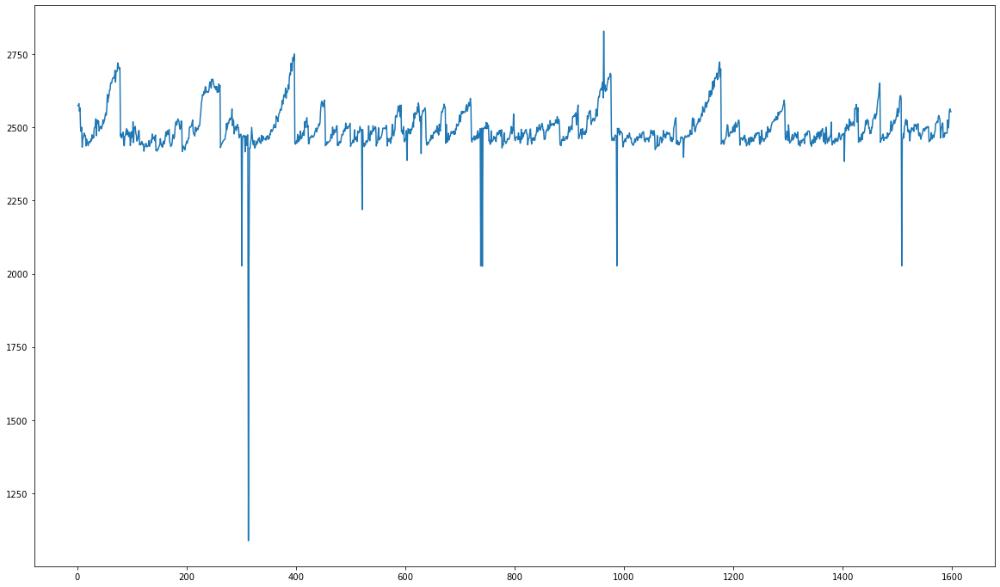

In [46]:
# train-set visualization
plt.figure(figsize = (20,12))
plt.plot(raw['mean'])

In [47]:
train_stat = raw.iloc[1200:-1, :]
train_stat

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew
real_shot,,,,,,,,,,
1201,2485.230994,596.390175,2259.0,7686,355681.240811,12.189009,5949643,2018.0,2707.0,1.639929
1202,2509.388309,628.829034,2280.0,7600,395425.954416,12.849311,6009985,2020.0,2778.5,1.706721
1203,2485.937735,588.692019,2265.0,7762,346558.293362,12.034188,5948849,2020.0,2684.0,1.657063
1204,2517.279031,641.166115,2281.0,7767,411093.986464,13.104139,6026366,2021.0,2787.0,1.729123
1205,2508.343215,620.901963,2271.0,6743,385519.248069,12.687331,6007482,2019.0,2784.5,1.504932
...,...,...,...,...,...,...,...,...,...,...
1593,2498.294240,587.302560,2298.0,7787,344924.297103,11.998266,5985913,2022.0,2800.0,1.759660
1594,2511.086288,582.614918,2325.0,6848,339440.142124,12.041508,5878453,2022.0,2737.0,1.314306
1595,2552.393939,630.357235,2344.0,7634,397350.243123,13.022687,5980259,2022.0,2840.5,1.498339


In [48]:
train_stat.index

Int64Index([1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210,
            ...
            1588, 1589, 1590, 1591, 1592, 1593, 1594, 1595, 1596, 1597],
           dtype='int64', name='real_shot', length=397)

In [49]:
df_mod1['current_spindle'].describe()

count    3.830882e+07
mean     1.359013e+03
std      1.050675e+03
min      0.000000e+00
25%      0.000000e+00
50%      2.015000e+03
75%      2.025000e+03
max      1.201300e+04
Name: current_spindle, dtype: float64

In [50]:
max(df_mod1.groupby(by = 'shot_no').mean()['current_spindle'])

2159.1371862813717

In [51]:
# test-set 대표값 도출
test_stat = build_representative_data_for_tool_machining(df_mod1, 5, 'current_spindle', apply_robust_scaler=False, except_min_value=False, except_max_value=False)

In [52]:
len(train_stat)

397

In [53]:
train_stat

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew
real_shot,,,,,,,,,,
1201,2485.230994,596.390175,2259.0,7686,355681.240811,12.189009,5949643,2018.0,2707.0,1.639929
1202,2509.388309,628.829034,2280.0,7600,395425.954416,12.849311,6009985,2020.0,2778.5,1.706721
1203,2485.937735,588.692019,2265.0,7762,346558.293362,12.034188,5948849,2020.0,2684.0,1.657063
1204,2517.279031,641.166115,2281.0,7767,411093.986464,13.104139,6026366,2021.0,2787.0,1.729123
1205,2508.343215,620.901963,2271.0,6743,385519.248069,12.687331,6007482,2019.0,2784.5,1.504932
...,...,...,...,...,...,...,...,...,...,...
1593,2498.294240,587.302560,2298.0,7787,344924.297103,11.998266,5985913,2022.0,2800.0,1.759660
1594,2511.086288,582.614918,2325.0,6848,339440.142124,12.041508,5878453,2022.0,2737.0,1.314306
1595,2552.393939,630.357235,2344.0,7634,397350.243123,13.022687,5980259,2022.0,2840.5,1.498339


In [54]:
train_stat.describe()

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew
count,397.000000,397.000000,397.000000,397.000000,397.000000,397.000000,3.970000e+02,397.000000,397.000000,397.000000
mean,2489.302337,588.652115,2284.646096,7344.899244,348049.824133,12.136026,5.862391e+06,2020.846977,2731.650504,1.738518
std,43.757497,39.273360,40.701349,413.990271,43398.732024,0.884083,1.502183e+05,1.556099,101.803985,1.421174
min,2027.111065,170.446730,2019.000000,6268.000000,29052.087910,3.482859,4.854931e+06,2018.000000,2021.000000,-0.234760
25%,2462.235270,565.599051,2258.000000,7071.000000,319902.287043,11.590769,5.821619e+06,2020.000000,2664.000000,1.512154
50%,2481.657839,583.262284,2276.000000,7497.000000,340194.891472,11.977296,5.885085e+06,2021.000000,2717.000000,1.657063
75%,2510.700669,607.985120,2305.000000,7685.000000,369645.906632,12.615383,5.938063e+06,2022.000000,2782.250000,1.836148
max,2652.057964,721.613836,2466.000000,7836.000000,520726.528862,15.261820,6.205486e+06,2034.000000,3094.000000,29.587353


In [55]:
# 학습 모델 생성
check_and_mark_outlier_by_IsolationForest_org(train_stat, test_stat, target_column_name = 'mean', training_or_test = True)

In [56]:
train_stat.describe()

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew,IF_Outliers,IF_score
count,397.000000,397.000000,397.000000,397.000000,397.000000,397.000000,3.970000e+02,397.000000,397.000000,397.000000,397.000000,397.000000
mean,2489.302337,588.652115,2284.646096,7344.899244,348049.824133,12.136026,5.862391e+06,2020.846977,2731.650504,1.738518,0.005038,0.269192
std,43.757497,39.273360,40.701349,413.990271,43398.732024,0.884083,1.502183e+05,1.556099,101.803985,1.421174,0.070888,0.065637
min,2027.111065,170.446730,2019.000000,6268.000000,29052.087910,3.482859,4.854931e+06,2018.000000,2021.000000,-0.234760,0.000000,-0.019276
25%,2462.235270,565.599051,2258.000000,7071.000000,319902.287043,11.590769,5.821619e+06,2020.000000,2664.000000,1.512154,0.000000,0.265007
50%,2481.657839,583.262284,2276.000000,7497.000000,340194.891472,11.977296,5.885085e+06,2021.000000,2717.000000,1.657063,0.000000,0.290996
75%,2510.700669,607.985120,2305.000000,7685.000000,369645.906632,12.615383,5.938063e+06,2022.000000,2782.250000,1.836148,0.000000,0.310018
max,2652.057964,721.613836,2466.000000,7836.000000,520726.528862,15.261820,6.205486e+06,2034.000000,3094.000000,29.587353,1.000000,0.328013


In [57]:
train_stat

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew,IF_Outliers,IF_score
real_shot,,,,,,,,,,,,
1201,2485.230994,596.390175,2259.0,7686,355681.240811,12.189009,5949643,2018.0,2707.0,1.639929,0,0.313492
1202,2509.388309,628.829034,2280.0,7600,395425.954416,12.849311,6009985,2020.0,2778.5,1.706721,0,0.291795
1203,2485.937735,588.692019,2265.0,7762,346558.293362,12.034188,5948849,2020.0,2684.0,1.657063,0,0.311213
1204,2517.279031,641.166115,2281.0,7767,411093.986464,13.104139,6026366,2021.0,2787.0,1.729123,0,0.272057
1205,2508.343215,620.901963,2271.0,6743,385519.248069,12.687331,6007482,2019.0,2784.5,1.504932,0,0.288763
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,2498.294240,587.302560,2298.0,7787,344924.297103,11.998266,5985913,2022.0,2800.0,1.759660,0,0.287564
1594,2511.086288,582.614918,2325.0,6848,339440.142124,12.041508,5878453,2022.0,2737.0,1.314306,0,0.288649
1595,2552.393939,630.357235,2344.0,7634,397350.243123,13.022687,5980259,2022.0,2840.5,1.498339,0,0.178826


In [58]:
train_stat.query('IF_Outliers == 0')['IF_score'].mean()

0.2706400482824031

In [59]:
outlier = train_stat.query('IF_Outliers == 1')
outlier

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew,IF_Outliers,IF_score
real_shot,,,,,,,,,,,,
1467,2641.065783,700.614133,2466.0,7733,490860.162947,14.974627,5781293,2020.0,3045.0,1.243532,1,-0.014408
1468,2652.057964,714.377067,2451.0,7704,510334.593442,15.261820,5810659,2022.0,3094.0,1.183015,1,-0.019276


In [60]:
outlier['IF_score'].describe()

count    2.000000
mean    -0.016842
std      0.003442
min     -0.019276
25%     -0.018059
50%     -0.016842
75%     -0.015625
max     -0.014408
Name: IF_score, dtype: float64

In [61]:
train_stat.query('IF_Outliers == 0')['IF_score'].describe()

count    395.000000
mean       0.270640
std        0.062551
min        0.010264
25%        0.266080
50%        0.291030
75%        0.310064
max        0.328013
Name: IF_score, dtype: float64

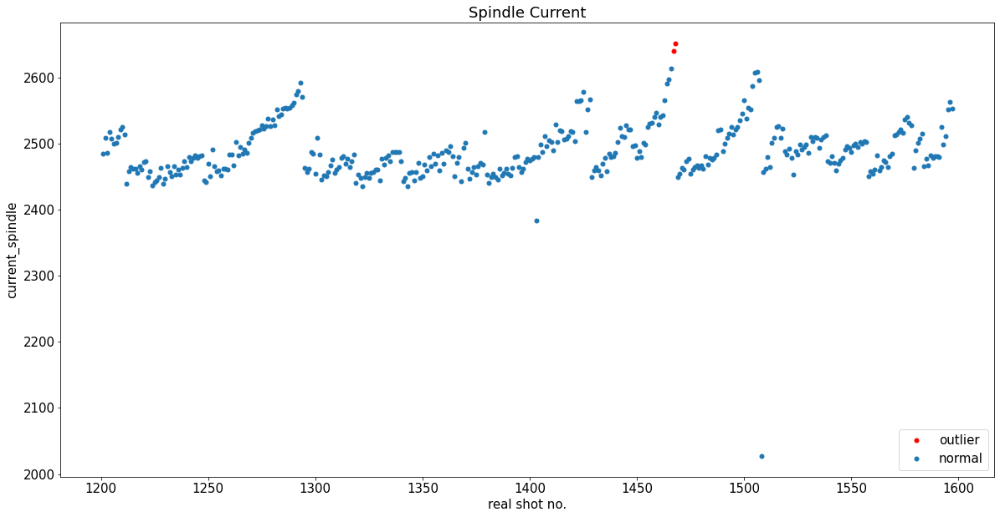

In [62]:
# 학습 모델에 대한 학습 결과 시각화
show_plot_comparing_data_by_condition(train_stat, 'mean', 'IF_Outliers', [1], data_names = ('outlier', 'normal'),
                                      title = 'Spindle Current', x_axis_title='real shot no.', y_axis_title='current_spindle')

In [63]:
check_and_mark_outlier_by_IsolationForest_org(train_stat, test_stat, target_column_name = 'mean', training_or_test = False)
test_outlier = test_stat.query('IF_Outliers == 1')
test_outlier

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew,IF_Outliers,IF_score
real_shot,,,,,,,,,,,,
59,2626.975733,708.556814,2430.0,7736,502052.758458,15.161716,5737315,2017.00,3089.00,1.273607,1,-0.758191
60,2627.370489,696.186338,2467.0,6782,484675.417063,14.879989,5751314,2018.00,3047.00,1.060591,1,-0.758604
61,2652.389219,727.101540,2469.0,7836,528676.650085,15.540758,5806080,2017.00,3130.00,1.148620,1,-0.776217
62,2651.061700,715.426153,2472.0,7767,511834.580096,15.294707,5800523,2019.00,3074.00,1.107960,1,-0.775821
63,2651.945637,724.409171,2482.0,7627,524768.647409,15.483212,5805109,2017.00,3076.00,1.215644,1,-0.776217
64,2664.009593,723.211861,2456.0,7286,523035.395246,15.457621,5831517,2020.00,3127.00,0.989264,1,-0.776217
65,2668.582984,725.363408,2510.0,7738,526152.072985,14.849794,6367239,2017.00,3199.00,1.104529,1,-0.776217
66,2667.026970,718.959812,2552.0,7723,516903.211751,14.758960,6328855,2020.00,3148.00,1.028972,1,-0.776217
67,2672.772025,730.111799,2536.0,6601,533063.238733,14.918893,6401289,2017.00,3147.00,1.023554,1,-0.776217


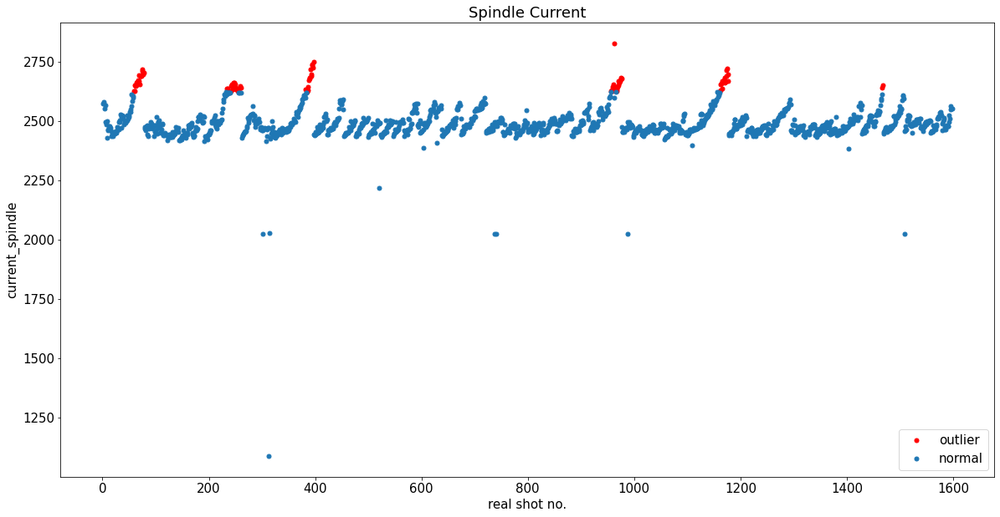

In [64]:
show_plot_comparing_data_by_condition(test_stat, 'mean', 'IF_Outliers', [1], data_names = ('outlier', 'normal'),
                                      title = 'Spindle Current', x_axis_title='real shot no.', y_axis_title='current_spindle')

In [65]:
test_stat

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew,IF_Outliers,IF_score
real_shot,,,,,,,,,,,,
1,2574.781635,673.798689,2345.0,6779,454004.673502,14.401485,5636197,2021.0,2972.00,1.254911,0,-0.648490
2,2573.767686,680.439201,2343.0,7679,462997.506280,14.536777,5639125,2018.0,3034.00,1.344805,0,-0.644182
3,2581.697302,675.870876,2353.0,7734,456801.440812,14.452379,5646172,2020.0,2969.00,1.361857,0,-0.671507
4,2555.292988,657.083295,2316.0,6745,431758.456920,13.423848,6122482,2019.0,2949.00,1.209585,0,-0.589504
5,2566.995823,674.090589,2326.0,7762,454398.122005,13.777049,6145388,2019.0,2995.25,1.474197,0,-0.619146
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,2511.086288,582.614918,2325.0,6848,339440.142124,12.041508,5878453,2022.0,2737.00,1.314306,0,-0.468292
1595,2552.393939,630.357235,2344.0,7634,397350.243123,13.022687,5980259,2022.0,2840.50,1.498339,0,-0.578115
1596,2563.605892,641.866922,2348.0,7761,411993.145339,13.263299,6003965,2023.0,2883.00,1.501700,0,-0.608954


In [66]:
IF = IsolationForest(random_state = 42, contamination = 0.005 , n_estimators = 500, max_samples = 90, n_jobs = -1, bootstrap = True).fit(train_stat[['mean']])

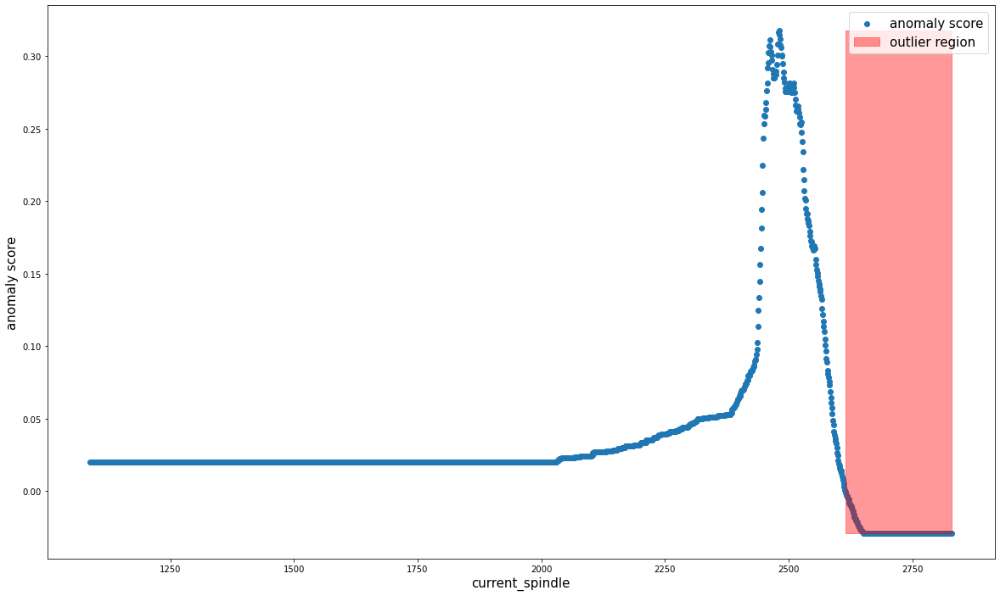

-0.029046098328305847
0.3177103284103198


In [67]:
# xx 변수에 test_stat의 current_spindle 평균값의 최소부터 최대 범위와 test_stat 데이터 길이의 선형 데이터 생성
# anomaly scores : The anomaly score of the input samples.
# The lower, the more abnormal. Negative scores represent outliers,
# positive scores represent inliers.

xx = np.linspace(test_stat['mean'].min(),test_stat['mean'].max(), len(test_stat)).reshape(-1,1)
xx_anomaly_score = IF.decision_function(xx)
xx_outlier = IF.predict(xx)
plt.figure(figsize = (20,12))
plt.scatter(xx, xx_anomaly_score, label = 'anomaly score')
plt.fill_between(xx.T[0], np.min(xx_anomaly_score), np.max(xx_anomaly_score), where=xx_outlier==-1, color='r', 
                     alpha=.4, label='outlier region')
plt.legend()
plt.ylabel('anomaly score')
plt.xlabel('current_spindle')
plt.show();
print(np.min(xx_anomaly_score))
print(np.max(xx_anomaly_score))

In [68]:
test_stat['mean'].values.reshape(-1,1)

array([[2574.78163545],
       [2573.76768599],
       [2581.69730224],
       ...,
       [2563.6058924 ],
       [2553.85890878],
       [2553.85482494]])

In [69]:
check_and_mark_outlier_by_IsolationForest_org(train_stat, test_stat, 'mean', training_or_test = False)

In [70]:
check_and_mark_outlier_by_IsolationForest_org(train_stat, test_stat, 'mean', training_or_test = True)

In [71]:
threshould_deduction(test_stat, 'mean', graph = False)

2625.812030075188

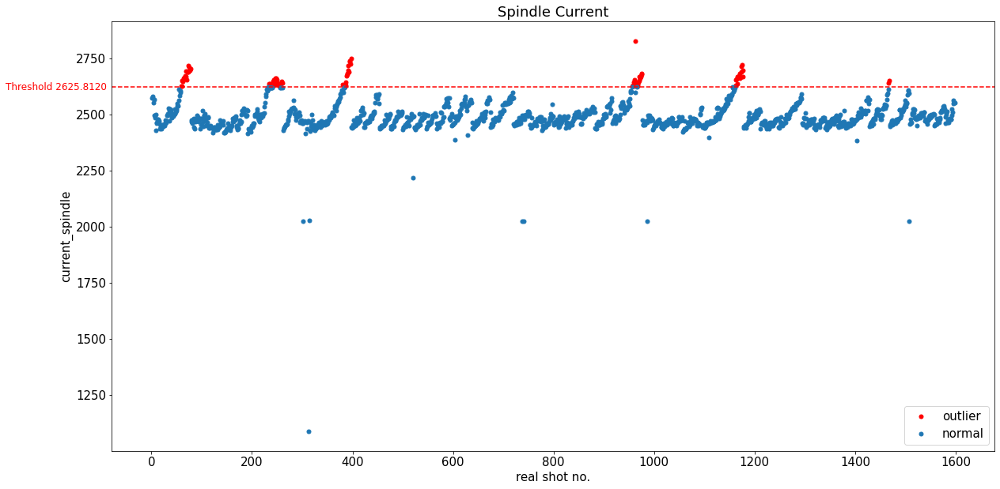

In [72]:
show_plot_with_threshould(test_stat, 'mean', 'IF_Outliers', [1], data_names = ('outlier', 'normal'),
                                      title = 'Spindle Current', x_axis_title='real shot no.', y_axis_title='current_spindle')

In [73]:
# current_spindle = test_stat['mean'].values.reshape(-1,1)
# current_spindle_anomaly_score = IF.decision_function(current_spindle)
# current_spindle_outlier = IF.predict(current_spindle)
# plt.figure(figsize = (20,12))
# plt.scatter(current_spindle, current_spindle_anomaly_score, label = 'anomaly score')
# plt.fill_between(current_spindle.T[0], np.min(current_spindle_anomaly_score), np.max(current_spindle_anomaly_score), where=current_spindle_outlier==-1, color='r', 
#                      alpha=.3, label='outlier region')
# plt.legend()
# plt.ylabel('anomaly score')
# plt.xlabel('current_spindle')
# print(np.min(current_spindle_anomaly_score))
# print(np.max(current_spindle_anomaly_score))

In [74]:
# print(np.min(current_spindle_anomaly_score))
# print(np.max(current_spindle_anomaly_score))

In [75]:
# # 
# a = np.concatenate((current_spindle.reshape(-1,1), current_spindle_outlier.reshape(-1,1)), axis = 1)
# min(pd.DataFrame(a, columns = ['current_spindle', 'outlier']).query('outlier == -1')['current_spindle'])

In [76]:
# show_plot_comparing_data_by_condition(test_stat, 'mean', 'IF_Outliers', [1], data_names = ('outlier', 'normal'),
#                                       title = 'Spindle Current', x_axis_title='real shot no.', y_axis_title='current_spindle')
# plt.axhline(min(pd.DataFrame(a, columns = ['current_spindle', 'outlier']).query('outlier == -1')['current_spindle']), color = 'r', linestyle = 'dashed')
# plt.text(-290, min(pd.DataFrame(a, columns = ['current_spindle', 'outlier']).query('outlier == -1')['current_spindle'])-15, 'Threshold {:.4f}'.format(min(pd.DataFrame(a, columns = ['current_spindle', 'outlier']).query('outlier == -1')['current_spindle'])), color = 'r', fontsize = 12)

In [77]:
test_stat[(test_stat['mean']<2615) & (test_stat['mean']>2610)].query('IF_Outliers == 1')

,mean,std,median,max,var,sem,sum,quantile(0.25),quantile(0.75),skew,IF_Outliers,IF_score
real_shot,,,,,,,,,,,,
